# dMdisk = 5e-9 * 5.972e27/3.154e7/150

In [1]:
load_dep = True

In [2]:
import numpy as np
import os 
from dedalus import public as de
from dedalus.extras.plot_tools import quad_mesh, pad_limits
import matplotlib.pyplot as plt
from scipy.special import erf 
import logging
logger = logging.getLogger(__name__)

%matplotlib inline

import time

# from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:100% !important; }</style>"))

from dedalus.extras import plot_tools 

In [3]:
a_1 = 1
AU = 1.496e13
Mp = 1 # Earth masses
T_disk = 300 *a_1**(-1/2)

rho_disk = 2.4e-9*a_1**(-11/4)
r_Hill = 2e11*a_1*(Mp)**(1/3)
r_Bondi = 4e10*a_1**(1/2)*Mp

print('disk temperature: ' + str(T_disk))
print('disk density: ' + str(rho_disk))
print('hill radius: {:.4e}'.format(r_Hill))
print('bondi radius: {:.4e}'.format(r_Bondi))

disk temperature: 300.0
disk density: 2.4e-09
hill radius: 2.0000e+11
bondi radius: 4.0000e+10


In [4]:
# Basis and domain

resolution = 256 #500
# normalization factors
r_0 = 1.2e8
T_0 = 1000
P_0 = 1 #1e5 #1
M_0 = 1e-12
m_0 = 1e25
L_0 = 3.144546892817586e+27
Dep_0 = 5.972e27/3.154e7 

# r_outer = 1.496e13/r_0
r_outer = r_Hill /r_0 # 3.4199512e11/r_0
r_inner = 1.2e9/r_0

log_inner = np.log(r_inner) 
log_outer = np.log(r_outer)

log_basis = de.Chebyshev('r', resolution, interval=(log_inner,log_outer))  
domain = de.Domain([log_basis], np.float64)

In [5]:
# Problem

ncc_cutoff = 1e-6 #1e-2
tolerance = 1e-6 #1e-2
# P and T are actually log(P) and log(T)
problem = de.NLBVP(domain,variables = ['lgP', 'lgT', 'lgM', 'lgZgr','m', 'L'], ncc_cutoff = ncc_cutoff)
R = np.log10(np.exp(domain.grid(0))*r_0)

In [6]:
# Parameters

problem.parameters['T_0'] = T_0 
problem.parameters['r_0'] = r_0
problem.parameters['P_0'] = P_0 # unused
problem.parameters['M_0'] = M_0
problem.parameters['m_0'] = m_0
problem.parameters['Dep_0'] = Dep_0
problem.parameters['L_0'] = L_0

lgP = domain.new_field(name='lgP')
lgT = domain.new_field(name='lgT')
lgZgr = domain.new_field(name='lgZgr')
lgM = domain.new_field(name='lgM')
m = domain.new_field(name='m')
L = domain.new_field(name='L')

r = domain.new_field(name='R')
r['g'] = domain.grid(0)
S = np.exp(r['g']) * r_0
ones = np.ones(len(r['g']))

pi = np.pi 
Core_mass = Mp*5.972e27
Mc = Core_mass # 5* mass of earth (in g)
mu = 2.34 * 1.6735575e-24 #mH multiplied by hydrogen atom mass 
kb = 1.38064852e-16 # g*cm**2/(K*s**2)
G = 6.67408e-8 # cm**3/(g*s**2)
dMtot = 0.2*1e-5* 5.972e27/3.154e7 # 10e-5* mass of earth, g/s #3.154e7 is conversion from yr to s
sig = 5.670367e-5 # (cgs units) e-5 in g/(K^4s^3), Stefan Boltzmann Const (normally it's e-8 in [W⋅m−2⋅K−4])
s0 = 1e-4 # cm
rho_o = 3 #g cm^-3 grain internal density
sigma_b = 5.6704e-5 # erg*cm^-2*s^-1*K^-4 Stefan Boltzmann 
rcore = 1.2e9
grad_rad_cst = - 3*dMtot/(64*np.pi*rcore*sig)
gm = G*Mc 

rhodisk = rho_disk # 7.5e-9 #g/cm**3
Tdisk = T_disk # 370 # kelvin

mdep = rho_o * 4/3 * pi *(1e4)**3
dMdisk = 5e-9 * 5.972e27/3.154e7/150


problem.parameters['pi'] = np.pi
problem.parameters['Mc'] = Core_mass 
problem.parameters['mu'] = 2.34 * 1.6735575e-24 #mH multiplied by hydrogen atom mass 
problem.parameters['kb'] = 1.38064852e-16 # g*cm**2/(K*s**2)
problem.parameters['G'] = 6.67408e-8 # cm**3/(g*s**2)
problem.parameters['dMtot'] = 0.2*1e-5*5.972e27/3.154e7 # 10e-5* mass of earth, g/s #3.154e7 is conversion from yr to s
problem.parameters['sig'] = 5.670367e-5 # (cgs units) e-5 in g/(K^4s^3), Stefan Boltzmann Const (normally it's e-8 in [W⋅m−2⋅K−4])
problem.parameters['s0'] = 1e-4 # cm
problem.parameters['rho_o'] = 3 #g cm^-3 grain internal density
problem.parameters['mdep'] = problem.parameters['rho_o']*4/3*np.pi*(1e-4)**(3)
problem.parameters['sigma_b'] = 5.6704e-5 # erg*cm^-2*s^-1*K^-4 Stefan Boltzmann 
rcore = 1.2e9
problem.parameters['grad_rad_cst'] = - 3*problem.parameters['dMtot']/(64*np.pi*rcore*problem.parameters['sig'])


# problem.parameters['rhodisk'] = 4e-9 # 1e-11 #g/cm**3
# problem.parameters['Tdisk'] = 370 # 150 # kelvin

problem.parameters['rhodisk'] = rhodisk #g/cm**3
problem.parameters['Tdisk'] = Tdisk # kelvin

problem.substitutions['s'] = '(exp(lgM)*M_0*3/(4*pi*rho_o))**(1/3)' # radius
s = (np.exp(lgM)*M_0*3/(4*pi*rho_o))**(1/3)


# Deposition Type (3 versions) 

-24.124463218608565


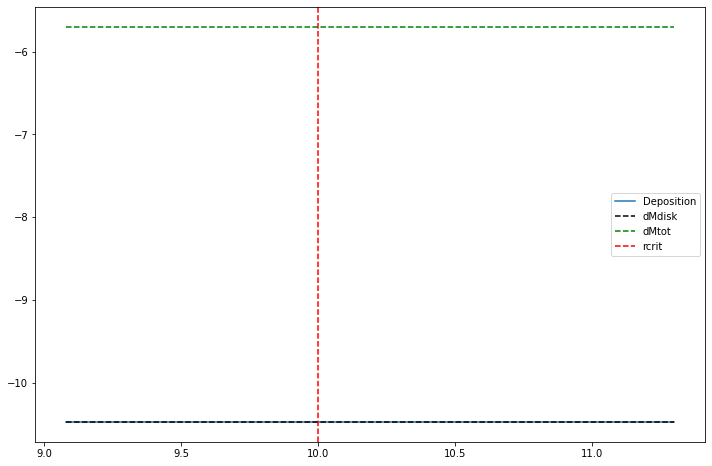

In [7]:
# # Mass deposition 
deposition_version = 'null'

if deposition_version == 0:
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.loadtxt('M1dep.txt')

    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()
    Mdep_fixed = lgdM['g']
    dlgdM_fixed = dlgdM['g']
    n_roll = Mdep_fixed.shape[0]//4
    Mdep_fixed_rolled =np.roll(Mdep_fixed, n_roll)
    dlgdM_fixed_rolled = np.roll(dlgdM_fixed, n_roll)

    # Correct leftmost values too low from wrapping around
    Mdep_fixed_rolled[:n_roll] = Mdep_fixed[0]
    dlgdM_fixed_rolled[:n_roll] = 0. # Zero gradient for constant value correction

    ones = lgdM['g']/lgdM['g']

    constant = np.log(ones*1e-5)
    dconstant = 0.*ones

    lgdM['g'] = Mdep_fixed_rolled
    dlgdM['g'] = dlgdM_fixed_rolled

    

elif deposition_version == 1:
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.log(np.loadtxt('Deposition.txt')/Dep_0)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()

# elif deposition_version=='None':
#     lgdM = domain.new_field(name='lgdM')
#     lgdM['g'] = np.log(np.loadtxt('Deposition.txt')/Dep_0)
#     d_r = log_basis.Differentiate(lgdM)
#     dlgdM = d_r.evaluate()

elif deposition_version=='null':
    location = 10 # in log10 
    smooth = 3
    X = r['g'] - np.log(10**location/r_0) 
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = X*0
    lgdM['g'] = lgdM['g']+np.log(dMdisk/Dep_0)
    print(np.log(dMdisk/Dep_0))
    # DEP = dMdisk + (dMtot-dMdisk)*((erf(smooth*eX['g']) + 1)/2)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()

else:
    location = 10 # in log10 
    smooth = 3
    X = r['g'] - np.log(10**location/r_0) 
    lgdM = domain.new_field(name='lgdM')
    lgdM['g'] = np.log((dMdisk + (dMtot-dMdisk)*((-erf(smooth*X) + 1)/2))/Dep_0)    
    # DEP = dMdisk + (dMtot-dMdisk)*((erf(smooth*eX['g']) + 1)/2)
    d_r = log_basis.Differentiate(lgdM)
    dlgdM = d_r.evaluate()
    
problem.parameters['lgDep'] = lgdM
problem.parameters['dlgDep'] = dlgdM

lgDep = domain.new_field(name='lgDep')
dlgDep = domain.new_field(name='dlgDep')
lgDep['g'] = lgdM['g']
dlgDep['g'] = dlgdM['g']

plt.figure(figsize=(12,8))
plt.plot(R, np.log10(np.exp(lgdM['g'])), label='Deposition')
plt.plot(R, np.log10(ones*dMdisk/Dep_0), 'k--', label='dMdisk')
plt.plot(R, np.log10(ones*dMtot/Dep_0), 'g--', label='dMtot')
if deposition_version != 1 and deposition_version !=0:
    plt.axvline(location, color = 'r', ls='--', label='rcrit')
plt.legend()
# plt.plot(R, np.log10(np.exp(dlgdM['g'])))

In [8]:
# Opacity

problem.substitutions['x'] = '2*pi*s*0.3/0.2898'
x = 2*pi*s*0.3/0.2898

# min(2,ex*T*T_0) 
k0 = -10. # -30.
problem.parameters['k0'] = k0

problem.substitutions['Qe'] = "(0.5*(2**k0 + (x*exp(lgT)*T_0)**k0))**(1/k0)"
Qe = (0.5*(2**k0 + (x*np.exp(lgT)*T_0)**k0))**(1/k0)

problem.substitutions['Qk_geo'] = "Qe*3/4*exp(lgZgr)/(s*rho_o)" 
Qk_geo = Qe*3/4*np.exp(lgZgr)/(s*rho_o)

k_gas_cst = 1e-8*(problem.parameters["mu"]/problem.parameters['kb'])**(2/3) # O(10^-14)
problem.parameters['k_gas_cst'] = k_gas_cst

problem.substitutions['k_gas'] = "k_gas_cst*(exp(lgT)*T_0)**(7/3)*(exp(lgP)*P_0)**(2/3)" 
k_gas = k_gas_cst*(np.exp(lgT)*T_0)**(7/3)*(np.exp(lgP)*P_0)**(2/3)

problem.substitutions['kappa'] = "k_gas + Qk_geo"
kappa = k_gas + Qk_geo 

In [9]:
# Gradient  


# problem.substitutions['grad_rad'] = "grad_rad_cst*kappa*exp(lgP)*P_0/(exp(lgT)*T_0)**4"

grad_ad = 0.28
problem.parameters['grad_ad'] = grad_ad


# problem.substitutions['grad_rad'] = '-3*kappa*exp(L)*L_0/(64*pi*sigma_b*gm) * exp(lgP)*P_0/(exp(lgT)*T_0)**4'
problem.substitutions['grad_rad'] = '3*kappa*L*L_0/(64*pi*sigma_b*gm) * exp(lgP)*P_0/(exp(lgT)*T_0)**4'
grad_rad = 3*kappa*L*L_0/(64*pi*sigma_b*gm) * np.exp(lgP)*P_0/(np.exp(lgT)*T_0)**4


# min
k1 = -10. # -30.
problem.parameters['k1'] = k1
problem.substitutions['grad'] = "(0.5*(grad_rad**k1 + (grad_ad)**k1))**(1/k1)" 
grad = (0.5*(grad_rad**k1 + (grad_ad)**k1))**(1/k1)

In [10]:
# Tstop: v_set = gm/r^2 * Tstop 

gm = problem.parameters['Mc']*problem.parameters['G']
problem.parameters['gm'] = gm

problem.substitutions['rho_g'] = '(exp(lgP)*P_0*mu)/(kb*exp(lgT)*T_0)'
rho_g = (np.exp(lgP)*P_0*mu)/(kb*np.exp(lgT)*T_0)

problem.substitutions['cg'] = 'sqrt(kb*exp(lgT)*T_0/mu)'
cg = np.sqrt(kb*np.exp(lgT)*T_0/mu)

problem.substitutions['Lg'] = '1e-9/rho_g'
Lg = 1e-9/rho_g

l = 30 #1 #15
problem.parameters['l'] = l

problem.substitutions['max'] = "(0.5*(1 + (9/4*s/Lg)**l))**(1/l)"
Max = (0.5*(1 + (s/Lg)**l))**(1/l)


problem.substitutions['Tstop'] = '(max*4*rho_o*s)/(9*cg*rho_g)'
Tstop = (Max*4*rho_o*s)/(9*cg*rho_g)

problem.substitutions['v_set'] = 'gm*Tstop/(exp(r)*r_0)**2'
v_set = gm*Tstop/(np.exp(r)*r_0)**2

In [11]:
# Tgrow 

problem.substitutions['v_bm'] = 'sqrt(16*kb*exp(lgT)*T_0/(pi*exp(lgM)*M_0))'
v_bm = np.sqrt(16*kb*np.exp(lgT)*T_0/(np.pi*np.exp(lgM)*M_0))

problem.substitutions['v_dd'] = '0.1*v_set'
v_dd = 0.1*v_set

problem.substitutions['Tgrow_inv'] = '3*exp(lgZgr)*rho_g*(v_bm+v_dd)/(rho_o*s)'
Tgrow_inv = 3*np.exp(lgZgr)*rho_g*(v_bm+v_dd)/(rho_o*s)

In [12]:
# Energy equation

# problem.substitutions['drho_dep'] = '-1/(4*pi*(exp(r)*r_0)**2) * dlgDep * 1e5'
problem.substitutions['drho_dep'] = '-1/(4*pi*(exp(r)*r_0)**3) * dlgDep * Dep_0 * exp(lgDep)'
drho_dep = -1/(4*pi*(np.exp(r)*r_0)**3) * dlgDep * Dep_0 * np.exp(lgDep)

Trelax = 1e30
problem.parameters['Trelax'] = Trelax

Lcore = problem.parameters['gm']*problem.parameters['dMtot']/(r_inner*r_0)
problem.parameters['Lcore'] = Lcore
print(problem.parameters['Lcore'])

1.2578187571270345e+26


In [13]:
# New equations

problem.add_equation('lgZgr = log(exp(lgDep)*Dep_0/(4*pi*gm*Tstop*rho_g))')
# problem.add_equation('lgZgr = log(dMdep/(4*pi*gm*Tstop*rho_g))')
problem.add_equation('dr(lgM) = -Tgrow_inv*(exp(r)*r_0)**3/(gm*Tstop) + dlgDep*(mdep-exp(lgM)*M_0)/(exp(lgM)*M_0)')

In [14]:
# Normalized equations

# problem.parameters['eq1cst'] = -1*problem.parameters['G']*problem.parameters['Mc']*problem.parameters['mu']/(T_0*r_0*problem.parameters['kb'])
problem.add_equation('dr(m) = 4*pi*(exp(r)*r_0)**3 * rho_g/m_0')
problem.add_equation('exp(r) * dr(lgP) = -G*(Mc+m*m_0)*mu/(T_0*r_0*kb*exp(lgT))')
problem.add_equation('dr(lgT) = dr(lgP)*grad')

# problem.add_equation('dr(L) = 4*pi*(exp(r)*r_0)* (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0))')
# problem.add_equation('dr(L)*L_0 = 4*pi*(exp(r)*r_0)**3 * (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0) + rho_g*cg*(exp(lgT)*T_0 - Tdisk)/Trelax )')
problem.add_equation('dr(L)*L_0 = (4*pi*(exp(r)*r_0)**3 * (G*(Mc+m*m_0)*drho_dep/(exp(r)*r_0) + rho_g*cg*(exp(lgT)*T_0 - Tdisk)/Trelax ))')


In [15]:
# Boundary Equations


problem.add_bc("right(lgT) = log(Tdisk/T_0)") # disk temp in kelvins
problem.add_bc("right(lgP) = log(rhodisk*kb*Tdisk/mu/P_0)") # gas law
problem.add_bc("right(lgZgr) = log(1e-3)")
problem.add_bc("left(m) = 0")
problem.add_bc("left(L) = Lcore/L_0")

In [16]:
# solver = problem.build_solver(de.timesteppers.RK443)
solver = problem.build_solver()

2020-11-18 05:17:13,014 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 4.3e+01/s


Text(0.5, 1.0, 'm')

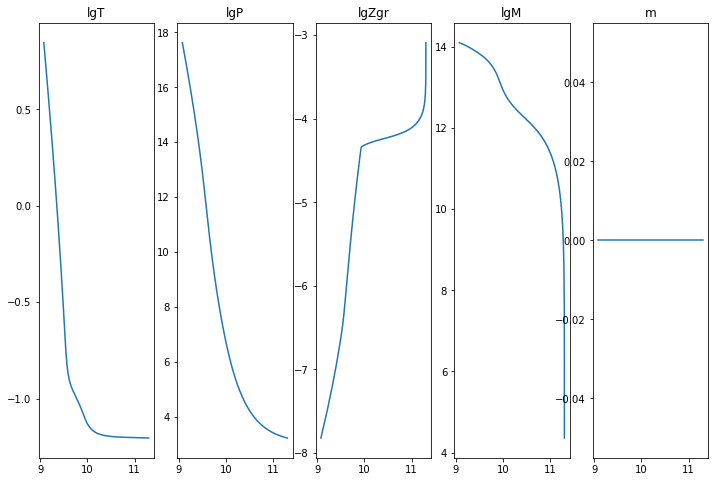

In [17]:
# initial conditions and referencing local grid state fields

lgr = domain.grid(0)
Rscale = np.log10(np.exp(domain.grid(0))*r_0)
lgT1 = solver.state['lgT']
lgP1 = solver.state['lgP']
lgZgr1 = solver.state['lgZgr']
lgM1 = solver.state['lgM']

L1 = solver.state['L']
m1= solver.state['m']

# Load from constant Mass and Zgr version

lgP_initial = np.loadtxt("Pressure.txt")
lgT_initial = np.loadtxt("Temperature.txt")
Zi = np.loadtxt('Zgr.txt')
Mi = np.loadtxt('M.txt')

lgP1['g'] = lgP_initial
lgT1['g'] = lgT_initial
ones = lgT1['g']/lgT1['g']

L1['g'] = ones*problem.parameters['Lcore']/L_0

lgZgr1['g'] = Zi 

lgM1['g'] = Mi
m1['g'] = ones*0


if load_dep: 
    lgP1['g'] = np.loadtxt("NPressure_dep.txt")
    lgT1['g'] = np.loadtxt("NTemperature_dep.txt")
    L1['g'] = np.loadtxt('NL_dep.txt')
    lgZgr1['g'] = np.loadtxt('NZgr_dep.txt') 
    lgM1['g'] = np.loadtxt('NM_dep.txt')
    m1['g'] = np.loadtxt('Nm_dep.txt')
    
    
plt.figure(figsize=(12,8))
plt.subplot(1,5,1)
plt.plot(Rscale,lgT1['g'])
plt.title("lgT")
plt.subplot(1,5,2)
plt.plot(Rscale, lgP1['g'])
plt.title("lgP")
plt.subplot(1,5,3)
plt.plot(Rscale, np.log10(np.exp(lgZgr1['g'])))
plt.title("lgZgr")
plt.subplot(1,5,4)
plt.plot(Rscale, lgM1['g'])
plt.title("lgM")
plt.subplot(1,5,5)
plt.plot(Rscale, m1['g'])
plt.title("m")

In [18]:

lgT_list = [np.copy(lgT1['g'])]
lgP_list = [np.copy(lgP1['g'])]
lgZgr_list = [np.copy(lgZgr1['g'])]
lgM_list = [np.copy(lgM1['g'])]
m_list = [np.copy(m1['g'])]
L_list = [np.copy(L1['g'])]

2020-11-18 05:17:17,787 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:17:18,980 __main__ 0/1 INFO :: Perturbation norm: 12.815937853536136
2020-11-18 05:17:18,981 __main__ 0/1 INFO :: lgT iterate: 0.8439002515824505
2020-11-18 05:17:18,982 __main__ 0/1 INFO :: lgP iterate: 17.556685118821882
2020-11-18 05:17:18,982 __main__ 0/1 INFO :: lgM iterate: 13.638459928309937
2020-11-18 05:17:18,983 __main__ 0/1 INFO :: lgZgr iterate: -18.04485702502079
2020-11-18 05:17:18,984 __main__ 0/1 INFO :: m iterate: 5.305621186479925e-05
2020-11-18 05:17:18,985 __main__ 0/1 INFO :: L iterate: 0.0399999999999999


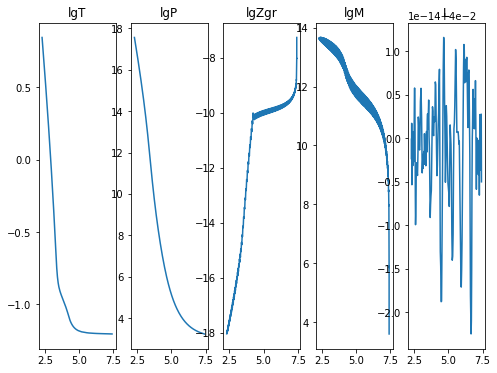

2020-11-18 05:17:22,748 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:17:23,488 __main__ 0/1 INFO :: Perturbation norm: 1.5171411882882757
2020-11-18 05:17:23,492 __main__ 0/1 INFO :: lgT iterate: 0.8460443215650619
2020-11-18 05:17:23,494 __main__ 0/1 INFO :: lgP iterate: 17.61155380256153
2020-11-18 05:17:23,495 __main__ 0/1 INFO :: lgM iterate: 13.63917411270324
2020-11-18 05:17:23,496 __main__ 0/1 INFO :: lgZgr iterate: -18.096967994410118
2020-11-18 05:17:23,498 __main__ 0/1 INFO :: m iterate: 5.624453381969374e-05
2020-11-18 05:17:23,500 __main__ 0/1 INFO :: L iterate: 0.04000000000000006


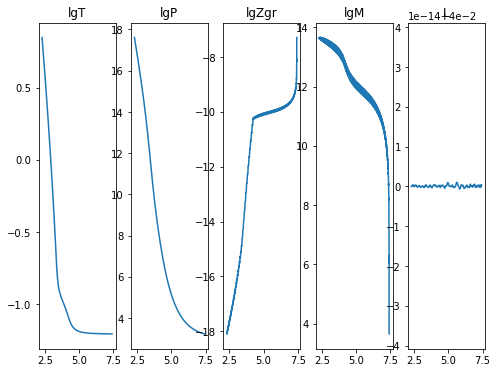

2020-11-18 05:17:27,363 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:17:28,128 __main__ 0/1 INFO :: Perturbation norm: 0.7374813735961523
2020-11-18 05:17:28,130 __main__ 0/1 INFO :: lgT iterate: 0.8461774384226842
2020-11-18 05:17:28,130 __main__ 0/1 INFO :: lgP iterate: 17.617534167201853
2020-11-18 05:17:28,131 __main__ 0/1 INFO :: lgM iterate: 13.647372837431307
2020-11-18 05:17:28,132 __main__ 0/1 INFO :: lgZgr iterate: -18.10823047384847
2020-11-18 05:17:28,132 __main__ 0/1 INFO :: m iterate: 5.728708013297279e-05
2020-11-18 05:17:28,133 __main__ 0/1 INFO :: L iterate: 0.04


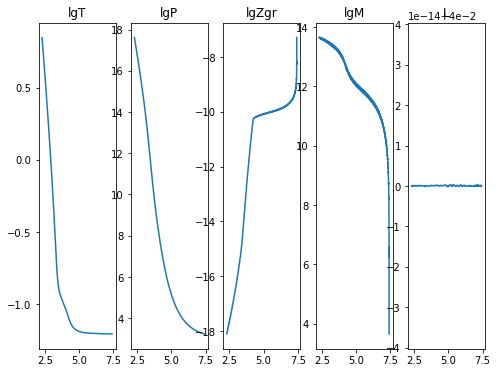

2020-11-18 05:17:32,633 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:17:33,799 __main__ 0/1 INFO :: Perturbation norm: 0.6252175030548675
2020-11-18 05:17:33,804 __main__ 0/1 INFO :: lgT iterate: 0.8458182870792937
2020-11-18 05:17:33,805 __main__ 0/1 INFO :: lgP iterate: 17.60504804129721
2020-11-18 05:17:33,806 __main__ 0/1 INFO :: lgM iterate: 13.643872897996031
2020-11-18 05:17:33,807 __main__ 0/1 INFO :: lgZgr iterate: -18.093961833180625
2020-11-18 05:17:33,808 __main__ 0/1 INFO :: m iterate: 5.6564185928920097e-05
2020-11-18 05:17:33,809 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


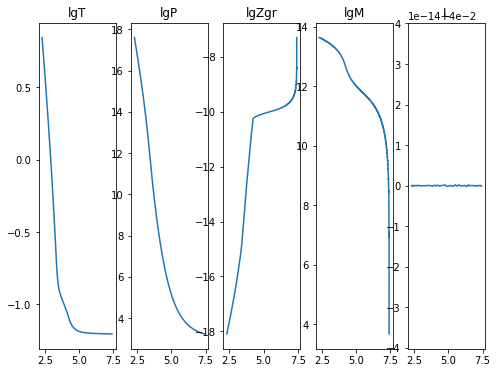

2020-11-18 05:17:38,864 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:17:41,122 __main__ 0/1 INFO :: Perturbation norm: 0.929779768141182
2020-11-18 05:17:41,126 __main__ 0/1 INFO :: lgT iterate: 0.8451647864220103
2020-11-18 05:17:41,129 __main__ 0/1 INFO :: lgP iterate: 17.587168705053877
2020-11-18 05:17:41,131 __main__ 0/1 INFO :: lgM iterate: 13.641259669436566
2020-11-18 05:17:41,134 __main__ 0/1 INFO :: lgZgr iterate: -18.075311303527048
2020-11-18 05:17:41,137 __main__ 0/1 INFO :: m iterate: 5.541945678011473e-05
2020-11-18 05:17:41,140 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


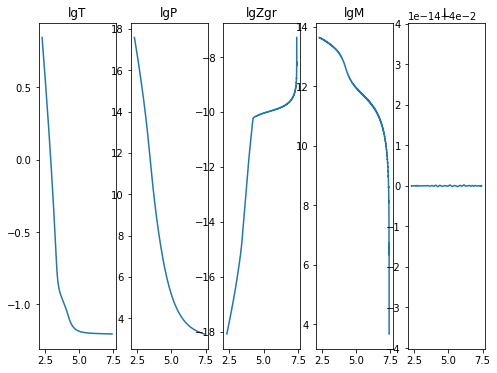

2020-11-18 05:17:46,888 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:17:48,133 __main__ 0/1 INFO :: Perturbation norm: 0.9508083904509608
2020-11-18 05:17:48,135 __main__ 0/1 INFO :: lgT iterate: 0.8455250358323763
2020-11-18 05:17:48,136 __main__ 0/1 INFO :: lgP iterate: 17.596372247991315
2020-11-18 05:17:48,137 __main__ 0/1 INFO :: lgM iterate: 13.642156119880177
2020-11-18 05:17:48,138 __main__ 0/1 INFO :: lgZgr iterate: -18.084574637898232
2020-11-18 05:17:48,139 __main__ 0/1 INFO :: m iterate: 5.5883116591104454e-05
2020-11-18 05:17:48,140 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


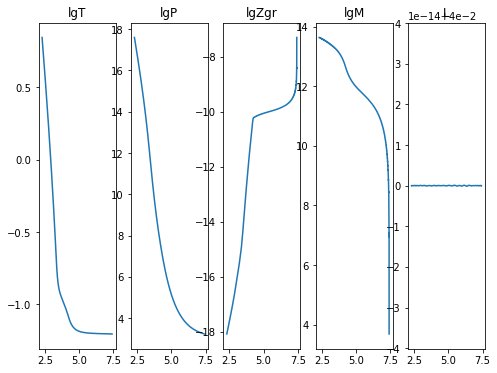

2020-11-18 05:17:52,882 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:17:54,131 __main__ 0/1 INFO :: Perturbation norm: 1.1770491966866568
2020-11-18 05:17:54,132 __main__ 0/1 INFO :: lgT iterate: 0.8450134919124708
2020-11-18 05:17:54,133 __main__ 0/1 INFO :: lgP iterate: 17.58359400109005
2020-11-18 05:17:54,134 __main__ 0/1 INFO :: lgM iterate: 13.641350787250394
2020-11-18 05:17:54,135 __main__ 0/1 INFO :: lgZgr iterate: -18.07202226233879
2020-11-18 05:17:54,136 __main__ 0/1 INFO :: m iterate: 5.515475399420211e-05
2020-11-18 05:17:54,137 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


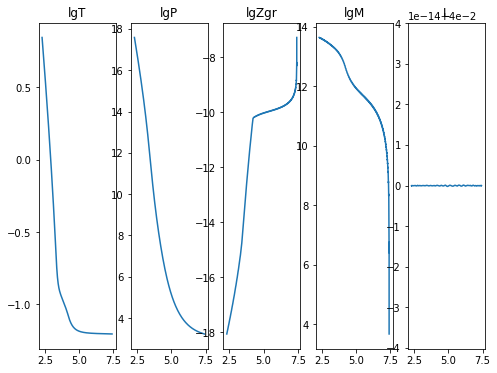

2020-11-18 05:17:58,733 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:17:59,635 __main__ 0/1 INFO :: Perturbation norm: 1.3477124546916395
2020-11-18 05:17:59,637 __main__ 0/1 INFO :: lgT iterate: 0.8455488573894839
2020-11-18 05:17:59,638 __main__ 0/1 INFO :: lgP iterate: 17.59682640888076
2020-11-18 05:17:59,639 __main__ 0/1 INFO :: lgM iterate: 13.641682427993354
2020-11-18 05:17:59,640 __main__ 0/1 INFO :: lgZgr iterate: -18.084676954960806
2020-11-18 05:17:59,641 __main__ 0/1 INFO :: m iterate: 5.5886892329937154e-05
2020-11-18 05:17:59,642 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


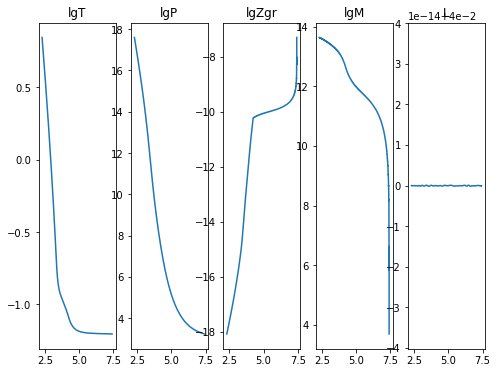

2020-11-18 05:18:04,107 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:18:05,524 __main__ 0/1 INFO :: Perturbation norm: 1.5096744667488986
2020-11-18 05:18:05,525 __main__ 0/1 INFO :: lgT iterate: 0.8449507612480077
2020-11-18 05:18:05,526 __main__ 0/1 INFO :: lgP iterate: 17.582061441247678
2020-11-18 05:18:05,527 __main__ 0/1 INFO :: lgM iterate: 13.64110725886432
2020-11-18 05:18:05,528 __main__ 0/1 INFO :: lgZgr iterate: -18.070420436257255
2020-11-18 05:18:05,529 __main__ 0/1 INFO :: m iterate: 5.506955148248949e-05
2020-11-18 05:18:05,530 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


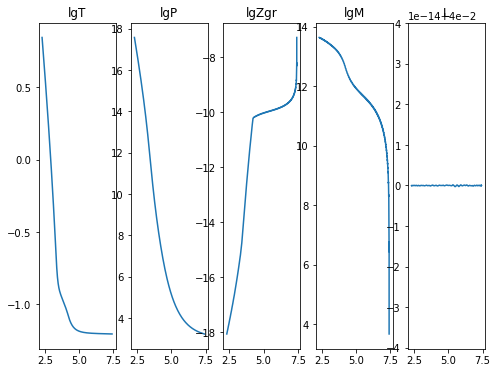

2020-11-18 05:18:10,367 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.6e+00/s
2020-11-18 05:18:11,267 __main__ 0/1 INFO :: Perturbation norm: 1.6112873634258316
2020-11-18 05:18:11,268 __main__ 0/1 INFO :: lgT iterate: 0.8455594993855513
2020-11-18 05:18:11,269 __main__ 0/1 INFO :: lgP iterate: 17.597017753390453
2020-11-18 05:18:11,270 __main__ 0/1 INFO :: lgM iterate: 13.641304457530204
2020-11-18 05:18:11,271 __main__ 0/1 INFO :: lgZgr iterate: -18.084600169611225
2020-11-18 05:18:11,272 __main__ 0/1 INFO :: m iterate: 5.5891281008690896e-05
2020-11-18 05:18:11,273 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


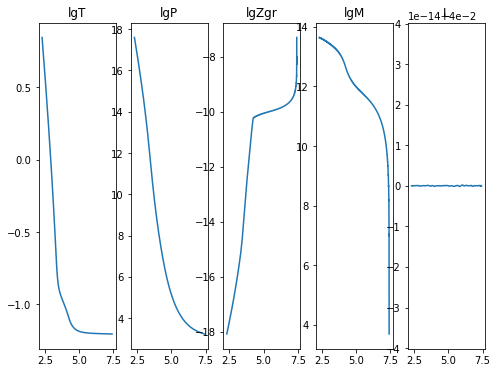

2020-11-18 05:18:15,721 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:18:16,948 __main__ 0/1 INFO :: Perturbation norm: 1.7024033660016578
2020-11-18 05:18:16,949 __main__ 0/1 INFO :: lgT iterate: 0.8449289655491546
2020-11-18 05:18:16,950 __main__ 0/1 INFO :: lgP iterate: 17.581536738148902
2020-11-18 05:18:16,951 __main__ 0/1 INFO :: lgM iterate: 13.64102143780133
2020-11-18 05:18:16,952 __main__ 0/1 INFO :: lgZgr iterate: -18.06987087259118
2020-11-18 05:18:16,953 __main__ 0/1 INFO :: m iterate: 5.504249013288387e-05
2020-11-18 05:18:16,954 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


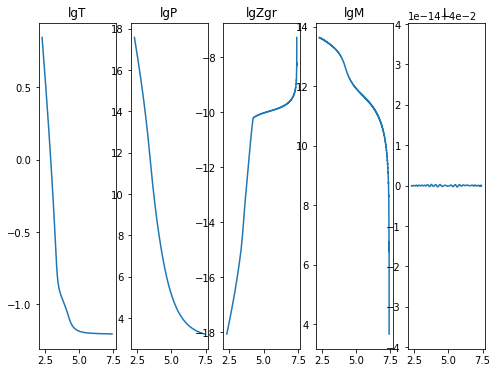

2020-11-18 05:18:21,660 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:18:22,949 __main__ 0/1 INFO :: Perturbation norm: 1.7132909806749441
2020-11-18 05:18:22,950 __main__ 0/1 INFO :: lgT iterate: 0.8455464009477474
2020-11-18 05:18:22,951 __main__ 0/1 INFO :: lgP iterate: 17.596659685282948
2020-11-18 05:18:22,952 __main__ 0/1 INFO :: lgM iterate: 13.641106892251077
2020-11-18 05:18:22,953 __main__ 0/1 INFO :: lgZgr iterate: -18.084129949656493
2020-11-18 05:18:22,954 __main__ 0/1 INFO :: m iterate: 5.586709838567572e-05
2020-11-18 05:18:22,955 __main__ 0/1 INFO :: L iterate: 0.04


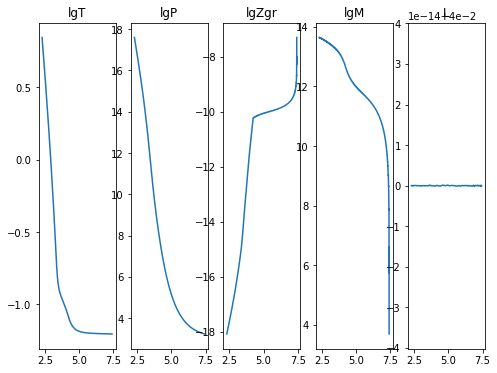

2020-11-18 05:18:27,756 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:18:28,879 __main__ 0/1 INFO :: Perturbation norm: 1.7334550503887736
2020-11-18 05:18:28,881 __main__ 0/1 INFO :: lgT iterate: 0.8449314952576635
2020-11-18 05:18:28,881 __main__ 0/1 INFO :: lgP iterate: 17.581606653960442
2020-11-18 05:18:28,882 __main__ 0/1 INFO :: lgM iterate: 13.641085602131401
2020-11-18 05:18:28,883 __main__ 0/1 INFO :: lgZgr iterate: -18.06997987744519
2020-11-18 05:18:28,884 __main__ 0/1 INFO :: m iterate: 5.504502502517994e-05
2020-11-18 05:18:28,885 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


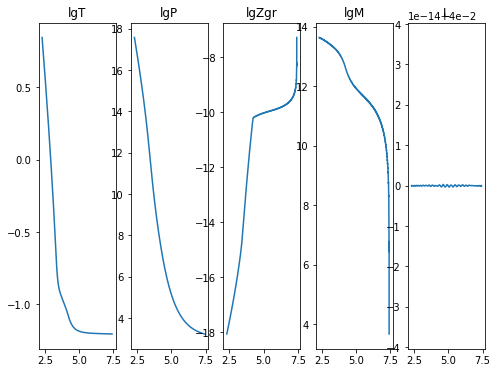

2020-11-18 05:18:33,393 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:18:34,290 __main__ 0/1 INFO :: Perturbation norm: 1.729070936122418
2020-11-18 05:18:34,292 __main__ 0/1 INFO :: lgT iterate: 0.8455466283957123
2020-11-18 05:18:34,293 __main__ 0/1 INFO :: lgP iterate: 17.596674186651768
2020-11-18 05:18:34,293 __main__ 0/1 INFO :: lgM iterate: 13.64111130343808
2020-11-18 05:18:34,294 __main__ 0/1 INFO :: lgZgr iterate: -18.08414704483728
2020-11-18 05:18:34,295 __main__ 0/1 INFO :: m iterate: 5.586799719736746e-05
2020-11-18 05:18:34,296 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


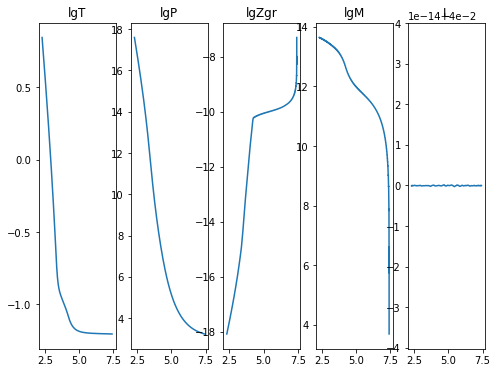

2020-11-18 05:18:38,903 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:18:40,263 __main__ 0/1 INFO :: Perturbation norm: 1.729068667350611
2020-11-18 05:18:40,269 __main__ 0/1 INFO :: lgT iterate: 0.8449325596224411
2020-11-18 05:18:40,272 __main__ 0/1 INFO :: lgP iterate: 17.58162858071928
2020-11-18 05:18:40,276 __main__ 0/1 INFO :: lgM iterate: 13.641097634247469
2020-11-18 05:18:40,280 __main__ 0/1 INFO :: lgZgr iterate: -18.07000825876446
2020-11-18 05:18:40,283 __main__ 0/1 INFO :: m iterate: 5.504597471173156e-05
2020-11-18 05:18:40,287 __main__ 0/1 INFO :: L iterate: 0.04


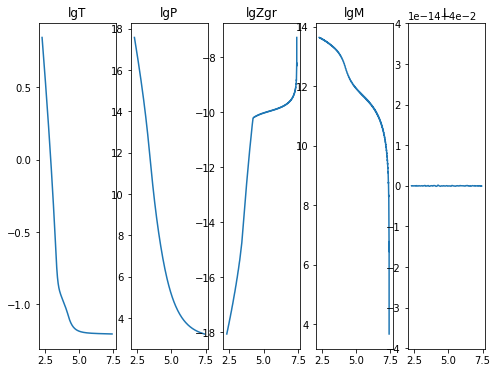

2020-11-18 05:18:44,720 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.1e+00/s
2020-11-18 05:18:45,427 __main__ 0/1 INFO :: Perturbation norm: 1.7321536340484431
2020-11-18 05:18:45,428 __main__ 0/1 INFO :: lgT iterate: 0.8455514481640076
2020-11-18 05:18:45,429 __main__ 0/1 INFO :: lgP iterate: 17.59679967949261
2020-11-18 05:18:45,430 __main__ 0/1 INFO :: lgM iterate: 13.641130218481674
2020-11-18 05:18:45,430 __main__ 0/1 INFO :: lgZgr iterate: -18.084277916534127
2020-11-18 05:18:45,431 __main__ 0/1 INFO :: m iterate: 5.587563823628017e-05
2020-11-18 05:18:45,432 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


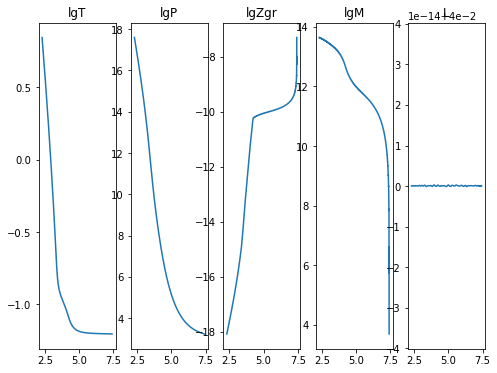

2020-11-18 05:18:50,053 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:18:51,153 __main__ 0/1 INFO :: Perturbation norm: 1.7344993967190805
2020-11-18 05:18:51,154 __main__ 0/1 INFO :: lgT iterate: 0.8449309127135569
2020-11-18 05:18:51,155 __main__ 0/1 INFO :: lgP iterate: 17.58158480474828
2020-11-18 05:18:51,156 __main__ 0/1 INFO :: lgM iterate: 13.641080305386753
2020-11-18 05:18:51,156 __main__ 0/1 INFO :: lgZgr iterate: -18.069955362052752
2020-11-18 05:18:51,157 __main__ 0/1 INFO :: m iterate: 5.5044046985308626e-05
2020-11-18 05:18:51,158 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


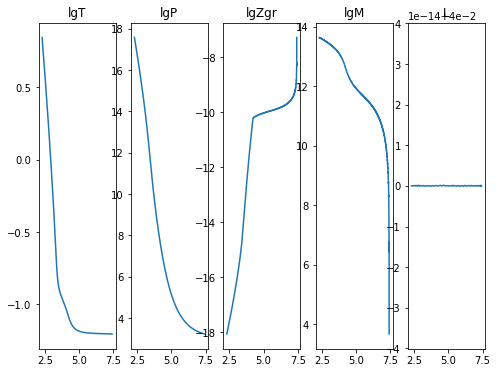

2020-11-18 05:18:55,719 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:18:56,602 __main__ 0/1 INFO :: Perturbation norm: 1.7365356841552981
2020-11-18 05:18:56,604 __main__ 0/1 INFO :: lgT iterate: 0.8455522589240578
2020-11-18 05:18:56,605 __main__ 0/1 INFO :: lgP iterate: 17.59681786610162
2020-11-18 05:18:56,605 __main__ 0/1 INFO :: lgM iterate: 13.641122854523282
2020-11-18 05:18:56,606 __main__ 0/1 INFO :: lgZgr iterate: -18.084289971581285
2020-11-18 05:18:56,607 __main__ 0/1 INFO :: m iterate: 5.587658826300412e-05
2020-11-18 05:18:56,608 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


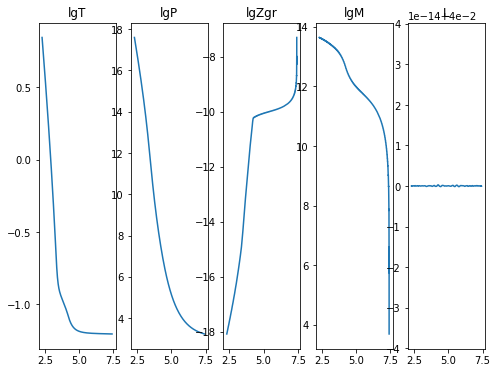

2020-11-18 05:19:01,148 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:19:02,555 __main__ 0/1 INFO :: Perturbation norm: 1.7385269980318625
2020-11-18 05:19:02,556 __main__ 0/1 INFO :: lgT iterate: 0.844930074935291
2020-11-18 05:19:02,557 __main__ 0/1 INFO :: lgP iterate: 17.581564083892648
2020-11-18 05:19:02,558 __main__ 0/1 INFO :: lgM iterate: 13.641075232642974
2020-11-18 05:19:02,559 __main__ 0/1 INFO :: lgZgr iterate: -18.069932501887735
2020-11-18 05:19:02,560 __main__ 0/1 INFO :: m iterate: 5.5042990259934754e-05
2020-11-18 05:19:02,561 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


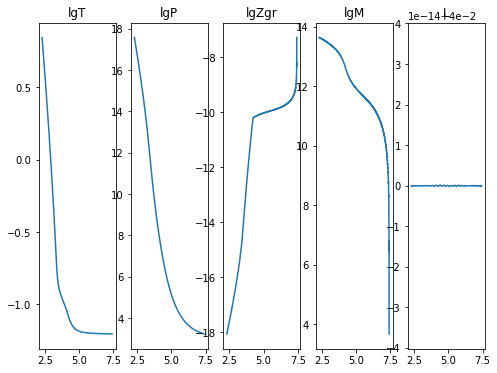

2020-11-18 05:19:07,307 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:19:08,534 __main__ 0/1 INFO :: Perturbation norm: 1.7389910170184895
2020-11-18 05:19:08,536 __main__ 0/1 INFO :: lgT iterate: 0.8455521380346396
2020-11-18 05:19:08,537 __main__ 0/1 INFO :: lgP iterate: 17.596813702117213
2020-11-18 05:19:08,538 __main__ 0/1 INFO :: lgM iterate: 13.641117306097968
2020-11-18 05:19:08,539 __main__ 0/1 INFO :: lgZgr iterate: -18.084282286897295
2020-11-18 05:19:08,540 __main__ 0/1 INFO :: m iterate: 5.587624781355771e-05
2020-11-18 05:19:08,541 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


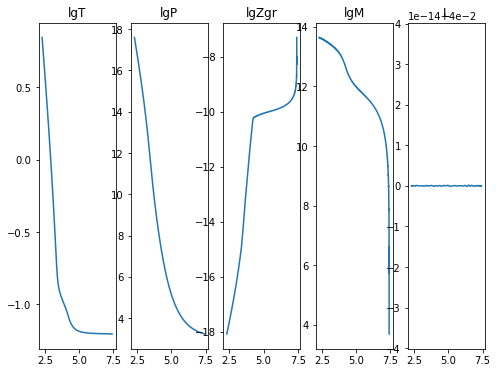

2020-11-18 05:19:13,653 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.5e+00/s
2020-11-18 05:19:14,983 __main__ 0/1 INFO :: Perturbation norm: 1.739692716721271
2020-11-18 05:19:14,984 __main__ 0/1 INFO :: lgT iterate: 0.8449299037869652
2020-11-18 05:19:14,985 __main__ 0/1 INFO :: lgP iterate: 17.581560002651916
2020-11-18 05:19:14,986 __main__ 0/1 INFO :: lgM iterate: 13.641075282058747
2020-11-18 05:19:14,988 __main__ 0/1 INFO :: lgZgr iterate: -18.069928708924945
2020-11-18 05:19:14,989 __main__ 0/1 INFO :: m iterate: 5.504274580836466e-05
2020-11-18 05:19:14,990 __main__ 0/1 INFO :: L iterate: 0.04


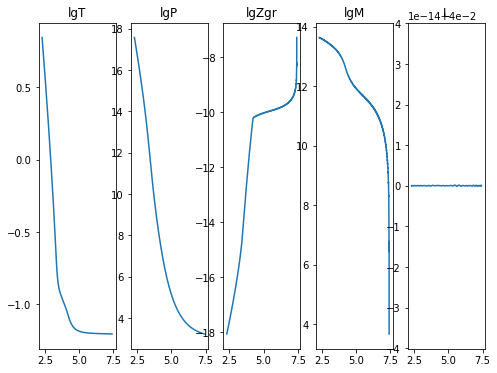

2020-11-18 05:19:19,980 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:19:20,974 __main__ 0/1 INFO :: Perturbation norm: 1.739836495812146
2020-11-18 05:19:20,975 __main__ 0/1 INFO :: lgT iterate: 0.8455521989449504
2020-11-18 05:19:20,976 __main__ 0/1 INFO :: lgP iterate: 17.596815128199086
2020-11-18 05:19:20,977 __main__ 0/1 INFO :: lgM iterate: 13.641116234330774
2020-11-18 05:19:20,978 __main__ 0/1 INFO :: lgZgr iterate: -18.084282906236613
2020-11-18 05:19:20,980 __main__ 0/1 INFO :: m iterate: 5.587631118508796e-05
2020-11-18 05:19:20,982 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


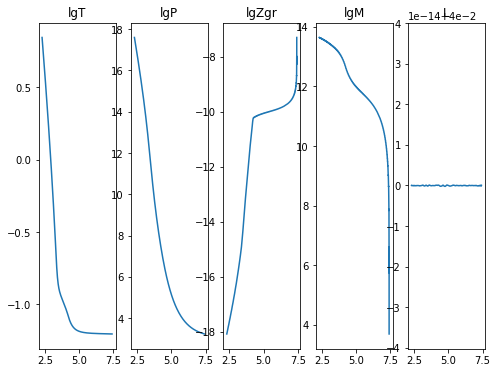

2020-11-18 05:19:25,579 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:19:26,798 __main__ 0/1 INFO :: Perturbation norm: 1.7400632150873925
2020-11-18 05:19:26,800 __main__ 0/1 INFO :: lgT iterate: 0.8449298433799136
2020-11-18 05:19:26,801 __main__ 0/1 INFO :: lgP iterate: 17.58155845217917
2020-11-18 05:19:26,801 __main__ 0/1 INFO :: lgM iterate: 13.64107511629065
2020-11-18 05:19:26,802 __main__ 0/1 INFO :: lgZgr iterate: -18.069927137776922
2020-11-18 05:19:26,803 __main__ 0/1 INFO :: m iterate: 5.5042663493765076e-05
2020-11-18 05:19:26,804 __main__ 0/1 INFO :: L iterate: 0.04


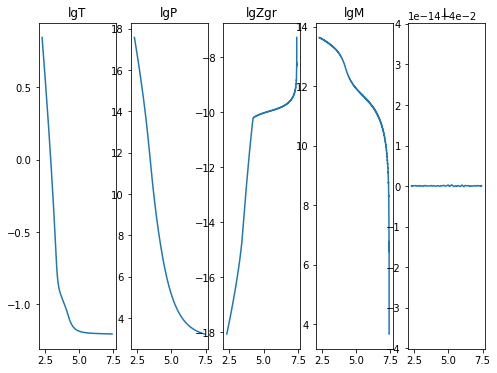

2020-11-18 05:19:31,440 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:19:32,726 __main__ 0/1 INFO :: Perturbation norm: 1.7401638201353804
2020-11-18 05:19:32,727 __main__ 0/1 INFO :: lgT iterate: 0.8455522703824931
2020-11-18 05:19:32,728 __main__ 0/1 INFO :: lgP iterate: 17.596816901046136
2020-11-18 05:19:32,729 __main__ 0/1 INFO :: lgM iterate: 13.641115990331748
2020-11-18 05:19:32,730 __main__ 0/1 INFO :: lgZgr iterate: -18.084284408922375
2020-11-18 05:19:32,731 __main__ 0/1 INFO :: m iterate: 5.5876410835153933e-05
2020-11-18 05:19:32,732 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


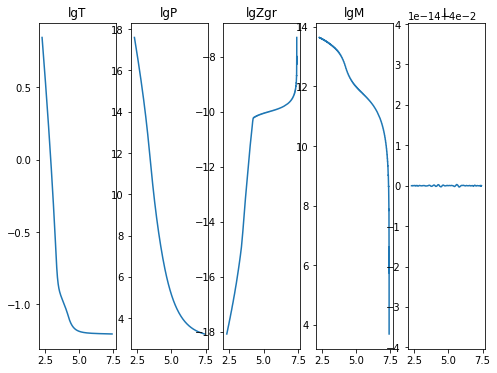

2020-11-18 05:19:37,422 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:19:38,501 __main__ 0/1 INFO :: Perturbation norm: 1.7402782344802867
2020-11-18 05:19:38,502 __main__ 0/1 INFO :: lgT iterate: 0.8449297998708437
2020-11-18 05:19:38,503 __main__ 0/1 INFO :: lgP iterate: 17.581557334544698
2020-11-18 05:19:38,504 __main__ 0/1 INFO :: lgM iterate: 13.641074840183379
2020-11-18 05:19:38,505 __main__ 0/1 INFO :: lgZgr iterate: -18.06992590056901
2020-11-18 05:19:38,506 __main__ 0/1 INFO :: m iterate: 5.5042608573252494e-05
2020-11-18 05:19:38,507 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


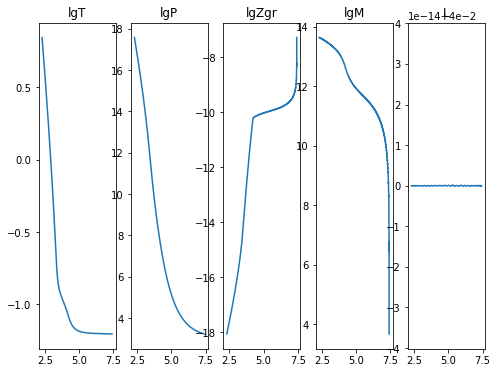

2020-11-18 05:19:42,900 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:19:43,745 __main__ 0/1 INFO :: Perturbation norm: 1.740328571816606
2020-11-18 05:19:43,746 __main__ 0/1 INFO :: lgT iterate: 0.8455522931029804
2020-11-18 05:19:43,747 __main__ 0/1 INFO :: lgP iterate: 17.59681742892477
2020-11-18 05:19:43,748 __main__ 0/1 INFO :: lgM iterate: 13.64111576848278
2020-11-18 05:19:43,749 __main__ 0/1 INFO :: lgZgr iterate: -18.08428475462849
2020-11-18 05:19:43,750 __main__ 0/1 INFO :: m iterate: 5.5876438075586066e-05
2020-11-18 05:19:43,751 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


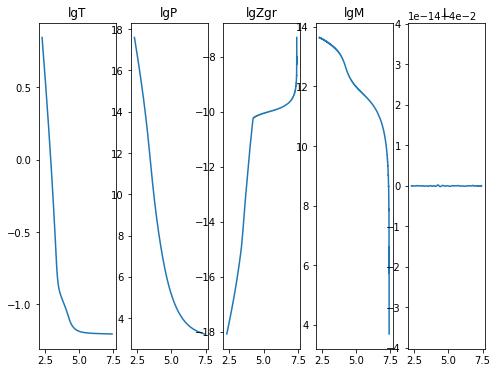

2020-11-18 05:19:48,206 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:19:49,653 __main__ 0/1 INFO :: Perturbation norm: 1.7403866024464758
2020-11-18 05:19:49,663 __main__ 0/1 INFO :: lgT iterate: 0.8449297789649387
2020-11-18 05:19:49,664 __main__ 0/1 INFO :: lgP iterate: 17.58155680919348
2020-11-18 05:19:49,665 __main__ 0/1 INFO :: lgM iterate: 13.641074730090105
2020-11-18 05:19:49,666 __main__ 0/1 INFO :: lgZgr iterate: -18.069925332848005
2020-11-18 05:19:49,667 __main__ 0/1 INFO :: m iterate: 5.50425816481237e-05
2020-11-18 05:19:49,668 __main__ 0/1 INFO :: L iterate: 0.04


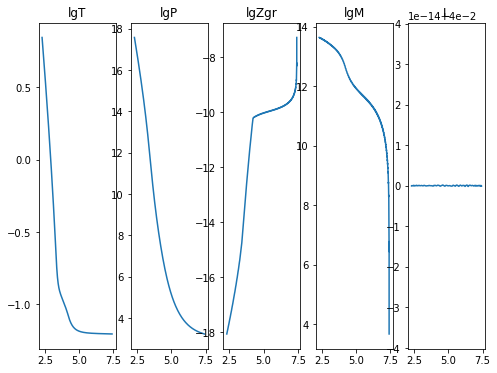

2020-11-18 05:19:54,156 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.3e+00/s
2020-11-18 05:19:55,370 __main__ 0/1 INFO :: Perturbation norm: 1.740405982628455
2020-11-18 05:19:55,374 __main__ 0/1 INFO :: lgT iterate: 0.8455522993599129
2020-11-18 05:19:55,377 __main__ 0/1 INFO :: lgP iterate: 17.596817564481835
2020-11-18 05:19:55,380 __main__ 0/1 INFO :: lgM iterate: 13.641115648844593
2020-11-18 05:19:55,383 __main__ 0/1 INFO :: lgZgr iterate: -18.084284800951366
2020-11-18 05:19:55,386 __main__ 0/1 INFO :: m iterate: 5.587644395355085e-05
2020-11-18 05:19:55,389 __main__ 0/1 INFO :: L iterate: 0.03999999999999995


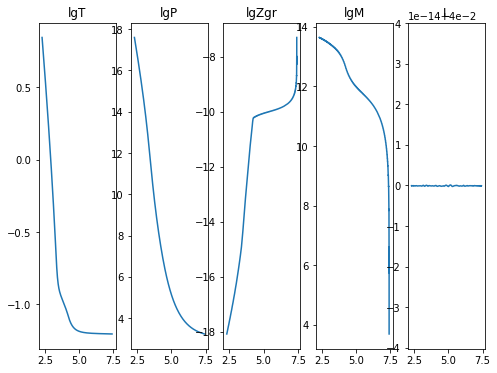

2020-11-18 05:19:59,993 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:20:01,013 __main__ 0/1 INFO :: Perturbation norm: 1.7404307130105596
2020-11-18 05:20:01,014 __main__ 0/1 INFO :: lgT iterate: 0.8449297710411338
2020-11-18 05:20:01,015 __main__ 0/1 INFO :: lgP iterate: 17.581556611065913
2020-11-18 05:20:01,016 __main__ 0/1 INFO :: lgM iterate: 13.6410746982179
2020-11-18 05:20:01,017 __main__ 0/1 INFO :: lgZgr iterate: -18.06992512524524
2020-11-18 05:20:01,018 __main__ 0/1 INFO :: m iterate: 5.5042571174723776e-05
2020-11-18 05:20:01,019 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


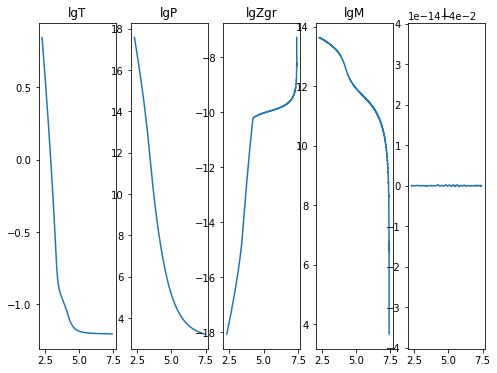

2020-11-18 05:20:05,943 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:20:06,969 __main__ 0/1 INFO :: Perturbation norm: 1.7404388080609565
2020-11-18 05:20:06,971 __main__ 0/1 INFO :: lgT iterate: 0.8455523028283574
2020-11-18 05:20:06,972 __main__ 0/1 INFO :: lgP iterate: 17.596817644728702
2020-11-18 05:20:06,973 __main__ 0/1 INFO :: lgM iterate: 13.641115604803403
2020-11-18 05:20:06,973 __main__ 0/1 INFO :: lgZgr iterate: -18.084284846598212
2020-11-18 05:20:06,974 __main__ 0/1 INFO :: m iterate: 5.587644788551671e-05
2020-11-18 05:20:06,975 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


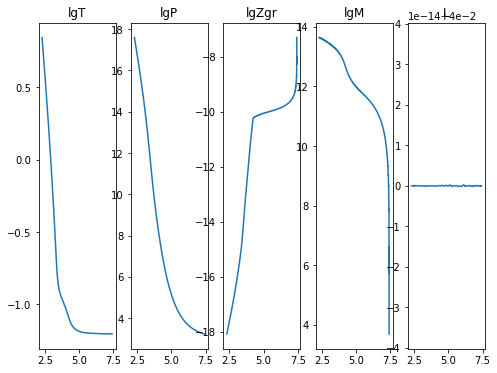

2020-11-18 05:20:11,767 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:20:13,098 __main__ 0/1 INFO :: Perturbation norm: 1.7404491755845783
2020-11-18 05:20:13,099 __main__ 0/1 INFO :: lgT iterate: 0.8449297676744132
2020-11-18 05:20:13,100 __main__ 0/1 INFO :: lgP iterate: 17.58155652602421
2020-11-18 05:20:13,101 __main__ 0/1 INFO :: lgM iterate: 13.641074683278536
2020-11-18 05:20:13,102 __main__ 0/1 INFO :: lgZgr iterate: -18.069925035243926
2020-11-18 05:20:13,103 __main__ 0/1 INFO :: m iterate: 5.50425667658061e-05
2020-11-18 05:20:13,104 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


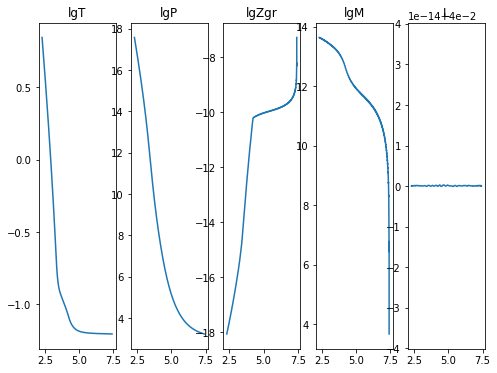

2020-11-18 05:20:18,064 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:20:19,078 __main__ 0/1 INFO :: Perturbation norm: 1.7404530075596225
2020-11-18 05:20:19,082 __main__ 0/1 INFO :: lgT iterate: 0.8455523046947013
2020-11-18 05:20:19,085 __main__ 0/1 INFO :: lgP iterate: 17.596817688810056
2020-11-18 05:20:19,088 __main__ 0/1 INFO :: lgM iterate: 13.641115587125604
2020-11-18 05:20:19,091 __main__ 0/1 INFO :: lgZgr iterate: -18.084284876079046
2020-11-18 05:20:19,094 __main__ 0/1 INFO :: m iterate: 5.5876450154812574e-05
2020-11-18 05:20:19,098 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


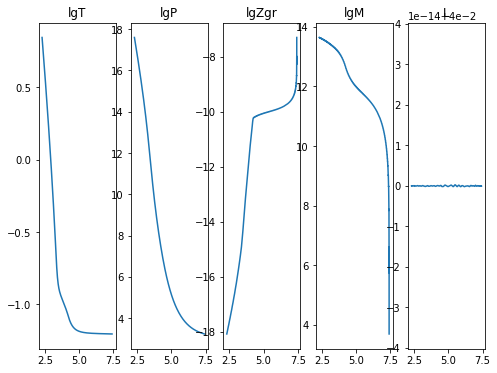

2020-11-18 05:20:23,936 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:20:25,502 __main__ 0/1 INFO :: Perturbation norm: 1.7404576870641346
2020-11-18 05:20:25,503 __main__ 0/1 INFO :: lgT iterate: 0.8449297660697711
2020-11-18 05:20:25,504 __main__ 0/1 INFO :: lgP iterate: 17.58155648541114
2020-11-18 05:20:25,505 __main__ 0/1 INFO :: lgM iterate: 13.641074675229998
2020-11-18 05:20:25,506 __main__ 0/1 INFO :: lgZgr iterate: -18.06992499164697
2020-11-18 05:20:25,507 __main__ 0/1 INFO :: m iterate: 5.504256468213953e-05
2020-11-18 05:20:25,508 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


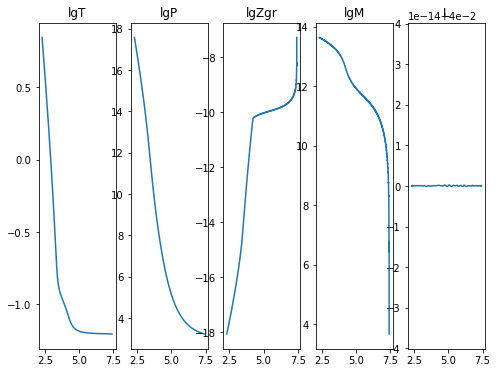

2020-11-18 05:20:30,384 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:20:32,244 __main__ 0/1 INFO :: Perturbation norm: 1.7404594337858394
2020-11-18 05:20:32,246 __main__ 0/1 INFO :: lgT iterate: 0.845552305471028
2020-11-18 05:20:32,249 __main__ 0/1 INFO :: lgP iterate: 17.59681770684712
2020-11-18 05:20:32,251 __main__ 0/1 INFO :: lgM iterate: 13.641115578554604
2020-11-18 05:20:32,254 __main__ 0/1 INFO :: lgZgr iterate: -18.084284887230325
2020-11-18 05:20:32,257 __main__ 0/1 INFO :: m iterate: 5.587645106785999e-05
2020-11-18 05:20:32,260 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


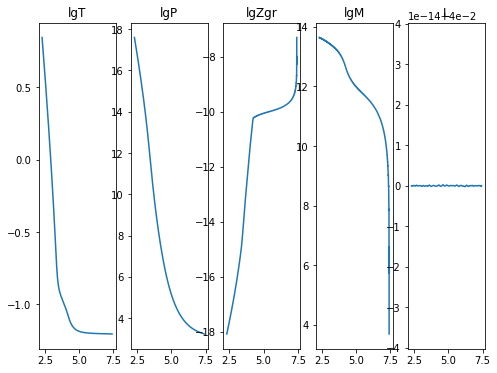

2020-11-18 05:20:36,719 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.3e+00/s
2020-11-18 05:20:37,808 __main__ 0/1 INFO :: Perturbation norm: 1.7404615629759463
2020-11-18 05:20:37,809 __main__ 0/1 INFO :: lgT iterate: 0.8449297653432897
2020-11-18 05:20:37,810 __main__ 0/1 INFO :: lgP iterate: 17.58155646709767
2020-11-18 05:20:37,811 __main__ 0/1 INFO :: lgM iterate: 13.641074671701379
2020-11-18 05:20:37,812 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249720596
2020-11-18 05:20:37,813 __main__ 0/1 INFO :: m iterate: 5.5042563739782224e-05
2020-11-18 05:20:37,814 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


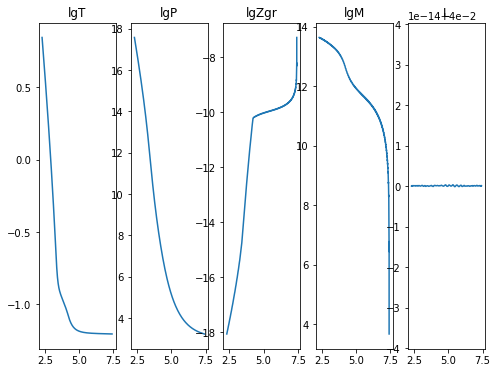

2020-11-18 05:20:42,317 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:20:43,249 __main__ 0/1 INFO :: Perturbation norm: 1.7404623195318625
2020-11-18 05:20:43,255 __main__ 0/1 INFO :: lgT iterate: 0.8455523057880577
2020-11-18 05:20:43,256 __main__ 0/1 INFO :: lgP iterate: 17.596817714136726
2020-11-18 05:20:43,257 __main__ 0/1 INFO :: lgM iterate: 13.641115574584237
2020-11-18 05:20:43,257 __main__ 0/1 INFO :: lgZgr iterate: -18.084284891394205
2020-11-18 05:20:43,258 __main__ 0/1 INFO :: m iterate: 5.587645142668407e-05
2020-11-18 05:20:43,259 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


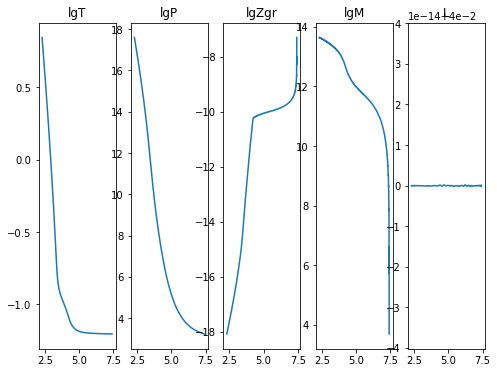

2020-11-18 05:20:47,921 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:20:48,950 __main__ 0/1 INFO :: Perturbation norm: 1.7404632592888933
2020-11-18 05:20:48,951 __main__ 0/1 INFO :: lgT iterate: 0.8449297650295955
2020-11-18 05:20:48,952 __main__ 0/1 INFO :: lgP iterate: 17.58155645919816
2020-11-18 05:20:48,953 __main__ 0/1 INFO :: lgM iterate: 13.641074670252223
2020-11-18 05:20:48,954 __main__ 0/1 INFO :: lgZgr iterate: -18.069924963659787
2020-11-18 05:20:48,955 __main__ 0/1 INFO :: m iterate: 5.504256333033197e-05
2020-11-18 05:20:48,955 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


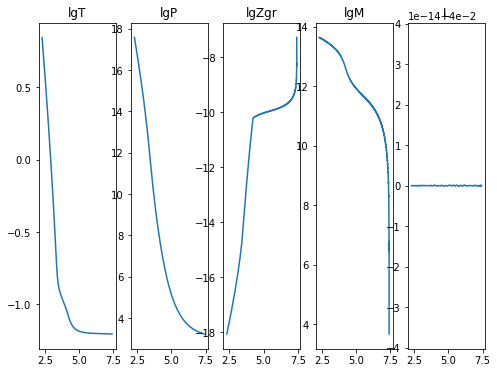

2020-11-18 05:20:53,713 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-11-18 05:20:54,740 __main__ 0/1 INFO :: Perturbation norm: 1.7404635911832047
2020-11-18 05:20:54,741 __main__ 0/1 INFO :: lgT iterate: 0.8455523059327342
2020-11-18 05:20:54,742 __main__ 0/1 INFO :: lgP iterate: 17.596817717489586
2020-11-18 05:20:54,743 __main__ 0/1 INFO :: lgM iterate: 13.64111557287862
2020-11-18 05:20:54,744 __main__ 0/1 INFO :: lgZgr iterate: -18.084284893391533
2020-11-18 05:20:54,745 __main__ 0/1 INFO :: m iterate: 5.587645159543797e-05
2020-11-18 05:20:54,746 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


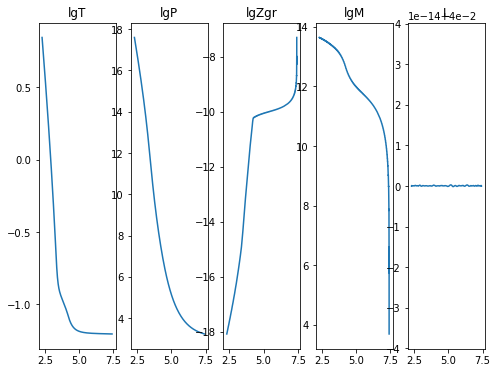

2020-11-18 05:20:59,538 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:21:00,699 __main__ 0/1 INFO :: Perturbation norm: 1.7404640040955561
2020-11-18 05:21:00,700 __main__ 0/1 INFO :: lgT iterate: 0.8449297648916039
2020-11-18 05:21:00,701 __main__ 0/1 INFO :: lgP iterate: 17.58155645571734
2020-11-18 05:21:00,701 __main__ 0/1 INFO :: lgM iterate: 13.641074669606658
2020-11-18 05:21:00,702 __main__ 0/1 INFO :: lgZgr iterate: -18.069924959953482
2020-11-18 05:21:00,703 __main__ 0/1 INFO :: m iterate: 5.504256314470268e-05
2020-11-18 05:21:00,704 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


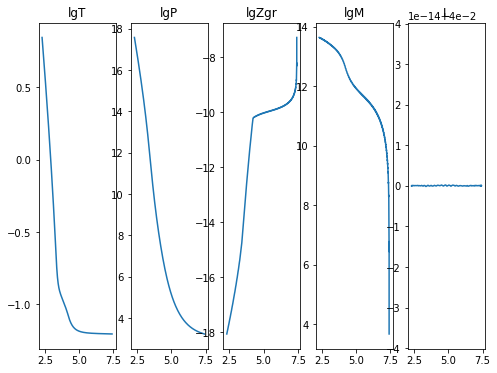

2020-11-18 05:21:05,899 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:21:07,179 __main__ 0/1 INFO :: Perturbation norm: 1.740464152959622
2020-11-18 05:21:07,182 __main__ 0/1 INFO :: lgT iterate: 0.8455523059993062
2020-11-18 05:21:07,185 __main__ 0/1 INFO :: lgP iterate: 17.596817719039095
2020-11-18 05:21:07,187 __main__ 0/1 INFO :: lgM iterate: 13.64111557213577
2020-11-18 05:21:07,189 __main__ 0/1 INFO :: lgZgr iterate: -18.084284894345316
2020-11-18 05:21:07,192 __main__ 0/1 INFO :: m iterate: 5.587645165761046e-05
2020-11-18 05:21:07,194 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


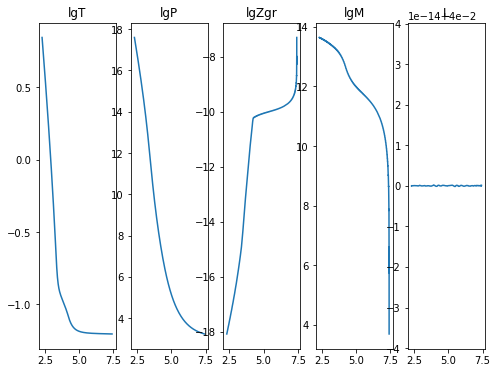

2020-11-18 05:21:11,682 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.3e+00/s
2020-11-18 05:21:12,831 __main__ 0/1 INFO :: Perturbation norm: 1.7404643366866215
2020-11-18 05:21:12,832 __main__ 0/1 INFO :: lgT iterate: 0.844929764829623
2020-11-18 05:21:12,833 __main__ 0/1 INFO :: lgP iterate: 17.581556454153176
2020-11-18 05:21:12,835 __main__ 0/1 INFO :: lgM iterate: 13.641074669310331
2020-11-18 05:21:12,836 __main__ 0/1 INFO :: lgZgr iterate: -18.069924958283785
2020-11-18 05:21:12,838 __main__ 0/1 INFO :: m iterate: 5.5042563064766625e-05
2020-11-18 05:21:12,839 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


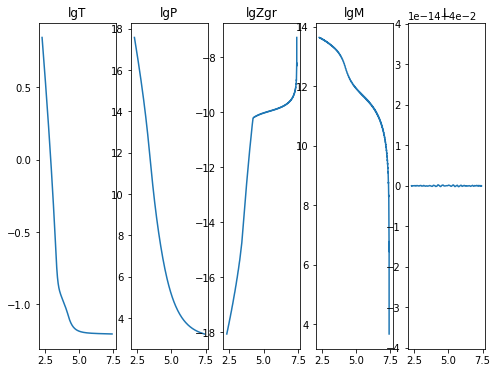

2020-11-18 05:21:17,147 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:21:18,096 __main__ 0/1 INFO :: Perturbation norm: 1.7404644031320506
2020-11-18 05:21:18,101 __main__ 0/1 INFO :: lgT iterate: 0.8455523060285738
2020-11-18 05:21:18,102 __main__ 0/1 INFO :: lgP iterate: 17.596817719718338
2020-11-18 05:21:18,103 __main__ 0/1 INFO :: lgM iterate: 13.641115571801446
2020-11-18 05:21:18,104 __main__ 0/1 INFO :: lgZgr iterate: -18.084284894757495
2020-11-18 05:21:18,105 __main__ 0/1 INFO :: m iterate: 5.587645170201938e-05
2020-11-18 05:21:18,106 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


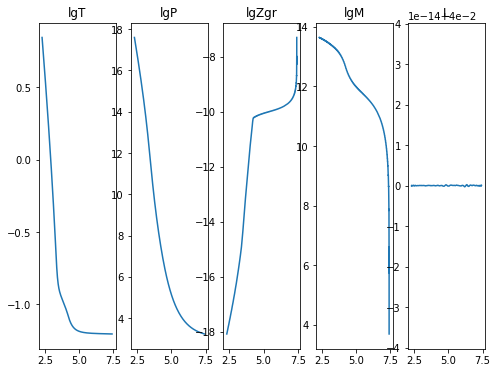

2020-11-18 05:21:22,549 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:21:23,534 __main__ 0/1 INFO :: Perturbation norm: 1.740464485066232
2020-11-18 05:21:23,535 __main__ 0/1 INFO :: lgT iterate: 0.8449297648019882
2020-11-18 05:21:23,536 __main__ 0/1 INFO :: lgP iterate: 17.58155645345632
2020-11-18 05:21:23,537 __main__ 0/1 INFO :: lgM iterate: 13.64107466917882
2020-11-18 05:21:23,538 __main__ 0/1 INFO :: lgZgr iterate: -18.069924957540287
2020-11-18 05:21:23,539 __main__ 0/1 INFO :: m iterate: 5.5042563024798596e-05
2020-11-18 05:21:23,540 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


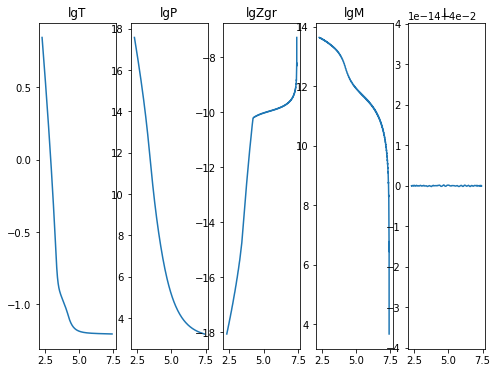

2020-11-18 05:21:27,940 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:21:28,859 __main__ 0/1 INFO :: Perturbation norm: 1.7404645144480269
2020-11-18 05:21:28,870 __main__ 0/1 INFO :: lgT iterate: 0.8455523060413702
2020-11-18 05:21:28,871 __main__ 0/1 INFO :: lgP iterate: 17.59681772001475
2020-11-18 05:21:28,872 __main__ 0/1 INFO :: lgM iterate: 13.641115571651689
2020-11-18 05:21:28,873 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489493475
2020-11-18 05:21:28,874 __main__ 0/1 INFO :: m iterate: 5.587645172067113e-05
2020-11-18 05:21:28,874 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


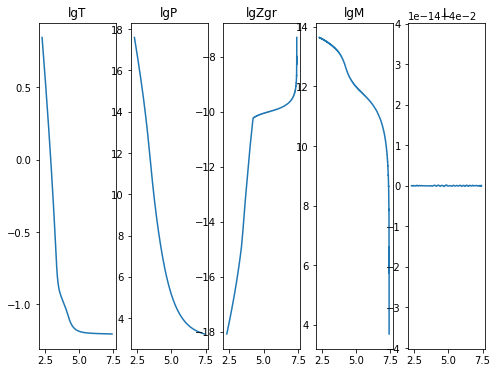

2020-11-18 05:21:33,587 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:21:34,794 __main__ 0/1 INFO :: Perturbation norm: 1.740464550798714
2020-11-18 05:21:34,796 __main__ 0/1 INFO :: lgT iterate: 0.8449297647897771
2020-11-18 05:21:34,797 __main__ 0/1 INFO :: lgP iterate: 17.581556453148384
2020-11-18 05:21:34,798 __main__ 0/1 INFO :: lgM iterate: 13.641074669121288
2020-11-18 05:21:34,799 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495721213
2020-11-18 05:21:34,800 __main__ 0/1 INFO :: m iterate: 5.504256301769317e-05
2020-11-18 05:21:34,801 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


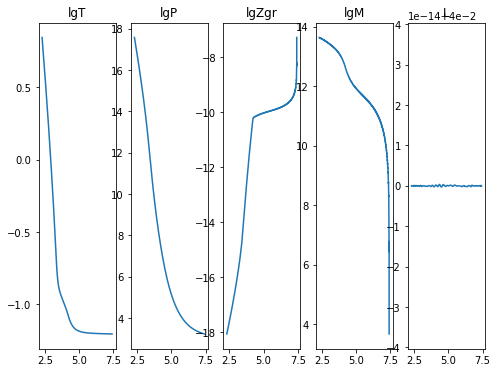

2020-11-18 05:21:39,674 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:21:40,968 __main__ 0/1 INFO :: Perturbation norm: 1.7404645638131238
2020-11-18 05:21:40,972 __main__ 0/1 INFO :: lgT iterate: 0.8455523060470721
2020-11-18 05:21:40,974 __main__ 0/1 INFO :: lgP iterate: 17.596817720147026
2020-11-18 05:21:40,978 __main__ 0/1 INFO :: lgM iterate: 13.641115571585615
2020-11-18 05:21:40,980 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895014367
2020-11-18 05:21:40,983 __main__ 0/1 INFO :: m iterate: 5.5876451716230235e-05
2020-11-18 05:21:40,986 __main__ 0/1 INFO :: L iterate: 0.04


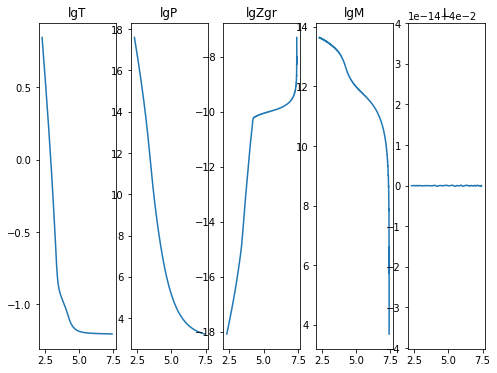

2020-11-18 05:21:46,080 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.2e+00/s
2020-11-18 05:21:47,478 __main__ 0/1 INFO :: Perturbation norm: 1.7404645799216536
2020-11-18 05:21:47,481 __main__ 0/1 INFO :: lgT iterate: 0.8449297647843672
2020-11-18 05:21:47,484 __main__ 0/1 INFO :: lgP iterate: 17.581556453011913
2020-11-18 05:21:47,487 __main__ 0/1 INFO :: lgM iterate: 13.641074669095671
2020-11-18 05:21:47,489 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495706661
2020-11-18 05:21:47,492 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:21:47,494 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


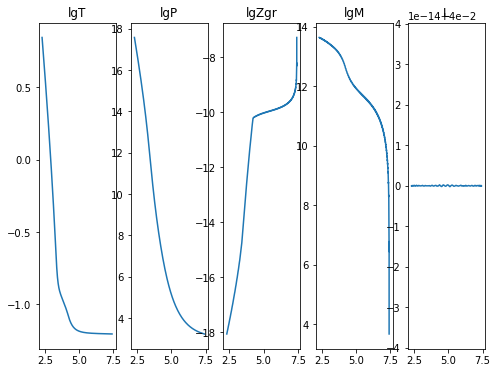

2020-11-18 05:21:52,058 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:21:52,906 __main__ 0/1 INFO :: Perturbation norm: 1.740464585709385
2020-11-18 05:21:52,908 __main__ 0/1 INFO :: lgT iterate: 0.8455523060496205
2020-11-18 05:21:52,908 __main__ 0/1 INFO :: lgP iterate: 17.596817720206197
2020-11-18 05:21:52,909 __main__ 0/1 INFO :: lgM iterate: 13.641115571556407
2020-11-18 05:21:52,910 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489505021
2020-11-18 05:21:52,911 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:21:52,912 __main__ 0/1 INFO :: L iterate: 0.04


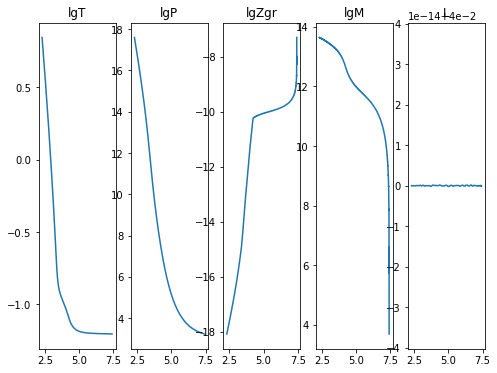

2020-11-18 05:21:57,595 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:21:58,568 __main__ 0/1 INFO :: Perturbation norm: 1.7404645928638323
2020-11-18 05:21:58,569 __main__ 0/1 INFO :: lgT iterate: 0.8449297647819582
2020-11-18 05:21:58,570 __main__ 0/1 INFO :: lgP iterate: 17.58155645295115
2020-11-18 05:21:58,571 __main__ 0/1 INFO :: lgM iterate: 13.64107466908429
2020-11-18 05:21:58,571 __main__ 0/1 INFO :: lgZgr iterate: -18.069924957001845
2020-11-18 05:21:58,572 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:21:58,573 __main__ 0/1 INFO :: L iterate: 0.04


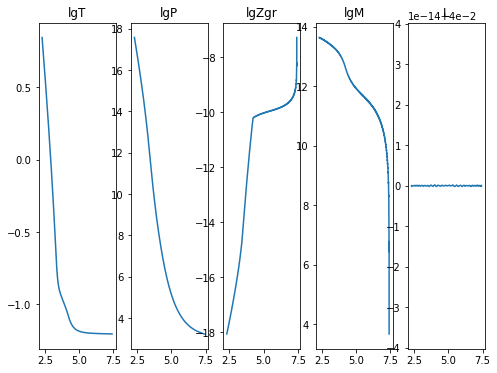

2020-11-18 05:22:02,767 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:22:03,658 __main__ 0/1 INFO :: Perturbation norm: 1.7404645954356268
2020-11-18 05:22:03,659 __main__ 0/1 INFO :: lgT iterate: 0.8455523060507522
2020-11-18 05:22:03,660 __main__ 0/1 INFO :: lgP iterate: 17.5968177202324
2020-11-18 05:22:03,661 __main__ 0/1 INFO :: lgM iterate: 13.64111557154336
2020-11-18 05:22:03,662 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895066016
2020-11-18 05:22:03,663 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:22:03,664 __main__ 0/1 INFO :: L iterate: 0.04


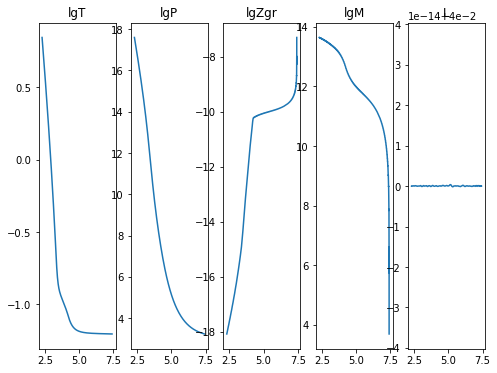

2020-11-18 05:22:07,600 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:22:08,985 __main__ 0/1 INFO :: Perturbation norm: 1.7404645986134324
2020-11-18 05:22:08,987 __main__ 0/1 INFO :: lgT iterate: 0.8449297647808897
2020-11-18 05:22:08,988 __main__ 0/1 INFO :: lgP iterate: 17.58155645292419
2020-11-18 05:22:08,989 __main__ 0/1 INFO :: lgM iterate: 13.641074669079188
2020-11-18 05:22:08,990 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956973075
2020-11-18 05:22:08,991 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:22:08,992 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


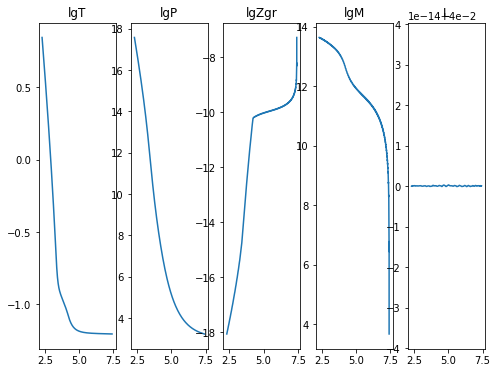

2020-11-18 05:22:13,420 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:22:14,600 __main__ 0/1 INFO :: Perturbation norm: 1.7404645997545203
2020-11-18 05:22:14,600 __main__ 0/1 INFO :: lgT iterate: 0.8455523060512508
2020-11-18 05:22:14,601 __main__ 0/1 INFO :: lgP iterate: 17.596817720243994
2020-11-18 05:22:14,602 __main__ 0/1 INFO :: lgM iterate: 13.641115571537572
2020-11-18 05:22:14,603 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507299
2020-11-18 05:22:14,603 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:22:14,604 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


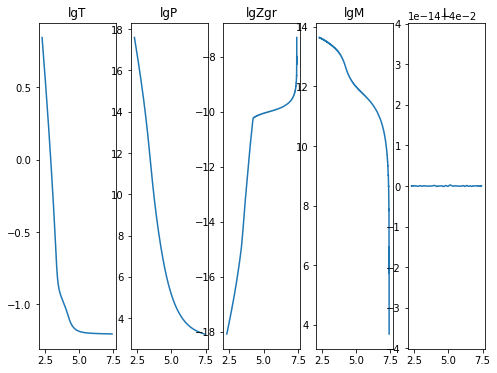

2020-11-18 05:22:19,165 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:22:20,467 __main__ 0/1 INFO :: Perturbation norm: 1.7404646011660208
2020-11-18 05:22:20,468 __main__ 0/1 INFO :: lgT iterate: 0.8449297647804146
2020-11-18 05:22:20,469 __main__ 0/1 INFO :: lgP iterate: 17.581556452912217
2020-11-18 05:22:20,469 __main__ 0/1 INFO :: lgM iterate: 13.641074669076968
2020-11-18 05:22:20,470 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495696032
2020-11-18 05:22:20,471 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-11-18 05:22:20,472 __main__ 0/1 INFO :: L iterate: 0.04


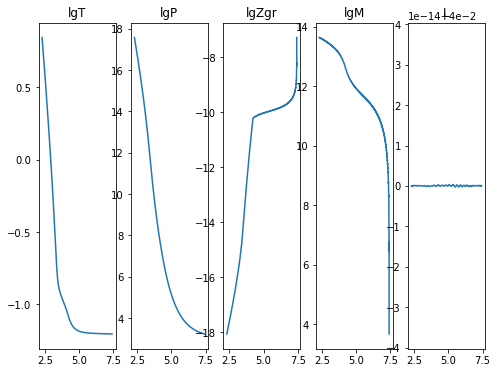

2020-11-18 05:22:24,365 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:22:25,550 __main__ 0/1 INFO :: Perturbation norm: 1.7404646016723375
2020-11-18 05:22:25,551 __main__ 0/1 INFO :: lgT iterate: 0.845552306051474
2020-11-18 05:22:25,552 __main__ 0/1 INFO :: lgP iterate: 17.596817720249142
2020-11-18 05:22:25,563 __main__ 0/1 INFO :: lgM iterate: 13.641115571534957
2020-11-18 05:22:25,567 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507606
2020-11-18 05:22:25,568 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:22:25,573 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


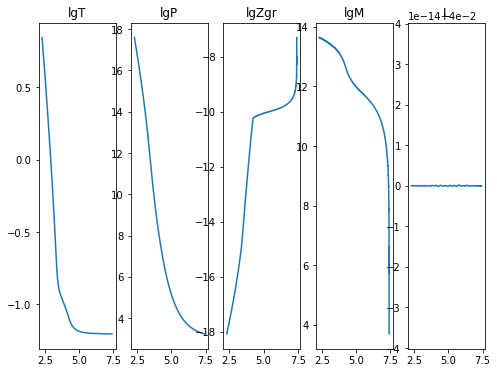

2020-11-18 05:22:29,560 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:22:30,750 __main__ 0/1 INFO :: Perturbation norm: 1.7404646022983994
2020-11-18 05:22:30,752 __main__ 0/1 INFO :: lgT iterate: 0.8449297647802049
2020-11-18 05:22:30,753 __main__ 0/1 INFO :: lgP iterate: 17.58155645290692
2020-11-18 05:22:30,754 __main__ 0/1 INFO :: lgM iterate: 13.64107466907593
2020-11-18 05:22:30,755 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956954647
2020-11-18 05:22:30,756 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:22:30,757 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


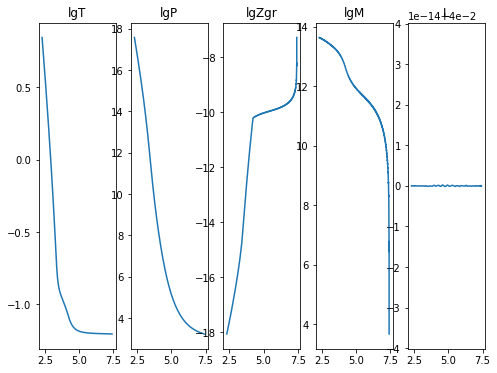

2020-11-18 05:22:34,427 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:22:35,311 __main__ 0/1 INFO :: Perturbation norm: 1.7404646025236143
2020-11-18 05:22:35,312 __main__ 0/1 INFO :: lgT iterate: 0.8455523060515722
2020-11-18 05:22:35,313 __main__ 0/1 INFO :: lgP iterate: 17.59681772025143
2020-11-18 05:22:35,314 __main__ 0/1 INFO :: lgM iterate: 13.641115571533888
2020-11-18 05:22:35,315 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895077488
2020-11-18 05:22:35,316 __main__ 0/1 INFO :: m iterate: 5.587645173665834e-05
2020-11-18 05:22:35,316 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


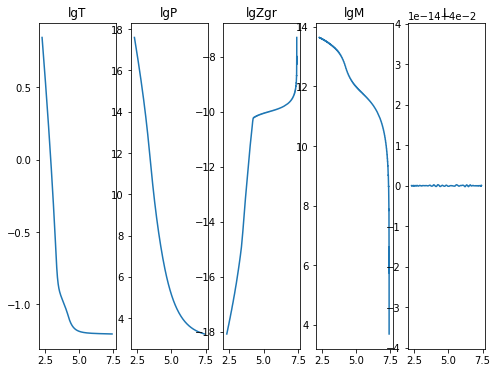

2020-11-18 05:22:38,920 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:22:39,844 __main__ 0/1 INFO :: Perturbation norm: 1.7404646028016284
2020-11-18 05:22:39,845 __main__ 0/1 INFO :: lgT iterate: 0.8449297647801108
2020-11-18 05:22:39,846 __main__ 0/1 INFO :: lgP iterate: 17.5815564529046
2020-11-18 05:22:39,847 __main__ 0/1 INFO :: lgM iterate: 13.641074669075497
2020-11-18 05:22:39,848 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956952164
2020-11-18 05:22:39,849 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:22:39,850 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


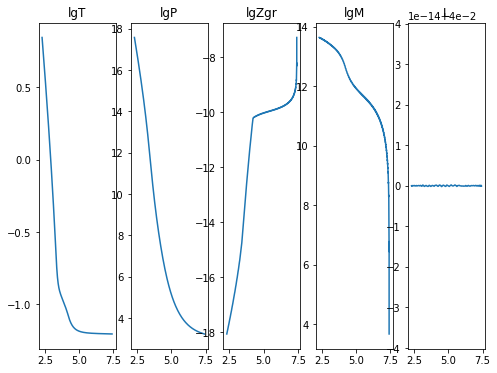

2020-11-18 05:22:43,354 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:22:44,108 __main__ 0/1 INFO :: Perturbation norm: 1.7404646029020585
2020-11-18 05:22:44,109 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516175
2020-11-18 05:22:44,110 __main__ 0/1 INFO :: lgP iterate: 17.59681772025247
2020-11-18 05:22:44,111 __main__ 0/1 INFO :: lgM iterate: 13.641115571533335
2020-11-18 05:22:44,112 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078092
2020-11-18 05:22:44,113 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:22:44,114 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


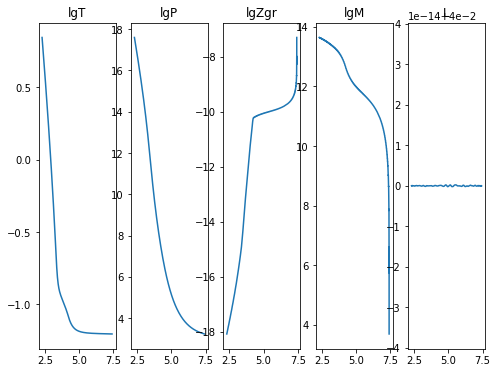

2020-11-18 05:22:47,887 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:22:48,929 __main__ 0/1 INFO :: Perturbation norm: 1.7404646030262432
2020-11-18 05:22:48,930 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800701
2020-11-18 05:22:48,931 __main__ 0/1 INFO :: lgP iterate: 17.581556452903513
2020-11-18 05:22:48,932 __main__ 0/1 INFO :: lgM iterate: 13.641074669075321
2020-11-18 05:22:48,933 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695103
2020-11-18 05:22:48,934 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:22:48,935 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


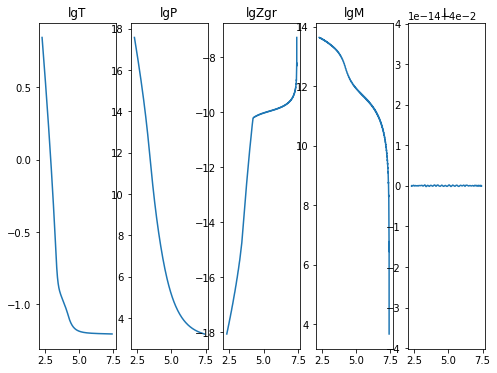

2020-11-18 05:22:52,480 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:22:53,517 __main__ 0/1 INFO :: Perturbation norm: 1.7404646030702857
2020-11-18 05:22:53,518 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516371
2020-11-18 05:22:53,519 __main__ 0/1 INFO :: lgP iterate: 17.596817720252908
2020-11-18 05:22:53,520 __main__ 0/1 INFO :: lgM iterate: 13.641115571533142
2020-11-18 05:22:53,521 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078383
2020-11-18 05:22:53,522 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:22:53,523 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


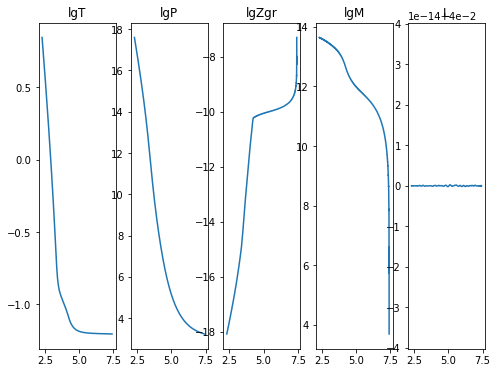

2020-11-18 05:22:57,142 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:22:58,067 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031248667
2020-11-18 05:22:58,068 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800506
2020-11-18 05:22:58,069 __main__ 0/1 INFO :: lgP iterate: 17.581556452903055
2020-11-18 05:22:58,070 __main__ 0/1 INFO :: lgM iterate: 13.641074669075229
2020-11-18 05:22:58,071 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695053
2020-11-18 05:22:58,072 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:22:58,073 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


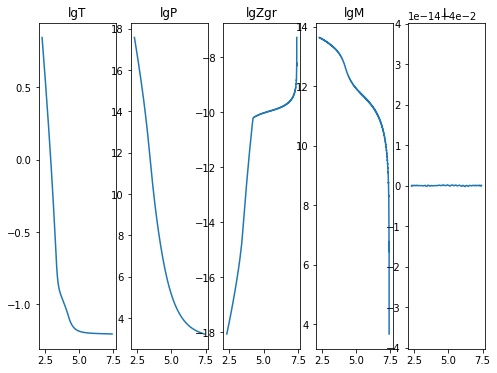

2020-11-18 05:23:01,581 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:23:02,353 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031447542
2020-11-18 05:23:02,354 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516441
2020-11-18 05:23:02,355 __main__ 0/1 INFO :: lgP iterate: 17.596817720253096
2020-11-18 05:23:02,356 __main__ 0/1 INFO :: lgM iterate: 13.641115571533064
2020-11-18 05:23:02,357 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078504
2020-11-18 05:23:02,358 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:23:02,358 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


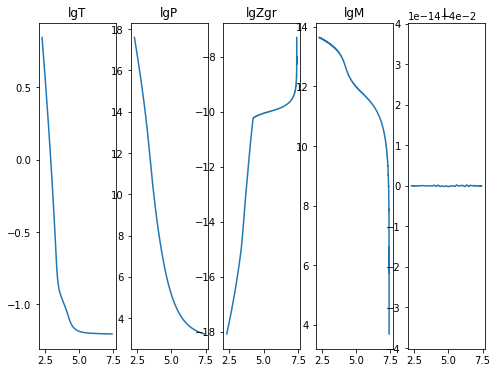

2020-11-18 05:23:05,906 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:23:06,976 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031697122
2020-11-18 05:23:06,977 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800423
2020-11-18 05:23:06,978 __main__ 0/1 INFO :: lgP iterate: 17.58155645290281
2020-11-18 05:23:06,979 __main__ 0/1 INFO :: lgM iterate: 13.641074669075154
2020-11-18 05:23:06,980 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695026
2020-11-18 05:23:06,981 __main__ 0/1 INFO :: m iterate: 5.5042563015028634e-05
2020-11-18 05:23:06,982 __main__ 0/1 INFO :: L iterate: 0.04


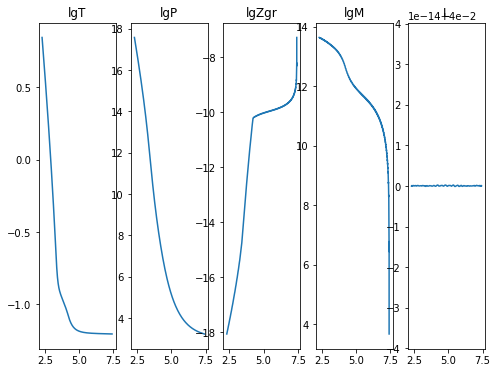

2020-11-18 05:23:10,528 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:23:11,313 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031783986
2020-11-18 05:23:11,314 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516489
2020-11-18 05:23:11,315 __main__ 0/1 INFO :: lgP iterate: 17.59681772025318
2020-11-18 05:23:11,315 __main__ 0/1 INFO :: lgM iterate: 13.64111557153304
2020-11-18 05:23:11,316 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-11-18 05:23:11,317 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:23:11,318 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


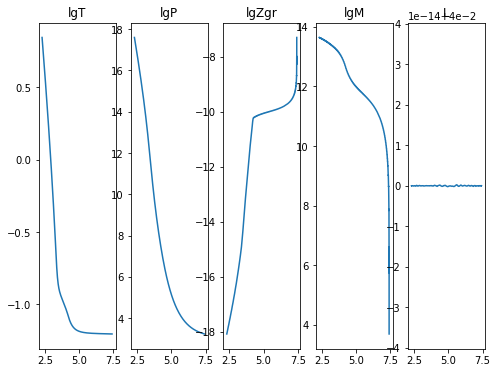

2020-11-18 05:23:14,904 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:23:15,831 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031889892
2020-11-18 05:23:15,832 __main__ 0/1 INFO :: lgT iterate: 0.844929764780037
2020-11-18 05:23:15,833 __main__ 0/1 INFO :: lgP iterate: 17.581556452902753
2020-11-18 05:23:15,834 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:23:15,835 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695016
2020-11-18 05:23:15,836 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:23:15,837 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


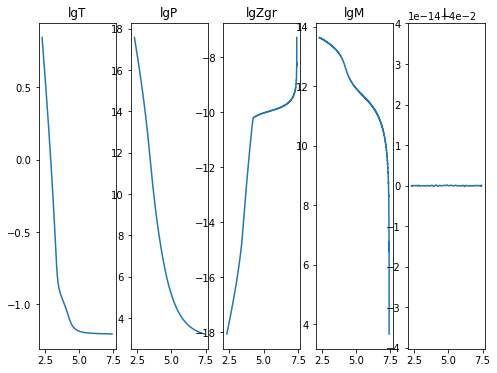

2020-11-18 05:23:19,378 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:23:20,131 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031925053
2020-11-18 05:23:20,132 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516499
2020-11-18 05:23:20,133 __main__ 0/1 INFO :: lgP iterate: 17.596817720253227
2020-11-18 05:23:20,134 __main__ 0/1 INFO :: lgM iterate: 13.64111557153298
2020-11-18 05:23:20,135 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:23:20,136 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:23:20,137 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


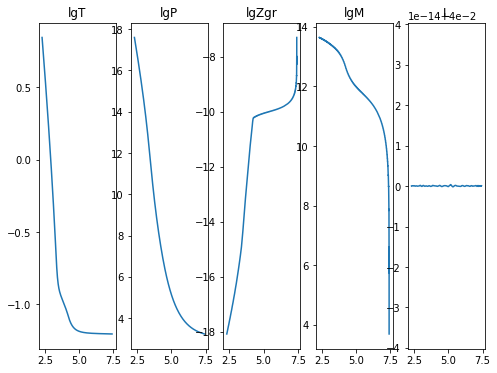

2020-11-18 05:23:23,705 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:23:24,616 __main__ 0/1 INFO :: Perturbation norm: 1.740464603196617
2020-11-18 05:23:24,617 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:23:24,618 __main__ 0/1 INFO :: lgP iterate: 17.58155645290272
2020-11-18 05:23:24,619 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-11-18 05:23:24,619 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950157
2020-11-18 05:23:24,620 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:23:24,621 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


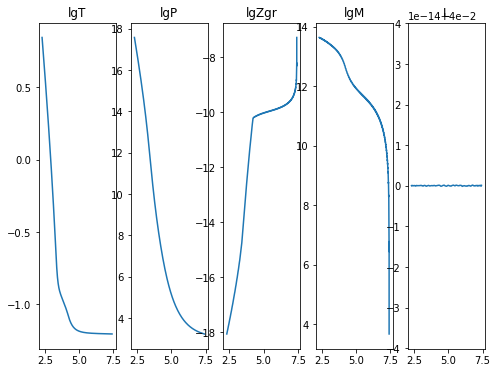

2020-11-18 05:23:28,279 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:23:29,098 __main__ 0/1 INFO :: Perturbation norm: 1.7404646031989972
2020-11-18 05:23:29,099 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:23:29,100 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:23:29,101 __main__ 0/1 INFO :: lgM iterate: 13.641115571532973
2020-11-18 05:23:29,102 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:23:29,103 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:23:29,103 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


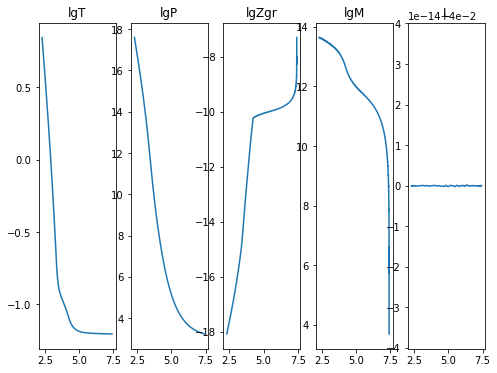

2020-11-18 05:23:32,977 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:23:33,958 __main__ 0/1 INFO :: Perturbation norm: 1.740464603201831
2020-11-18 05:23:33,959 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-11-18 05:23:33,960 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:23:33,961 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:23:33,962 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:23:33,963 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:23:33,964 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


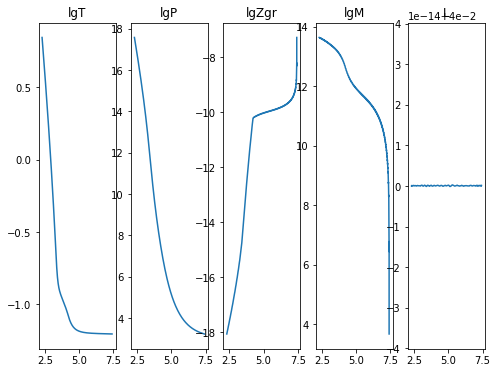

2020-11-18 05:23:37,799 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:23:38,931 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030806
2020-11-18 05:23:38,932 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:23:38,933 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:23:38,934 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-11-18 05:23:38,935 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078643
2020-11-18 05:23:38,936 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:23:38,937 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


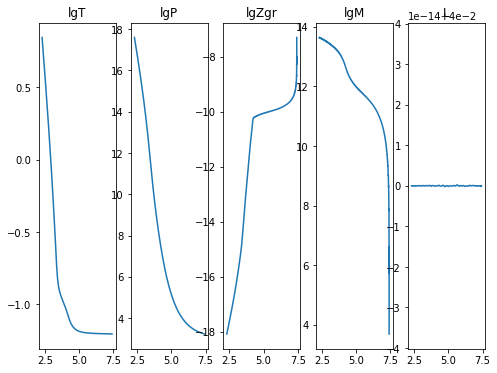

2020-11-18 05:23:42,638 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:23:43,577 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041418
2020-11-18 05:23:43,578 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:23:43,579 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:23:43,579 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-11-18 05:23:43,580 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-11-18 05:23:43,581 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:23:43,582 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


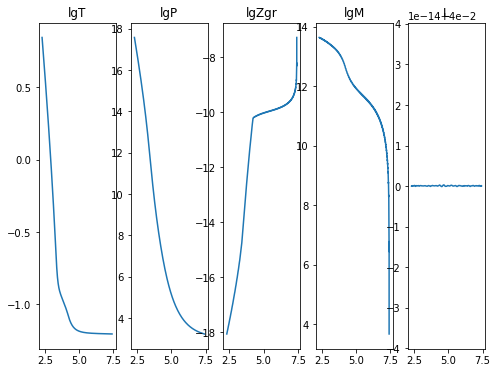

2020-11-18 05:23:47,072 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:23:47,856 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203668
2020-11-18 05:23:47,857 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-11-18 05:23:47,858 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-11-18 05:23:47,859 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-11-18 05:23:47,860 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:23:47,861 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:23:47,862 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


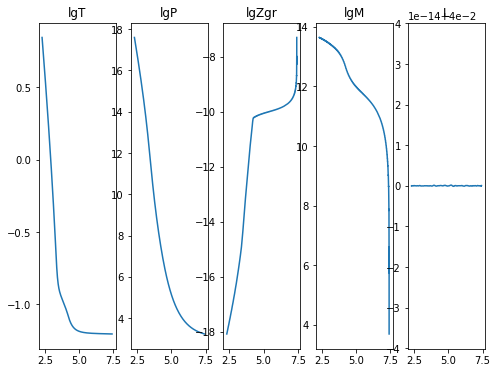

2020-11-18 05:23:51,474 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:23:52,456 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204241
2020-11-18 05:23:52,457 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-11-18 05:23:52,458 __main__ 0/1 INFO :: lgP iterate: 17.58155645290264
2020-11-18 05:23:52,459 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:23:52,460 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:23:52,461 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:23:52,462 __main__ 0/1 INFO :: L iterate: 0.04


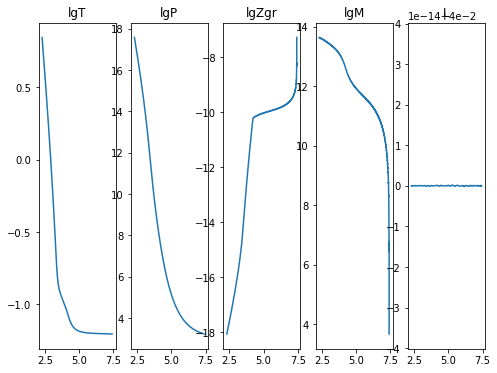

2020-11-18 05:23:56,276 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:23:57,174 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042417
2020-11-18 05:23:57,176 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:23:57,176 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:23:57,177 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:23:57,178 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-11-18 05:23:57,179 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:23:57,180 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


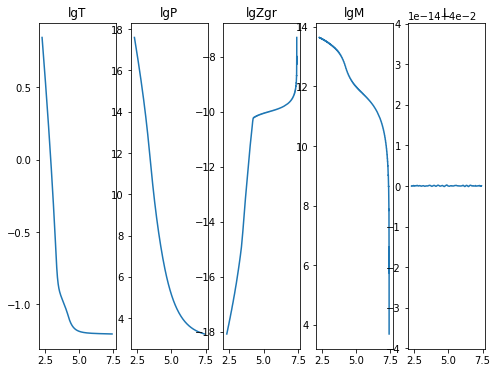

2020-11-18 05:24:01,233 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:24:02,153 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036992
2020-11-18 05:24:02,154 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:24:02,155 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:24:02,156 __main__ 0/1 INFO :: lgM iterate: 13.641074669075147
2020-11-18 05:24:02,157 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-11-18 05:24:02,158 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:24:02,159 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


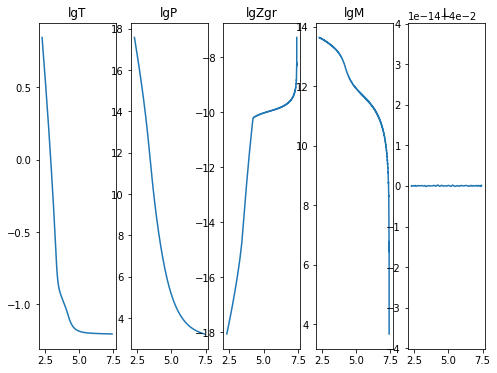

2020-11-18 05:24:05,691 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:24:06,477 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039106
2020-11-18 05:24:06,478 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:24:06,479 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:24:06,480 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-11-18 05:24:06,481 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:24:06,482 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:24:06,483 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


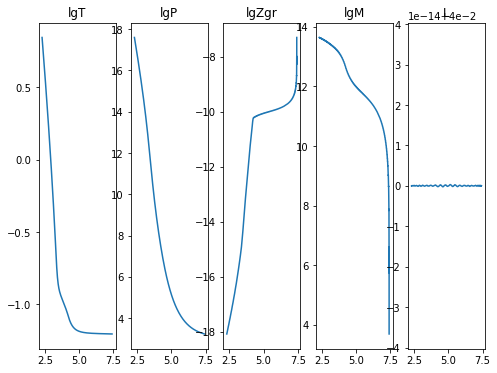

2020-11-18 05:24:10,282 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:24:11,274 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041535
2020-11-18 05:24:11,275 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-11-18 05:24:11,276 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:24:11,277 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-11-18 05:24:11,278 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:24:11,279 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-11-18 05:24:11,280 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


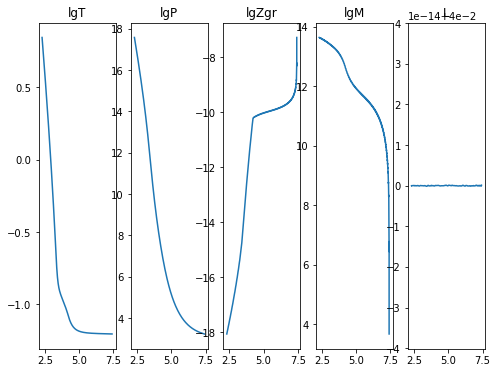

2020-11-18 05:24:14,963 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:24:15,715 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044169
2020-11-18 05:24:15,716 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:24:15,717 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:24:15,718 __main__ 0/1 INFO :: lgM iterate: 13.641115571532985
2020-11-18 05:24:15,719 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-11-18 05:24:15,720 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:24:15,721 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


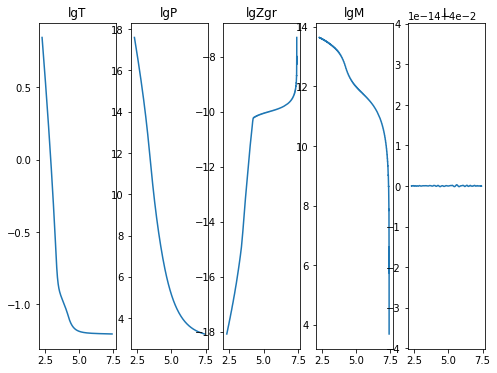

2020-11-18 05:24:19,441 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:24:20,353 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047253
2020-11-18 05:24:20,354 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:24:20,355 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-11-18 05:24:20,356 __main__ 0/1 INFO :: lgM iterate: 13.641074669075097
2020-11-18 05:24:20,356 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-11-18 05:24:20,357 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:24:20,358 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


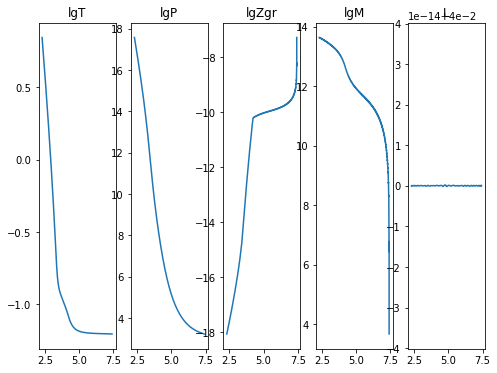

2020-11-18 05:24:23,873 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:24:24,644 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204713
2020-11-18 05:24:24,645 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:24:24,646 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:24:24,647 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:24:24,647 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:24:24,648 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:24:24,649 __main__ 0/1 INFO :: L iterate: 0.04


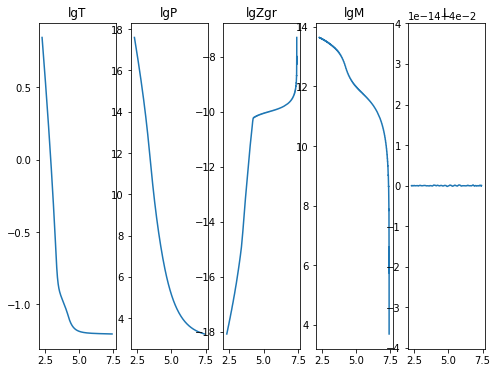

2020-11-18 05:24:28,823 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:24:29,782 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204566
2020-11-18 05:24:29,784 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-11-18 05:24:29,784 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:24:29,785 __main__ 0/1 INFO :: lgM iterate: 13.64107466907519
2020-11-18 05:24:29,786 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950146
2020-11-18 05:24:29,787 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:24:29,788 __main__ 0/1 INFO :: L iterate: 0.04


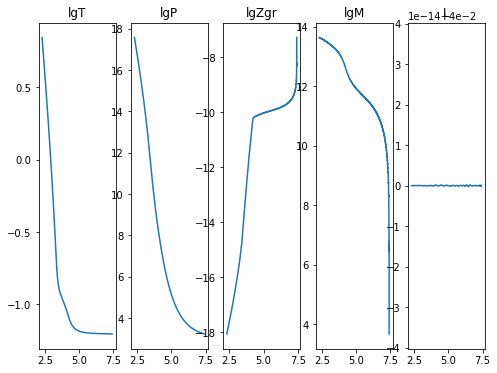

2020-11-18 05:24:33,346 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:24:34,105 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044417
2020-11-18 05:24:34,106 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-11-18 05:24:34,107 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:24:34,108 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:24:34,109 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:24:34,110 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:24:34,111 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


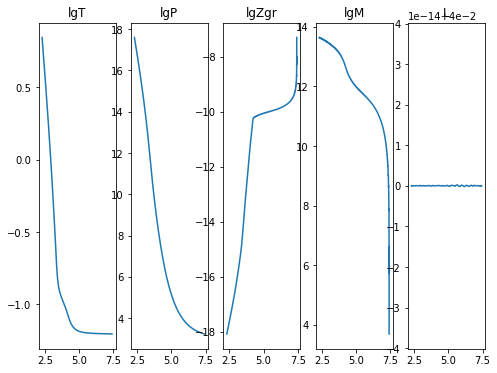

2020-11-18 05:24:37,725 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:24:38,719 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044864
2020-11-18 05:24:38,720 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-11-18 05:24:38,721 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:24:38,722 __main__ 0/1 INFO :: lgM iterate: 13.641074669075163
2020-11-18 05:24:38,723 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950132
2020-11-18 05:24:38,724 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:24:38,725 __main__ 0/1 INFO :: L iterate: 0.04


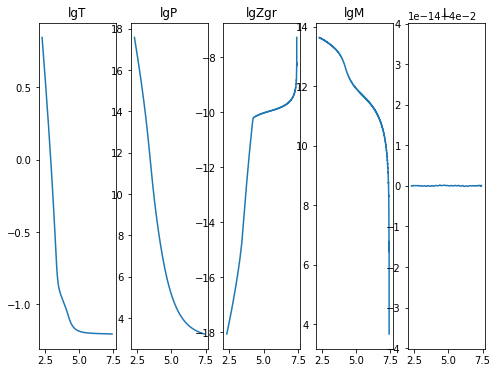

2020-11-18 05:24:42,325 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:24:43,116 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320413
2020-11-18 05:24:43,117 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516507
2020-11-18 05:24:43,118 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:24:43,119 __main__ 0/1 INFO :: lgM iterate: 13.641115571532882
2020-11-18 05:24:43,120 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-11-18 05:24:43,121 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:24:43,122 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


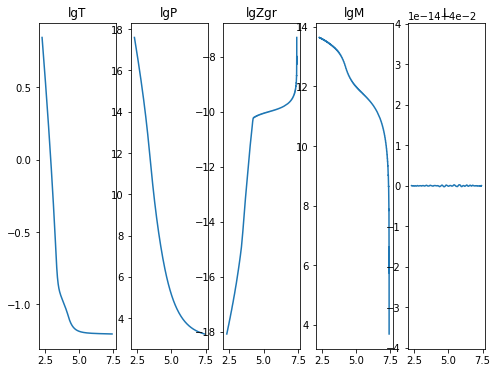

2020-11-18 05:24:46,776 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:24:47,703 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037117
2020-11-18 05:24:47,705 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:24:47,705 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:24:47,706 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:24:47,707 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:24:47,708 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:24:47,709 __main__ 0/1 INFO :: L iterate: 0.04


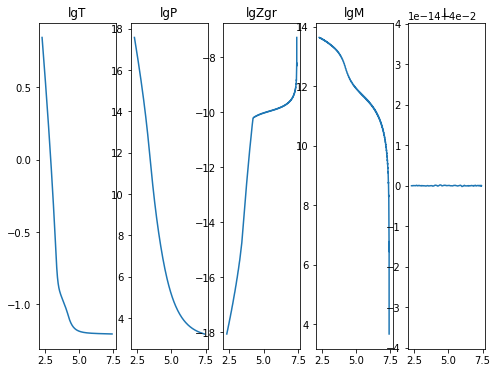

2020-11-18 05:24:51,359 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:24:52,329 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203888
2020-11-18 05:24:52,330 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:24:52,331 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:24:52,332 __main__ 0/1 INFO :: lgM iterate: 13.641115571532914
2020-11-18 05:24:52,333 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:24:52,334 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:24:52,335 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


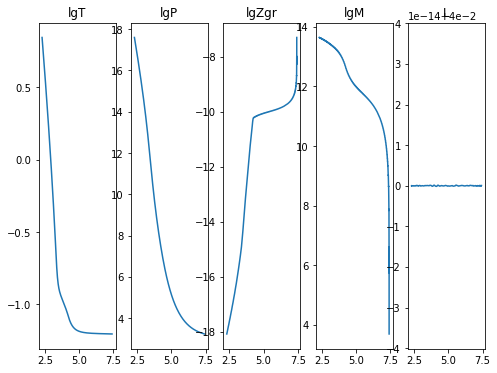

2020-11-18 05:24:56,186 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:24:57,124 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043067
2020-11-18 05:24:57,126 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:24:57,126 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:24:57,127 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-11-18 05:24:57,128 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:24:57,129 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:24:57,130 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


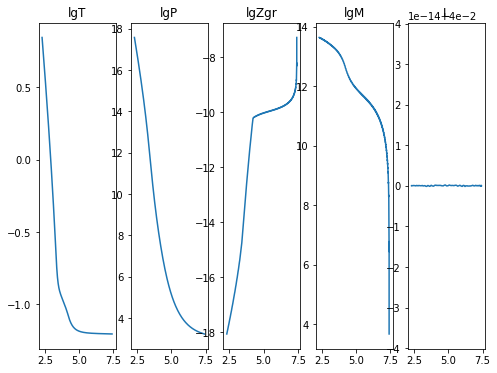

2020-11-18 05:25:00,820 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:25:01,876 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043034
2020-11-18 05:25:01,877 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-11-18 05:25:01,878 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:25:01,879 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-11-18 05:25:01,880 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:25:01,881 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:25:01,881 __main__ 0/1 INFO :: L iterate: 0.04


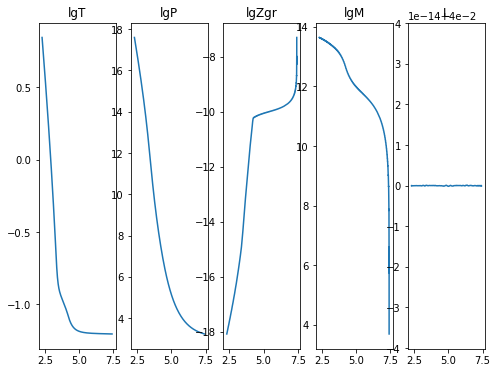

2020-11-18 05:25:06,341 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:25:07,443 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038824
2020-11-18 05:25:07,445 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800341
2020-11-18 05:25:07,446 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:25:07,446 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:25:07,447 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:25:07,448 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:25:07,449 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


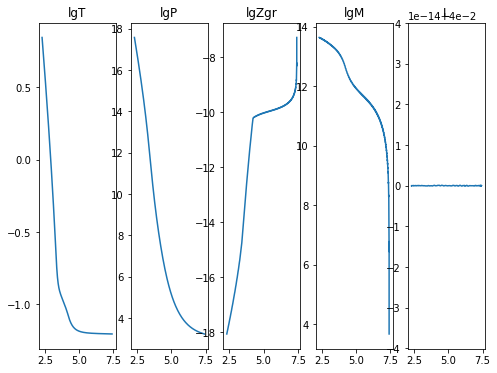

2020-11-18 05:25:11,480 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:25:12,408 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037656
2020-11-18 05:25:12,409 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:25:12,411 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:25:12,411 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:25:12,412 __main__ 0/1 INFO :: lgZgr iterate: -18.0842848950786
2020-11-18 05:25:12,413 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:25:12,414 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


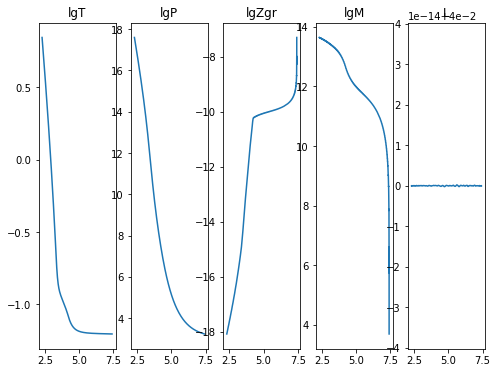

2020-11-18 05:25:16,444 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:25:17,496 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041016
2020-11-18 05:25:17,497 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800343
2020-11-18 05:25:17,498 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:25:17,499 __main__ 0/1 INFO :: lgM iterate: 13.641074669075078
2020-11-18 05:25:17,500 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:25:17,501 __main__ 0/1 INFO :: m iterate: 5.5042563002594136e-05
2020-11-18 05:25:17,502 __main__ 0/1 INFO :: L iterate: 0.04


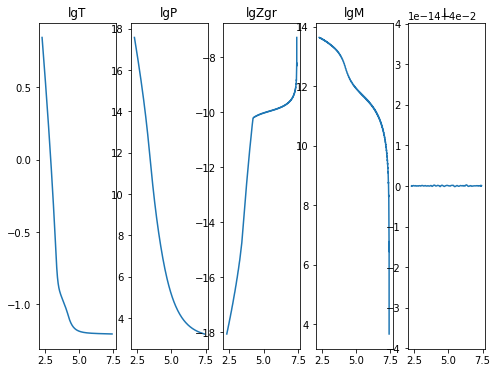

2020-11-18 05:25:21,201 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:25:22,181 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041224
2020-11-18 05:25:22,183 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516513
2020-11-18 05:25:22,184 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:25:22,185 __main__ 0/1 INFO :: lgM iterate: 13.641115571532914
2020-11-18 05:25:22,185 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:25:22,186 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:25:22,187 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


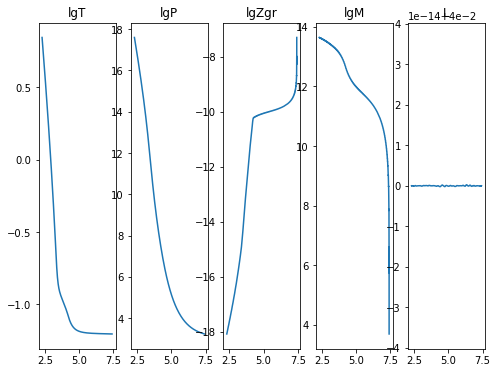

2020-11-18 05:25:26,224 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:25:27,215 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040598
2020-11-18 05:25:27,216 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800327
2020-11-18 05:25:27,217 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:25:27,218 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:25:27,219 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:25:27,221 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:25:27,222 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


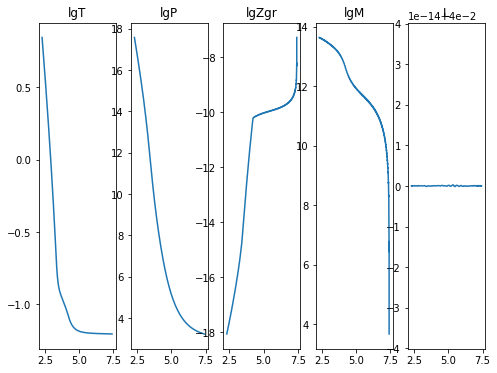

2020-11-18 05:25:31,089 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:25:32,033 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037965
2020-11-18 05:25:32,034 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:25:32,035 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:25:32,035 __main__ 0/1 INFO :: lgM iterate: 13.64111557153294
2020-11-18 05:25:32,036 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:25:32,037 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:25:32,038 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


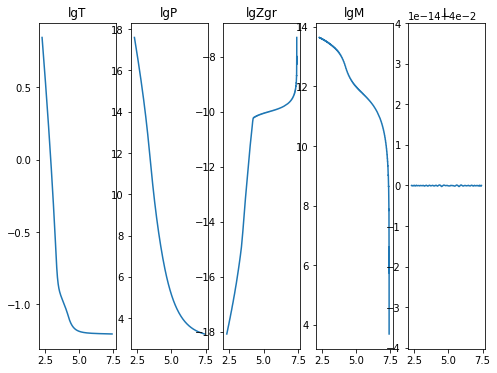

2020-11-18 05:25:35,690 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:25:36,588 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320368
2020-11-18 05:25:36,589 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:25:36,590 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:25:36,591 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-11-18 05:25:36,592 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-11-18 05:25:36,593 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-11-18 05:25:36,594 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


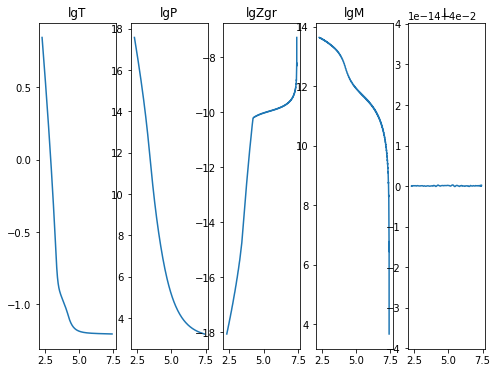

2020-11-18 05:25:40,237 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:25:41,020 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037934
2020-11-18 05:25:41,021 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:25:41,022 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:25:41,023 __main__ 0/1 INFO :: lgM iterate: 13.641115571532959
2020-11-18 05:25:41,023 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:25:41,024 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:25:41,025 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


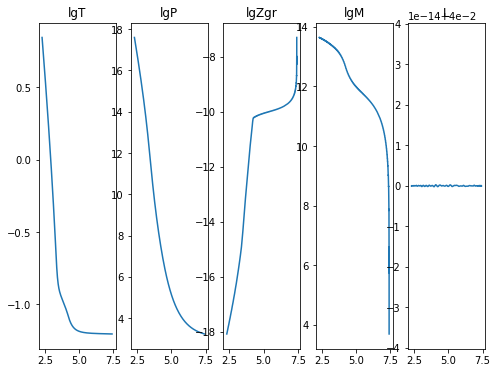

2020-11-18 05:25:44,693 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:25:45,590 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038968
2020-11-18 05:25:45,592 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-11-18 05:25:45,592 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:25:45,593 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-11-18 05:25:45,594 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:25:45,595 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:25:45,596 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


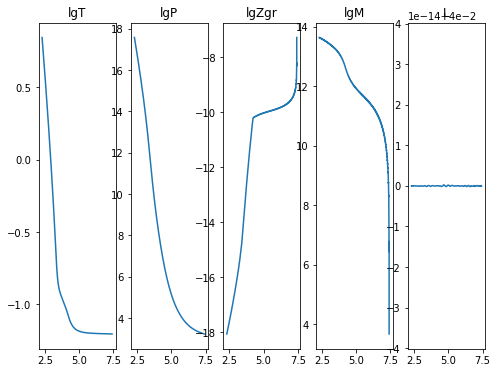

2020-11-18 05:25:49,234 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:25:50,005 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037818
2020-11-18 05:25:50,006 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-11-18 05:25:50,007 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:25:50,008 __main__ 0/1 INFO :: lgM iterate: 13.641115571532893
2020-11-18 05:25:50,009 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078564
2020-11-18 05:25:50,010 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:25:50,010 __main__ 0/1 INFO :: L iterate: 0.04


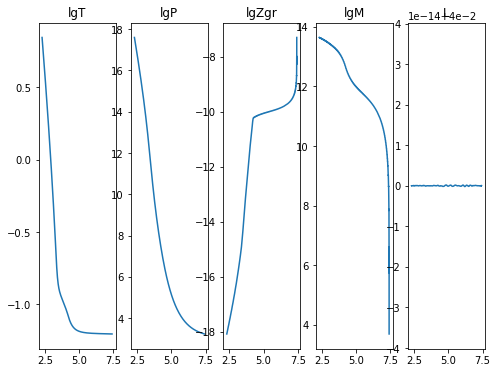

2020-11-18 05:25:53,519 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:25:54,457 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034343
2020-11-18 05:25:54,458 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:25:54,459 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-11-18 05:25:54,460 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-11-18 05:25:54,461 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:25:54,462 __main__ 0/1 INFO :: m iterate: 5.504256301591681e-05
2020-11-18 05:25:54,463 __main__ 0/1 INFO :: L iterate: 0.04


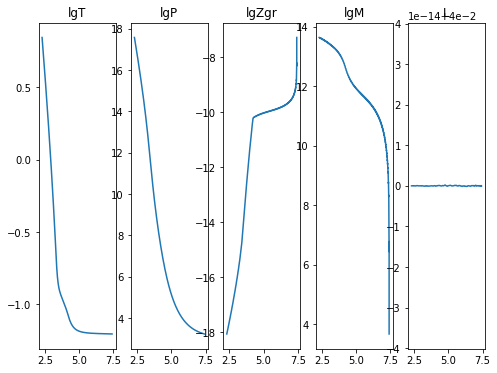

2020-11-18 05:25:58,226 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:25:59,157 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037683
2020-11-18 05:25:59,158 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:25:59,159 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:25:59,159 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:25:59,160 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:25:59,161 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:25:59,162 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


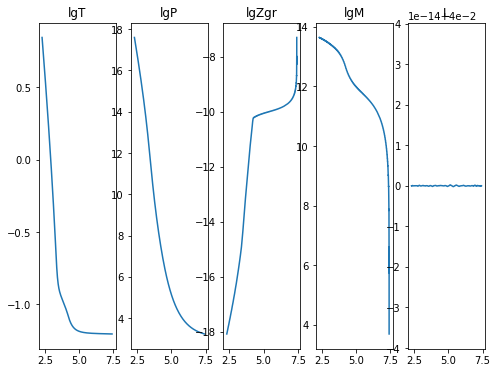

2020-11-18 05:26:02,865 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:26:03,801 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040763
2020-11-18 05:26:03,802 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:26:03,803 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:26:03,803 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:26:03,804 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-11-18 05:26:03,805 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:26:03,806 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


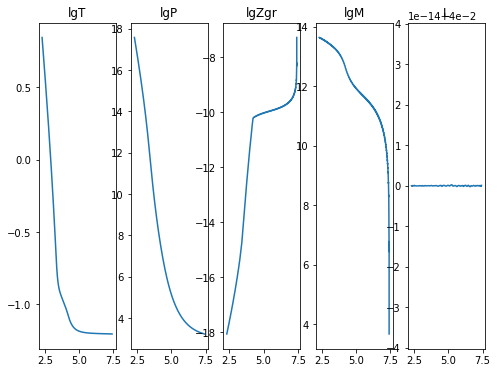

2020-11-18 05:26:07,469 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:26:08,237 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040587
2020-11-18 05:26:08,238 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-11-18 05:26:08,239 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:26:08,240 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-11-18 05:26:08,241 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-11-18 05:26:08,242 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:26:08,242 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


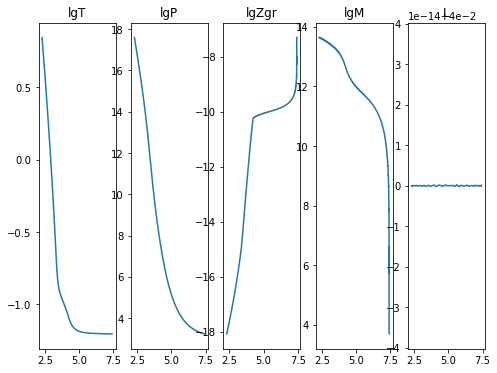

2020-11-18 05:26:11,782 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:26:12,645 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042752
2020-11-18 05:26:12,646 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800359
2020-11-18 05:26:12,647 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:26:12,647 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:26:12,648 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:26:12,649 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:26:12,650 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


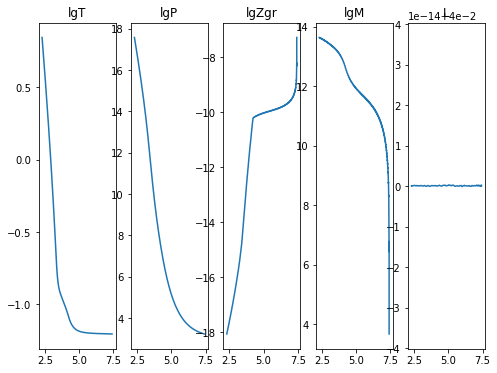

2020-11-18 05:26:16,228 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:26:16,967 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039235
2020-11-18 05:26:16,968 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516513
2020-11-18 05:26:16,969 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:26:16,970 __main__ 0/1 INFO :: lgM iterate: 13.641115571532895
2020-11-18 05:26:16,970 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:26:16,971 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:26:16,972 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


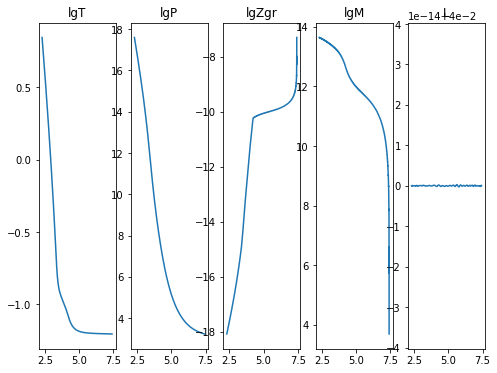

2020-11-18 05:26:20,640 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:26:21,569 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037239
2020-11-18 05:26:21,571 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-11-18 05:26:21,571 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:26:21,572 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:26:21,573 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:26:21,574 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:26:21,575 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


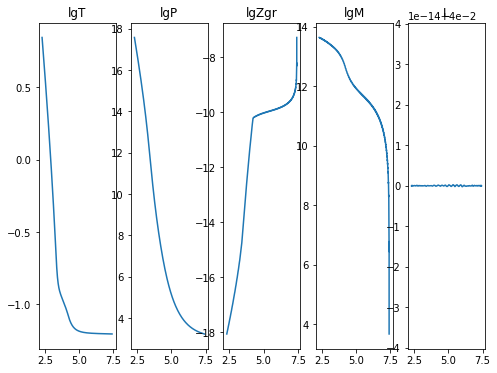

2020-11-18 05:26:25,161 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:26:25,894 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033277
2020-11-18 05:26:25,895 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:26:25,896 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-11-18 05:26:25,897 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-11-18 05:26:25,897 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:26:25,898 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:26:25,899 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


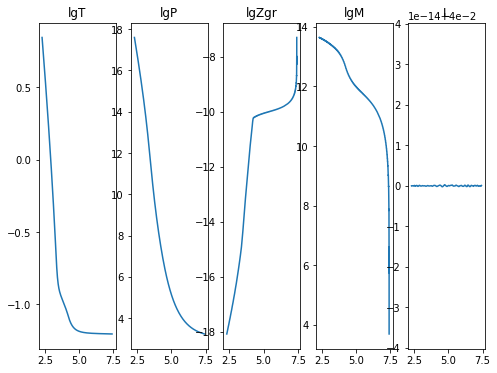

2020-11-18 05:26:30,018 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:26:31,019 __main__ 0/1 INFO :: Perturbation norm: 1.740464603202855
2020-11-18 05:26:31,020 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:26:31,021 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-11-18 05:26:31,022 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:26:31,023 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:26:31,024 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:26:31,025 __main__ 0/1 INFO :: L iterate: 0.040000000000000056


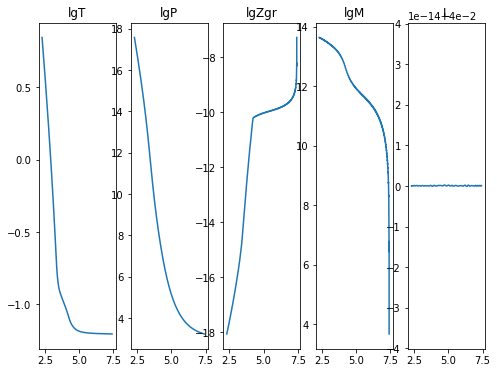

2020-11-18 05:26:34,973 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:26:36,318 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203559
2020-11-18 05:26:36,319 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:26:36,320 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:26:36,321 __main__ 0/1 INFO :: lgM iterate: 13.641115571532913
2020-11-18 05:26:36,322 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:26:36,326 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:26:36,328 __main__ 0/1 INFO :: L iterate: 0.04


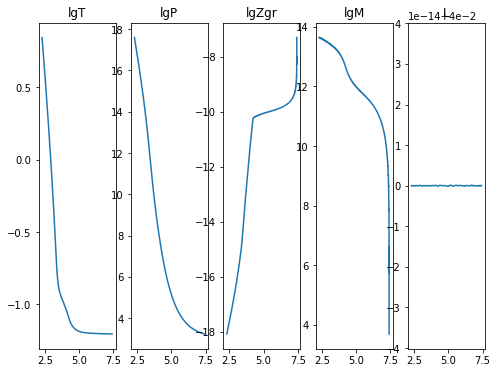

2020-11-18 05:26:40,249 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:26:41,277 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204095
2020-11-18 05:26:41,278 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800383
2020-11-18 05:26:41,279 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:26:41,280 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-11-18 05:26:41,281 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695012
2020-11-18 05:26:41,282 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:26:41,283 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


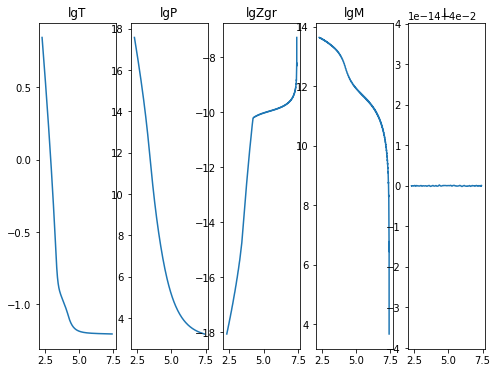

2020-11-18 05:26:45,463 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:26:46,224 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044082
2020-11-18 05:26:46,225 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:26:46,226 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:26:46,239 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:26:46,248 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:26:46,253 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:26:46,266 __main__ 0/1 INFO :: L iterate: 0.04


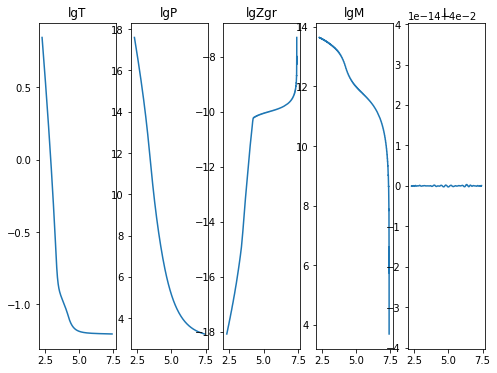

2020-11-18 05:26:49,760 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:26:50,645 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204956
2020-11-18 05:26:50,646 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800331
2020-11-18 05:26:50,647 __main__ 0/1 INFO :: lgP iterate: 17.581556452902642
2020-11-18 05:26:50,648 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:26:50,648 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:26:50,649 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:26:50,650 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


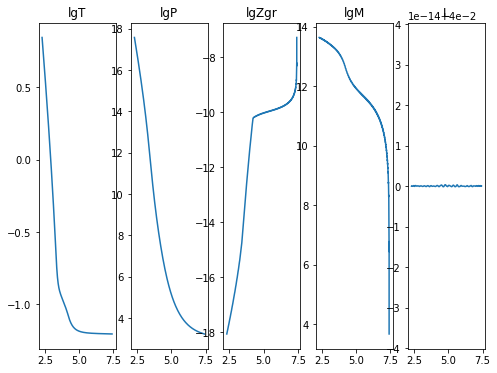

2020-11-18 05:26:54,138 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:26:54,906 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050104
2020-11-18 05:26:54,907 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:26:54,908 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-11-18 05:26:54,908 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:26:54,909 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:26:54,910 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:26:54,911 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


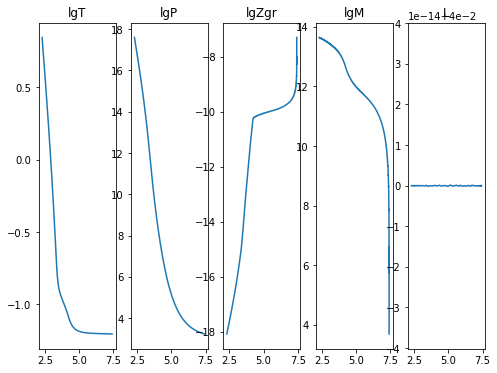

2020-11-18 05:26:58,484 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:26:59,452 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205051
2020-11-18 05:26:59,453 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:26:59,454 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:26:59,455 __main__ 0/1 INFO :: lgM iterate: 13.641074669075097
2020-11-18 05:26:59,455 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:26:59,456 __main__ 0/1 INFO :: m iterate: 5.504256300170596e-05
2020-11-18 05:26:59,457 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


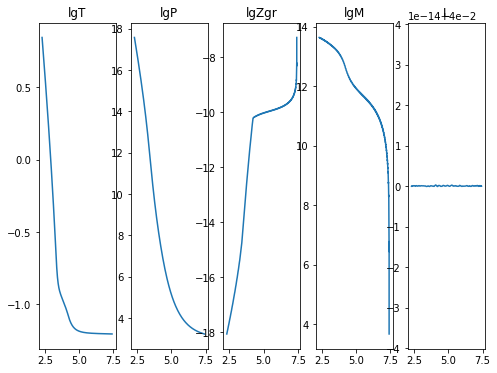

2020-11-18 05:27:03,088 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:03,934 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049116
2020-11-18 05:27:03,935 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:27:03,936 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:27:03,937 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:27:03,938 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:27:03,939 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:27:03,940 __main__ 0/1 INFO :: L iterate: 0.04


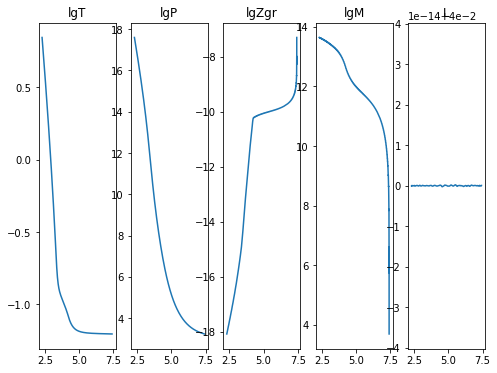

2020-11-18 05:27:07,587 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:08,509 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048938
2020-11-18 05:27:08,510 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-11-18 05:27:08,511 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:27:08,512 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-11-18 05:27:08,513 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:27:08,514 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-11-18 05:27:08,514 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


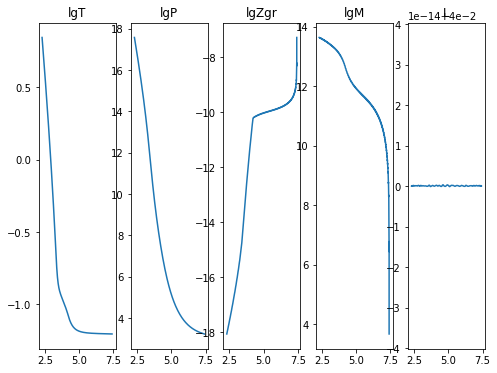

2020-11-18 05:27:12,597 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:27:13,335 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044675
2020-11-18 05:27:13,336 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-11-18 05:27:13,337 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:27:13,338 __main__ 0/1 INFO :: lgM iterate: 13.641115571532902
2020-11-18 05:27:13,338 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:27:13,339 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:27:13,340 __main__ 0/1 INFO :: L iterate: 0.04


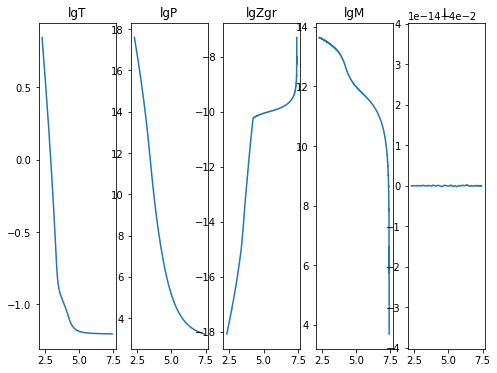

2020-11-18 05:27:16,869 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:27:17,790 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041162
2020-11-18 05:27:17,791 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-11-18 05:27:17,792 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:27:17,805 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:27:17,812 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:27:17,813 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:27:17,814 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


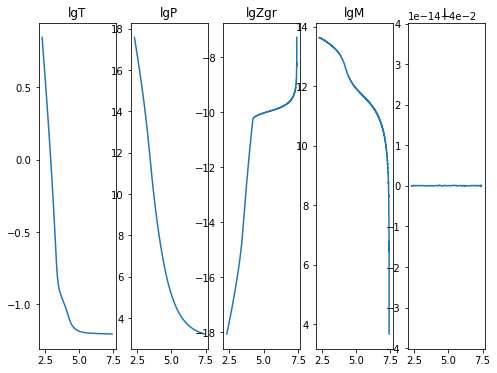

2020-11-18 05:27:21,608 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:22,360 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041267
2020-11-18 05:27:22,361 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-11-18 05:27:22,362 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:27:22,362 __main__ 0/1 INFO :: lgM iterate: 13.641115571532918
2020-11-18 05:27:22,363 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:27:22,364 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:27:22,365 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


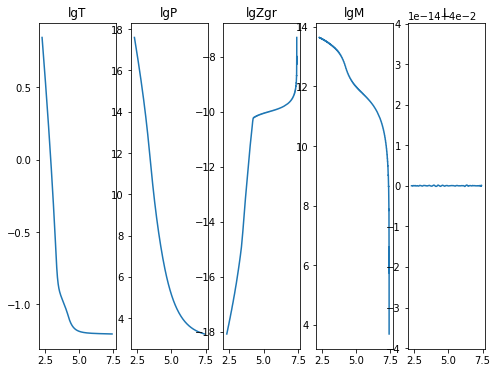

2020-11-18 05:27:26,171 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:27:27,190 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040527
2020-11-18 05:27:27,191 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800385
2020-11-18 05:27:27,192 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:27:27,193 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:27:27,193 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:27:27,194 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-11-18 05:27:27,195 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


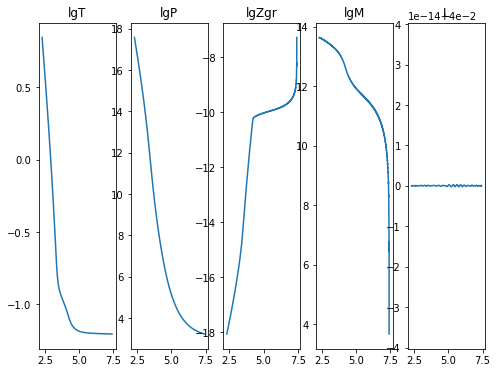

2020-11-18 05:27:30,847 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:31,783 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042512
2020-11-18 05:27:31,785 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:27:31,785 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:27:31,786 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-11-18 05:27:31,787 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:27:31,787 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:27:31,788 __main__ 0/1 INFO :: L iterate: 0.03999999999999996


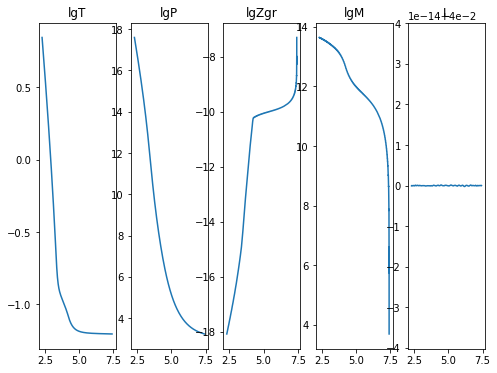

2020-11-18 05:27:35,393 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:27:36,310 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204385
2020-11-18 05:27:36,311 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-11-18 05:27:36,312 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:27:36,312 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:27:36,313 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:27:36,314 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:27:36,314 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


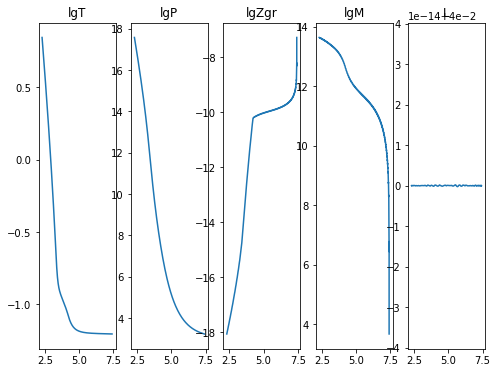

2020-11-18 05:27:39,921 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:27:41,089 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039788
2020-11-18 05:27:41,091 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:27:41,092 __main__ 0/1 INFO :: lgP iterate: 17.596817720253274
2020-11-18 05:27:41,093 __main__ 0/1 INFO :: lgM iterate: 13.641115571532923
2020-11-18 05:27:41,094 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:27:41,096 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:27:41,097 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


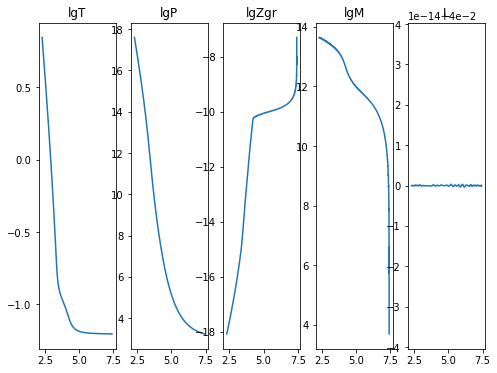

2020-11-18 05:27:44,693 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:45,628 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040336
2020-11-18 05:27:45,629 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-11-18 05:27:45,630 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:27:45,631 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:27:45,632 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:27:45,633 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:27:45,634 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


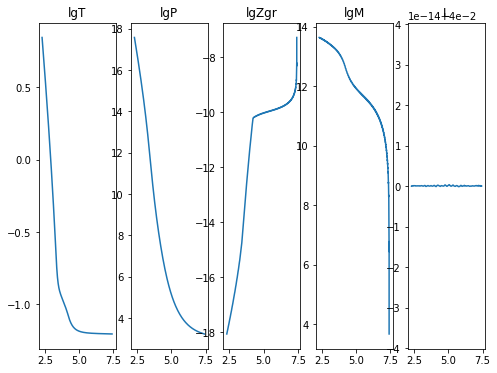

2020-11-18 05:27:49,282 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:27:50,074 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046427
2020-11-18 05:27:50,075 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516545
2020-11-18 05:27:50,076 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-11-18 05:27:50,077 __main__ 0/1 INFO :: lgM iterate: 13.641115571532975
2020-11-18 05:27:50,078 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-11-18 05:27:50,079 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:27:50,080 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


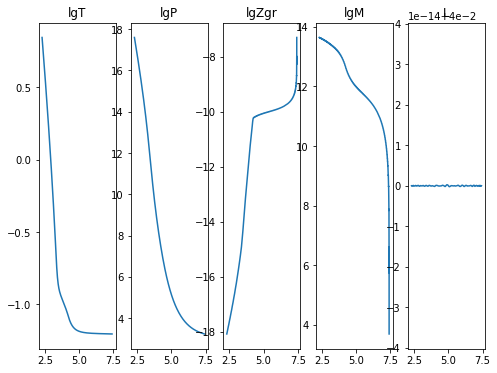

2020-11-18 05:27:53,709 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:27:54,636 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204761
2020-11-18 05:27:54,637 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:27:54,637 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:27:54,638 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:27:54,639 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:27:54,640 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:27:54,641 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


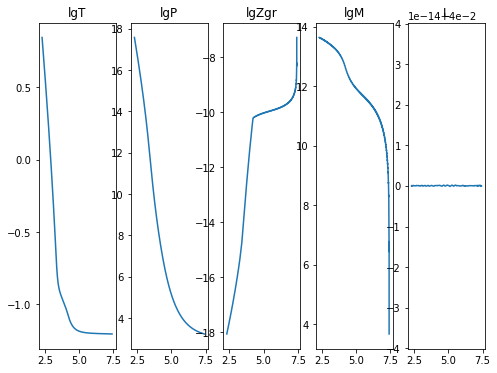

2020-11-18 05:27:58,136 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:27:58,875 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044429
2020-11-18 05:27:58,876 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516512
2020-11-18 05:27:58,877 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:27:58,877 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:27:58,878 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:27:58,879 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:27:58,880 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


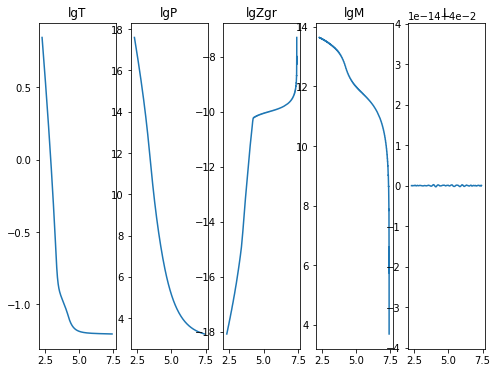

2020-11-18 05:28:02,381 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:28:03,269 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043027
2020-11-18 05:28:03,270 __main__ 0/1 INFO :: lgT iterate: 0.844929764780035
2020-11-18 05:28:03,271 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:28:03,271 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-11-18 05:28:03,272 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:28:03,273 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:28:03,274 __main__ 0/1 INFO :: L iterate: 0.04


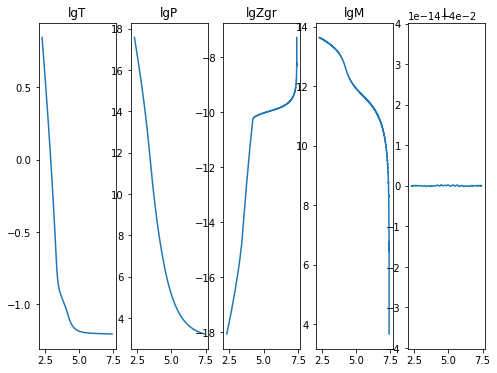

2020-11-18 05:28:06,678 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:28:07,408 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041817
2020-11-18 05:28:07,409 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-11-18 05:28:07,410 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:28:07,411 __main__ 0/1 INFO :: lgM iterate: 13.641115571532913
2020-11-18 05:28:07,412 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:28:07,413 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:28:07,414 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


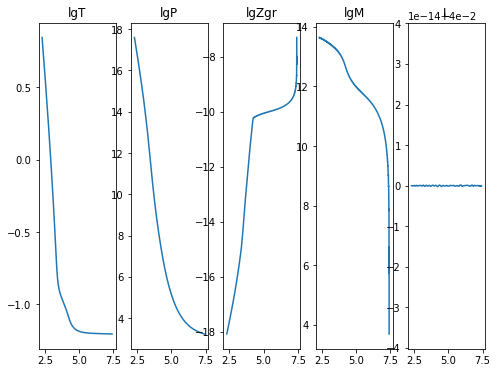

2020-11-18 05:28:10,881 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:28:11,761 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204034
2020-11-18 05:28:11,763 __main__ 0/1 INFO :: lgT iterate: 0.844929764780034
2020-11-18 05:28:11,763 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:28:11,764 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:28:11,765 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:28:11,766 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:28:11,766 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


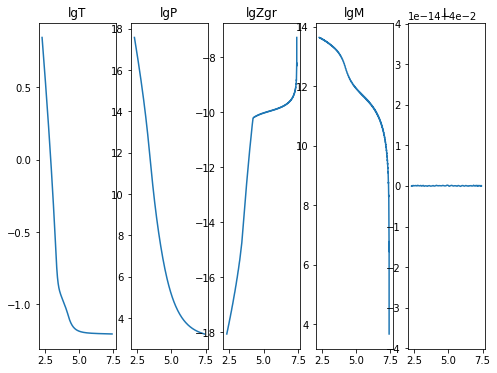

2020-11-18 05:28:15,185 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:28:15,903 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043642
2020-11-18 05:28:15,904 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:28:15,905 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:28:15,906 __main__ 0/1 INFO :: lgM iterate: 13.641115571532902
2020-11-18 05:28:15,907 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:28:15,908 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:28:15,909 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


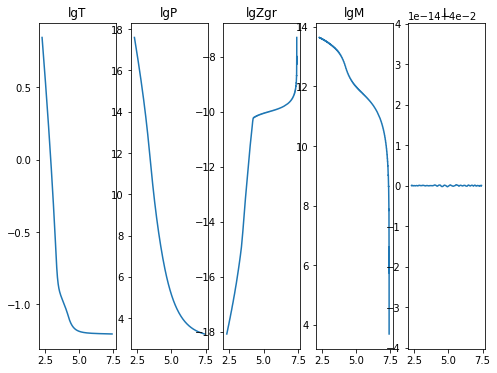

2020-11-18 05:28:19,382 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:28:20,327 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045104
2020-11-18 05:28:20,328 __main__ 0/1 INFO :: lgT iterate: 0.844929764780038
2020-11-18 05:28:20,328 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:28:20,329 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-11-18 05:28:20,330 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:28:20,330 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:28:20,331 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


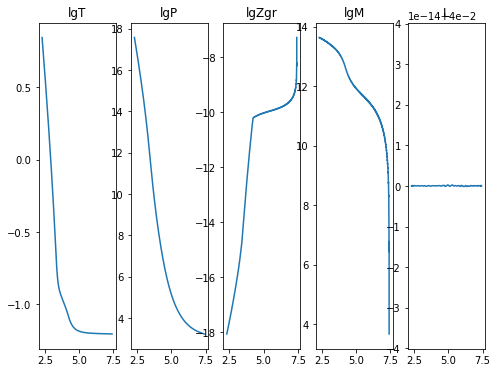

2020-11-18 05:28:23,743 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:28:24,468 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204728
2020-11-18 05:28:24,470 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-11-18 05:28:24,470 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:28:24,471 __main__ 0/1 INFO :: lgM iterate: 13.641115571532907
2020-11-18 05:28:24,472 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:28:24,472 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:28:24,473 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


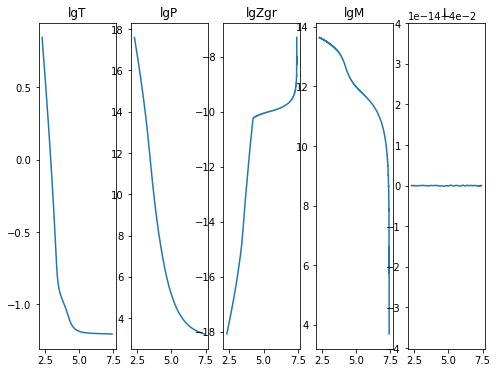

2020-11-18 05:28:28,129 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:28:29,064 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205198
2020-11-18 05:28:29,066 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-11-18 05:28:29,066 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:28:29,067 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:28:29,068 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950064
2020-11-18 05:28:29,069 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:28:29,070 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


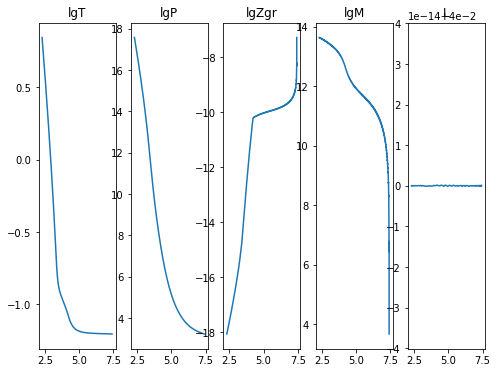

2020-11-18 05:28:32,899 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:28:33,692 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048667
2020-11-18 05:28:33,693 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:28:33,694 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:28:33,694 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:28:33,695 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:28:33,696 __main__ 0/1 INFO :: m iterate: 5.587645172422384e-05
2020-11-18 05:28:33,697 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


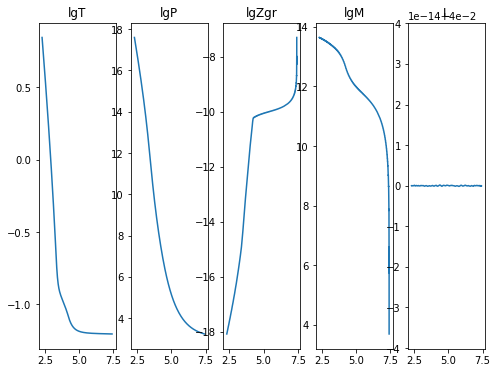

2020-11-18 05:28:37,502 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:28:38,603 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045203
2020-11-18 05:28:38,604 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:28:38,605 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:28:38,606 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:28:38,607 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:28:38,608 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:28:38,609 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


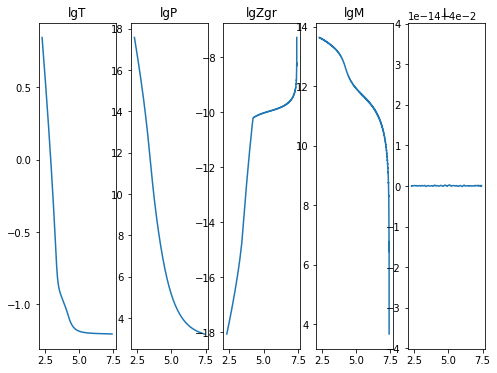

2020-11-18 05:28:42,411 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:28:43,222 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039466
2020-11-18 05:28:43,224 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-11-18 05:28:43,225 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:28:43,225 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:28:43,226 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:28:43,227 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:28:43,228 __main__ 0/1 INFO :: L iterate: 0.04


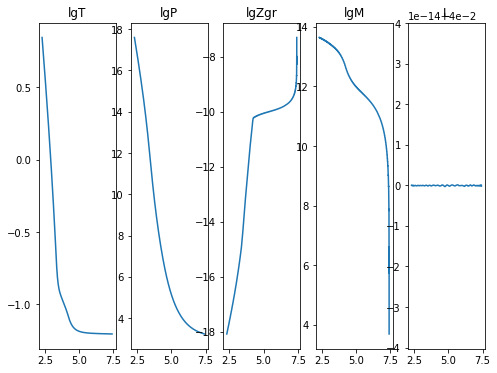

2020-11-18 05:28:47,167 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:28:48,075 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203694
2020-11-18 05:28:48,076 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:28:48,077 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:28:48,078 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:28:48,078 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:28:48,079 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:28:48,080 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


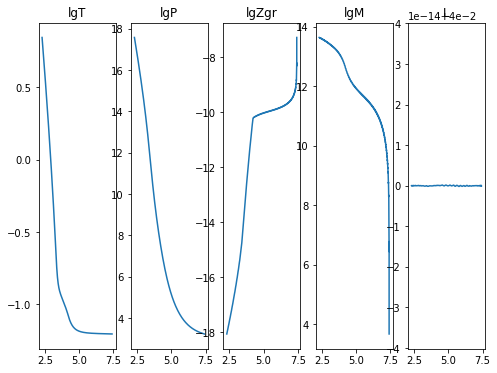

2020-11-18 05:28:51,621 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:28:52,356 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040578
2020-11-18 05:28:52,357 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:28:52,358 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:28:52,358 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-11-18 05:28:52,359 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-11-18 05:28:52,360 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-11-18 05:28:52,361 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


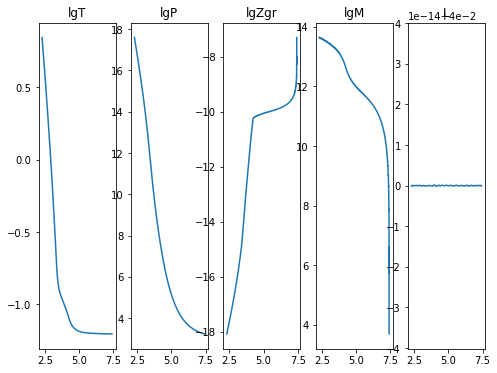

2020-11-18 05:28:55,915 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:28:56,821 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039381
2020-11-18 05:28:56,822 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:28:56,822 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:28:56,823 __main__ 0/1 INFO :: lgM iterate: 13.641074669075149
2020-11-18 05:28:56,824 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-11-18 05:28:56,825 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:28:56,825 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


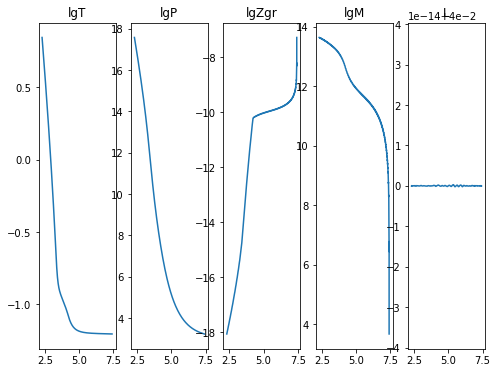

2020-11-18 05:29:00,407 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:29:01,214 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037958
2020-11-18 05:29:01,215 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-11-18 05:29:01,216 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:29:01,216 __main__ 0/1 INFO :: lgM iterate: 13.641115571532959
2020-11-18 05:29:01,217 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:29:01,218 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:29:01,219 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


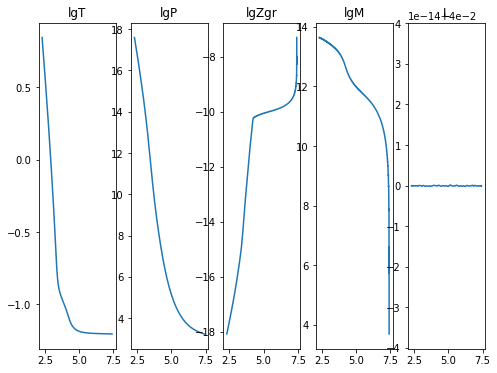

2020-11-18 05:29:04,940 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:29:05,841 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037319
2020-11-18 05:29:05,842 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800368
2020-11-18 05:29:05,842 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:29:05,843 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:29:05,844 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:29:05,844 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-11-18 05:29:05,845 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


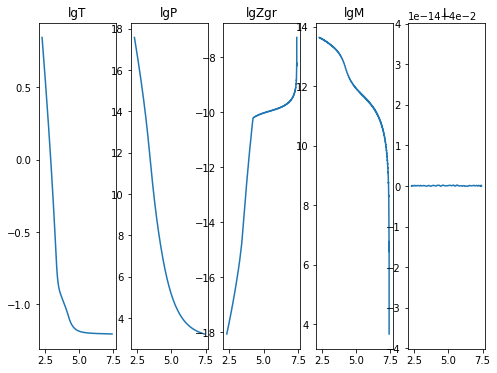

2020-11-18 05:29:09,497 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:29:10,234 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034745
2020-11-18 05:29:10,236 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:29:10,236 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:29:10,237 __main__ 0/1 INFO :: lgM iterate: 13.641115571532916
2020-11-18 05:29:10,238 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:29:10,239 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:29:10,239 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


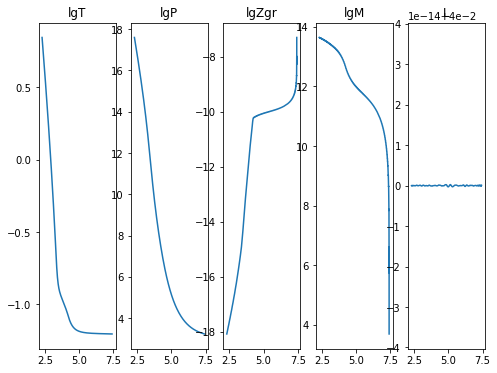

2020-11-18 05:29:13,870 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:29:14,826 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033082
2020-11-18 05:29:14,827 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-11-18 05:29:14,830 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:29:14,831 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-11-18 05:29:14,832 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:29:14,833 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:29:14,834 __main__ 0/1 INFO :: L iterate: 0.04


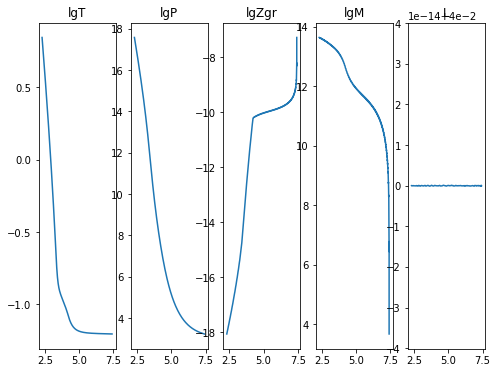

2020-11-18 05:29:18,510 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:29:19,329 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036784
2020-11-18 05:29:19,330 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-11-18 05:29:19,331 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:29:19,332 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-11-18 05:29:19,333 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-11-18 05:29:19,334 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:29:19,335 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


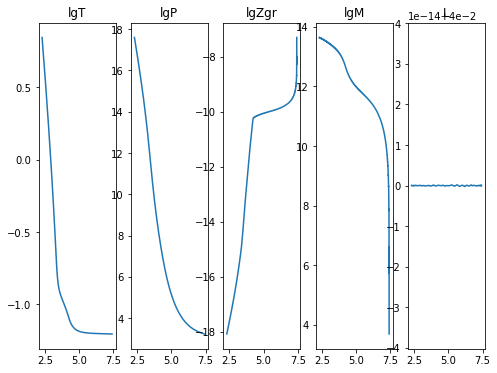

2020-11-18 05:29:23,744 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:29:25,178 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041264
2020-11-18 05:29:25,179 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800373
2020-11-18 05:29:25,180 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:29:25,181 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-11-18 05:29:25,182 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:29:25,182 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:29:25,183 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


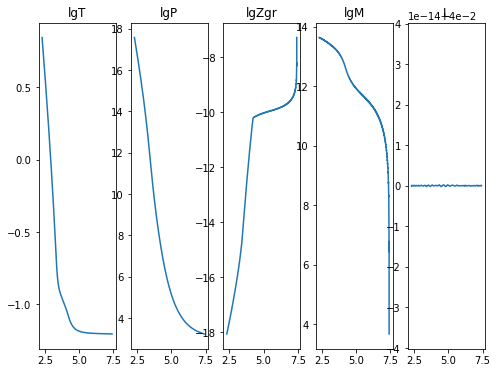

2020-11-18 05:29:29,140 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:29:29,989 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203383
2020-11-18 05:29:29,990 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516507
2020-11-18 05:29:29,991 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:29:29,992 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-11-18 05:29:29,992 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:29:29,993 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:29:29,994 __main__ 0/1 INFO :: L iterate: 0.04


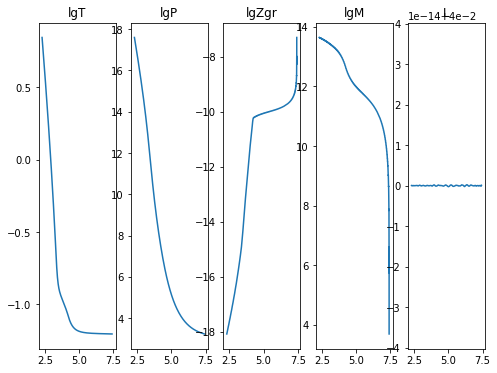

2020-11-18 05:29:33,659 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:29:34,606 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203023
2020-11-18 05:29:34,607 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-11-18 05:29:34,608 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:29:34,609 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:29:34,610 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:29:34,611 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:29:34,611 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


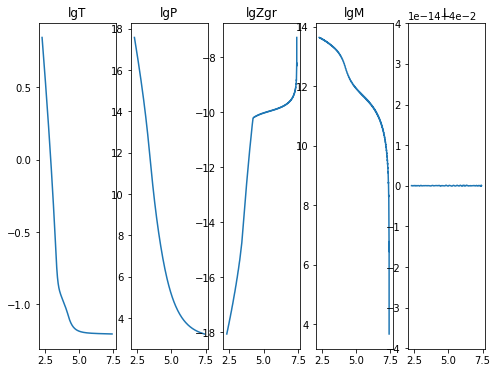

2020-11-18 05:29:38,248 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:29:39,070 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037436
2020-11-18 05:29:39,071 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:29:39,072 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:29:39,073 __main__ 0/1 INFO :: lgM iterate: 13.641115571532996
2020-11-18 05:29:39,074 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078657
2020-11-18 05:29:39,074 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:29:39,075 __main__ 0/1 INFO :: L iterate: 0.04


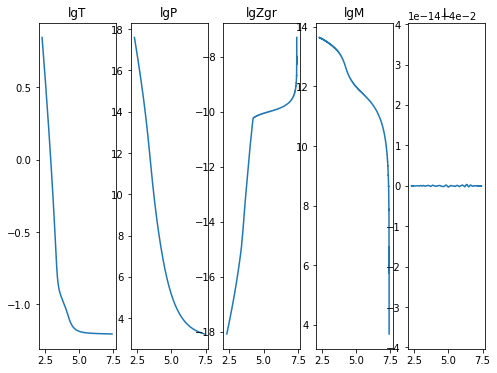

2020-11-18 05:29:43,142 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:29:44,221 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043174
2020-11-18 05:29:44,222 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:29:44,224 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:29:44,224 __main__ 0/1 INFO :: lgM iterate: 13.641074669075069
2020-11-18 05:29:44,225 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950047
2020-11-18 05:29:44,226 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:29:44,227 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


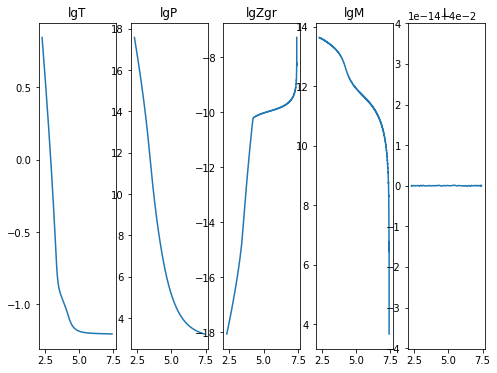

2020-11-18 05:29:47,781 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:29:48,518 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204295
2020-11-18 05:29:48,519 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:29:48,520 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-11-18 05:29:48,521 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:29:48,521 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:29:48,522 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:29:48,523 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


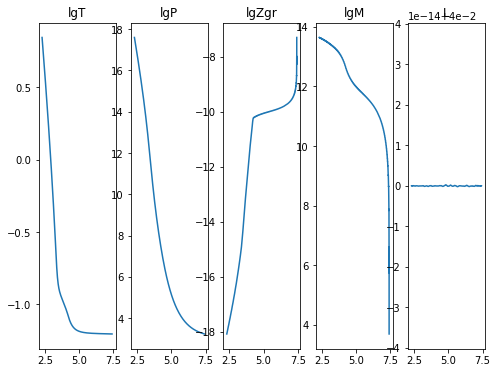

2020-11-18 05:29:52,584 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:29:53,507 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204324
2020-11-18 05:29:53,508 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:29:53,509 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:29:53,510 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:29:53,510 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:29:53,511 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:29:53,512 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


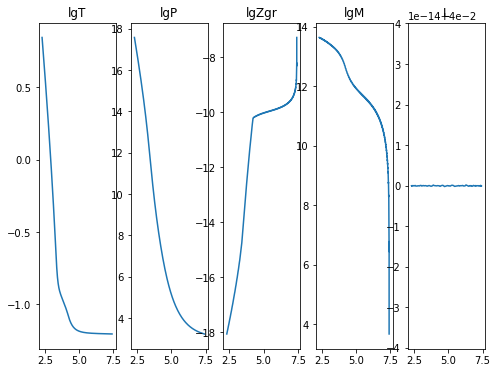

2020-11-18 05:29:57,202 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:29:58,041 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046833
2020-11-18 05:29:58,042 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:29:58,043 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:29:58,044 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-11-18 05:29:58,045 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:29:58,046 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:29:58,047 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


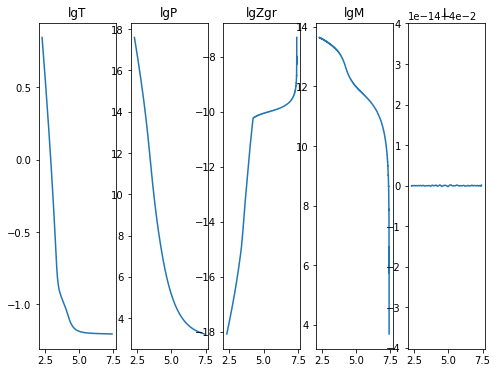

2020-11-18 05:30:01,767 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:30:02,773 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047881
2020-11-18 05:30:02,774 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:30:02,775 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:30:02,775 __main__ 0/1 INFO :: lgM iterate: 13.641074669075149
2020-11-18 05:30:02,776 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950143
2020-11-18 05:30:02,777 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:30:02,778 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


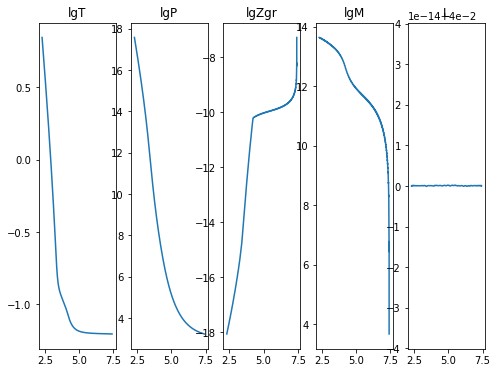

2020-11-18 05:30:06,470 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:07,209 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048445
2020-11-18 05:30:07,210 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:30:07,211 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:30:07,212 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-11-18 05:30:07,213 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-11-18 05:30:07,214 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:30:07,215 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


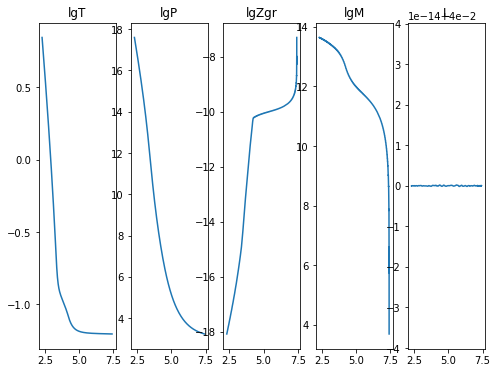

2020-11-18 05:30:10,756 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:11,759 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050757
2020-11-18 05:30:11,760 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:30:11,761 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:30:11,761 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-11-18 05:30:11,762 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:30:11,763 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:30:11,764 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


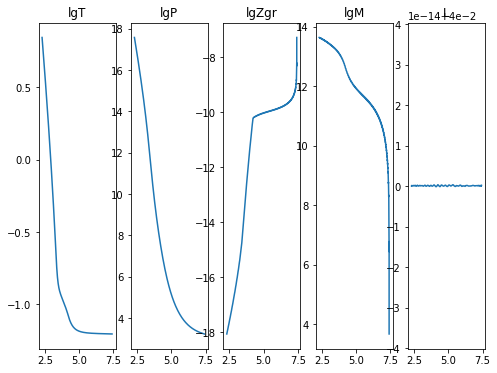

2020-11-18 05:30:15,408 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:16,275 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204574
2020-11-18 05:30:16,282 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:30:16,283 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:30:16,285 __main__ 0/1 INFO :: lgM iterate: 13.641115571533037
2020-11-18 05:30:16,286 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078685
2020-11-18 05:30:16,287 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:30:16,288 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


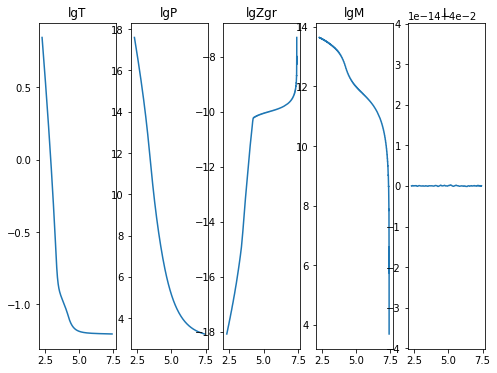

2020-11-18 05:30:20,022 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:30:20,928 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042446
2020-11-18 05:30:20,930 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:30:20,931 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:30:20,931 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:30:20,932 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950064
2020-11-18 05:30:20,933 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:30:20,934 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


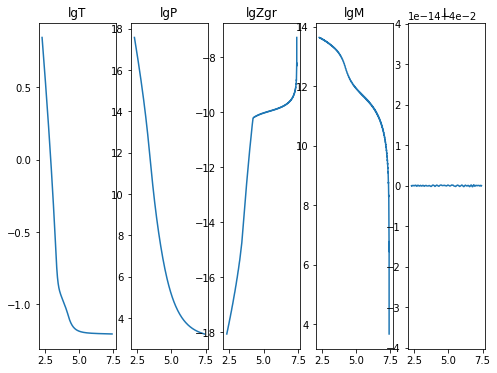

2020-11-18 05:30:24,418 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:25,146 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041646
2020-11-18 05:30:25,147 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:30:25,148 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:30:25,148 __main__ 0/1 INFO :: lgM iterate: 13.641115571532882
2020-11-18 05:30:25,149 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507858
2020-11-18 05:30:25,150 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:30:25,151 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


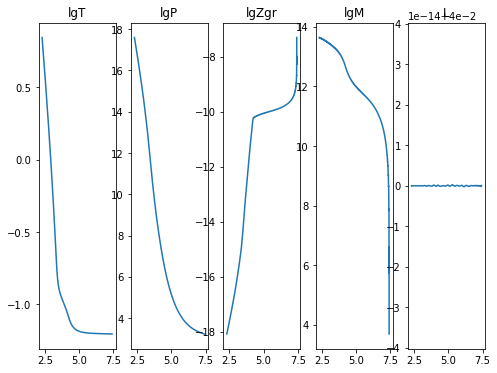

2020-11-18 05:30:28,691 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:29,587 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038413
2020-11-18 05:30:29,588 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-11-18 05:30:29,589 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:30:29,590 __main__ 0/1 INFO :: lgM iterate: 13.641074669075078
2020-11-18 05:30:29,591 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:30:29,592 __main__ 0/1 INFO :: m iterate: 5.5042563015028634e-05
2020-11-18 05:30:29,593 __main__ 0/1 INFO :: L iterate: 0.04


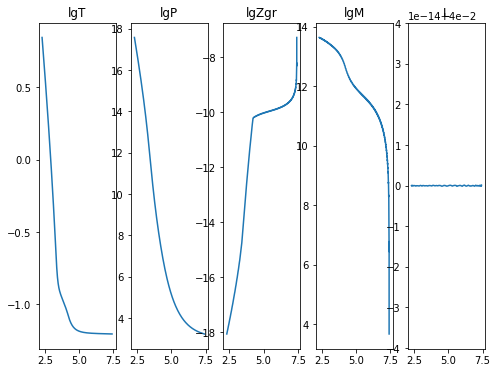

2020-11-18 05:30:33,040 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:30:33,760 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040525
2020-11-18 05:30:33,761 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:30:33,762 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:30:33,763 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-11-18 05:30:33,764 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-11-18 05:30:33,765 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:30:33,766 __main__ 0/1 INFO :: L iterate: 0.04


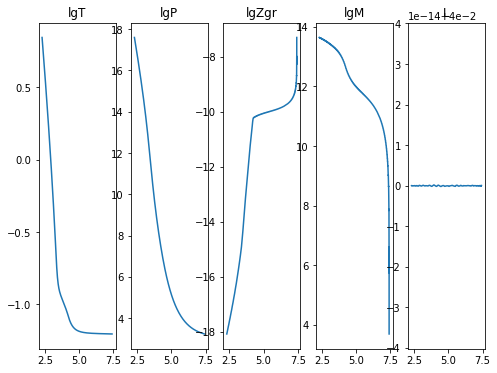

2020-11-18 05:30:37,266 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:30:38,172 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043714
2020-11-18 05:30:38,173 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-11-18 05:30:38,174 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:30:38,175 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:30:38,176 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:30:38,177 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:30:38,178 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


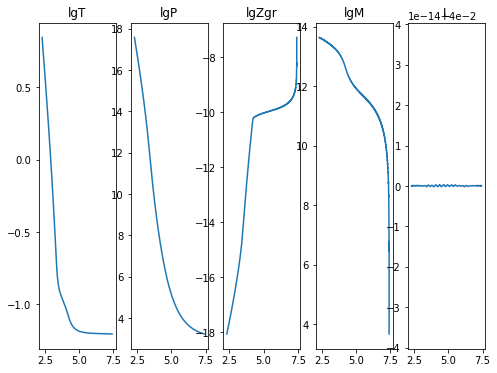

2020-11-18 05:30:41,661 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:30:42,377 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204126
2020-11-18 05:30:42,378 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:30:42,379 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:30:42,380 __main__ 0/1 INFO :: lgM iterate: 13.641115571532893
2020-11-18 05:30:42,381 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-11-18 05:30:42,382 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:30:42,383 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


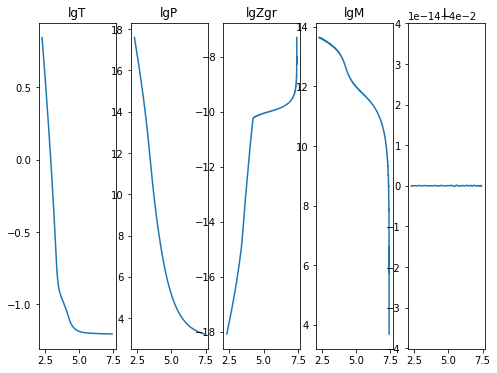

2020-11-18 05:30:45,874 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:30:46,847 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041515
2020-11-18 05:30:46,848 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:30:46,849 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:30:46,850 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-11-18 05:30:46,851 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:30:46,852 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:30:46,853 __main__ 0/1 INFO :: L iterate: 0.04


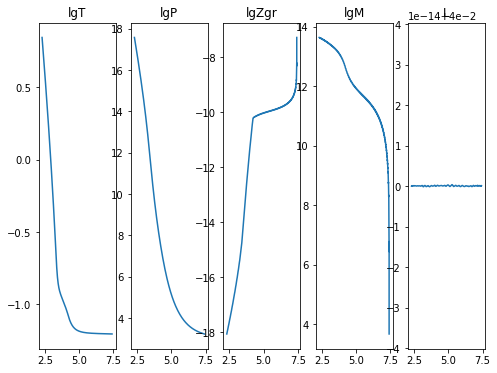

2020-11-18 05:30:50,440 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:30:51,209 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039746
2020-11-18 05:30:51,210 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:30:51,215 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:30:51,216 __main__ 0/1 INFO :: lgM iterate: 13.641115571532906
2020-11-18 05:30:51,217 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-11-18 05:30:51,217 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:30:51,218 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


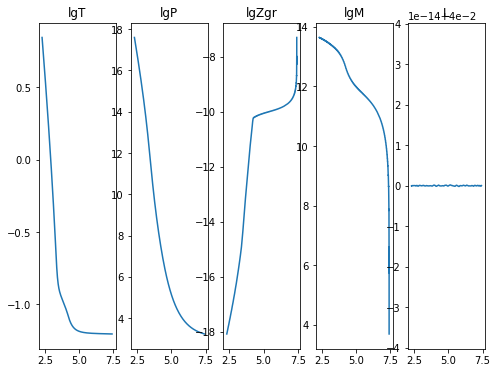

2020-11-18 05:30:54,973 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:30:56,282 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034514
2020-11-18 05:30:56,283 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:30:56,284 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:30:56,285 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:30:56,286 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:30:56,287 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:30:56,288 __main__ 0/1 INFO :: L iterate: 0.04


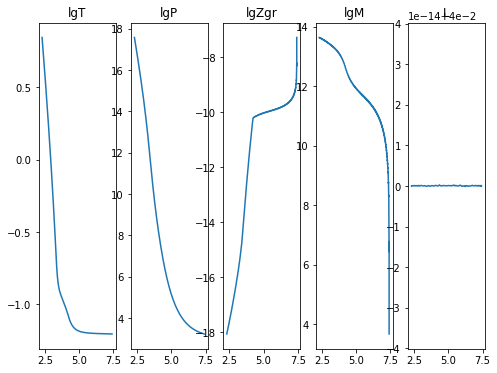

2020-11-18 05:31:00,613 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:31:01,688 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203549
2020-11-18 05:31:01,689 __main__ 0/1 INFO :: lgT iterate: 0.845552306051651
2020-11-18 05:31:01,690 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:31:01,691 __main__ 0/1 INFO :: lgM iterate: 13.641115571532989
2020-11-18 05:31:01,692 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:31:01,693 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:31:01,694 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


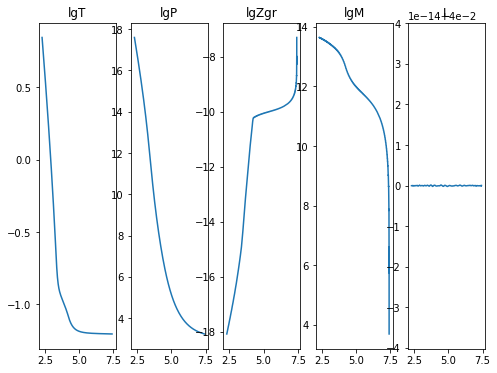

2020-11-18 05:31:05,487 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:31:06,509 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204067
2020-11-18 05:31:06,510 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:31:06,511 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:31:06,512 __main__ 0/1 INFO :: lgM iterate: 13.641074669075147
2020-11-18 05:31:06,513 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-11-18 05:31:06,514 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:31:06,515 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


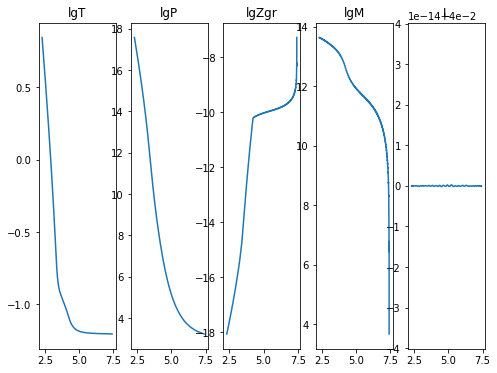

2020-11-18 05:31:10,274 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:31:11,116 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041788
2020-11-18 05:31:11,118 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:31:11,118 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:31:11,119 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:31:11,120 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:31:11,121 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:31:11,122 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


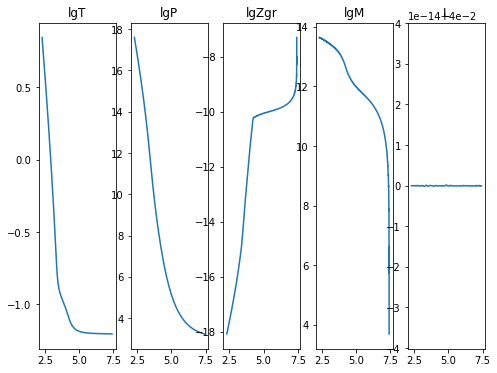

2020-11-18 05:31:14,924 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:31:15,834 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204112
2020-11-18 05:31:15,836 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-11-18 05:31:15,836 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:31:15,837 __main__ 0/1 INFO :: lgM iterate: 13.641074669075126
2020-11-18 05:31:15,838 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:31:15,839 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:31:15,840 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


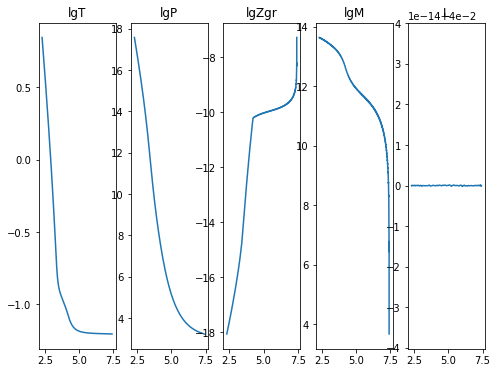

2020-11-18 05:31:19,602 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:31:20,513 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040605
2020-11-18 05:31:20,514 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:31:20,515 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:31:20,516 __main__ 0/1 INFO :: lgM iterate: 13.641115571532966
2020-11-18 05:31:20,517 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-11-18 05:31:20,518 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:31:20,519 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


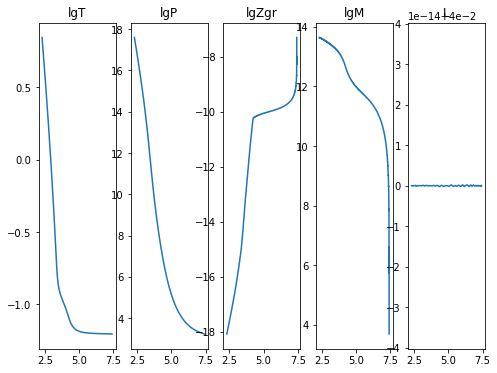

2020-11-18 05:31:24,216 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:31:25,297 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041362
2020-11-18 05:31:25,298 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:31:25,300 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:31:25,301 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-11-18 05:31:25,302 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:31:25,304 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:31:25,305 __main__ 0/1 INFO :: L iterate: 0.04


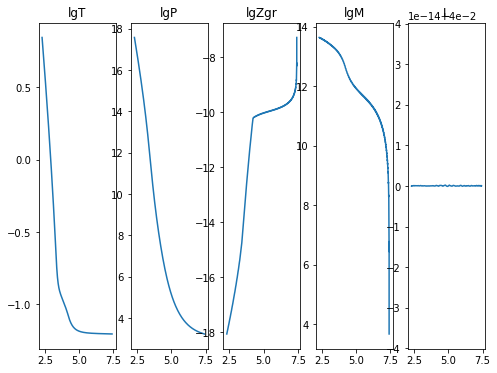

2020-11-18 05:31:29,227 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:31:30,116 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038888
2020-11-18 05:31:30,117 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:31:30,118 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:31:30,119 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:31:30,120 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:31:30,121 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:31:30,122 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


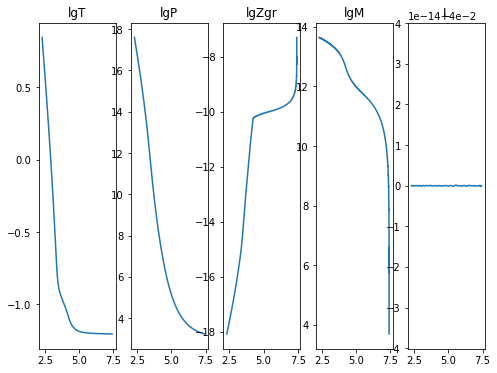

2020-11-18 05:31:33,761 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:31:34,712 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035203
2020-11-18 05:31:34,713 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:31:34,714 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:31:34,715 __main__ 0/1 INFO :: lgM iterate: 13.641074669075143
2020-11-18 05:31:34,716 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-11-18 05:31:34,717 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:31:34,718 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


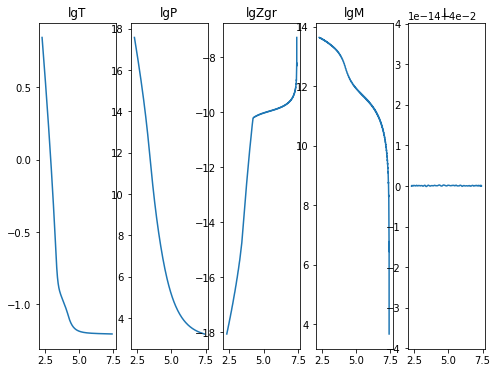

2020-11-18 05:31:38,287 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:31:39,006 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032696
2020-11-18 05:31:39,007 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:31:39,008 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:31:39,009 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:31:39,010 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:31:39,011 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:31:39,011 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


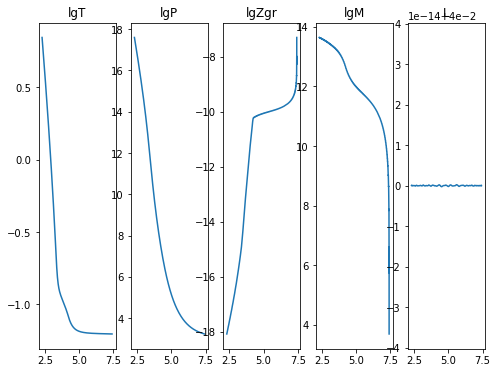

2020-11-18 05:31:42,565 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:31:43,503 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032029483
2020-11-18 05:31:43,504 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:31:43,505 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:31:43,505 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:31:43,506 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:31:43,507 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:31:43,508 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


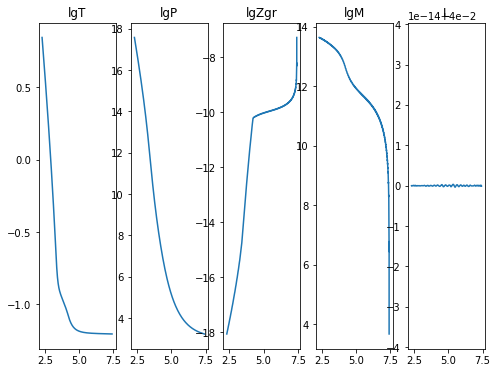

2020-11-18 05:31:47,057 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:31:47,974 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035458
2020-11-18 05:31:47,975 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:31:47,976 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:31:47,976 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-11-18 05:31:47,977 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:31:47,978 __main__ 0/1 INFO :: m iterate: 5.587645173488198e-05
2020-11-18 05:31:47,979 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


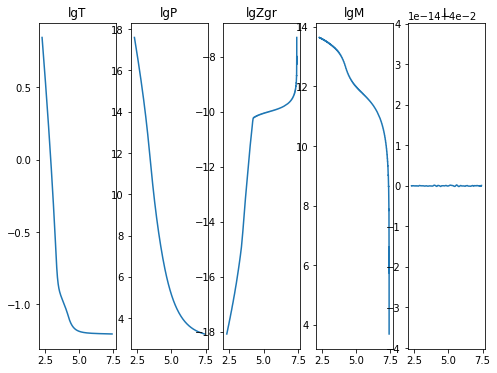

2020-11-18 05:31:51,625 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:31:52,752 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038398
2020-11-18 05:31:52,753 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-11-18 05:31:52,754 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-11-18 05:31:52,755 __main__ 0/1 INFO :: lgM iterate: 13.641074669075145
2020-11-18 05:31:52,755 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950146
2020-11-18 05:31:52,756 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:31:52,757 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


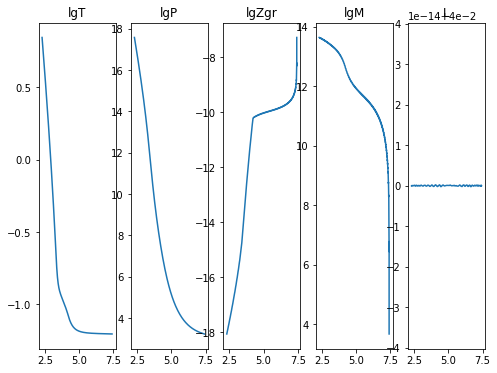

2020-11-18 05:31:56,640 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:31:57,448 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034035
2020-11-18 05:31:57,449 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:31:57,450 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:31:57,451 __main__ 0/1 INFO :: lgM iterate: 13.64111557153297
2020-11-18 05:31:57,451 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-11-18 05:31:57,452 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:31:57,453 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


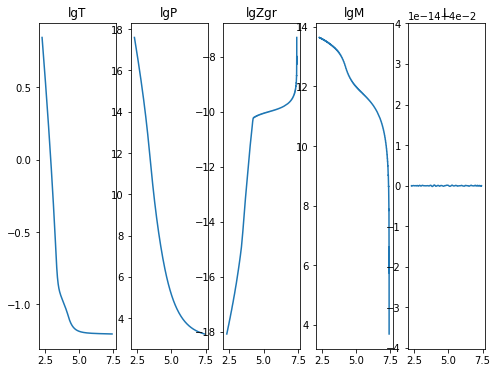

2020-11-18 05:32:01,648 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-11-18 05:32:03,634 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032063
2020-11-18 05:32:03,635 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:32:03,636 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-11-18 05:32:03,637 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:32:03,638 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:32:03,639 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:32:03,640 __main__ 0/1 INFO :: L iterate: 0.04


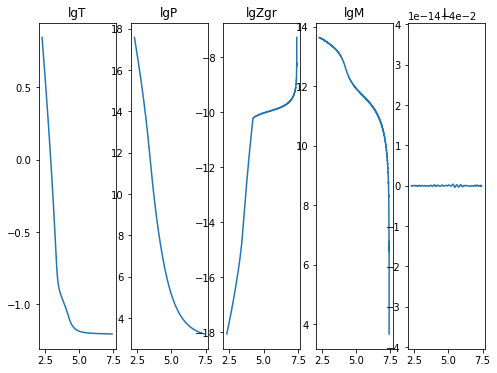

2020-11-18 05:32:07,759 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:32:08,734 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030677
2020-11-18 05:32:08,735 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:32:08,736 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:32:08,737 __main__ 0/1 INFO :: lgM iterate: 13.641115571533003
2020-11-18 05:32:08,738 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507867
2020-11-18 05:32:08,739 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:32:08,740 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


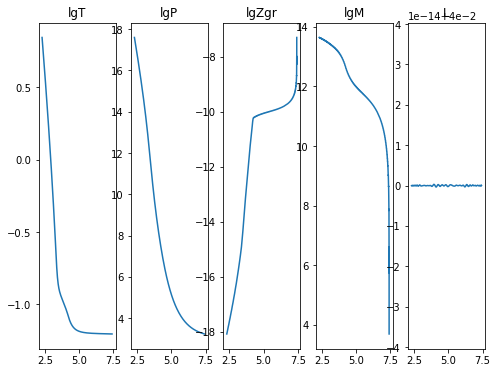

2020-11-18 05:32:12,446 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:32:13,506 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032030593
2020-11-18 05:32:13,507 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-11-18 05:32:13,508 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:32:13,509 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:32:13,510 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:32:13,511 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:32:13,512 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


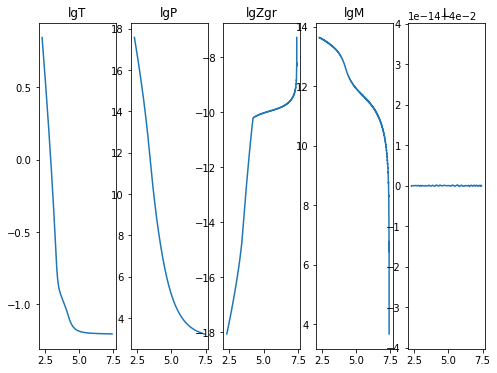

2020-11-18 05:32:17,064 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:32:18,104 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032103
2020-11-18 05:32:18,105 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:32:18,107 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:32:18,108 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-11-18 05:32:18,109 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:32:18,110 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:32:18,111 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


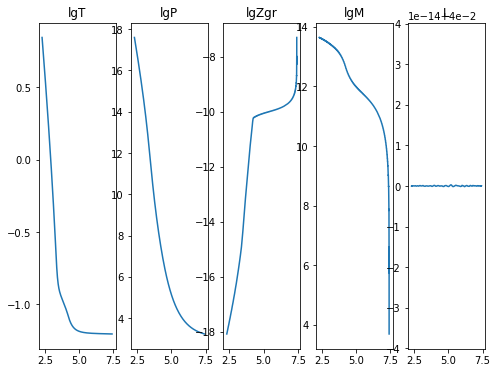

2020-11-18 05:32:21,856 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:32:22,791 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033728
2020-11-18 05:32:22,792 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:32:22,793 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-11-18 05:32:22,794 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:32:22,795 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695012
2020-11-18 05:32:22,796 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:32:22,796 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


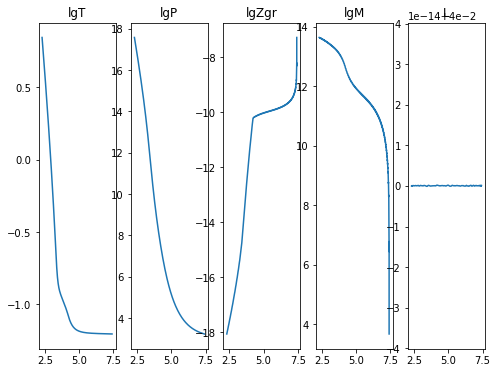

2020-11-18 05:32:26,438 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:32:27,331 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038404
2020-11-18 05:32:27,332 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:32:27,333 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:32:27,333 __main__ 0/1 INFO :: lgM iterate: 13.641115571532973
2020-11-18 05:32:27,334 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507865
2020-11-18 05:32:27,335 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:32:27,336 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


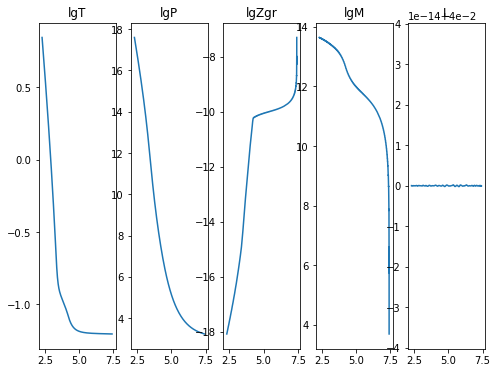

2020-11-18 05:32:30,930 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:32:31,834 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044466
2020-11-18 05:32:31,836 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:32:31,836 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:32:31,837 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:32:31,838 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:32:31,839 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:32:31,840 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


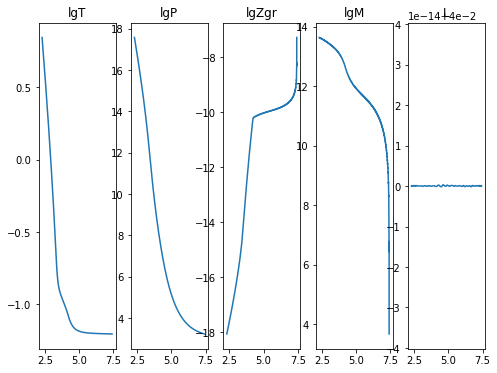

2020-11-18 05:32:35,464 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:32:36,188 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046909
2020-11-18 05:32:36,189 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516508
2020-11-18 05:32:36,190 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:32:36,191 __main__ 0/1 INFO :: lgM iterate: 13.641115571532982
2020-11-18 05:32:36,192 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507865
2020-11-18 05:32:36,193 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:32:36,194 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


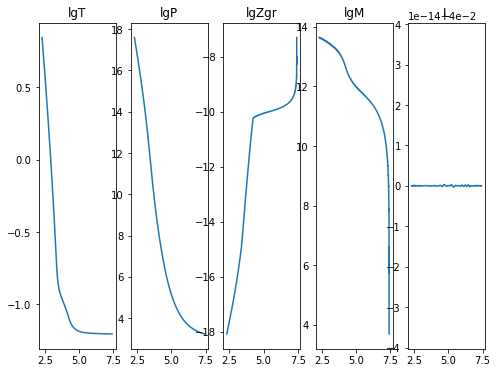

2020-11-18 05:32:39,834 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:32:40,740 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048647
2020-11-18 05:32:40,741 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:32:40,742 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:32:40,742 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:32:40,743 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:32:40,744 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:32:40,745 __main__ 0/1 INFO :: L iterate: 0.04


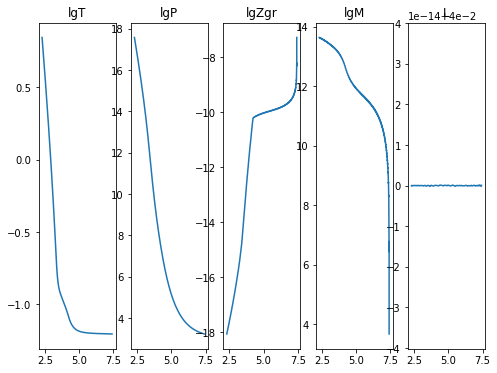

2020-11-18 05:32:44,399 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:32:45,130 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048259
2020-11-18 05:32:45,131 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-11-18 05:32:45,132 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:32:45,132 __main__ 0/1 INFO :: lgM iterate: 13.641115571532902
2020-11-18 05:32:45,133 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:32:45,134 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:32:45,135 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


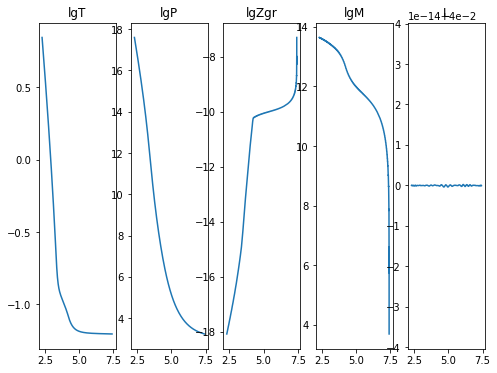

2020-11-18 05:32:48,718 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:32:49,774 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320504
2020-11-18 05:32:49,776 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800336
2020-11-18 05:32:49,778 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:32:49,779 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-11-18 05:32:49,781 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:32:49,783 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:32:49,784 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


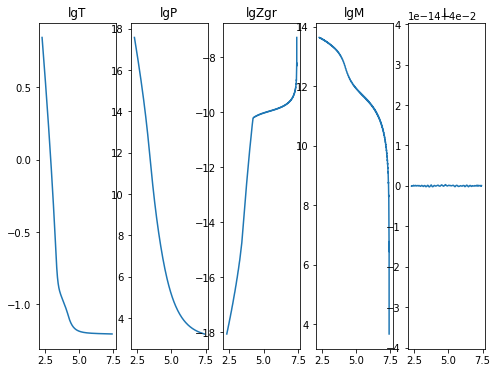

2020-11-18 05:32:53,919 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:32:54,768 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047335
2020-11-18 05:32:54,769 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-11-18 05:32:54,769 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-11-18 05:32:54,776 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-11-18 05:32:54,777 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:32:54,801 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:32:54,805 __main__ 0/1 INFO :: L iterate: 0.04


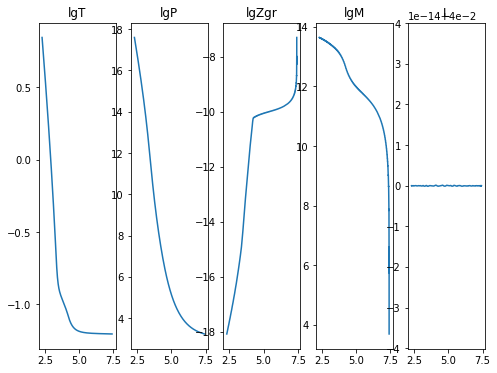

2020-11-18 05:32:58,457 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:32:59,391 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041837
2020-11-18 05:32:59,392 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800381
2020-11-18 05:32:59,393 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:32:59,393 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:32:59,394 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:32:59,395 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:32:59,396 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


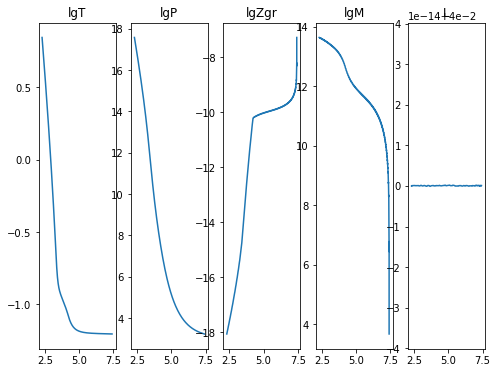

2020-11-18 05:33:02,899 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:33:03,646 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045687
2020-11-18 05:33:03,647 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:33:03,648 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:33:03,649 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:33:03,650 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:33:03,651 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:33:03,652 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


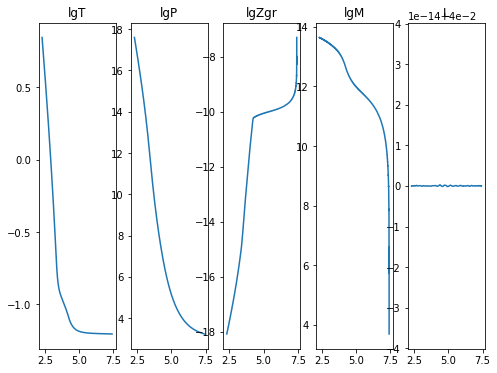

2020-11-18 05:33:07,269 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:33:08,190 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204997
2020-11-18 05:33:08,191 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800368
2020-11-18 05:33:08,192 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:33:08,193 __main__ 0/1 INFO :: lgM iterate: 13.64107466907514
2020-11-18 05:33:08,194 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-11-18 05:33:08,194 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:33:08,195 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


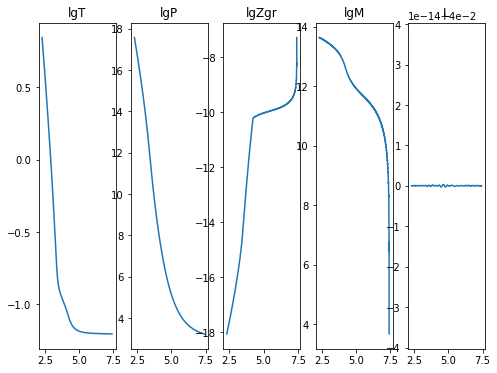

2020-11-18 05:33:11,817 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:33:12,659 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047668
2020-11-18 05:33:12,660 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:33:12,661 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:33:12,662 __main__ 0/1 INFO :: lgM iterate: 13.641115571532886
2020-11-18 05:33:12,663 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:33:12,664 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:33:12,665 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


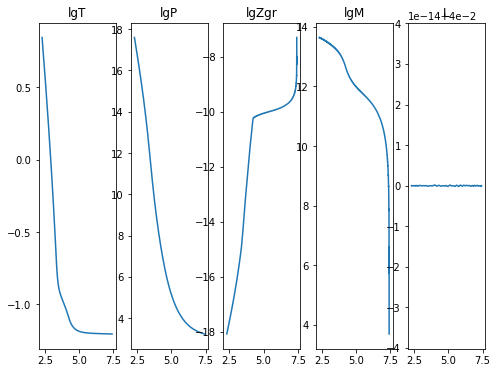

2020-11-18 05:33:16,519 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:33:17,456 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045896
2020-11-18 05:33:17,457 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-11-18 05:33:17,458 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-11-18 05:33:17,459 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-11-18 05:33:17,460 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:33:17,461 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-11-18 05:33:17,462 __main__ 0/1 INFO :: L iterate: 0.04


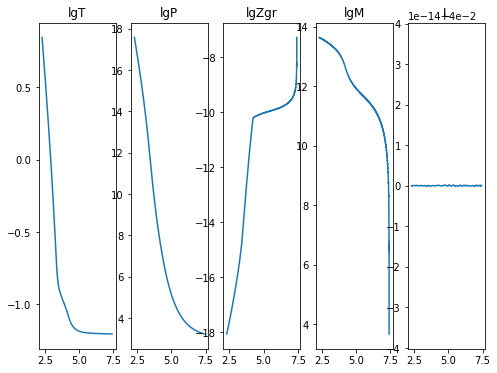

2020-11-18 05:33:21,109 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:33:21,891 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041287
2020-11-18 05:33:21,893 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:33:21,894 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:33:21,894 __main__ 0/1 INFO :: lgM iterate: 13.641115571532918
2020-11-18 05:33:21,895 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507858
2020-11-18 05:33:21,896 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:33:21,897 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


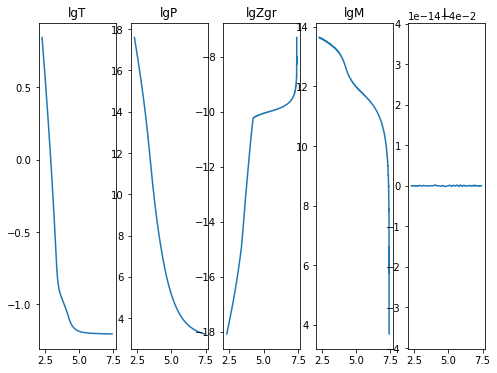

2020-11-18 05:33:25,654 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:33:26,585 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036566
2020-11-18 05:33:26,587 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:33:26,587 __main__ 0/1 INFO :: lgP iterate: 17.581556452902703
2020-11-18 05:33:26,588 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:33:26,589 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695012
2020-11-18 05:33:26,590 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:33:26,591 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


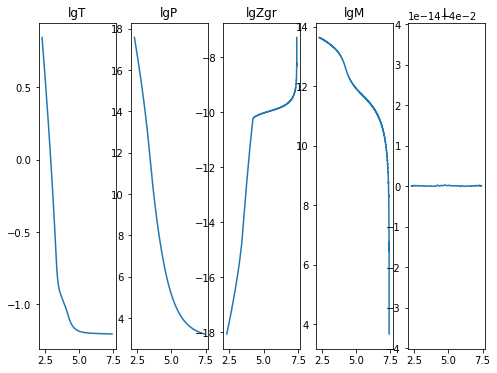

2020-11-18 05:33:30,146 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:33:30,924 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037188
2020-11-18 05:33:30,925 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:33:30,926 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-11-18 05:33:30,927 __main__ 0/1 INFO :: lgM iterate: 13.641115571532923
2020-11-18 05:33:30,928 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:33:30,929 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:33:30,930 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


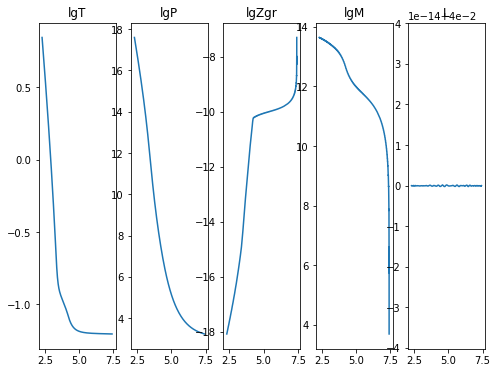

2020-11-18 05:33:34,528 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:33:35,492 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037459
2020-11-18 05:33:35,493 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-11-18 05:33:35,494 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:33:35,495 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-11-18 05:33:35,496 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:33:35,497 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:33:35,498 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


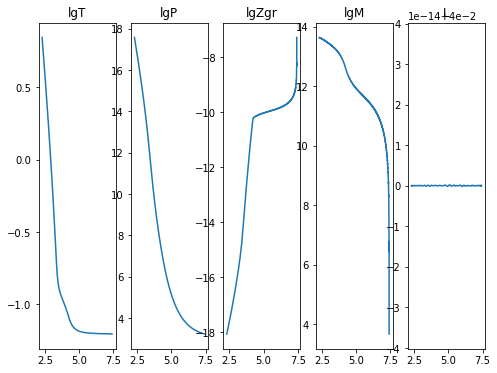

2020-11-18 05:33:39,151 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:33:39,956 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203927
2020-11-18 05:33:39,957 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:33:39,958 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:33:39,959 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:33:39,960 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:33:39,961 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:33:39,962 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


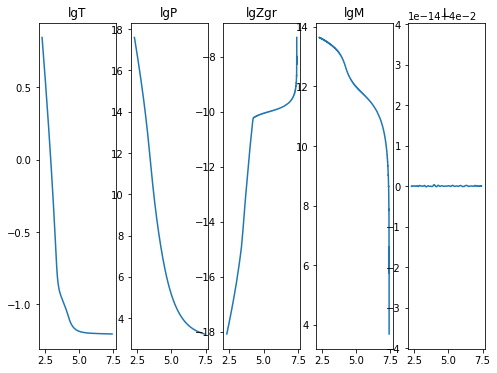

2020-11-18 05:33:43,729 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:33:44,985 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041597
2020-11-18 05:33:44,986 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:33:44,987 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:33:44,988 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:33:44,989 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:33:44,990 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:33:44,991 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


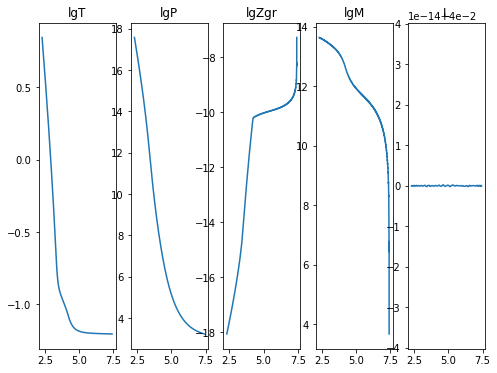

2020-11-18 05:33:48,577 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:33:49,652 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043114
2020-11-18 05:33:49,653 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-11-18 05:33:49,654 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:33:49,654 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:33:49,655 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:33:49,656 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:33:49,657 __main__ 0/1 INFO :: L iterate: 0.04


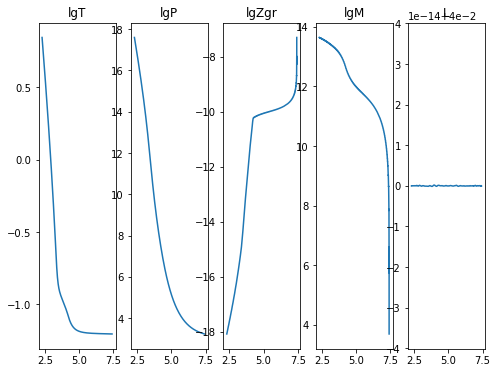

2020-11-18 05:33:53,446 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:33:54,491 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043556
2020-11-18 05:33:54,492 __main__ 0/1 INFO :: lgT iterate: 0.844929764780037
2020-11-18 05:33:54,493 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:33:54,494 __main__ 0/1 INFO :: lgM iterate: 13.641074669075161
2020-11-18 05:33:54,495 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695012
2020-11-18 05:33:54,496 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:33:54,496 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


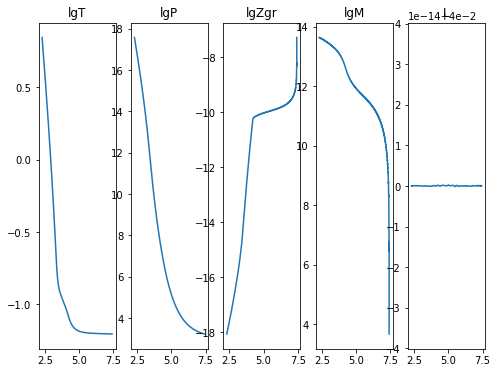

2020-11-18 05:33:58,212 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:33:58,936 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203946
2020-11-18 05:33:58,937 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:33:58,938 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:33:58,939 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:33:58,939 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:33:58,940 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:33:58,941 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


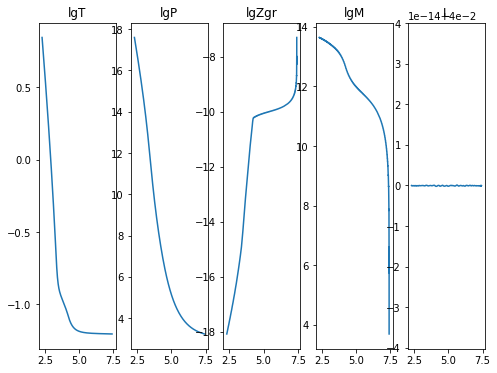

2020-11-18 05:34:02,682 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:34:03,728 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203754
2020-11-18 05:34:03,729 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-11-18 05:34:03,730 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-11-18 05:34:03,731 __main__ 0/1 INFO :: lgM iterate: 13.641074669075083
2020-11-18 05:34:03,732 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:34:03,733 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-11-18 05:34:03,733 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


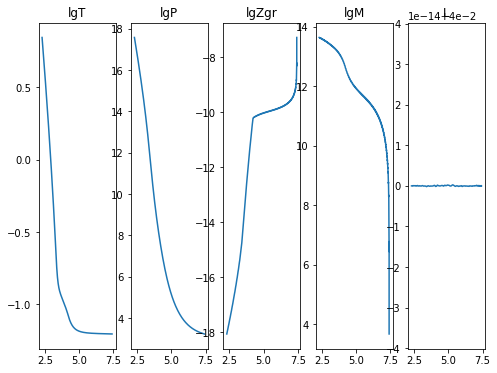

2020-11-18 05:34:07,558 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:34:08,424 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042275
2020-11-18 05:34:08,425 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-11-18 05:34:08,426 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:34:08,427 __main__ 0/1 INFO :: lgM iterate: 13.641115571532888
2020-11-18 05:34:08,427 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:34:08,428 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:34:08,429 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


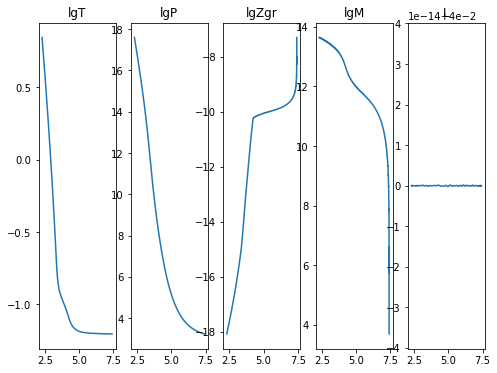

2020-11-18 05:34:12,051 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:34:12,967 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045468
2020-11-18 05:34:12,968 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:34:12,969 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:34:12,970 __main__ 0/1 INFO :: lgM iterate: 13.641074669075154
2020-11-18 05:34:12,971 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950135
2020-11-18 05:34:12,972 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:34:12,972 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


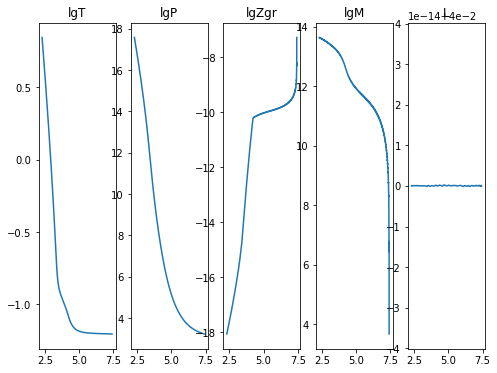

2020-11-18 05:34:16,514 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:34:17,249 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046085
2020-11-18 05:34:17,250 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516514
2020-11-18 05:34:17,251 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:34:17,252 __main__ 0/1 INFO :: lgM iterate: 13.641115571532904
2020-11-18 05:34:17,253 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:34:17,254 __main__ 0/1 INFO :: m iterate: 5.587645172422384e-05
2020-11-18 05:34:17,255 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


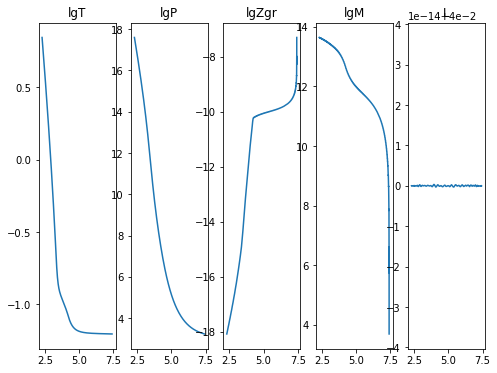

2020-11-18 05:34:20,953 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:34:21,842 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205052
2020-11-18 05:34:21,843 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:34:21,844 __main__ 0/1 INFO :: lgP iterate: 17.581556452902642
2020-11-18 05:34:21,844 __main__ 0/1 INFO :: lgM iterate: 13.641074669075097
2020-11-18 05:34:21,845 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:34:21,846 __main__ 0/1 INFO :: m iterate: 5.5042563015028634e-05
2020-11-18 05:34:21,847 __main__ 0/1 INFO :: L iterate: 0.04


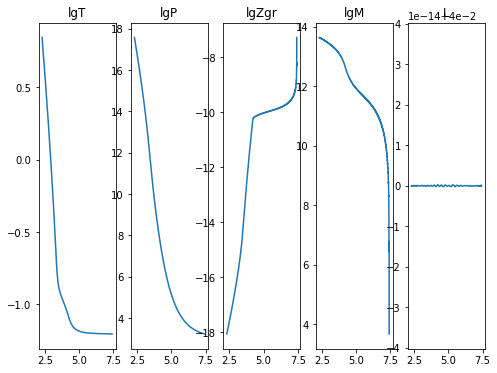

2020-11-18 05:34:25,368 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:34:26,164 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050395
2020-11-18 05:34:26,165 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:34:26,166 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:34:26,167 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-11-18 05:34:26,168 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:34:26,169 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:34:26,170 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


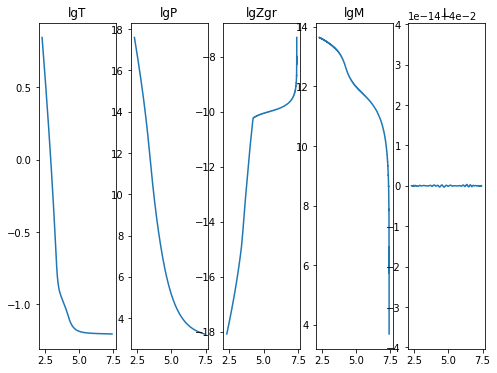

2020-11-18 05:34:29,705 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:34:30,762 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047966
2020-11-18 05:34:30,763 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:34:30,764 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:34:30,764 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-11-18 05:34:30,765 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-11-18 05:34:30,766 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:34:30,767 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


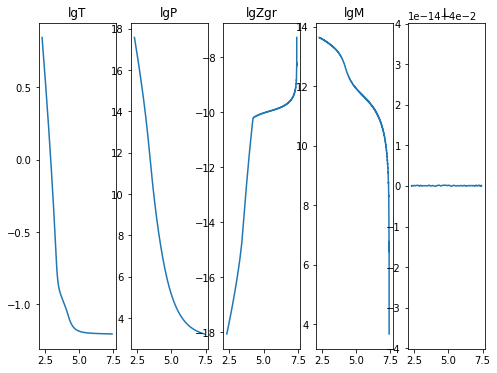

2020-11-18 05:34:34,463 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:34:35,248 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204681
2020-11-18 05:34:35,249 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-11-18 05:34:35,250 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-11-18 05:34:35,251 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:34:35,251 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:34:35,252 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:34:35,253 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


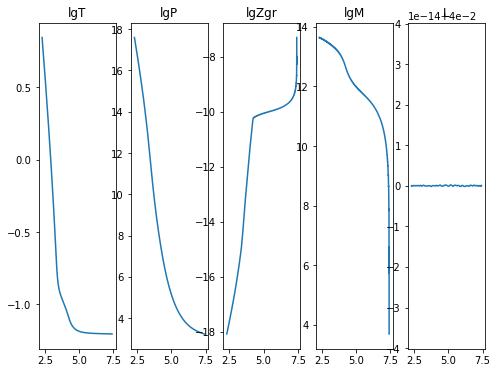

2020-11-18 05:34:39,262 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:34:40,193 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044107
2020-11-18 05:34:40,195 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800359
2020-11-18 05:34:40,195 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:34:40,196 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:34:40,197 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:34:40,198 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:34:40,199 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


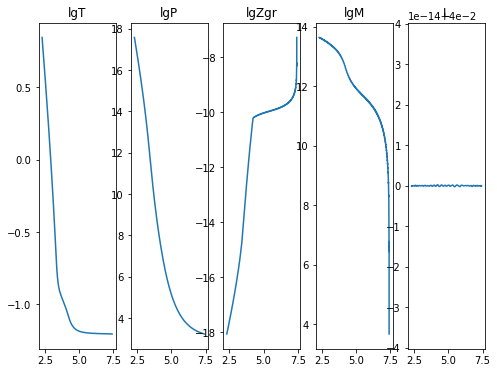

2020-11-18 05:34:43,916 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:34:44,694 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039994
2020-11-18 05:34:44,695 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516518
2020-11-18 05:34:44,696 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:34:44,696 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-11-18 05:34:44,697 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:34:44,698 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:34:44,699 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


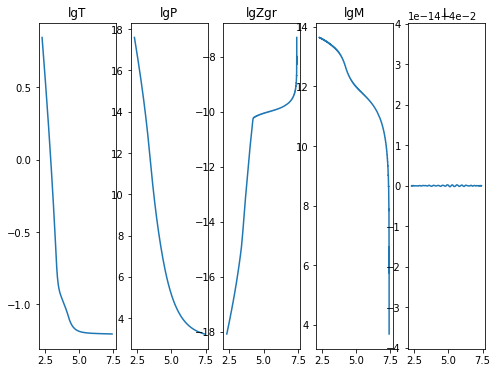

2020-11-18 05:34:48,389 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:34:49,325 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035793
2020-11-18 05:34:49,326 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:34:49,327 __main__ 0/1 INFO :: lgP iterate: 17.581556452902696
2020-11-18 05:34:49,328 __main__ 0/1 INFO :: lgM iterate: 13.641074669075108
2020-11-18 05:34:49,329 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-11-18 05:34:49,330 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:34:49,331 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


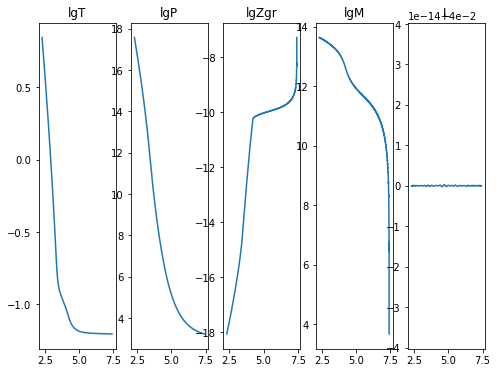

2020-11-18 05:34:53,005 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:34:53,761 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041635
2020-11-18 05:34:53,762 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516538
2020-11-18 05:34:53,763 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:34:53,764 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-11-18 05:34:53,764 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:34:53,765 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:34:53,766 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


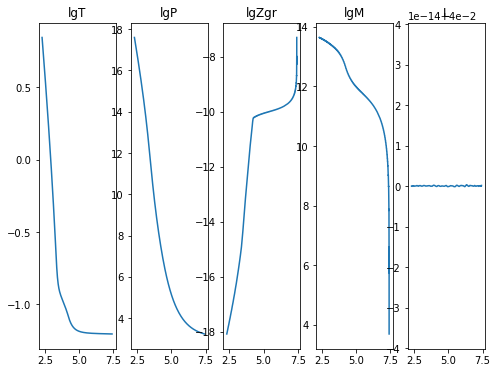

2020-11-18 05:34:57,559 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:34:58,524 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049318
2020-11-18 05:34:58,525 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-11-18 05:34:58,526 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:34:58,526 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:34:58,527 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:34:58,528 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:34:58,529 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


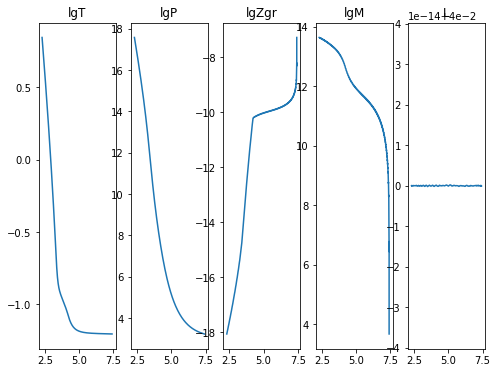

2020-11-18 05:35:02,158 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:35:02,890 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204273
2020-11-18 05:35:02,891 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:35:02,892 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-11-18 05:35:02,893 __main__ 0/1 INFO :: lgM iterate: 13.641115571532913
2020-11-18 05:35:02,894 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078568
2020-11-18 05:35:02,895 __main__ 0/1 INFO :: m iterate: 5.587645173488198e-05
2020-11-18 05:35:02,896 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


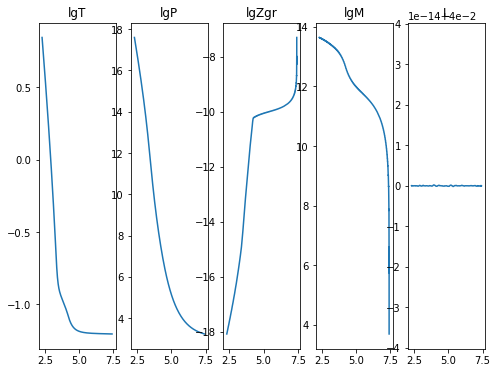

2020-11-18 05:35:06,565 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:35:07,563 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038917
2020-11-18 05:35:07,564 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800335
2020-11-18 05:35:07,565 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:35:07,566 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:35:07,566 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:35:07,567 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:35:07,568 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


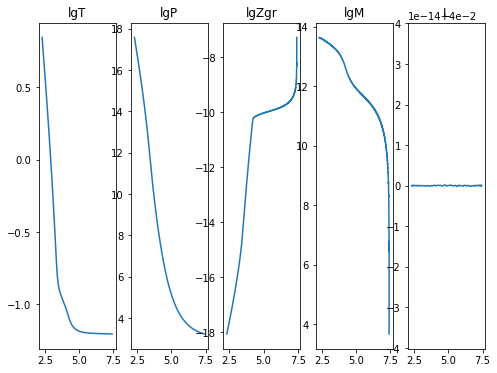

2020-11-18 05:35:11,264 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:35:12,013 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044142
2020-11-18 05:35:12,014 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:35:12,015 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:35:12,016 __main__ 0/1 INFO :: lgM iterate: 13.641115571532945
2020-11-18 05:35:12,016 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:35:12,017 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:35:12,018 __main__ 0/1 INFO :: L iterate: 0.04000000000000004


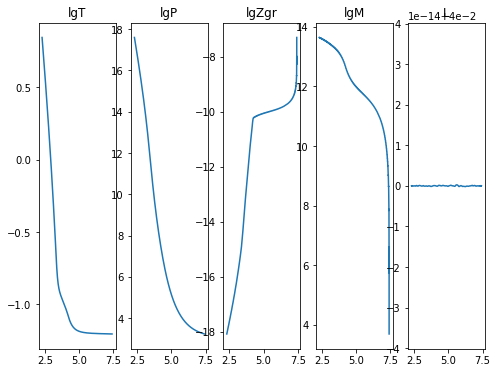

2020-11-18 05:35:15,820 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:35:16,753 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044666
2020-11-18 05:35:16,754 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-11-18 05:35:16,755 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:35:16,756 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:35:16,757 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:35:16,758 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:35:16,759 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


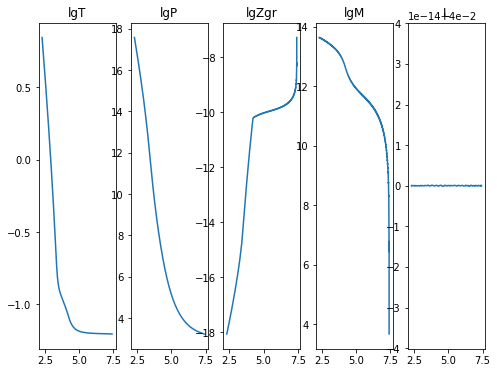

2020-11-18 05:35:20,368 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:35:21,088 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204574
2020-11-18 05:35:21,089 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-11-18 05:35:21,090 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:35:21,091 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:35:21,092 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:35:21,093 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:35:21,094 __main__ 0/1 INFO :: L iterate: 0.04


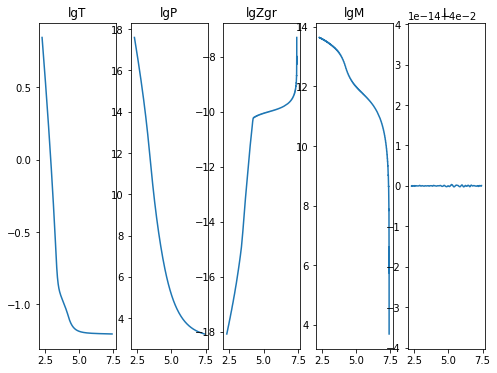

2020-11-18 05:35:24,654 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:35:25,577 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048654
2020-11-18 05:35:25,578 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800387
2020-11-18 05:35:25,579 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:35:25,580 __main__ 0/1 INFO :: lgM iterate: 13.641074669075062
2020-11-18 05:35:25,580 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:35:25,581 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:35:25,582 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


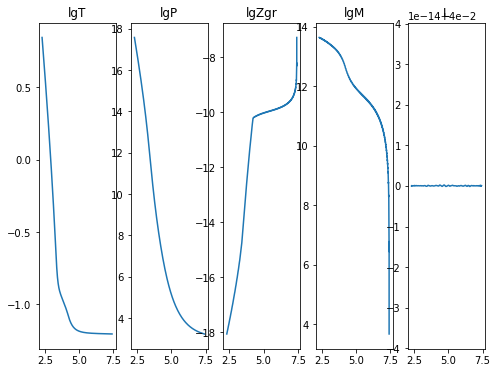

2020-11-18 05:35:29,146 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:35:29,821 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052415
2020-11-18 05:35:29,822 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:35:29,823 __main__ 0/1 INFO :: lgP iterate: 17.59681772025334
2020-11-18 05:35:29,824 __main__ 0/1 INFO :: lgM iterate: 13.641115571532989
2020-11-18 05:35:29,824 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078685
2020-11-18 05:35:29,825 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:35:29,826 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


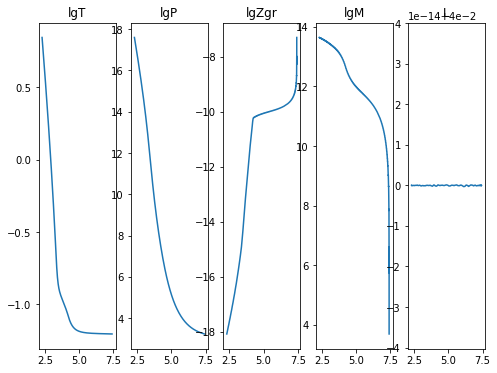

2020-11-18 05:35:33,477 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:35:34,391 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032056987
2020-11-18 05:35:34,392 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-11-18 05:35:34,393 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:35:34,394 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-11-18 05:35:34,395 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:35:34,396 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:35:34,396 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


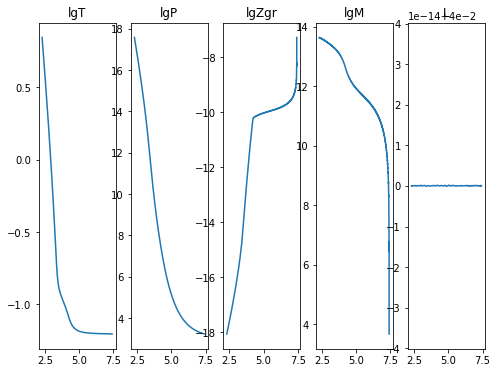

2020-11-18 05:35:37,949 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:35:38,783 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205323
2020-11-18 05:35:38,785 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:35:38,787 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:35:38,788 __main__ 0/1 INFO :: lgM iterate: 13.64111557153297
2020-11-18 05:35:38,790 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078653
2020-11-18 05:35:38,791 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:35:38,793 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


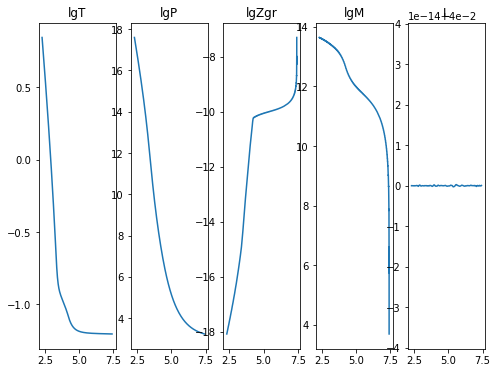

2020-11-18 05:35:42,687 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:35:43,611 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050701
2020-11-18 05:35:43,612 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:35:43,613 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:35:43,614 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:35:43,615 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:35:43,616 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:35:43,617 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


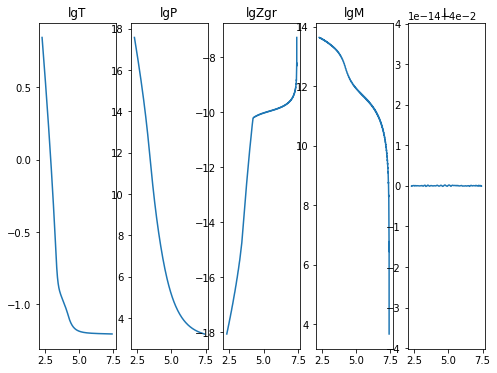

2020-11-18 05:35:47,301 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:35:48,032 __main__ 0/1 INFO :: Perturbation norm: 1.740464603205031
2020-11-18 05:35:48,033 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:35:48,034 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:35:48,034 __main__ 0/1 INFO :: lgM iterate: 13.64111557153294
2020-11-18 05:35:48,035 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:35:48,036 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:35:48,037 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


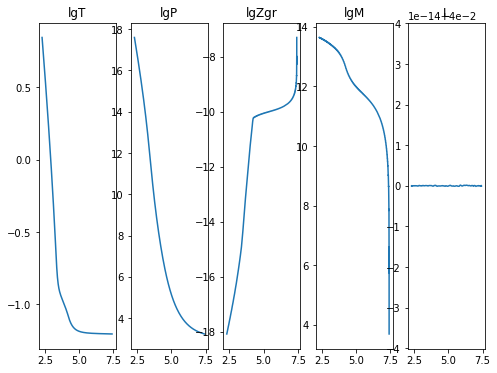

2020-11-18 05:35:51,786 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:35:52,733 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204974
2020-11-18 05:35:52,735 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:35:52,736 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:35:52,737 __main__ 0/1 INFO :: lgM iterate: 13.64107466907513
2020-11-18 05:35:52,739 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:35:52,740 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:35:52,741 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


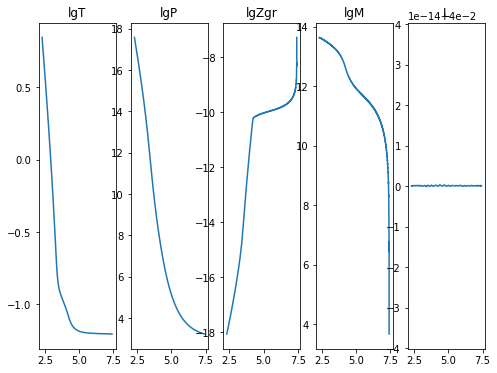

2020-11-18 05:35:56,496 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:35:57,270 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049638
2020-11-18 05:35:57,271 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:35:57,272 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:35:57,273 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-11-18 05:35:57,273 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078607
2020-11-18 05:35:57,274 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:35:57,275 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


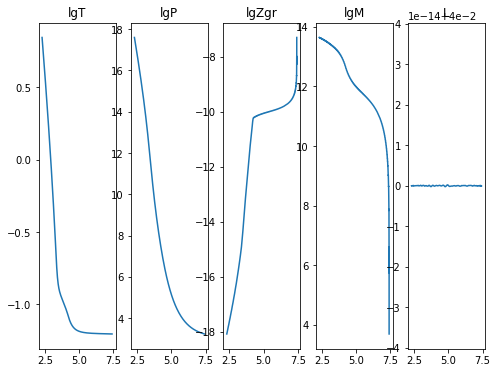

2020-11-18 05:36:01,081 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:36:02,044 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032051707
2020-11-18 05:36:02,045 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:36:02,046 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:36:02,046 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-11-18 05:36:02,047 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:36:02,048 __main__ 0/1 INFO :: m iterate: 5.504256301591681e-05
2020-11-18 05:36:02,049 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


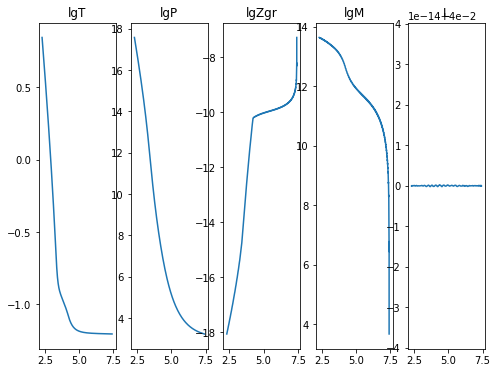

2020-11-18 05:36:05,967 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:36:06,931 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032054158
2020-11-18 05:36:06,932 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:36:06,933 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:36:06,934 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:36:06,935 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:36:06,936 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:36:06,937 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


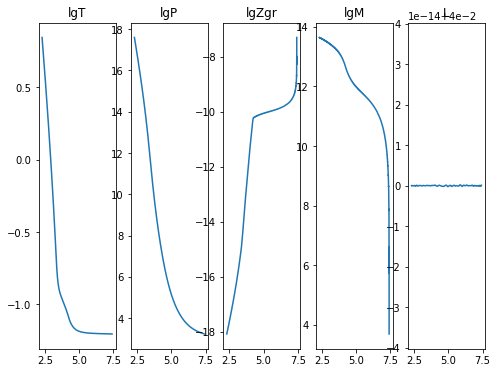

2020-11-18 05:36:12,109 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:36:13,568 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032054583
2020-11-18 05:36:13,569 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-11-18 05:36:13,570 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:36:13,571 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-11-18 05:36:13,572 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-11-18 05:36:13,573 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:36:13,574 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


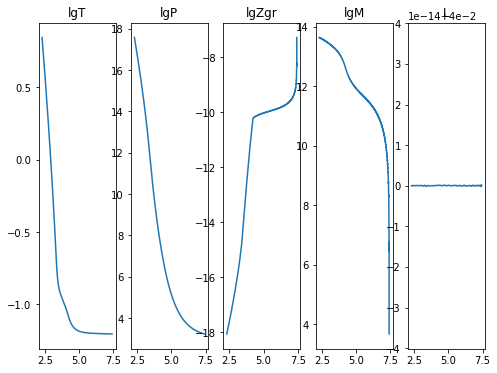

2020-11-18 05:36:19,559 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.7e+00/s
2020-11-18 05:36:20,868 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204728
2020-11-18 05:36:20,870 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:36:20,871 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:36:20,872 __main__ 0/1 INFO :: lgM iterate: 13.641115571532945
2020-11-18 05:36:20,873 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:36:20,874 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:36:20,875 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


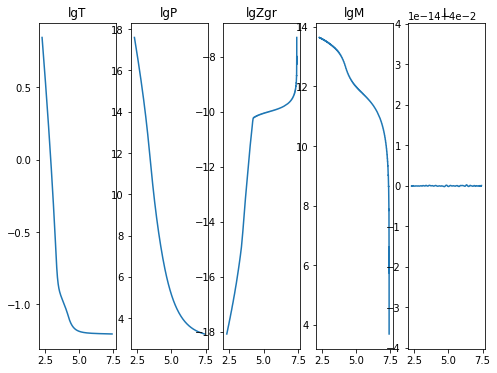

2020-11-18 05:36:25,527 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.8e+00/s
2020-11-18 05:36:27,017 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039515
2020-11-18 05:36:27,021 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800389
2020-11-18 05:36:27,025 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:36:27,028 __main__ 0/1 INFO :: lgM iterate: 13.641074669075126
2020-11-18 05:36:27,031 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:36:27,035 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:36:27,038 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


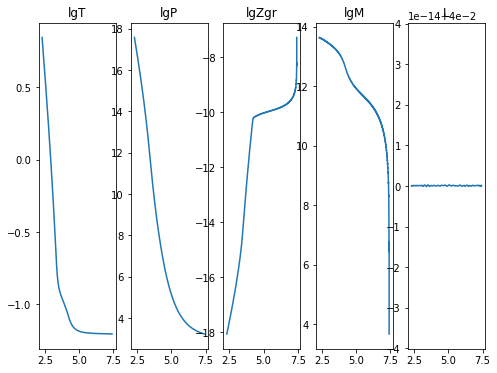

2020-11-18 05:36:31,539 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:36:33,131 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046982
2020-11-18 05:36:33,132 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:36:33,134 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:36:33,135 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:36:33,136 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:36:33,137 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:36:33,138 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


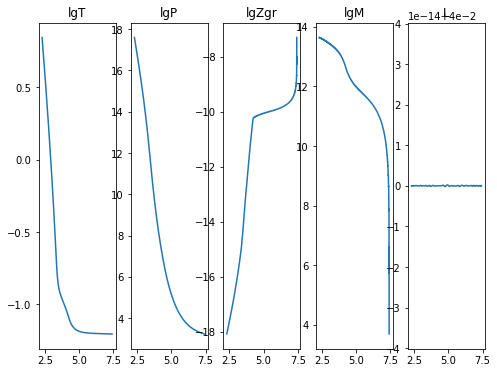

2020-11-18 05:36:37,805 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:36:39,052 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052011
2020-11-18 05:36:39,053 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:36:39,054 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-11-18 05:36:39,055 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-11-18 05:36:39,056 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:36:39,057 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:36:39,058 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


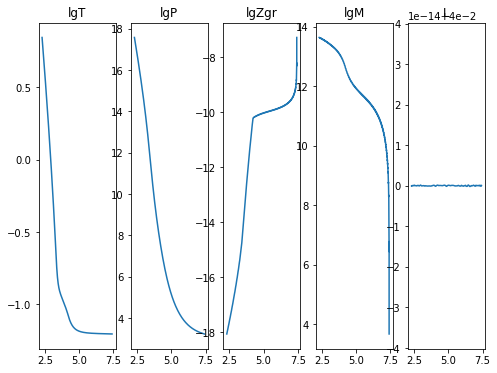

2020-11-18 05:36:43,105 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:36:44,106 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204958
2020-11-18 05:36:44,107 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:36:44,108 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:36:44,109 __main__ 0/1 INFO :: lgM iterate: 13.641115571532959
2020-11-18 05:36:44,110 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:36:44,111 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:36:44,111 __main__ 0/1 INFO :: L iterate: 0.04000000000000004


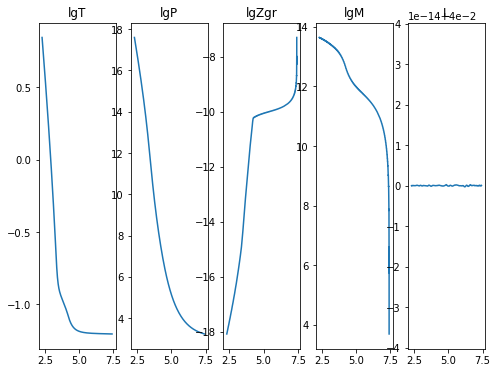

2020-11-18 05:36:48,049 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:36:49,033 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032052078
2020-11-18 05:36:49,034 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:36:49,035 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:36:49,036 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:36:49,037 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:36:49,038 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:36:49,039 __main__ 0/1 INFO :: L iterate: 0.04


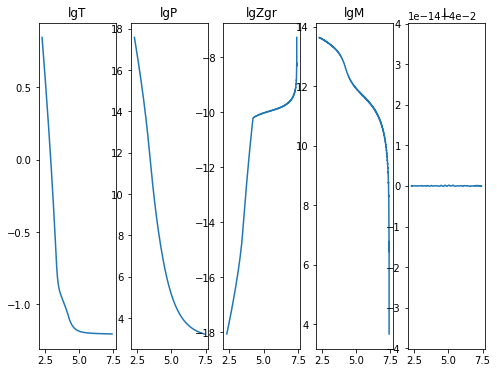

2020-11-18 05:36:52,613 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:36:53,466 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050006
2020-11-18 05:36:53,467 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:36:53,468 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:36:53,469 __main__ 0/1 INFO :: lgM iterate: 13.641115571532914
2020-11-18 05:36:53,470 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:36:53,471 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-11-18 05:36:53,471 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


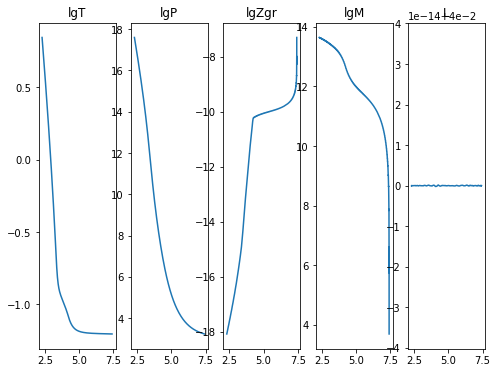

2020-11-18 05:36:57,258 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:36:58,339 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204558
2020-11-18 05:36:58,340 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-11-18 05:36:58,341 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:36:58,341 __main__ 0/1 INFO :: lgM iterate: 13.64107466907503
2020-11-18 05:36:58,342 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950036
2020-11-18 05:36:58,343 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:36:58,344 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


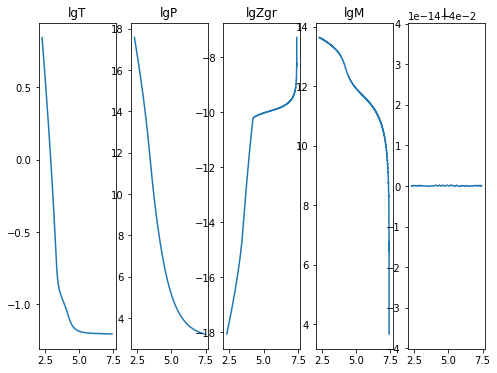

2020-11-18 05:37:01,983 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:37:02,751 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044861
2020-11-18 05:37:02,752 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:37:02,753 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:37:02,754 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-11-18 05:37:02,754 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:37:02,755 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:37:02,756 __main__ 0/1 INFO :: L iterate: 0.04


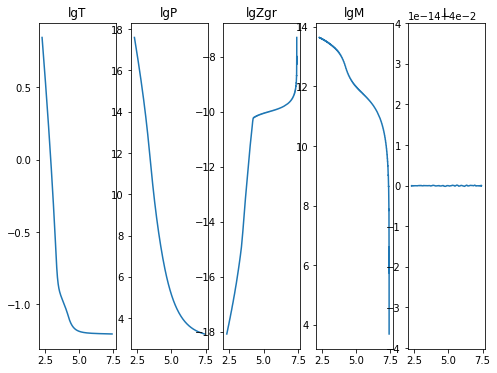

2020-11-18 05:37:06,297 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:37:07,355 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046474
2020-11-18 05:37:07,356 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-11-18 05:37:07,357 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:37:07,358 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:37:07,358 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:37:07,359 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:37:07,360 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


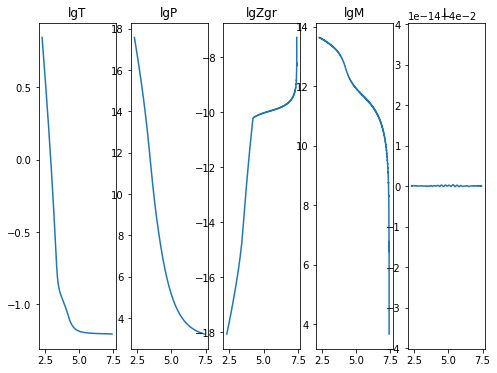

2020-11-18 05:37:11,353 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.3e+00/s
2020-11-18 05:37:12,219 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043907
2020-11-18 05:37:12,221 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:37:12,221 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:37:12,222 __main__ 0/1 INFO :: lgM iterate: 13.64111557153291
2020-11-18 05:37:12,223 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:37:12,224 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:37:12,225 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


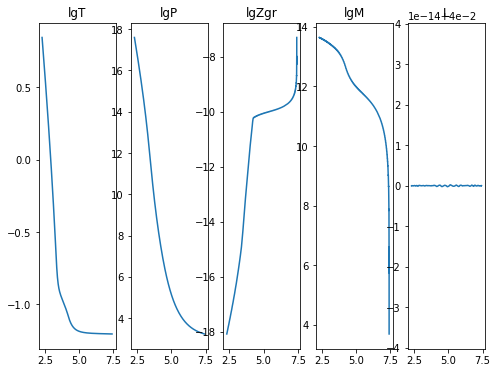

2020-11-18 05:37:16,120 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:37:17,053 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042228
2020-11-18 05:37:17,054 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800363
2020-11-18 05:37:17,055 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:37:17,056 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-11-18 05:37:17,056 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:37:17,057 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:37:17,058 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


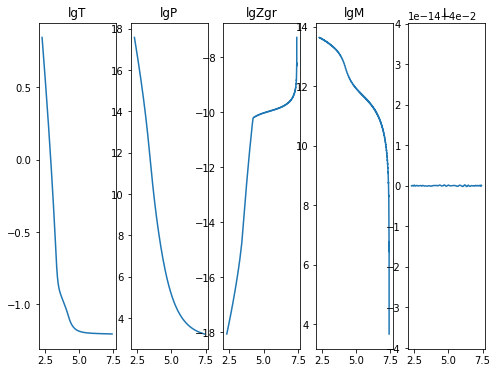

2020-11-18 05:37:20,794 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:37:21,561 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044409
2020-11-18 05:37:21,562 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-11-18 05:37:21,563 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:37:21,563 __main__ 0/1 INFO :: lgM iterate: 13.641115571532895
2020-11-18 05:37:21,564 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078586
2020-11-18 05:37:21,565 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:37:21,566 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


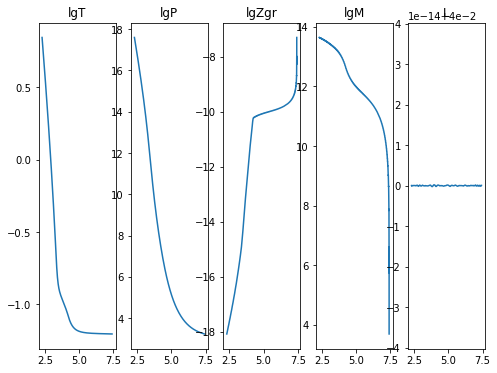

2020-11-18 05:37:25,448 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:37:26,382 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045328
2020-11-18 05:37:26,383 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800348
2020-11-18 05:37:26,383 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:37:26,384 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-11-18 05:37:26,385 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:37:26,386 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:37:26,387 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


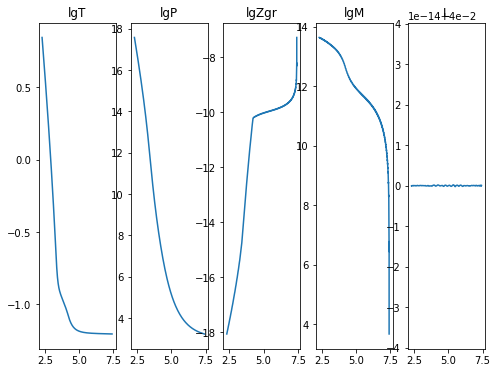

2020-11-18 05:37:30,304 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:37:31,048 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204627
2020-11-18 05:37:31,049 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516544
2020-11-18 05:37:31,050 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-11-18 05:37:31,051 __main__ 0/1 INFO :: lgM iterate: 13.641115571533001
2020-11-18 05:37:31,052 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507867
2020-11-18 05:37:31,053 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:37:31,054 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


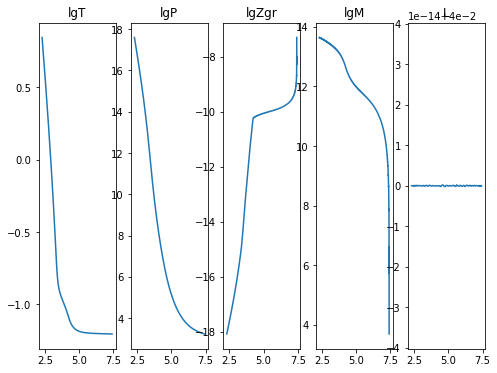

2020-11-18 05:37:35,022 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:37:36,011 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204529
2020-11-18 05:37:36,015 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-11-18 05:37:36,017 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:37:36,020 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:37:36,023 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:37:36,025 __main__ 0/1 INFO :: m iterate: 5.5042563014140455e-05
2020-11-18 05:37:36,028 __main__ 0/1 INFO :: L iterate: 0.04


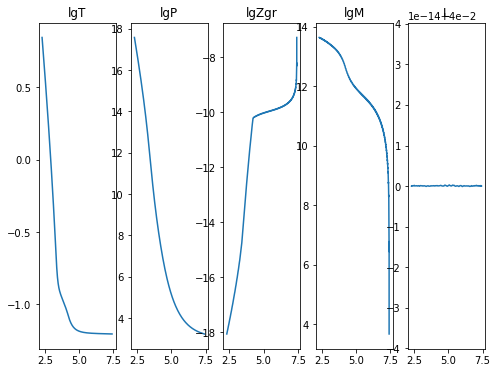

2020-11-18 05:37:39,620 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:37:40,388 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039286
2020-11-18 05:37:40,389 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516507
2020-11-18 05:37:40,389 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:37:40,390 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-11-18 05:37:40,391 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:37:40,392 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:37:40,393 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


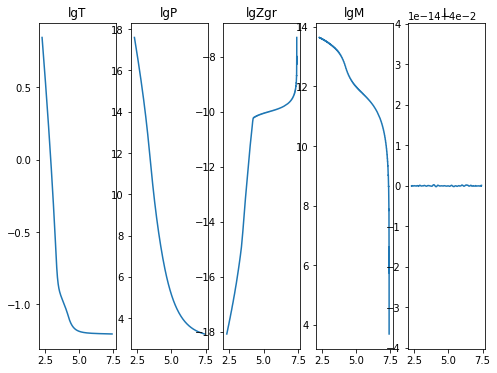

2020-11-18 05:37:44,004 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:37:44,893 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037872
2020-11-18 05:37:44,895 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-11-18 05:37:44,895 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:37:44,896 __main__ 0/1 INFO :: lgM iterate: 13.641074669075126
2020-11-18 05:37:44,897 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:37:44,898 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-11-18 05:37:44,899 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


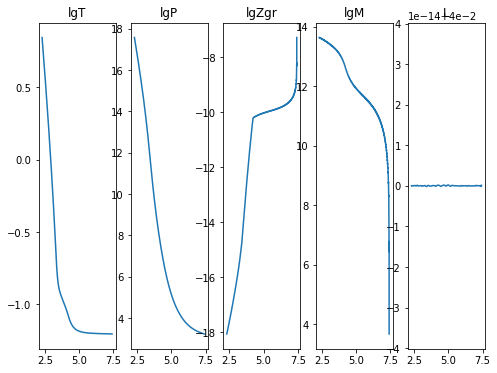

2020-11-18 05:37:48,434 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:37:49,145 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039186
2020-11-18 05:37:49,146 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516541
2020-11-18 05:37:49,147 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:37:49,148 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:37:49,149 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:37:49,150 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:37:49,150 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


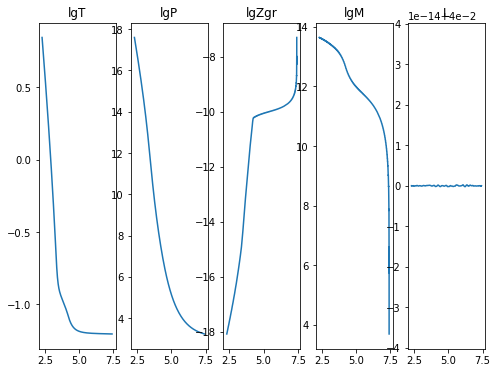

2020-11-18 05:37:52,754 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:37:53,676 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037625
2020-11-18 05:37:53,677 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800349
2020-11-18 05:37:53,677 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:37:53,678 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-11-18 05:37:53,679 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:37:53,680 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:37:53,681 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


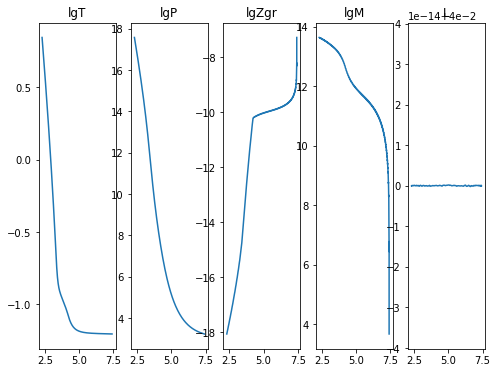

2020-11-18 05:37:57,166 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:37:57,896 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040396
2020-11-18 05:37:57,898 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:37:57,898 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:37:57,899 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:37:57,900 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507863
2020-11-18 05:37:57,901 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:37:57,902 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


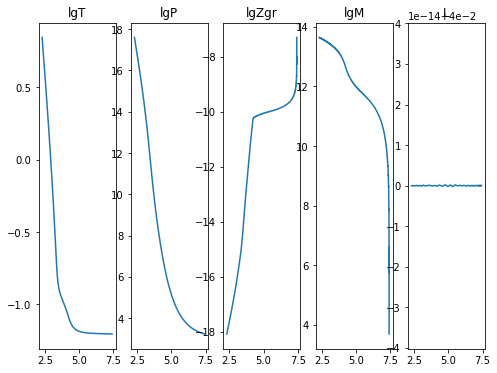

2020-11-18 05:38:01,375 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:38:02,249 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042947
2020-11-18 05:38:02,250 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:38:02,251 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:38:02,252 __main__ 0/1 INFO :: lgM iterate: 13.641074669075131
2020-11-18 05:38:02,252 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:38:02,253 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:38:02,254 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


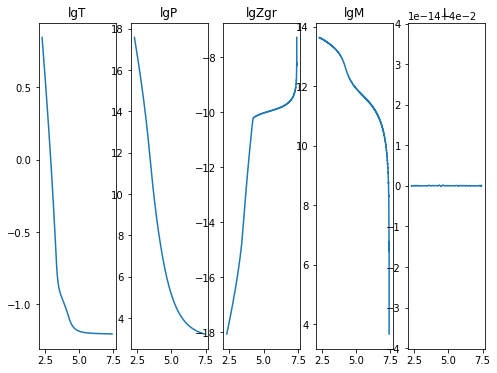

2020-11-18 05:38:06,191 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:38:07,053 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044324
2020-11-18 05:38:07,054 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:38:07,055 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:38:07,056 __main__ 0/1 INFO :: lgM iterate: 13.641115571532955
2020-11-18 05:38:07,057 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:38:07,058 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:38:07,059 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


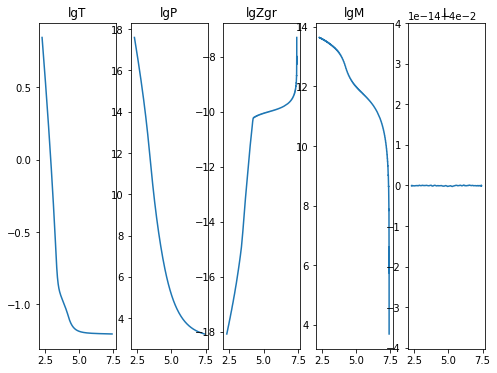

2020-11-18 05:38:11,102 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:38:12,130 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046025
2020-11-18 05:38:12,131 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800386
2020-11-18 05:38:12,132 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:38:12,133 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:38:12,134 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:38:12,135 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:38:12,136 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


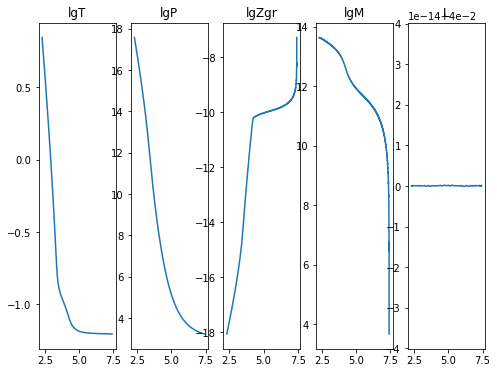

2020-11-18 05:38:15,944 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:38:16,753 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039626
2020-11-18 05:38:16,754 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:38:16,755 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:38:16,755 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-11-18 05:38:16,756 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:38:16,757 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:38:16,758 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


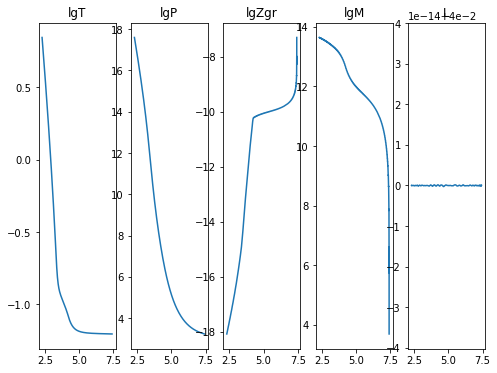

2020-11-18 05:38:20,805 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:38:22,711 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035815
2020-11-18 05:38:22,714 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-11-18 05:38:22,715 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:38:22,716 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-11-18 05:38:22,717 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:38:22,718 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:38:22,719 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


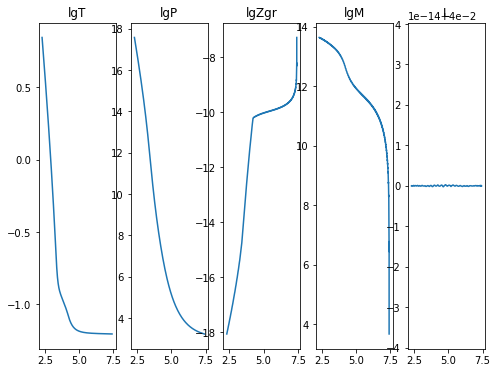

2020-11-18 05:38:26,781 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:38:27,614 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041464
2020-11-18 05:38:27,616 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516545
2020-11-18 05:38:27,616 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:38:27,617 __main__ 0/1 INFO :: lgM iterate: 13.641115571532966
2020-11-18 05:38:27,618 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:38:27,619 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:38:27,620 __main__ 0/1 INFO :: L iterate: 0.04


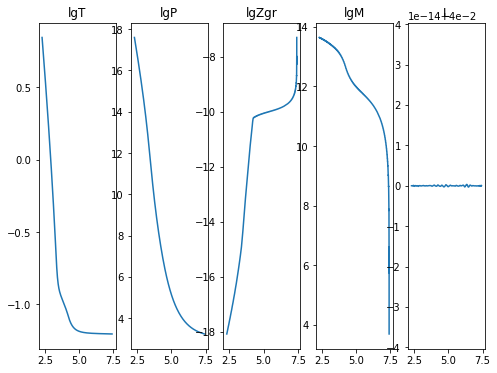

2020-11-18 05:38:31,601 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:38:32,931 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204455
2020-11-18 05:38:32,931 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800333
2020-11-18 05:38:32,932 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:38:32,933 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-11-18 05:38:32,934 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:38:32,934 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:38:32,935 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


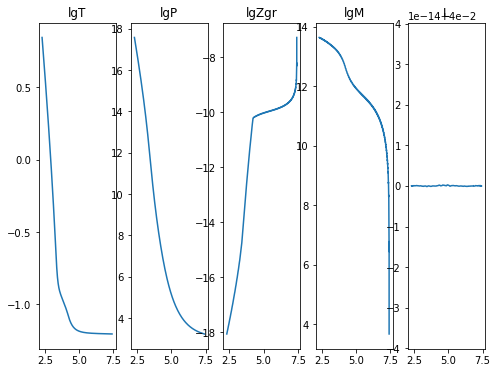

2020-11-18 05:38:37,000 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:38:37,904 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043984
2020-11-18 05:38:37,905 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:38:37,906 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:38:37,907 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:38:37,908 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:38:37,909 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-11-18 05:38:37,910 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


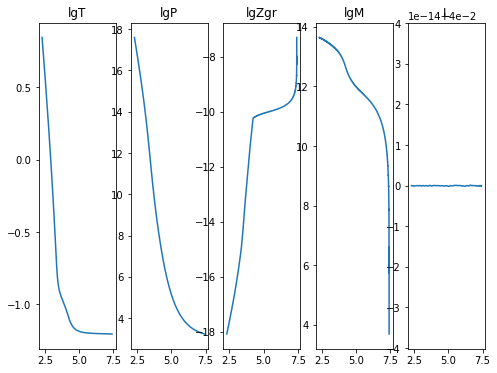

2020-11-18 05:38:41,841 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:38:42,858 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204571
2020-11-18 05:38:42,860 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-11-18 05:38:42,860 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:38:42,861 __main__ 0/1 INFO :: lgM iterate: 13.6410746690751
2020-11-18 05:38:42,862 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:38:42,863 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:38:42,863 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


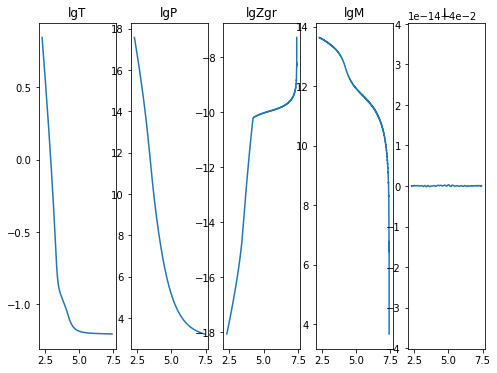

2020-11-18 05:38:46,891 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:38:47,898 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043332
2020-11-18 05:38:47,900 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-11-18 05:38:47,900 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:38:47,901 __main__ 0/1 INFO :: lgM iterate: 13.641115571532895
2020-11-18 05:38:47,902 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-11-18 05:38:47,903 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:38:47,906 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


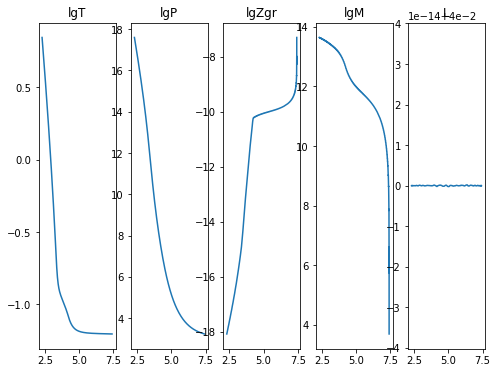

2020-11-18 05:38:52,052 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:38:52,981 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204232
2020-11-18 05:38:52,983 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:38:52,983 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:38:52,984 __main__ 0/1 INFO :: lgM iterate: 13.641074669075094
2020-11-18 05:38:52,985 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:38:52,986 __main__ 0/1 INFO :: m iterate: 5.504256300437049e-05
2020-11-18 05:38:52,987 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


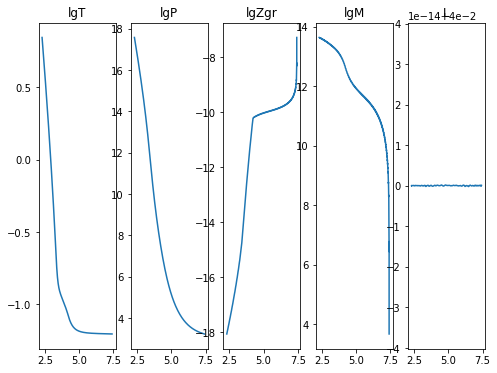

2020-11-18 05:38:56,708 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:38:57,469 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203968
2020-11-18 05:38:57,470 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:38:57,471 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:38:57,472 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-11-18 05:38:57,473 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:38:57,474 __main__ 0/1 INFO :: m iterate: 5.587645172333566e-05
2020-11-18 05:38:57,475 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


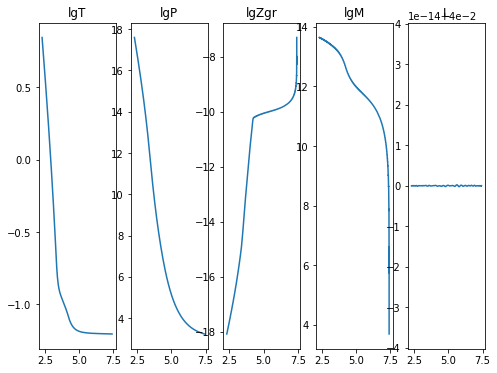

2020-11-18 05:39:01,419 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:39:02,504 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037738
2020-11-18 05:39:02,505 __main__ 0/1 INFO :: lgT iterate: 0.844929764780037
2020-11-18 05:39:02,506 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:39:02,507 __main__ 0/1 INFO :: lgM iterate: 13.641074669075152
2020-11-18 05:39:02,508 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-11-18 05:39:02,509 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:39:02,509 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


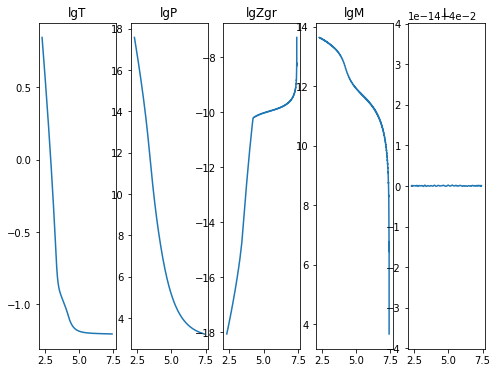

2020-11-18 05:39:06,311 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:39:07,591 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035116
2020-11-18 05:39:07,592 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:39:07,593 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:39:07,594 __main__ 0/1 INFO :: lgM iterate: 13.641115571532968
2020-11-18 05:39:07,594 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:39:07,596 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:39:07,597 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


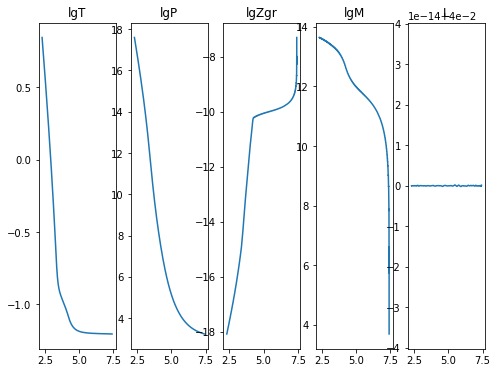

2020-11-18 05:39:11,488 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:39:12,409 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320328
2020-11-18 05:39:12,410 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-11-18 05:39:12,411 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:39:12,412 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:39:12,413 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:39:12,414 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:39:12,414 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


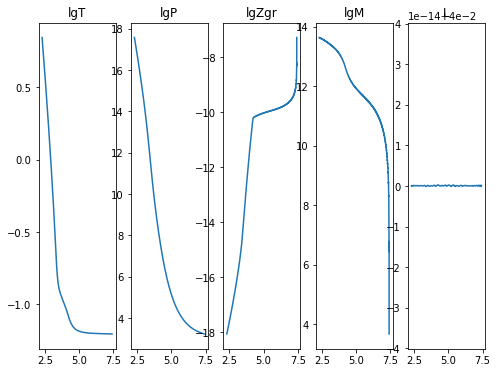

2020-11-18 05:39:16,344 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:39:17,400 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036546
2020-11-18 05:39:17,402 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:39:17,402 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:39:17,403 __main__ 0/1 INFO :: lgM iterate: 13.64111557153291
2020-11-18 05:39:17,404 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:39:17,405 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:39:17,406 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


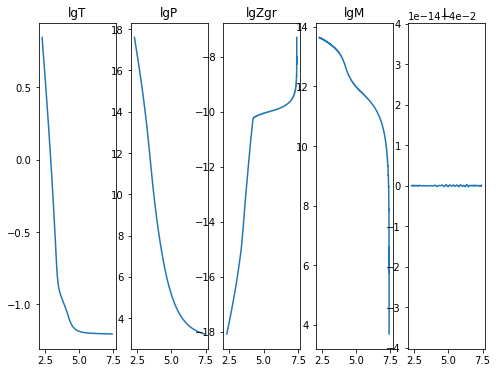

2020-11-18 05:39:21,302 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:39:22,289 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038567
2020-11-18 05:39:22,290 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-11-18 05:39:22,291 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:39:22,292 __main__ 0/1 INFO :: lgM iterate: 13.64107466907507
2020-11-18 05:39:22,293 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:39:22,294 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:39:22,295 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


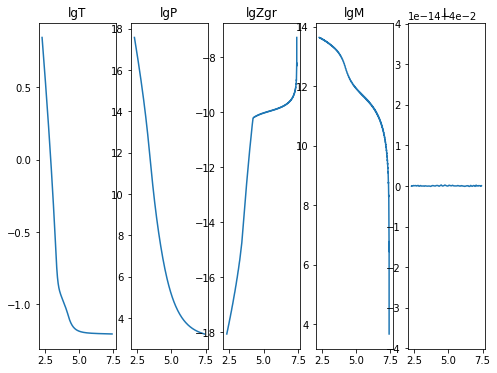

2020-11-18 05:39:26,273 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:39:27,342 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040991
2020-11-18 05:39:27,343 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:39:27,344 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:39:27,345 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-11-18 05:39:27,346 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:39:27,347 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:39:27,348 __main__ 0/1 INFO :: L iterate: 0.04


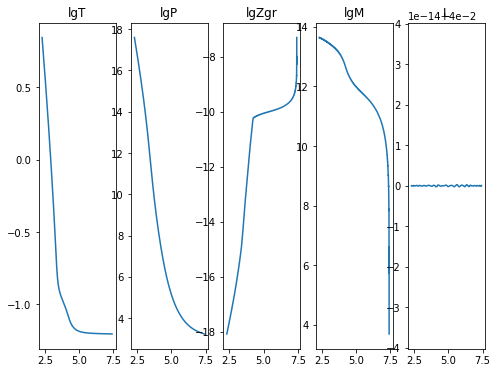

2020-11-18 05:39:30,897 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:39:31,782 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043811
2020-11-18 05:39:31,783 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800373
2020-11-18 05:39:31,784 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:39:31,785 __main__ 0/1 INFO :: lgM iterate: 13.641074669075113
2020-11-18 05:39:31,785 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:39:31,786 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:39:31,787 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


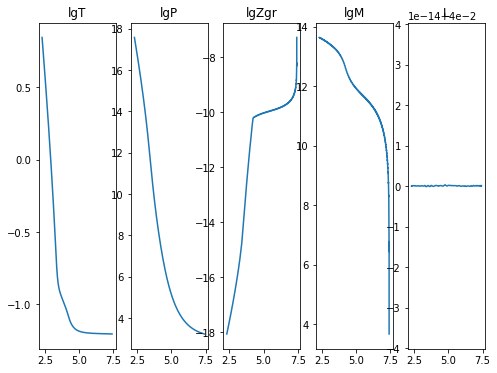

2020-11-18 05:39:35,495 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:39:36,256 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046254
2020-11-18 05:39:36,257 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-11-18 05:39:36,258 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:39:36,258 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-11-18 05:39:36,259 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:39:36,260 __main__ 0/1 INFO :: m iterate: 5.587645173754652e-05
2020-11-18 05:39:36,261 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


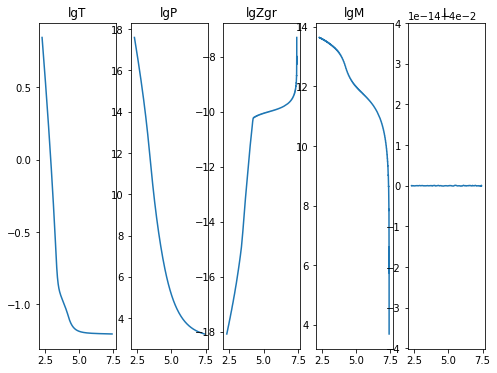

2020-11-18 05:39:39,776 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:39:40,672 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047113
2020-11-18 05:39:40,673 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:39:40,674 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:39:40,676 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:39:40,677 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:39:40,678 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:39:40,679 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


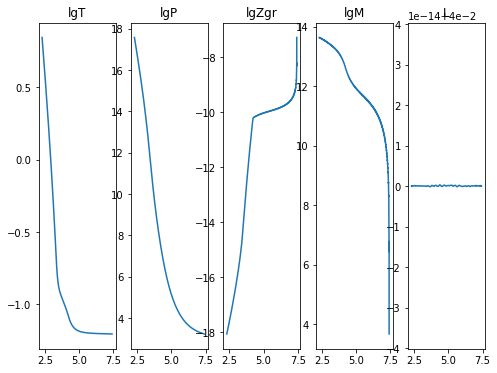

2020-11-18 05:39:44,168 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:39:44,895 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204143
2020-11-18 05:39:44,897 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:39:44,897 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-11-18 05:39:44,898 __main__ 0/1 INFO :: lgM iterate: 13.6411155715329
2020-11-18 05:39:44,899 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-11-18 05:39:44,900 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:39:44,901 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


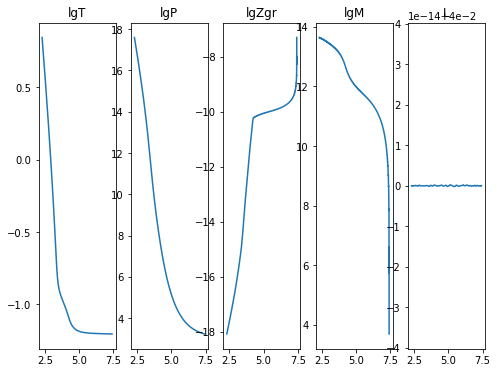

2020-11-18 05:39:48,676 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:39:49,636 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041
2020-11-18 05:39:49,638 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:39:49,639 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:39:49,639 __main__ 0/1 INFO :: lgM iterate: 13.64107466907506
2020-11-18 05:39:49,640 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950043
2020-11-18 05:39:49,642 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:39:49,642 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


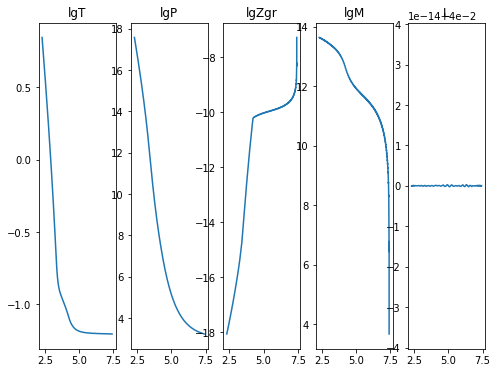

2020-11-18 05:39:53,293 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:39:54,039 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042268
2020-11-18 05:39:54,040 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:39:54,041 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:39:54,042 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:39:54,042 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:39:54,043 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:39:54,044 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


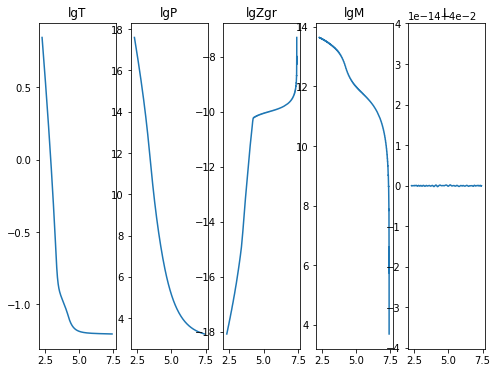

2020-11-18 05:39:58,038 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:39:59,164 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043698
2020-11-18 05:39:59,165 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800368
2020-11-18 05:39:59,166 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:39:59,167 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:39:59,168 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950057
2020-11-18 05:39:59,169 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:39:59,170 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


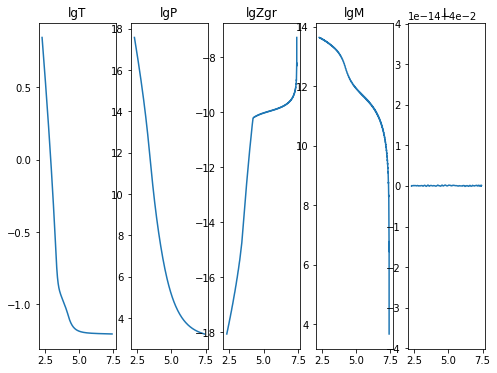

2020-11-18 05:40:03,116 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:40:03,892 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204614
2020-11-18 05:40:03,893 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:40:03,894 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:40:03,895 __main__ 0/1 INFO :: lgM iterate: 13.64111557153291
2020-11-18 05:40:03,896 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:40:03,897 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:40:03,897 __main__ 0/1 INFO :: L iterate: 0.04


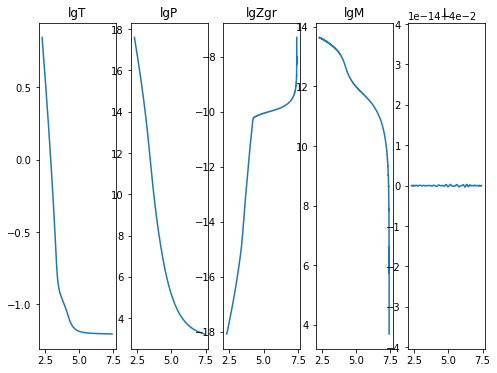

2020-11-18 05:40:07,653 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:40:08,567 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043212
2020-11-18 05:40:08,568 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800389
2020-11-18 05:40:08,569 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:40:08,570 __main__ 0/1 INFO :: lgM iterate: 13.641074669075072
2020-11-18 05:40:08,571 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-11-18 05:40:08,572 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:40:08,573 __main__ 0/1 INFO :: L iterate: 0.04


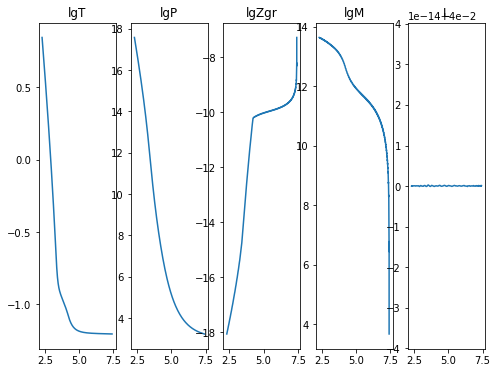

2020-11-18 05:40:12,306 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:40:13,065 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039066
2020-11-18 05:40:13,066 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:40:13,067 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:40:13,068 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:40:13,069 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507862
2020-11-18 05:40:13,070 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:40:13,071 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


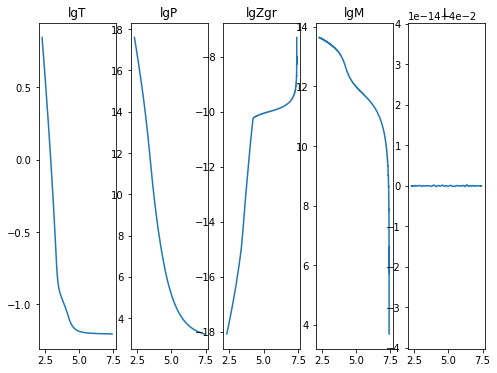

2020-11-18 05:40:16,773 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:40:17,708 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038698
2020-11-18 05:40:17,709 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800333
2020-11-18 05:40:17,710 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:40:17,711 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:40:17,712 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:40:17,713 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:40:17,713 __main__ 0/1 INFO :: L iterate: 0.04


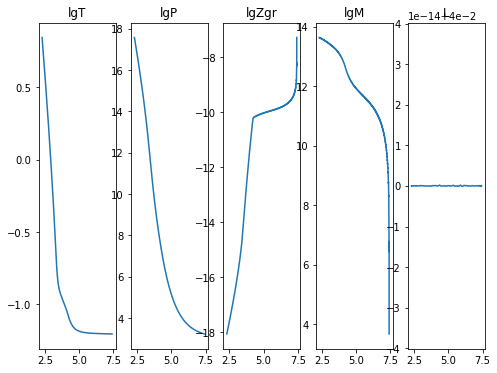

2020-11-18 05:40:21,472 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:40:22,225 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039879
2020-11-18 05:40:22,227 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:40:22,227 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-11-18 05:40:22,228 __main__ 0/1 INFO :: lgM iterate: 13.641115571532998
2020-11-18 05:40:22,229 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078678
2020-11-18 05:40:22,230 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:40:22,231 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


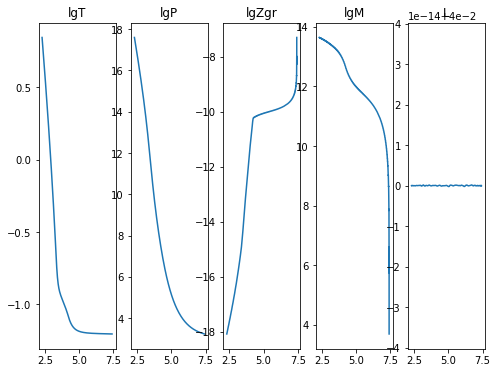

2020-11-18 05:40:25,977 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:40:27,052 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038262
2020-11-18 05:40:27,053 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:40:27,054 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:40:27,055 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:40:27,055 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:40:27,056 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:40:27,057 __main__ 0/1 INFO :: L iterate: 0.04


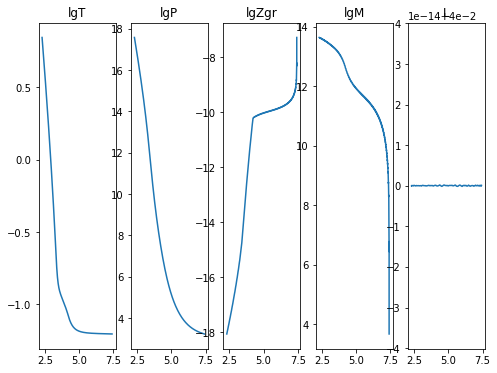

2020-11-18 05:40:30,780 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:40:31,556 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036262
2020-11-18 05:40:31,557 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:40:31,558 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:40:31,559 __main__ 0/1 INFO :: lgM iterate: 13.64111557153293
2020-11-18 05:40:31,560 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:40:31,561 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:40:31,562 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


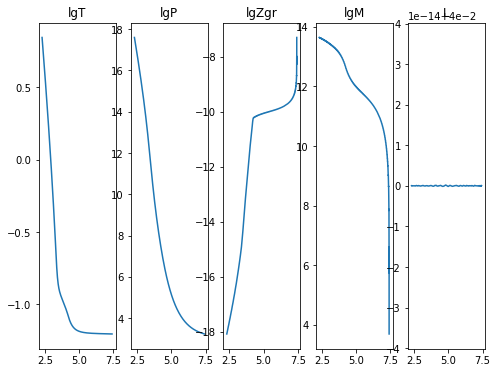

2020-11-18 05:40:35,211 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:40:36,129 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034805
2020-11-18 05:40:36,130 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-11-18 05:40:36,131 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:40:36,132 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:40:36,133 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:40:36,134 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:40:36,134 __main__ 0/1 INFO :: L iterate: 0.04


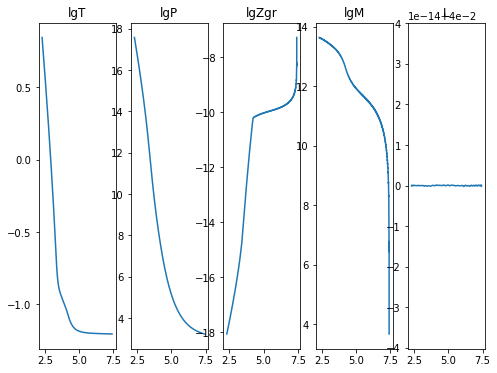

2020-11-18 05:40:39,812 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:40:40,551 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204005
2020-11-18 05:40:40,552 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:40:40,552 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-11-18 05:40:40,553 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:40:40,554 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-11-18 05:40:40,555 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:40:40,556 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


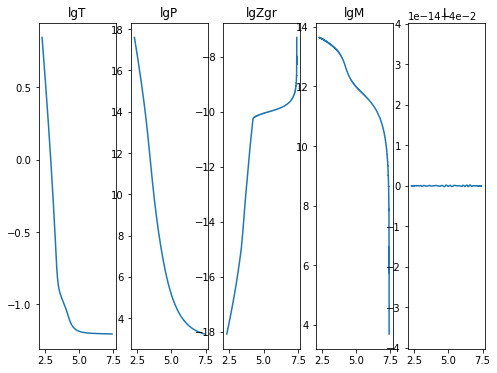

2020-11-18 05:40:44,276 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:40:45,188 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045652
2020-11-18 05:40:45,189 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800383
2020-11-18 05:40:45,190 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:40:45,191 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-11-18 05:40:45,192 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:40:45,193 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:40:45,194 __main__ 0/1 INFO :: L iterate: 0.04


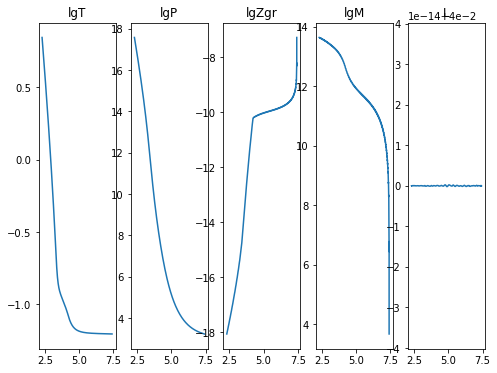

2020-11-18 05:40:48,862 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:40:49,606 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044846
2020-11-18 05:40:49,607 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516539
2020-11-18 05:40:49,608 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:40:49,609 __main__ 0/1 INFO :: lgM iterate: 13.641115571532932
2020-11-18 05:40:49,609 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:40:49,610 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:40:49,611 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


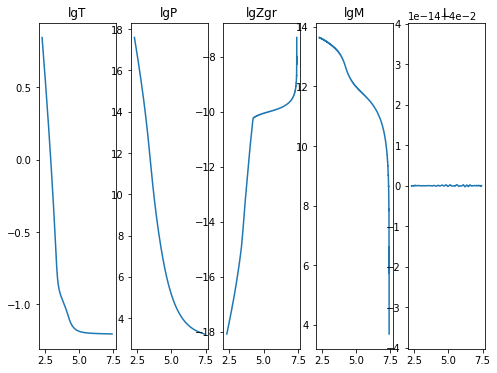

2020-11-18 05:40:53,734 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:40:54,654 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044067
2020-11-18 05:40:54,655 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:40:54,656 __main__ 0/1 INFO :: lgP iterate: 17.5815564529027
2020-11-18 05:40:54,657 __main__ 0/1 INFO :: lgM iterate: 13.641074669075111
2020-11-18 05:40:54,658 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:40:54,659 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:40:54,660 __main__ 0/1 INFO :: L iterate: 0.040000000000000036


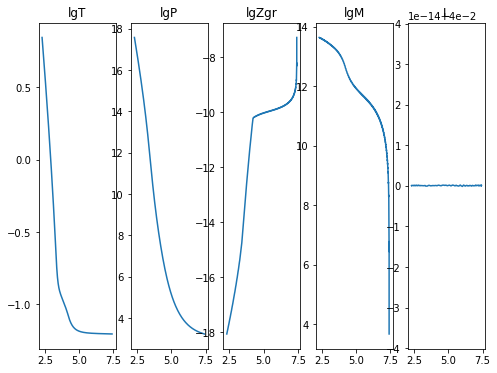

2020-11-18 05:40:58,287 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:40:59,023 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320469
2020-11-18 05:40:59,024 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:40:59,025 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:40:59,026 __main__ 0/1 INFO :: lgM iterate: 13.641115571532975
2020-11-18 05:40:59,027 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507865
2020-11-18 05:40:59,027 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:40:59,028 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


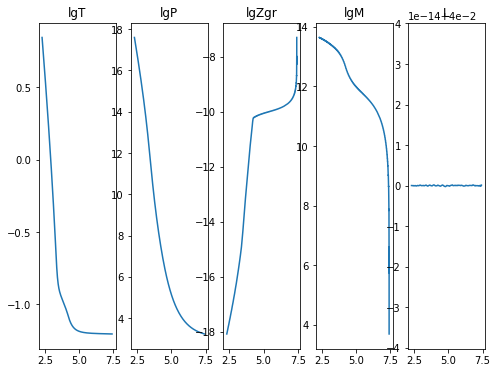

2020-11-18 05:41:02,759 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:03,683 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049849
2020-11-18 05:41:03,684 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-11-18 05:41:03,685 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:41:03,686 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:41:03,687 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:41:03,688 __main__ 0/1 INFO :: m iterate: 5.504256300170596e-05
2020-11-18 05:41:03,689 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


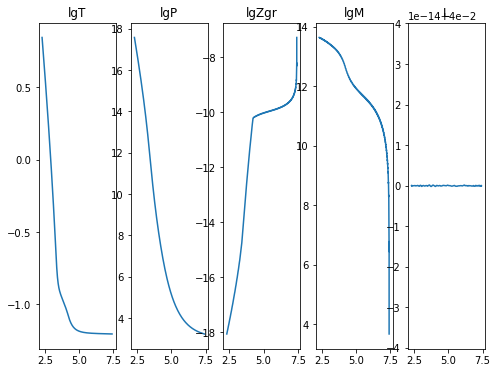

2020-11-18 05:41:07,353 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:41:08,100 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048912
2020-11-18 05:41:08,101 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:41:08,102 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:41:08,103 __main__ 0/1 INFO :: lgM iterate: 13.641115571532909
2020-11-18 05:41:08,104 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:41:08,105 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:41:08,106 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


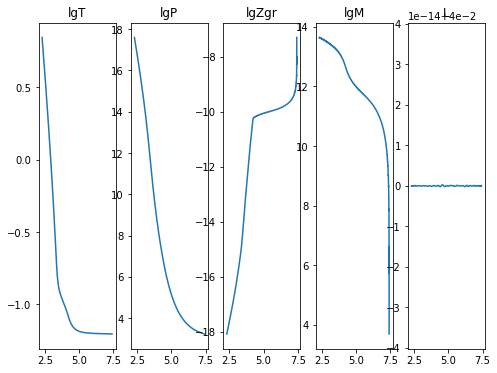

2020-11-18 05:41:11,755 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:12,683 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049083
2020-11-18 05:41:12,684 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-11-18 05:41:12,684 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:41:12,685 __main__ 0/1 INFO :: lgM iterate: 13.641074669075083
2020-11-18 05:41:12,686 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:41:12,687 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:41:12,688 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


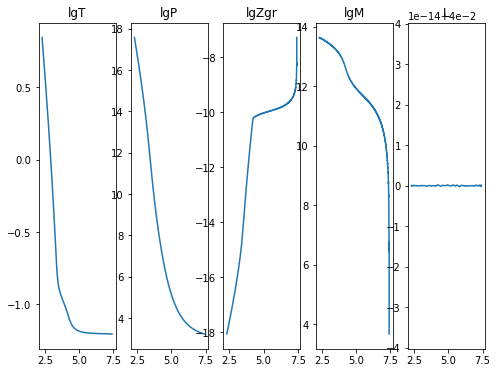

2020-11-18 05:41:16,313 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:41:17,058 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045816
2020-11-18 05:41:17,059 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:41:17,060 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:41:17,061 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:41:17,062 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:41:17,063 __main__ 0/1 INFO :: m iterate: 5.587645173577016e-05
2020-11-18 05:41:17,064 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


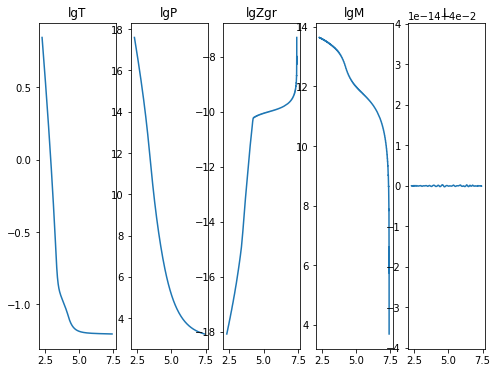

2020-11-18 05:41:20,693 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:21,557 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204408
2020-11-18 05:41:21,558 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-11-18 05:41:21,559 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:41:21,560 __main__ 0/1 INFO :: lgM iterate: 13.64107466907515
2020-11-18 05:41:21,561 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:41:21,562 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:41:21,562 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


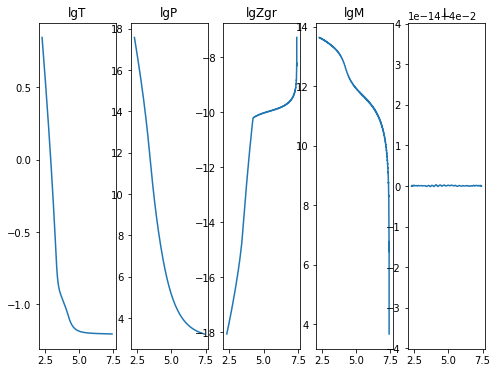

2020-11-18 05:41:25,080 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:25,776 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044444
2020-11-18 05:41:25,778 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516545
2020-11-18 05:41:25,778 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-11-18 05:41:25,779 __main__ 0/1 INFO :: lgM iterate: 13.641115571533
2020-11-18 05:41:25,780 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507868
2020-11-18 05:41:25,781 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:41:25,781 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


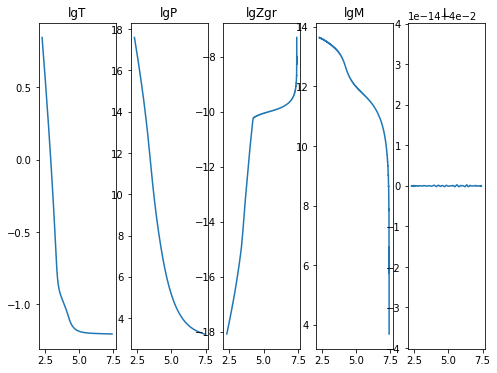

2020-11-18 05:41:29,245 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:30,106 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041629
2020-11-18 05:41:30,107 __main__ 0/1 INFO :: lgT iterate: 0.844929764780038
2020-11-18 05:41:30,108 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:41:30,108 __main__ 0/1 INFO :: lgM iterate: 13.641074669075108
2020-11-18 05:41:30,109 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:41:30,110 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:41:30,111 __main__ 0/1 INFO :: L iterate: 0.04


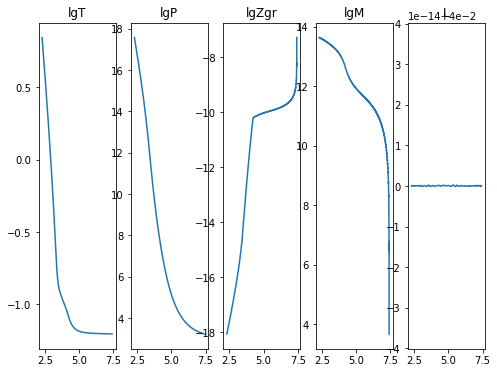

2020-11-18 05:41:33,580 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:34,268 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040711
2020-11-18 05:41:34,269 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-11-18 05:41:34,270 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:41:34,271 __main__ 0/1 INFO :: lgM iterate: 13.64111557153301
2020-11-18 05:41:34,272 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078657
2020-11-18 05:41:34,273 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:41:34,273 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


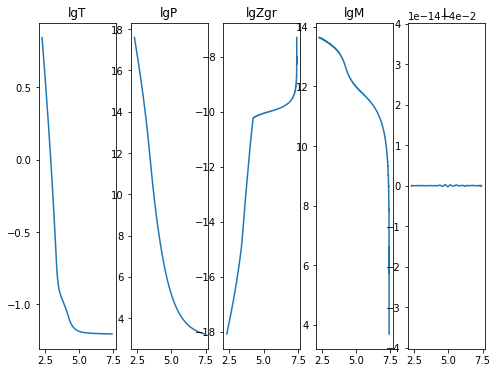

2020-11-18 05:41:37,962 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:41:38,843 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045
2020-11-18 05:41:38,844 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800338
2020-11-18 05:41:38,845 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:41:38,846 __main__ 0/1 INFO :: lgM iterate: 13.641074669075163
2020-11-18 05:41:38,847 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:41:38,848 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:41:38,848 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


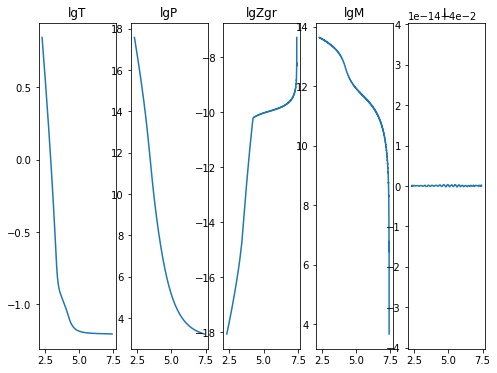

2020-11-18 05:41:42,601 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:41:43,770 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032047182
2020-11-18 05:41:43,773 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516549
2020-11-18 05:41:43,776 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:41:43,778 __main__ 0/1 INFO :: lgM iterate: 13.641115571532918
2020-11-18 05:41:43,782 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:41:43,784 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:41:43,787 __main__ 0/1 INFO :: L iterate: 0.04


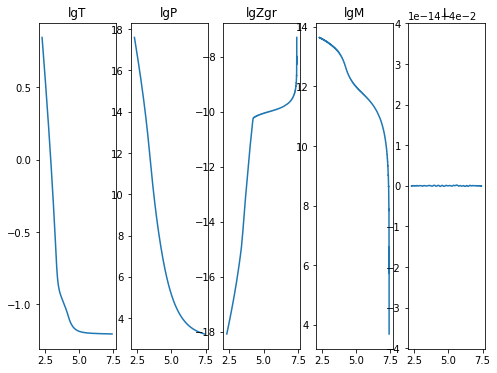

2020-11-18 05:41:47,811 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:41:49,016 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044542
2020-11-18 05:41:49,017 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800345
2020-11-18 05:41:49,018 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:41:49,019 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:41:49,020 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:41:49,021 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:41:49,022 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


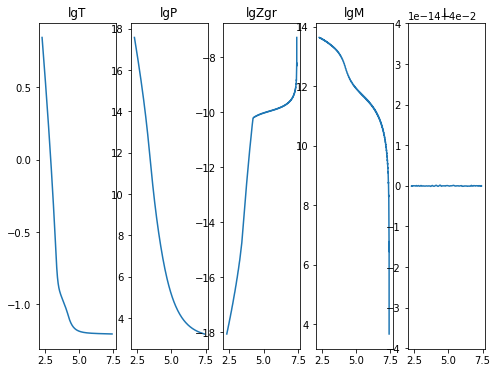

2020-11-18 05:41:53,106 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:41:54,272 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042446
2020-11-18 05:41:54,273 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516535
2020-11-18 05:41:54,274 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:41:54,275 __main__ 0/1 INFO :: lgM iterate: 13.641115571532968
2020-11-18 05:41:54,276 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507863
2020-11-18 05:41:54,277 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:41:54,278 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


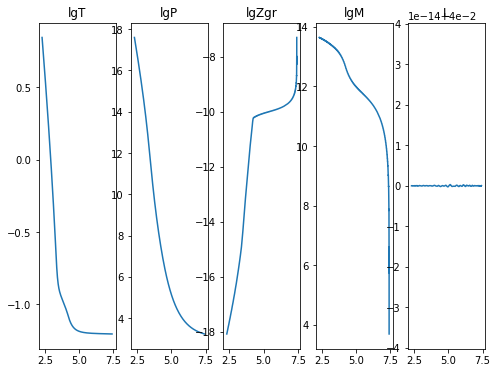

2020-11-18 05:41:57,891 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:41:58,806 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043136
2020-11-18 05:41:58,807 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-11-18 05:41:58,808 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:41:58,809 __main__ 0/1 INFO :: lgM iterate: 13.641074669075099
2020-11-18 05:41:58,810 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-11-18 05:41:58,810 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:41:58,811 __main__ 0/1 INFO :: L iterate: 0.04


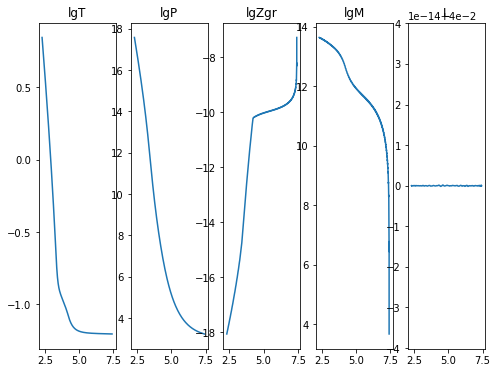

2020-11-18 05:42:02,491 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:42:03,598 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038196
2020-11-18 05:42:03,602 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:42:03,604 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:42:03,607 __main__ 0/1 INFO :: lgM iterate: 13.641115571532962
2020-11-18 05:42:03,609 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:42:03,613 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:42:03,615 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


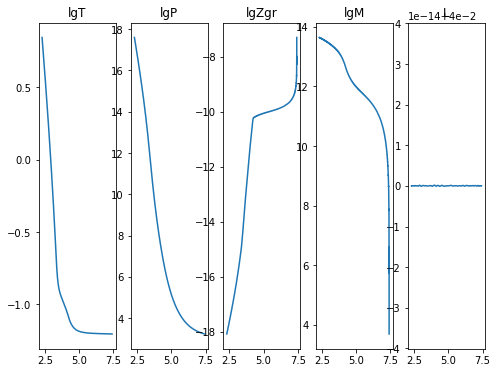

2020-11-18 05:42:07,637 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:42:08,879 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033457
2020-11-18 05:42:08,886 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800382
2020-11-18 05:42:08,904 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:42:08,905 __main__ 0/1 INFO :: lgM iterate: 13.64107466907514
2020-11-18 05:42:08,906 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950135
2020-11-18 05:42:08,907 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:42:08,907 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


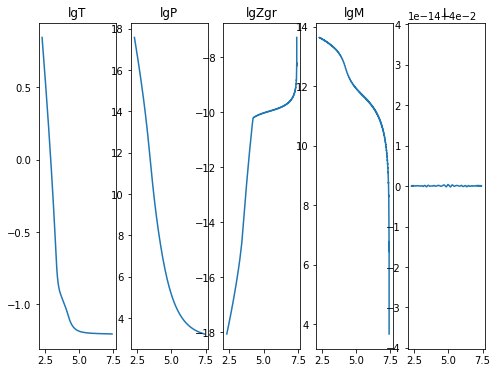

2020-11-18 05:42:13,045 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:42:14,218 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032036961
2020-11-18 05:42:14,219 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:42:14,220 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:42:14,225 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-11-18 05:42:14,227 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:42:14,229 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:42:14,230 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


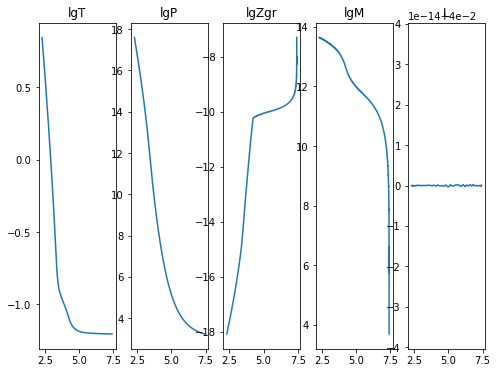

2020-11-18 05:42:18,744 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:42:20,336 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204019
2020-11-18 05:42:20,339 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-11-18 05:42:20,342 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:42:20,344 __main__ 0/1 INFO :: lgM iterate: 13.641074669075135
2020-11-18 05:42:20,348 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-11-18 05:42:20,353 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:42:20,357 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


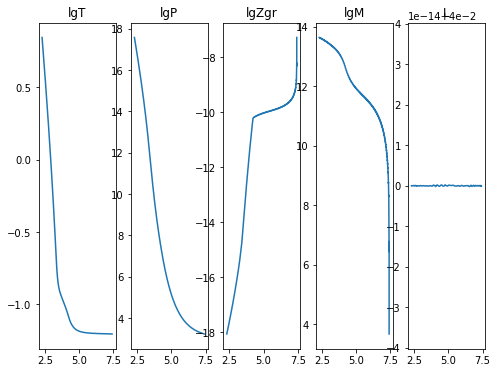

2020-11-18 05:42:25,184 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:42:25,999 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041597
2020-11-18 05:42:26,000 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:42:26,001 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:42:26,002 __main__ 0/1 INFO :: lgM iterate: 13.641115571532925
2020-11-18 05:42:26,003 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:42:26,003 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:42:26,004 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


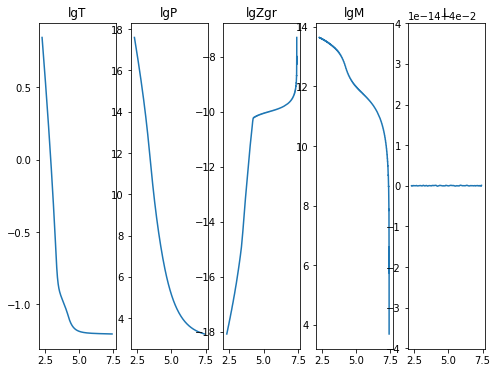

2020-11-18 05:42:29,854 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:42:31,342 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044968
2020-11-18 05:42:31,343 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-11-18 05:42:31,344 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-11-18 05:42:31,346 __main__ 0/1 INFO :: lgM iterate: 13.641074669075097
2020-11-18 05:42:31,347 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950064
2020-11-18 05:42:31,348 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:42:31,349 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


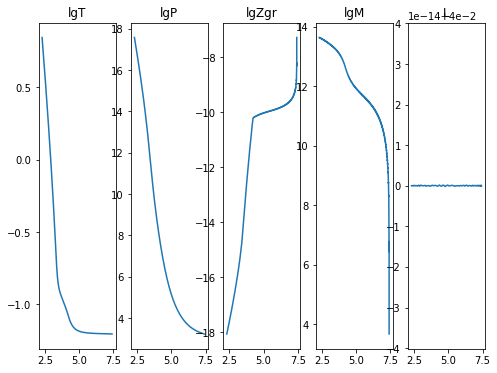

2020-11-18 05:42:35,462 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:42:36,953 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044924
2020-11-18 05:42:36,960 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:42:36,963 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:42:36,965 __main__ 0/1 INFO :: lgM iterate: 13.64111557153289
2020-11-18 05:42:36,968 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:42:36,971 __main__ 0/1 INFO :: m iterate: 5.587645172422384e-05
2020-11-18 05:42:36,972 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


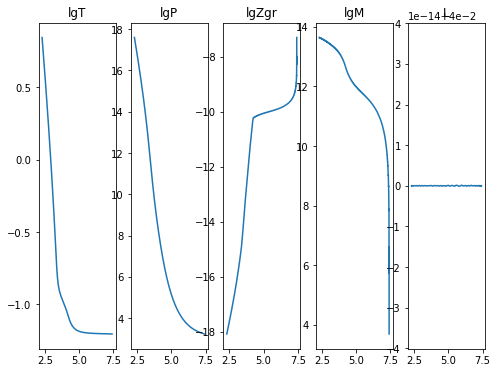

2020-11-18 05:42:40,827 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:42:41,965 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204096
2020-11-18 05:42:41,966 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800367
2020-11-18 05:42:41,967 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:42:41,968 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:42:41,969 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-11-18 05:42:41,970 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:42:41,971 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


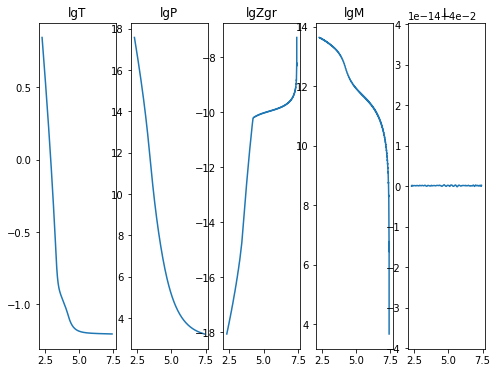

2020-11-18 05:42:45,406 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:42:46,081 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203703
2020-11-18 05:42:46,082 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:42:46,083 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:42:46,084 __main__ 0/1 INFO :: lgM iterate: 13.64111557153296
2020-11-18 05:42:46,084 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:42:46,085 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:42:46,086 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


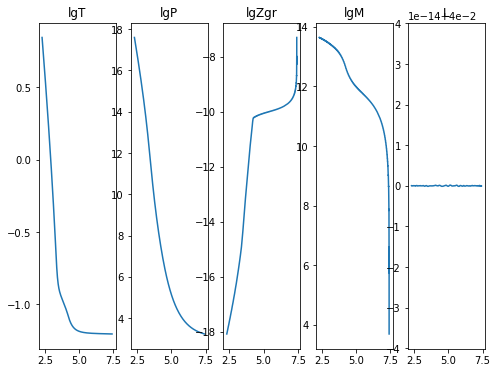

2020-11-18 05:42:49,581 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:42:50,441 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037032
2020-11-18 05:42:50,442 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:42:50,443 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:42:50,444 __main__ 0/1 INFO :: lgM iterate: 13.641074669075067
2020-11-18 05:42:50,444 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-11-18 05:42:50,445 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:42:50,446 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


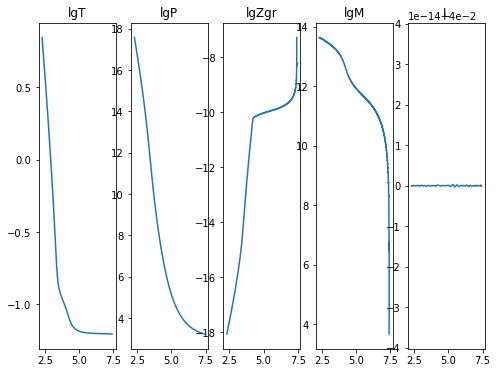

2020-11-18 05:42:53,859 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:42:54,598 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204214
2020-11-18 05:42:54,599 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516535
2020-11-18 05:42:54,600 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:42:54,601 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-11-18 05:42:54,602 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:42:54,602 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:42:54,603 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


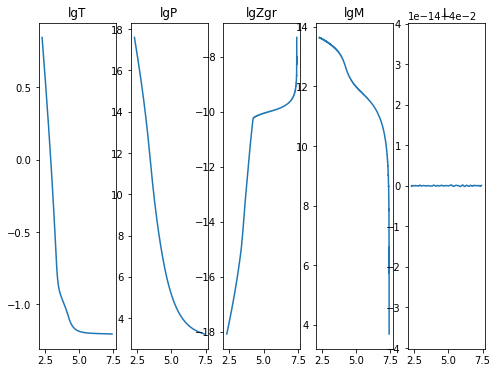

2020-11-18 05:42:58,097 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:42:58,980 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046331
2020-11-18 05:42:58,981 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-11-18 05:42:58,982 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:42:58,983 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:42:58,983 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:42:58,984 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:42:58,985 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


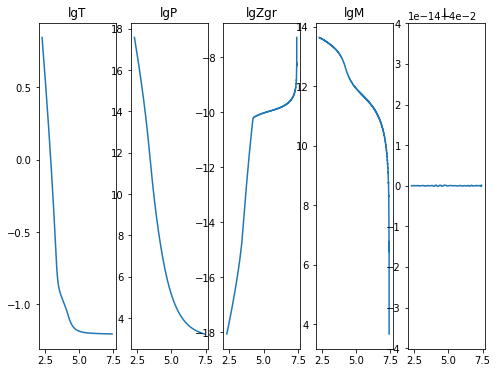

2020-11-18 05:43:02,430 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:43:03,126 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204219
2020-11-18 05:43:03,127 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:43:03,128 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:43:03,129 __main__ 0/1 INFO :: lgM iterate: 13.641115571532918
2020-11-18 05:43:03,129 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:43:03,130 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:43:03,131 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


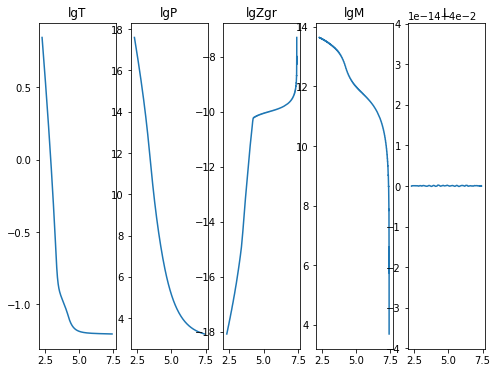

2020-11-18 05:43:06,541 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:43:07,396 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040108
2020-11-18 05:43:07,397 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:43:07,398 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:43:07,399 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-11-18 05:43:07,399 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950068
2020-11-18 05:43:07,400 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:43:07,401 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


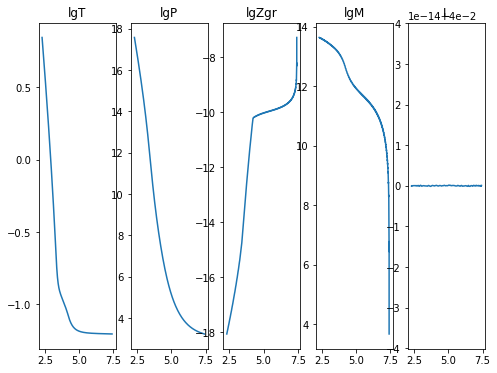

2020-11-18 05:43:10,872 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:43:11,635 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203903
2020-11-18 05:43:11,636 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516547
2020-11-18 05:43:11,637 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:43:11,637 __main__ 0/1 INFO :: lgM iterate: 13.641115571533005
2020-11-18 05:43:11,638 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507867
2020-11-18 05:43:11,639 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:43:11,640 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


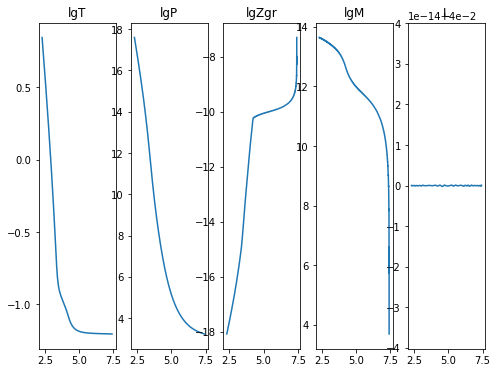

2020-11-18 05:43:15,733 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:43:16,970 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037636
2020-11-18 05:43:16,971 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:43:16,972 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:43:16,973 __main__ 0/1 INFO :: lgM iterate: 13.641074669075124
2020-11-18 05:43:16,974 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:43:16,975 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:43:16,976 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


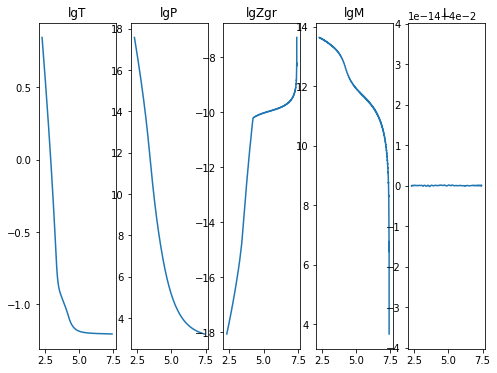

2020-11-18 05:43:21,249 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:43:22,223 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038642
2020-11-18 05:43:22,224 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:43:22,225 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-11-18 05:43:22,226 __main__ 0/1 INFO :: lgM iterate: 13.641115571532907
2020-11-18 05:43:22,226 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-11-18 05:43:22,227 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:43:22,228 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


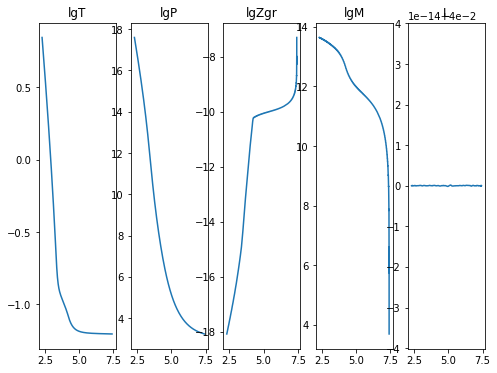

2020-11-18 05:43:26,601 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:43:27,618 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204115
2020-11-18 05:43:27,619 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:43:27,620 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:43:27,621 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:43:27,622 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:43:27,623 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:43:27,624 __main__ 0/1 INFO :: L iterate: 0.04


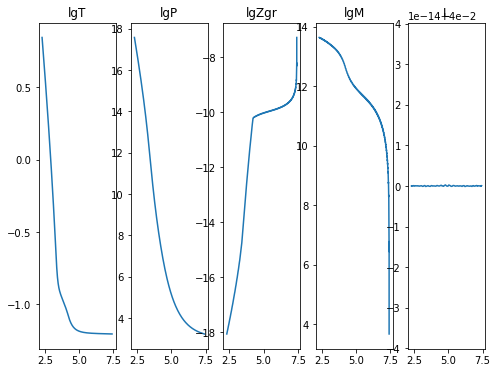

2020-11-18 05:43:31,305 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:43:32,356 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046316
2020-11-18 05:43:32,357 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516545
2020-11-18 05:43:32,358 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:43:32,359 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-11-18 05:43:32,360 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:43:32,361 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:43:32,362 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


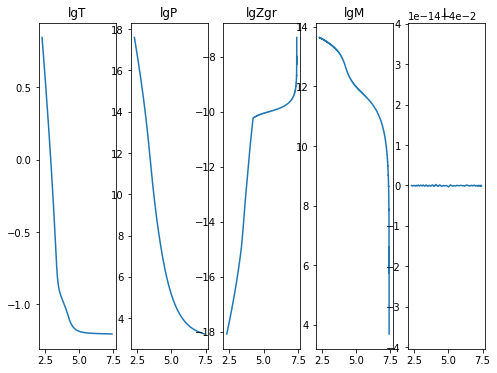

2020-11-18 05:43:36,742 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-11-18 05:43:37,841 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032049884
2020-11-18 05:43:37,842 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:43:37,843 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:43:37,844 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-11-18 05:43:37,845 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:43:37,846 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:43:37,847 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


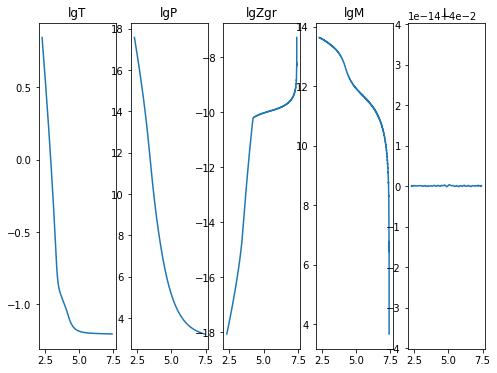

2020-11-18 05:43:42,130 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:43:43,527 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046744
2020-11-18 05:43:43,528 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:43:43,529 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:43:43,530 __main__ 0/1 INFO :: lgM iterate: 13.641115571532968
2020-11-18 05:43:43,530 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078635
2020-11-18 05:43:43,531 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:43:43,532 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


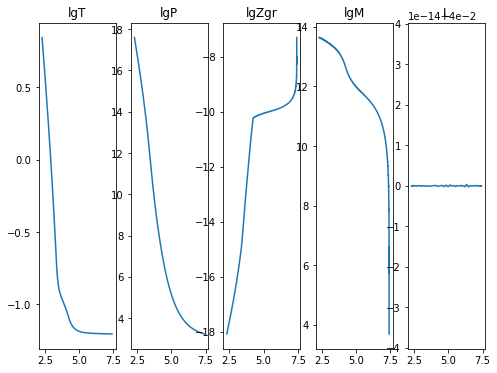

2020-11-18 05:43:47,826 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:43:48,828 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044009
2020-11-18 05:43:48,830 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-11-18 05:43:48,831 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:43:48,831 __main__ 0/1 INFO :: lgM iterate: 13.641074669075156
2020-11-18 05:43:48,832 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695014
2020-11-18 05:43:48,833 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:43:48,833 __main__ 0/1 INFO :: L iterate: 0.04


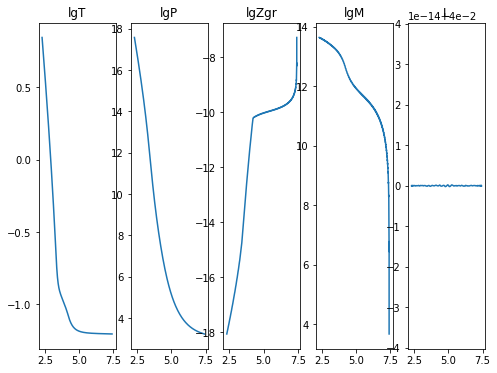

2020-11-18 05:43:52,709 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:43:53,527 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204788
2020-11-18 05:43:53,530 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-11-18 05:43:53,531 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-11-18 05:43:53,532 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-11-18 05:43:53,533 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:43:53,534 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:43:53,535 __main__ 0/1 INFO :: L iterate: 0.04


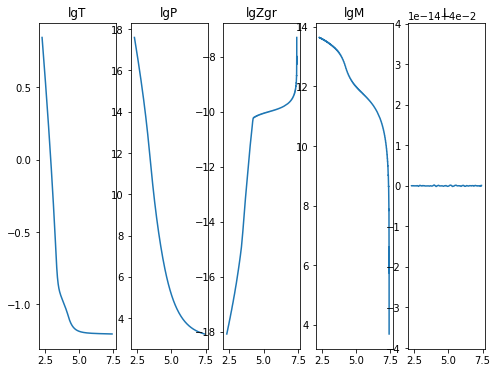

2020-11-18 05:43:57,542 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:43:58,513 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032051858
2020-11-18 05:43:58,514 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-11-18 05:43:58,515 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:43:58,516 __main__ 0/1 INFO :: lgM iterate: 13.64107466907509
2020-11-18 05:43:58,517 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695007
2020-11-18 05:43:58,517 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:43:58,518 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


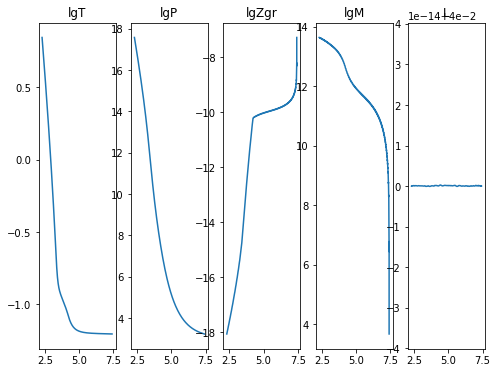

2020-11-18 05:44:02,340 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:44:03,225 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041577
2020-11-18 05:44:03,227 __main__ 0/1 INFO :: lgT iterate: 0.845552306051652
2020-11-18 05:44:03,227 __main__ 0/1 INFO :: lgP iterate: 17.59681772025327
2020-11-18 05:44:03,228 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-11-18 05:44:03,229 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078586
2020-11-18 05:44:03,230 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:44:03,230 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


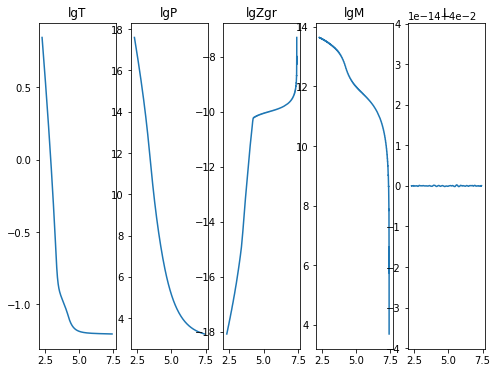

2020-11-18 05:44:07,317 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:44:08,916 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032034796
2020-11-18 05:44:08,925 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800358
2020-11-18 05:44:08,926 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:44:08,926 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-11-18 05:44:08,927 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:44:08,928 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:44:08,929 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


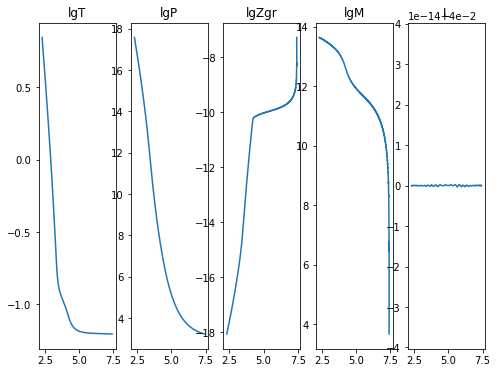

2020-11-18 05:44:12,855 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:44:14,080 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040803
2020-11-18 05:44:14,081 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:44:14,082 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:44:14,086 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-11-18 05:44:14,088 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:44:14,091 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:44:14,092 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


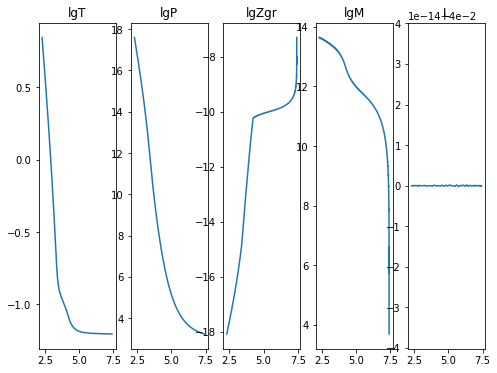

2020-11-18 05:44:18,029 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:44:19,148 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320428
2020-11-18 05:44:19,149 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:44:19,150 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:44:19,151 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:44:19,151 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:44:19,152 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:44:19,153 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


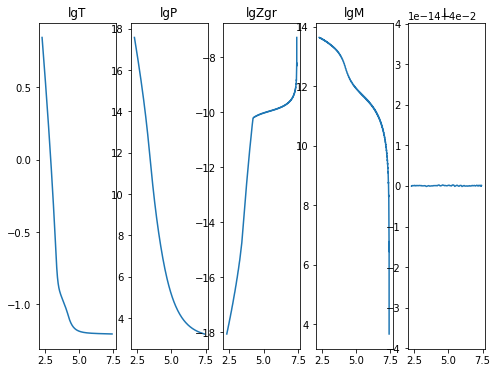

2020-11-18 05:44:23,131 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:44:24,436 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042108
2020-11-18 05:44:24,437 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516514
2020-11-18 05:44:24,437 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:44:24,438 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:44:24,439 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:44:24,440 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:44:24,440 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


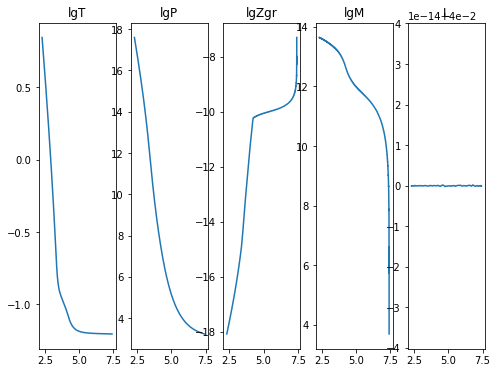

2020-11-18 05:44:28,648 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:44:30,000 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043063
2020-11-18 05:44:30,002 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800326
2020-11-18 05:44:30,003 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:44:30,004 __main__ 0/1 INFO :: lgM iterate: 13.641074669075095
2020-11-18 05:44:30,005 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:44:30,006 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:44:30,007 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


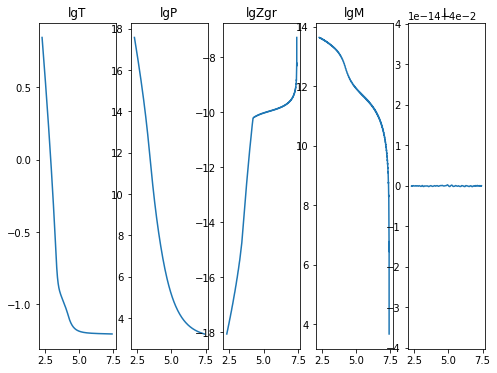

2020-11-18 05:44:34,064 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:44:34,790 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044095
2020-11-18 05:44:34,791 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516518
2020-11-18 05:44:34,791 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:44:34,792 __main__ 0/1 INFO :: lgM iterate: 13.641115571532879
2020-11-18 05:44:34,793 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-11-18 05:44:34,794 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:44:34,794 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


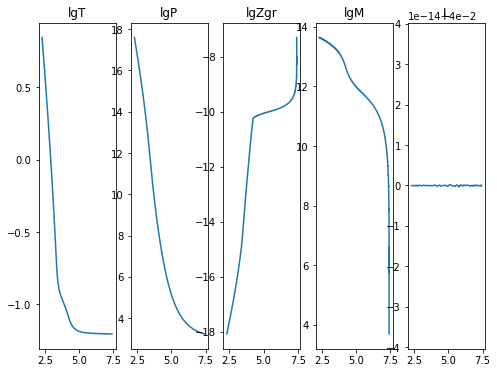

2020-11-18 05:44:38,480 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:44:39,360 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044142
2020-11-18 05:44:39,361 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:44:39,362 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:44:39,363 __main__ 0/1 INFO :: lgM iterate: 13.641074669075078
2020-11-18 05:44:39,363 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:44:39,364 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:44:39,365 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


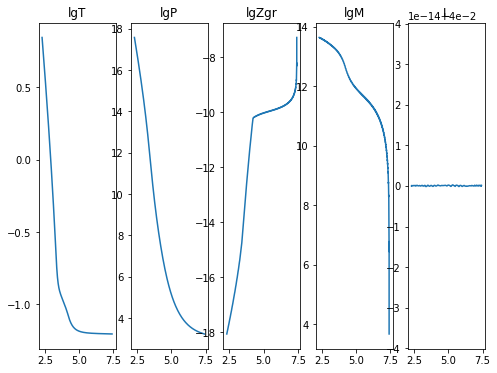

2020-11-18 05:44:42,922 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:44:43,808 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204083
2020-11-18 05:44:43,809 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-11-18 05:44:43,809 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-11-18 05:44:43,810 __main__ 0/1 INFO :: lgM iterate: 13.6411155715329
2020-11-18 05:44:43,811 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507856
2020-11-18 05:44:43,812 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:44:43,813 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


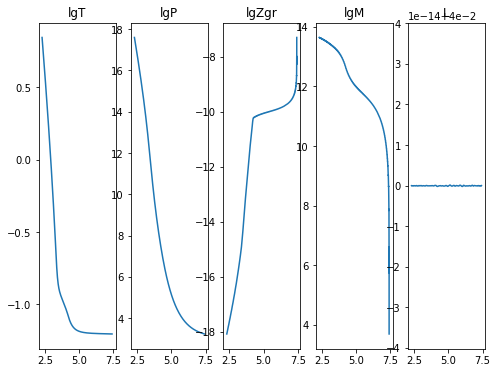

2020-11-18 05:44:47,769 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:44:48,724 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038027
2020-11-18 05:44:48,726 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800357
2020-11-18 05:44:48,726 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:44:48,727 __main__ 0/1 INFO :: lgM iterate: 13.641074669075087
2020-11-18 05:44:48,728 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:44:48,729 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:44:48,730 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


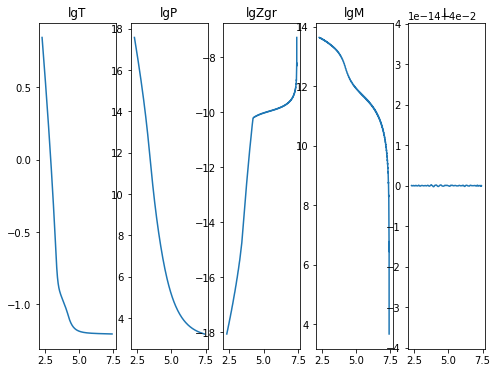

2020-11-18 05:44:52,876 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:44:53,921 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043265
2020-11-18 05:44:53,922 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:44:53,923 __main__ 0/1 INFO :: lgP iterate: 17.596817720253327
2020-11-18 05:44:53,924 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-11-18 05:44:53,925 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:44:53,926 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:44:53,926 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


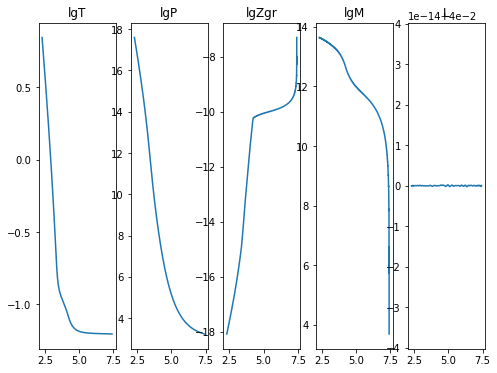

2020-11-18 05:44:58,422 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:44:59,478 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044675
2020-11-18 05:44:59,479 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800372
2020-11-18 05:44:59,480 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:44:59,481 __main__ 0/1 INFO :: lgM iterate: 13.64107466907513
2020-11-18 05:44:59,481 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950114
2020-11-18 05:44:59,482 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:44:59,483 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


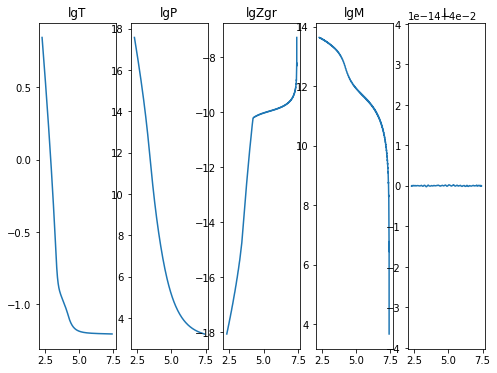

2020-11-18 05:45:03,175 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:04,006 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038942
2020-11-18 05:45:04,007 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:45:04,008 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:45:04,008 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-11-18 05:45:04,009 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:45:04,010 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:45:04,010 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


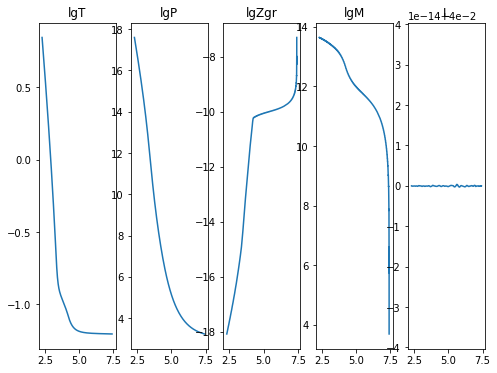

2020-11-18 05:45:07,514 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:08,458 __main__ 0/1 INFO :: Perturbation norm: 1.74046460320382
2020-11-18 05:45:08,459 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800363
2020-11-18 05:45:08,460 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:45:08,460 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:45:08,461 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:45:08,462 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:45:08,463 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


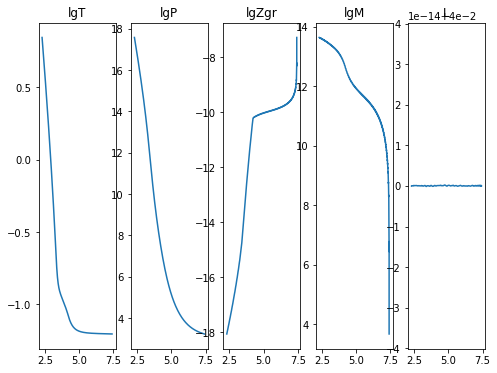

2020-11-18 05:45:11,907 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:45:12,613 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038598
2020-11-18 05:45:12,614 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516527
2020-11-18 05:45:12,615 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:45:12,616 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:45:12,617 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:45:12,617 __main__ 0/1 INFO :: m iterate: 5.58764517260002e-05
2020-11-18 05:45:12,618 __main__ 0/1 INFO :: L iterate: 0.04


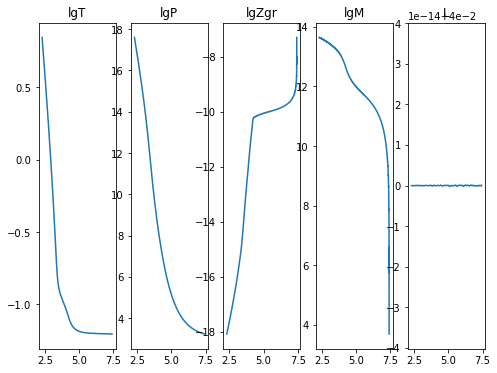

2020-11-18 05:45:16,144 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:17,012 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038231
2020-11-18 05:45:17,013 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800356
2020-11-18 05:45:17,014 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:45:17,015 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-11-18 05:45:17,016 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:45:17,017 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:45:17,017 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


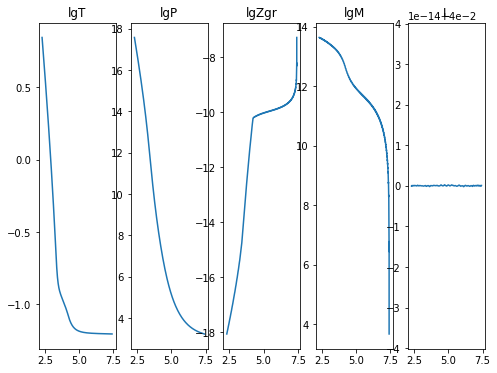

2020-11-18 05:45:20,453 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:21,150 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035311
2020-11-18 05:45:21,151 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516545
2020-11-18 05:45:21,152 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:45:21,152 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-11-18 05:45:21,153 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-11-18 05:45:21,154 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:45:21,155 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


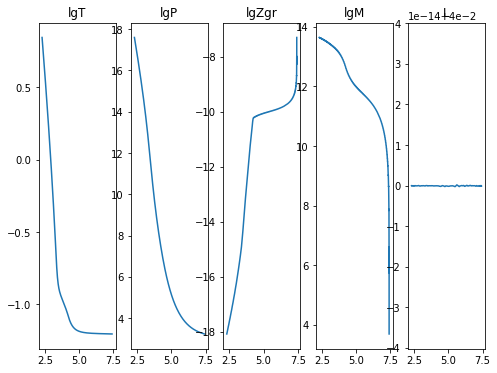

2020-11-18 05:45:24,586 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:25,474 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032028712
2020-11-18 05:45:25,476 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800379
2020-11-18 05:45:25,476 __main__ 0/1 INFO :: lgP iterate: 17.581556452902692
2020-11-18 05:45:25,477 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-11-18 05:45:25,478 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:45:25,479 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:45:25,480 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


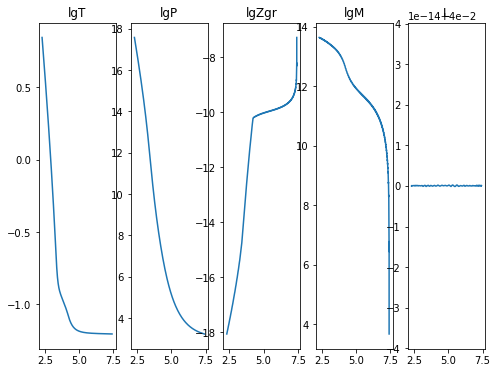

2020-11-18 05:45:28,899 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:29,623 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032027669
2020-11-18 05:45:29,624 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:45:29,625 __main__ 0/1 INFO :: lgP iterate: 17.596817720253302
2020-11-18 05:45:29,626 __main__ 0/1 INFO :: lgM iterate: 13.641115571532895
2020-11-18 05:45:29,627 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078575
2020-11-18 05:45:29,628 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:45:29,628 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


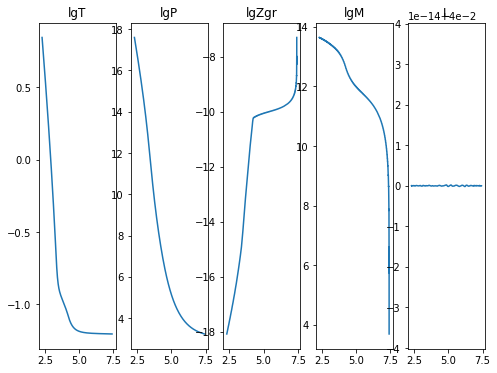

2020-11-18 05:45:33,184 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:34,080 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032029865
2020-11-18 05:45:34,081 __main__ 0/1 INFO :: lgT iterate: 0.844929764780034
2020-11-18 05:45:34,082 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:45:34,083 __main__ 0/1 INFO :: lgM iterate: 13.641074669075048
2020-11-18 05:45:34,084 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:45:34,085 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:45:34,086 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


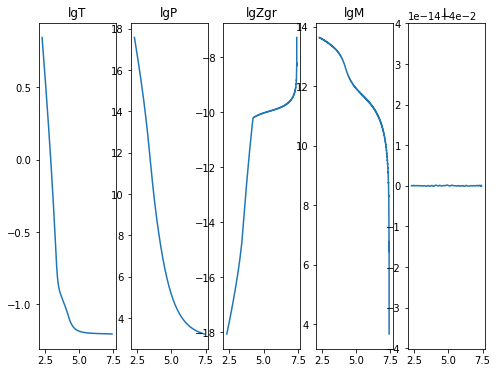

2020-11-18 05:45:37,533 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:38,237 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035724
2020-11-18 05:45:38,238 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:45:38,239 __main__ 0/1 INFO :: lgP iterate: 17.59681772025328
2020-11-18 05:45:38,240 __main__ 0/1 INFO :: lgM iterate: 13.641115571532923
2020-11-18 05:45:38,241 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:45:38,242 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:45:38,243 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


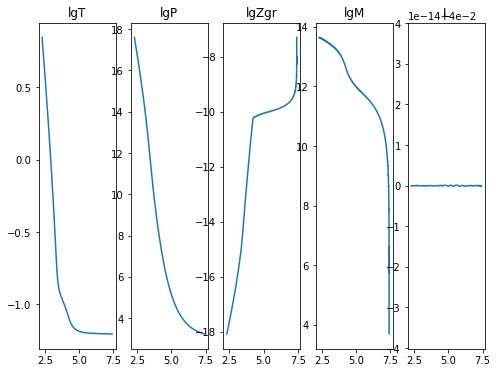

2020-11-18 05:45:41,698 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:42,565 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042146
2020-11-18 05:45:42,566 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800342
2020-11-18 05:45:42,567 __main__ 0/1 INFO :: lgP iterate: 17.581556452902657
2020-11-18 05:45:42,568 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:45:42,568 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:45:42,569 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-11-18 05:45:42,570 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


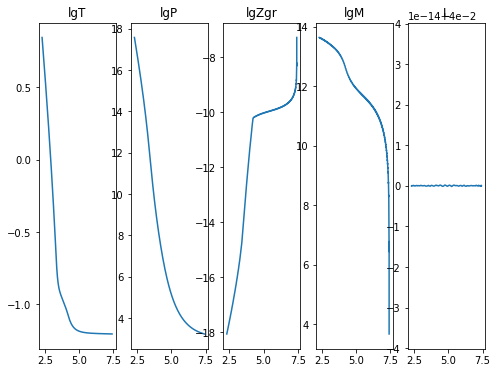

2020-11-18 05:45:45,997 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:46,711 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041962
2020-11-18 05:45:46,712 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-11-18 05:45:46,712 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:45:46,713 __main__ 0/1 INFO :: lgM iterate: 13.641115571532893
2020-11-18 05:45:46,714 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507857
2020-11-18 05:45:46,715 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:45:46,716 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


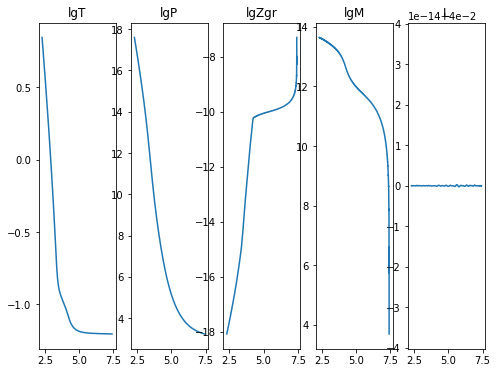

2020-11-18 05:45:50,220 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:51,080 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040434
2020-11-18 05:45:51,081 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:45:51,082 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:45:51,083 __main__ 0/1 INFO :: lgM iterate: 13.641074669075106
2020-11-18 05:45:51,084 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950093
2020-11-18 05:45:51,084 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:45:51,085 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


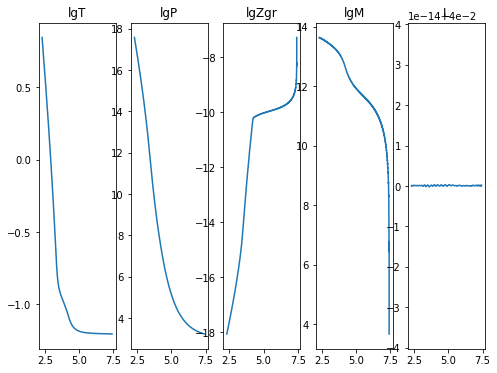

2020-11-18 05:45:54,520 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:45:55,277 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035889
2020-11-18 05:45:55,279 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:45:55,279 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:45:55,280 __main__ 0/1 INFO :: lgM iterate: 13.641115571532954
2020-11-18 05:45:55,281 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:45:55,282 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:45:55,283 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


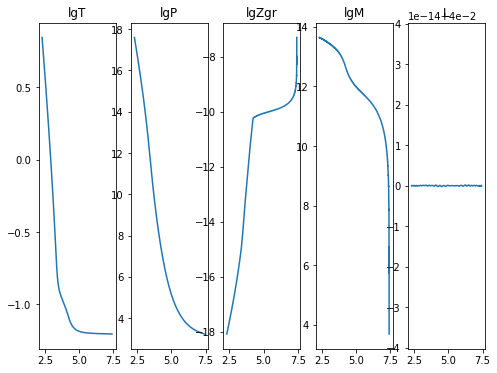

2020-11-18 05:45:58,702 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:45:59,581 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032033138
2020-11-18 05:45:59,582 __main__ 0/1 INFO :: lgT iterate: 0.844929764780036
2020-11-18 05:45:59,583 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:45:59,583 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:45:59,584 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950107
2020-11-18 05:45:59,585 __main__ 0/1 INFO :: m iterate: 5.5042563015028634e-05
2020-11-18 05:45:59,586 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


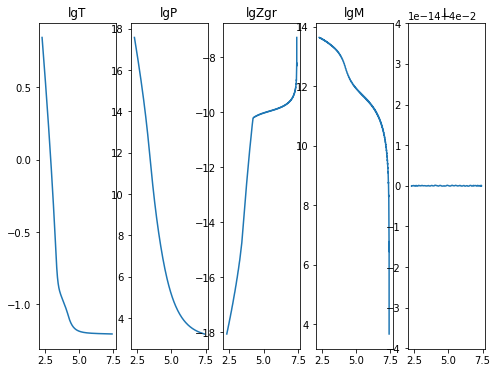

2020-11-18 05:46:03,160 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:03,876 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035802
2020-11-18 05:46:03,877 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516528
2020-11-18 05:46:03,878 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:46:03,878 __main__ 0/1 INFO :: lgM iterate: 13.641115571532945
2020-11-18 05:46:03,879 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078593
2020-11-18 05:46:03,880 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:46:03,881 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


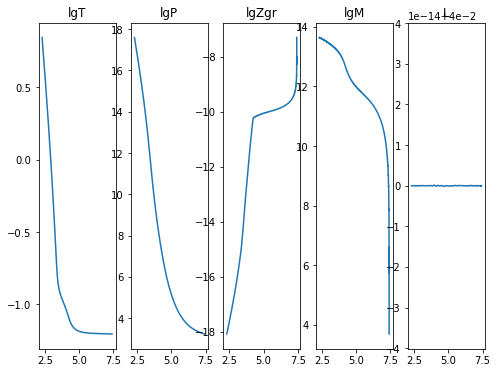

2020-11-18 05:46:07,516 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:46:08,438 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039355
2020-11-18 05:46:08,439 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800355
2020-11-18 05:46:08,440 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:46:08,441 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:46:08,442 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:46:08,443 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:46:08,443 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


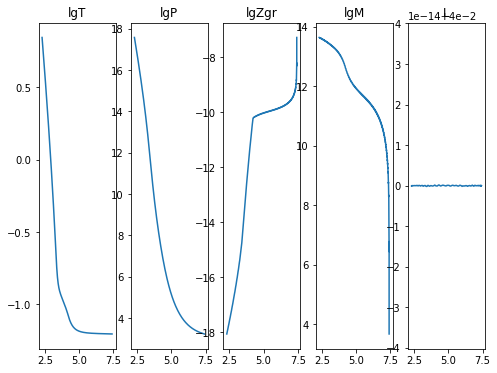

2020-11-18 05:46:11,988 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:12,776 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040534
2020-11-18 05:46:12,777 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-11-18 05:46:12,778 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:46:12,779 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:46:12,780 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:46:12,781 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:46:12,782 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


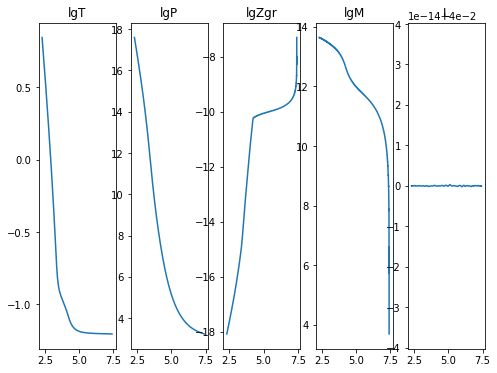

2020-11-18 05:46:16,342 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:17,370 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204269
2020-11-18 05:46:17,371 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:46:17,372 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:46:17,373 __main__ 0/1 INFO :: lgM iterate: 13.641074669075103
2020-11-18 05:46:17,373 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:46:17,374 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:46:17,375 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


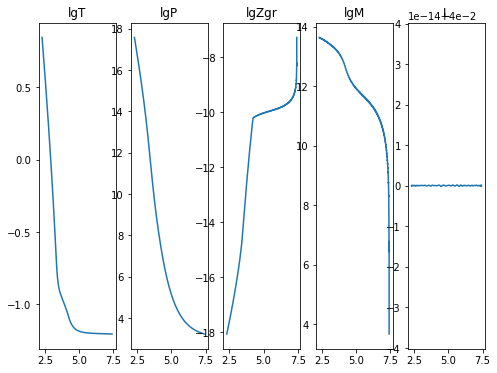

2020-11-18 05:46:21,203 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:22,125 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204331
2020-11-18 05:46:22,126 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516525
2020-11-18 05:46:22,127 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:46:22,127 __main__ 0/1 INFO :: lgM iterate: 13.641115571532922
2020-11-18 05:46:22,128 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:46:22,129 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:46:22,130 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


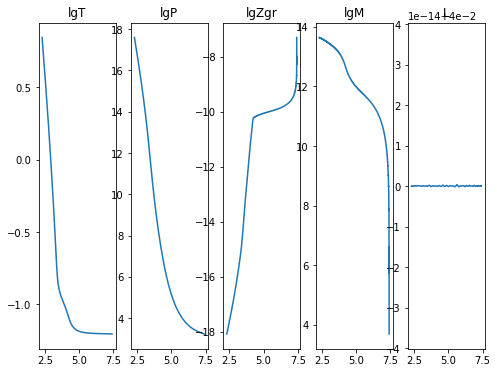

2020-11-18 05:46:25,750 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:46:26,866 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042188
2020-11-18 05:46:26,868 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800348
2020-11-18 05:46:26,869 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:46:26,870 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:46:26,871 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-11-18 05:46:26,872 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:46:26,873 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


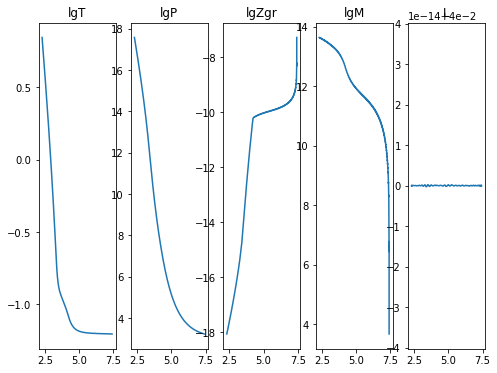

2020-11-18 05:46:30,438 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:31,137 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203836
2020-11-18 05:46:31,138 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:46:31,139 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:46:31,139 __main__ 0/1 INFO :: lgM iterate: 13.641115571532952
2020-11-18 05:46:31,140 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:46:31,141 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:46:31,141 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


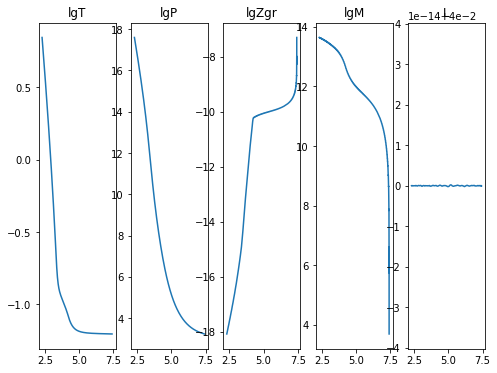

2020-11-18 05:46:34,640 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:35,528 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203657
2020-11-18 05:46:35,529 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:46:35,530 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:46:35,531 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:46:35,531 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:46:35,532 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:46:35,533 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


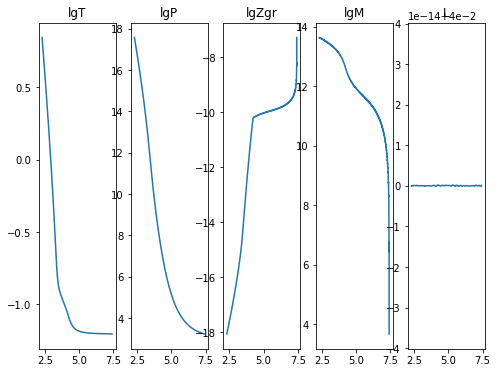

2020-11-18 05:46:39,886 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:46:40,855 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035822
2020-11-18 05:46:40,857 __main__ 0/1 INFO :: lgT iterate: 0.845552306051654
2020-11-18 05:46:40,857 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:46:40,858 __main__ 0/1 INFO :: lgM iterate: 13.641115571532936
2020-11-18 05:46:40,859 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078614
2020-11-18 05:46:40,860 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:46:40,864 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


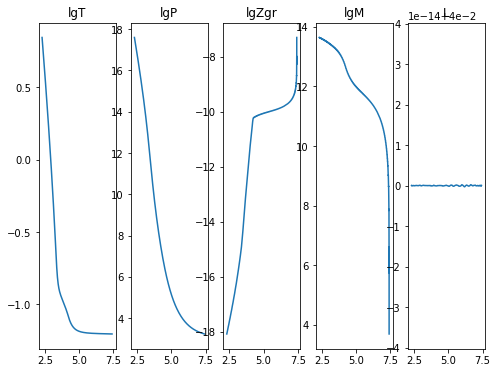

2020-11-18 05:46:44,981 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:46:45,887 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032031716
2020-11-18 05:46:45,888 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800341
2020-11-18 05:46:45,889 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:46:45,890 __main__ 0/1 INFO :: lgM iterate: 13.641074669075115
2020-11-18 05:46:45,890 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:46:45,891 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:46:45,892 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


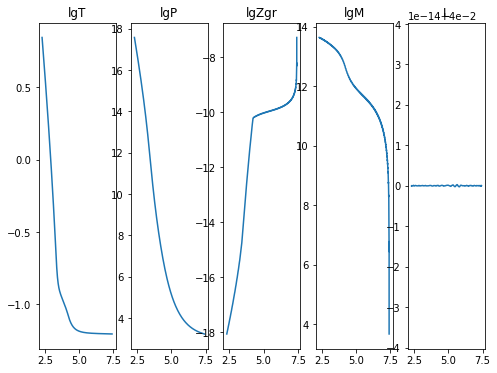

2020-11-18 05:46:50,067 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:46:50,917 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038402
2020-11-18 05:46:50,918 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516523
2020-11-18 05:46:50,919 __main__ 0/1 INFO :: lgP iterate: 17.596817720253323
2020-11-18 05:46:50,920 __main__ 0/1 INFO :: lgM iterate: 13.641115571532998
2020-11-18 05:46:50,921 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078667
2020-11-18 05:46:50,922 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:46:50,923 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


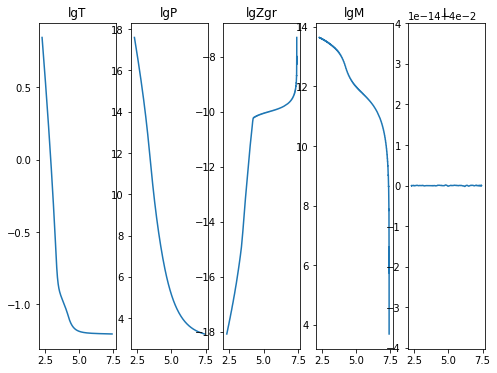

2020-11-18 05:46:55,585 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:46:56,655 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046291
2020-11-18 05:46:56,656 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:46:56,657 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:46:56,658 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:46:56,658 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-11-18 05:46:56,659 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:46:56,660 __main__ 0/1 INFO :: L iterate: 0.04


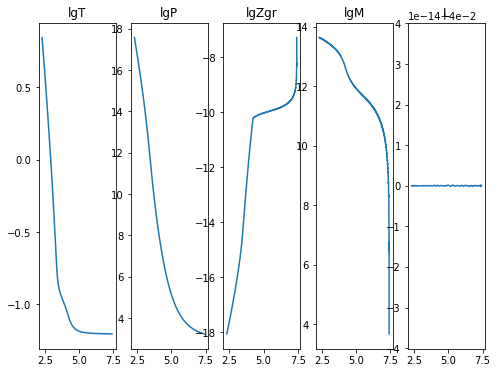

2020-11-18 05:47:00,517 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:47:01,430 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048485
2020-11-18 05:47:01,431 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516554
2020-11-18 05:47:01,432 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:47:01,432 __main__ 0/1 INFO :: lgM iterate: 13.641115571532971
2020-11-18 05:47:01,433 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078632
2020-11-18 05:47:01,434 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:47:01,435 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


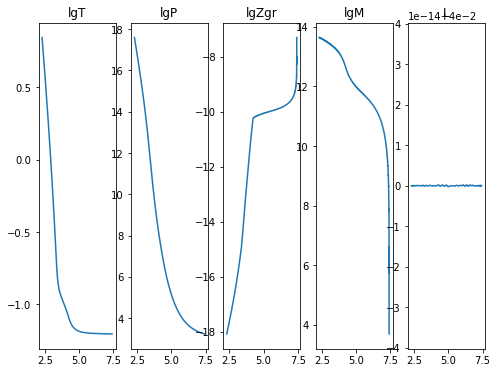

2020-11-18 05:47:05,235 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:47:06,105 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032050628
2020-11-18 05:47:06,107 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-11-18 05:47:06,107 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:47:06,108 __main__ 0/1 INFO :: lgM iterate: 13.641074669075081
2020-11-18 05:47:06,109 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695005
2020-11-18 05:47:06,110 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:47:06,110 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


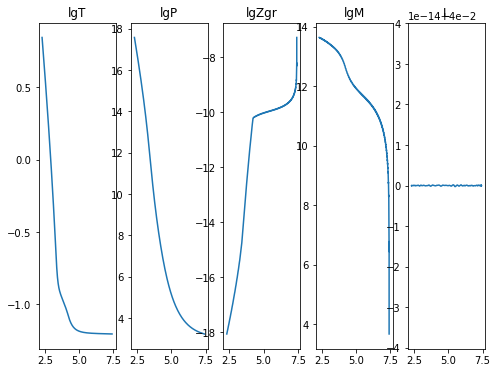

2020-11-18 05:47:09,572 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:10,280 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048396
2020-11-18 05:47:10,281 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:47:10,282 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:47:10,283 __main__ 0/1 INFO :: lgM iterate: 13.64111557153285
2020-11-18 05:47:10,284 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507854
2020-11-18 05:47:10,285 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:47:10,286 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


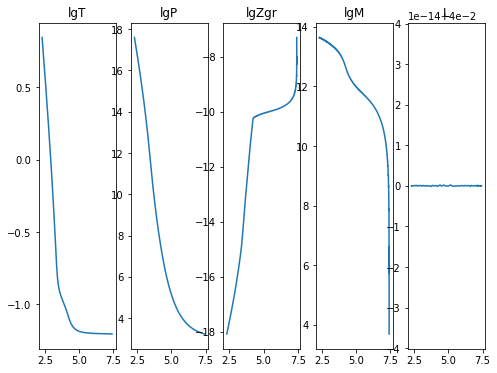

2020-11-18 05:47:13,756 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:14,590 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043858
2020-11-18 05:47:14,591 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:47:14,592 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:47:14,593 __main__ 0/1 INFO :: lgM iterate: 13.641074669075092
2020-11-18 05:47:14,594 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:47:14,595 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:47:14,595 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


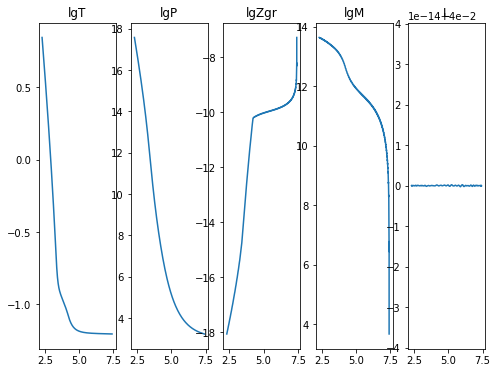

2020-11-18 05:47:18,107 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:18,845 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045639
2020-11-18 05:47:18,846 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:47:18,846 __main__ 0/1 INFO :: lgP iterate: 17.59681772025332
2020-11-18 05:47:18,847 __main__ 0/1 INFO :: lgM iterate: 13.64111557153295
2020-11-18 05:47:18,848 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507864
2020-11-18 05:47:18,849 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:47:18,850 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


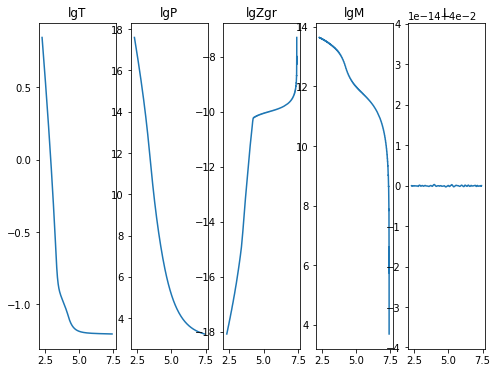

2020-11-18 05:47:22,413 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:47:23,272 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048847
2020-11-18 05:47:23,273 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:47:23,274 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:47:23,275 __main__ 0/1 INFO :: lgM iterate: 13.64107466907508
2020-11-18 05:47:23,275 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950054
2020-11-18 05:47:23,276 __main__ 0/1 INFO :: m iterate: 5.5042563003482314e-05
2020-11-18 05:47:23,277 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


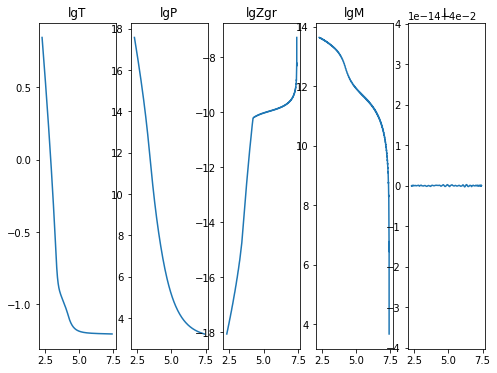

2020-11-18 05:47:26,836 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:47:27,708 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042776
2020-11-18 05:47:27,709 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516524
2020-11-18 05:47:27,710 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-11-18 05:47:27,711 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-11-18 05:47:27,712 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:47:27,713 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:47:27,714 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


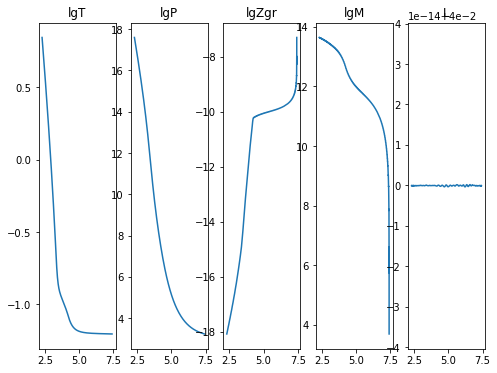

2020-11-18 05:47:31,218 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:47:32,145 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039728
2020-11-18 05:47:32,147 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:47:32,147 __main__ 0/1 INFO :: lgP iterate: 17.581556452902664
2020-11-18 05:47:32,148 __main__ 0/1 INFO :: lgM iterate: 13.641074669075069
2020-11-18 05:47:32,149 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-11-18 05:47:32,150 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:47:32,151 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


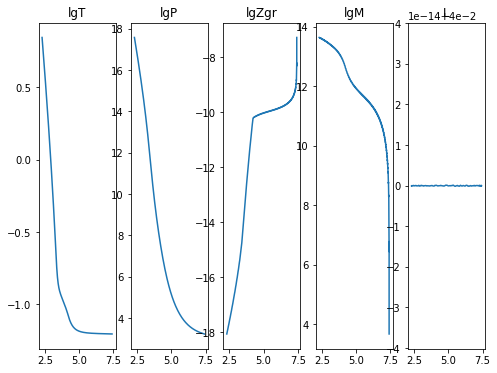

2020-11-18 05:47:35,615 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:47:36,443 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043725
2020-11-18 05:47:36,444 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516548
2020-11-18 05:47:36,445 __main__ 0/1 INFO :: lgP iterate: 17.59681772025333
2020-11-18 05:47:36,445 __main__ 0/1 INFO :: lgM iterate: 13.641115571532989
2020-11-18 05:47:36,446 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078667
2020-11-18 05:47:36,447 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:47:36,448 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


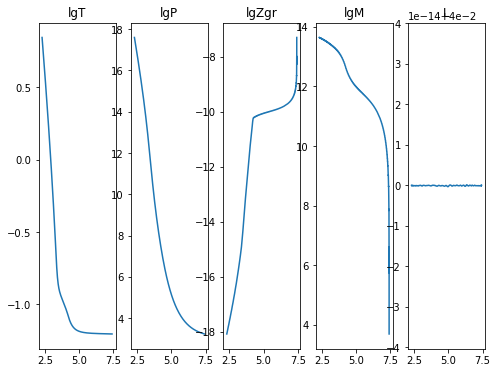

2020-11-18 05:47:40,102 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:40,989 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043072
2020-11-18 05:47:40,990 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800361
2020-11-18 05:47:40,991 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:47:40,992 __main__ 0/1 INFO :: lgM iterate: 13.641074669075127
2020-11-18 05:47:40,993 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695011
2020-11-18 05:47:40,994 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:47:40,995 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


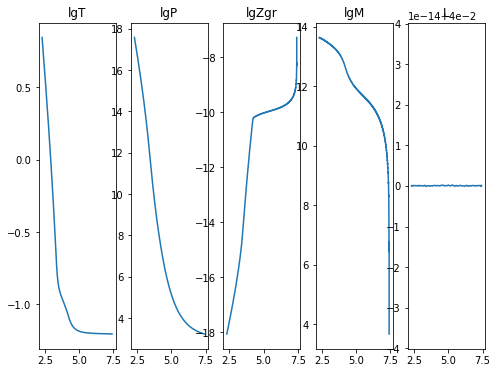

2020-11-18 05:47:44,578 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:45,296 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039115
2020-11-18 05:47:45,297 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516529
2020-11-18 05:47:45,298 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:47:45,299 __main__ 0/1 INFO :: lgM iterate: 13.641115571532946
2020-11-18 05:47:45,300 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:47:45,301 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:47:45,301 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


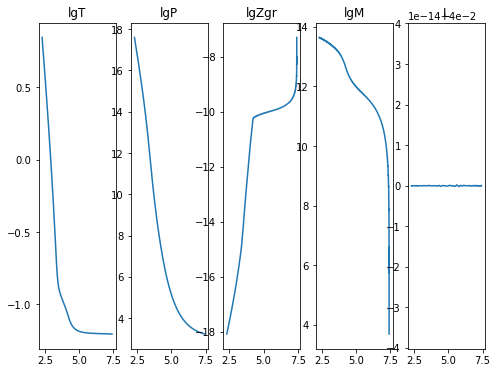

2020-11-18 05:47:48,955 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:47:50,017 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035656
2020-11-18 05:47:50,018 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800366
2020-11-18 05:47:50,019 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-11-18 05:47:50,020 __main__ 0/1 INFO :: lgM iterate: 13.641074669075088
2020-11-18 05:47:50,021 __main__ 0/1 INFO :: lgZgr iterate: -18.0699249569501
2020-11-18 05:47:50,022 __main__ 0/1 INFO :: m iterate: 5.5042563007923206e-05
2020-11-18 05:47:50,023 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


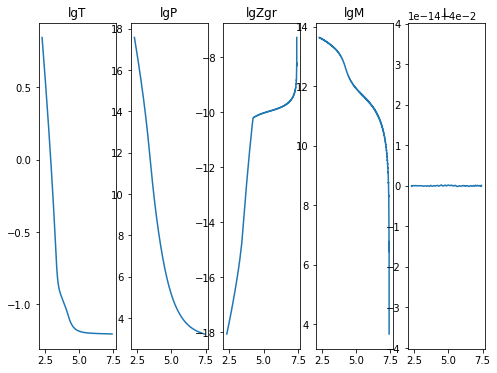

2020-11-18 05:47:53,705 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:47:54,582 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038902
2020-11-18 05:47:54,583 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516522
2020-11-18 05:47:54,584 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:47:54,585 __main__ 0/1 INFO :: lgM iterate: 13.641115571532989
2020-11-18 05:47:54,585 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078646
2020-11-18 05:47:54,586 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:47:54,587 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


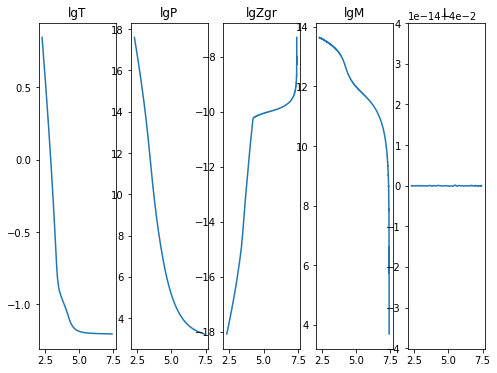

2020-11-18 05:47:58,303 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:47:59,302 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045572
2020-11-18 05:47:59,304 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800365
2020-11-18 05:47:59,305 __main__ 0/1 INFO :: lgP iterate: 17.58155645290265
2020-11-18 05:47:59,305 __main__ 0/1 INFO :: lgM iterate: 13.64107466907513
2020-11-18 05:47:59,306 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:47:59,307 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:47:59,308 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


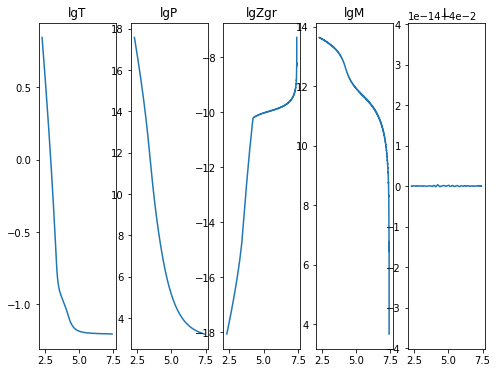

2020-11-18 05:48:03,014 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:48:03,742 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044169
2020-11-18 05:48:03,743 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516517
2020-11-18 05:48:03,744 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:48:03,745 __main__ 0/1 INFO :: lgM iterate: 13.641115571532913
2020-11-18 05:48:03,745 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507859
2020-11-18 05:48:03,746 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:48:03,747 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


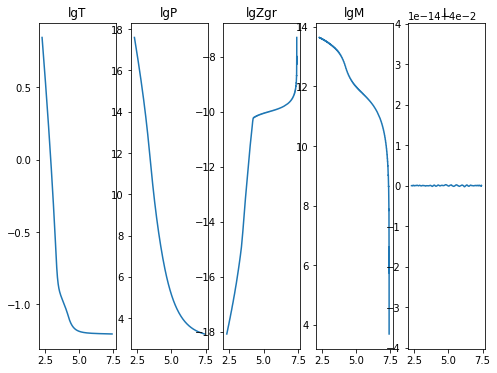

2020-11-18 05:48:07,553 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:48:08,428 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041442
2020-11-18 05:48:08,429 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800387
2020-11-18 05:48:08,430 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:48:08,430 __main__ 0/1 INFO :: lgM iterate: 13.64107466907512
2020-11-18 05:48:08,431 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:48:08,432 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:48:08,432 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


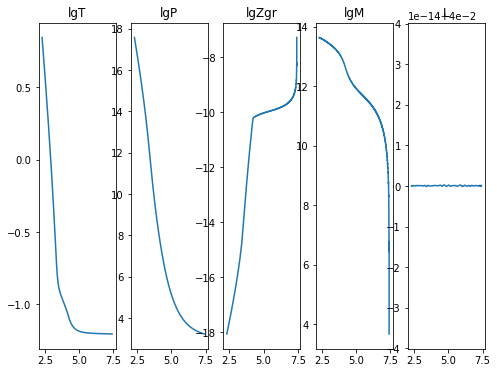

2020-11-18 05:48:11,992 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:48:12,703 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032039917
2020-11-18 05:48:12,704 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516532
2020-11-18 05:48:12,705 __main__ 0/1 INFO :: lgP iterate: 17.596817720253306
2020-11-18 05:48:12,706 __main__ 0/1 INFO :: lgM iterate: 13.641115571532962
2020-11-18 05:48:12,706 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:48:12,707 __main__ 0/1 INFO :: m iterate: 5.5876451733105625e-05
2020-11-18 05:48:12,708 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


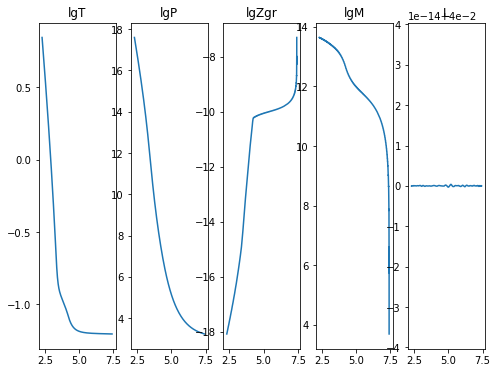

2020-11-18 05:48:16,294 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:48:17,211 __main__ 0/1 INFO :: Perturbation norm: 1.740464603203743
2020-11-18 05:48:17,212 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800352
2020-11-18 05:48:17,213 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:48:17,214 __main__ 0/1 INFO :: lgM iterate: 13.641074669075097
2020-11-18 05:48:17,214 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695009
2020-11-18 05:48:17,215 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:48:17,216 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


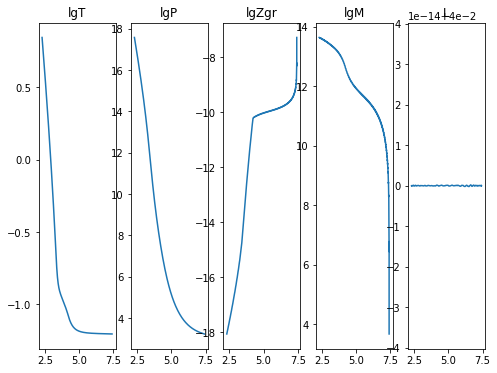

2020-11-18 05:48:21,031 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s
2020-11-18 05:48:21,878 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032041784
2020-11-18 05:48:21,879 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:48:21,880 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:48:21,880 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:48:21,881 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:48:21,882 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:48:21,882 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


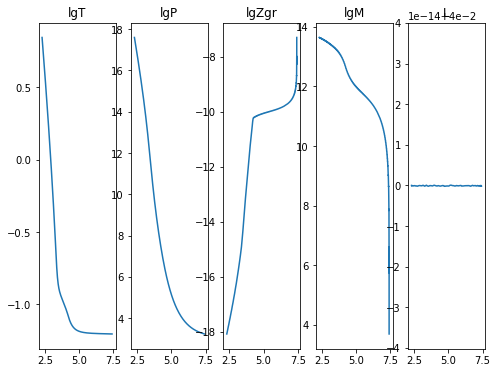

2020-11-18 05:48:25,558 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:48:26,486 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046367
2020-11-18 05:48:26,487 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:48:26,488 __main__ 0/1 INFO :: lgP iterate: 17.581556452902646
2020-11-18 05:48:26,489 __main__ 0/1 INFO :: lgM iterate: 13.641074669075119
2020-11-18 05:48:26,490 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950082
2020-11-18 05:48:26,491 __main__ 0/1 INFO :: m iterate: 5.504256300969956e-05
2020-11-18 05:48:26,491 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


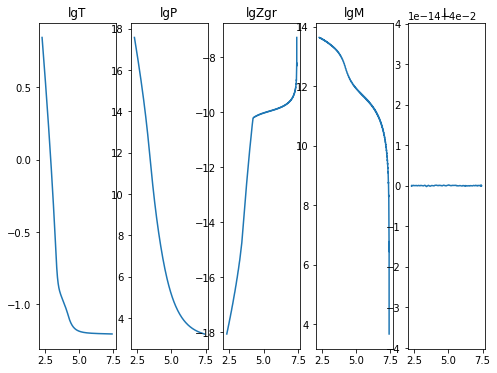

2020-11-18 05:48:30,051 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:48:30,788 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044986
2020-11-18 05:48:30,789 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:48:30,790 __main__ 0/1 INFO :: lgP iterate: 17.5968177202533
2020-11-18 05:48:30,791 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-11-18 05:48:30,792 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:48:30,793 __main__ 0/1 INFO :: m iterate: 5.587645172333566e-05
2020-11-18 05:48:30,793 __main__ 0/1 INFO :: L iterate: 0.04


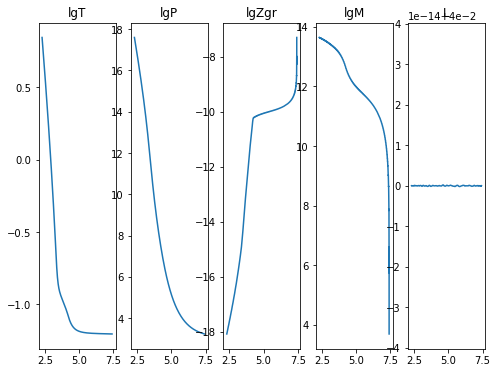

2020-11-18 05:48:34,505 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:48:35,447 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032046605
2020-11-18 05:48:35,448 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800369
2020-11-18 05:48:35,449 __main__ 0/1 INFO :: lgP iterate: 17.581556452902653
2020-11-18 05:48:35,450 __main__ 0/1 INFO :: lgM iterate: 13.64107466907511
2020-11-18 05:48:35,451 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:48:35,452 __main__ 0/1 INFO :: m iterate: 5.504256301325228e-05
2020-11-18 05:48:35,452 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


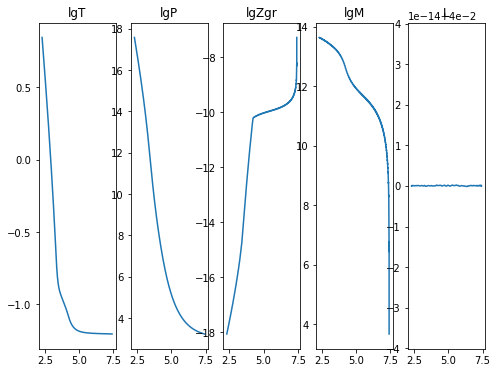

2020-11-18 05:48:39,100 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:48:39,798 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204465
2020-11-18 05:48:39,799 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516519
2020-11-18 05:48:39,800 __main__ 0/1 INFO :: lgP iterate: 17.596817720253277
2020-11-18 05:48:39,801 __main__ 0/1 INFO :: lgM iterate: 13.641115571532938
2020-11-18 05:48:39,803 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:48:39,804 __main__ 0/1 INFO :: m iterate: 5.587645172866473e-05
2020-11-18 05:48:39,805 __main__ 0/1 INFO :: L iterate: 0.04


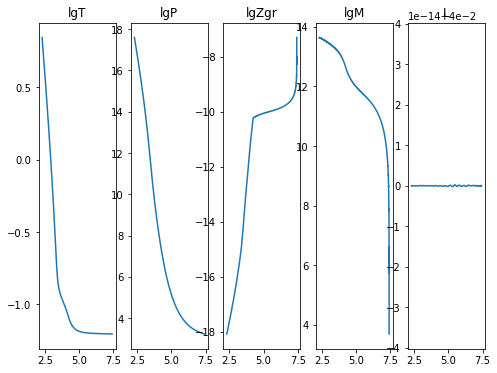

2020-11-18 05:48:43,315 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:48:44,185 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042668
2020-11-18 05:48:44,186 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800375
2020-11-18 05:48:44,187 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:48:44,188 __main__ 0/1 INFO :: lgM iterate: 13.641074669075083
2020-11-18 05:48:44,188 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950075
2020-11-18 05:48:44,189 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:48:44,190 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


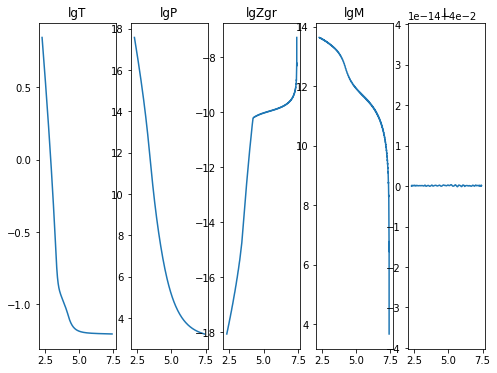

2020-11-18 05:48:47,638 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:48:48,370 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043527
2020-11-18 05:48:48,371 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:48:48,372 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:48:48,372 __main__ 0/1 INFO :: lgM iterate: 13.641115571532957
2020-11-18 05:48:48,373 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078625
2020-11-18 05:48:48,374 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:48:48,375 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


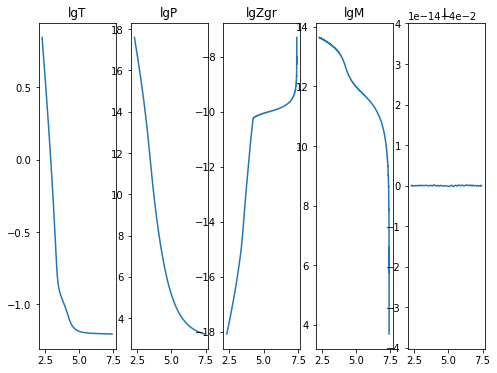

2020-11-18 05:48:52,063 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:48:52,940 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204317
2020-11-18 05:48:52,941 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800363
2020-11-18 05:48:52,942 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:48:52,943 __main__ 0/1 INFO :: lgM iterate: 13.641074669075158
2020-11-18 05:48:52,943 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950125
2020-11-18 05:48:52,944 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-11-18 05:48:52,945 __main__ 0/1 INFO :: L iterate: 0.04000000000000003


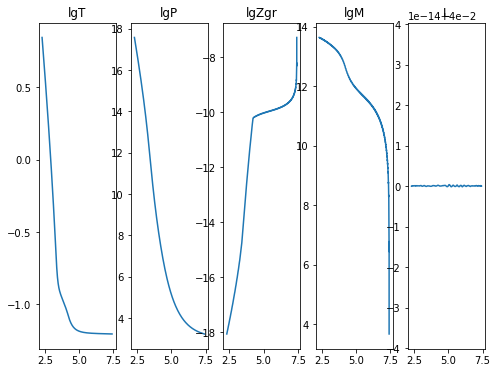

2020-11-18 05:48:56,496 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:48:57,225 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045554
2020-11-18 05:48:57,226 __main__ 0/1 INFO :: lgT iterate: 0.845552306051653
2020-11-18 05:48:57,227 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:48:57,227 __main__ 0/1 INFO :: lgM iterate: 13.641115571532943
2020-11-18 05:48:57,228 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:48:57,229 __main__ 0/1 INFO :: m iterate: 5.587645173044109e-05
2020-11-18 05:48:57,230 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


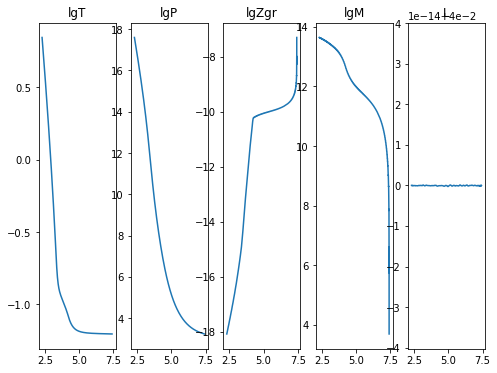

2020-11-18 05:49:00,804 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:49:01,681 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032048177
2020-11-18 05:49:01,682 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800373
2020-11-18 05:49:01,682 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:49:01,683 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:49:01,684 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:49:01,685 __main__ 0/1 INFO :: m iterate: 5.5042563008811385e-05
2020-11-18 05:49:01,686 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


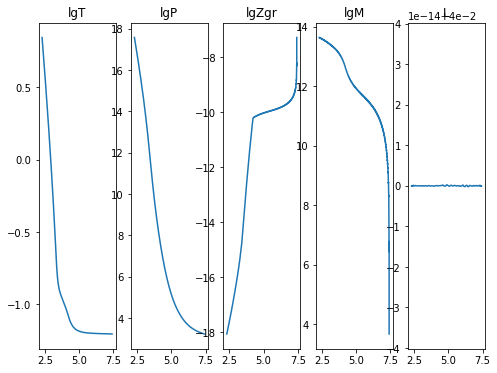

2020-11-18 05:49:05,301 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:49:06,237 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204601
2020-11-18 05:49:06,238 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:49:06,239 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:49:06,239 __main__ 0/1 INFO :: lgM iterate: 13.641115571532948
2020-11-18 05:49:06,240 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078596
2020-11-18 05:49:06,241 __main__ 0/1 INFO :: m iterate: 5.587645172511202e-05
2020-11-18 05:49:06,242 __main__ 0/1 INFO :: L iterate: 0.04000000000000002


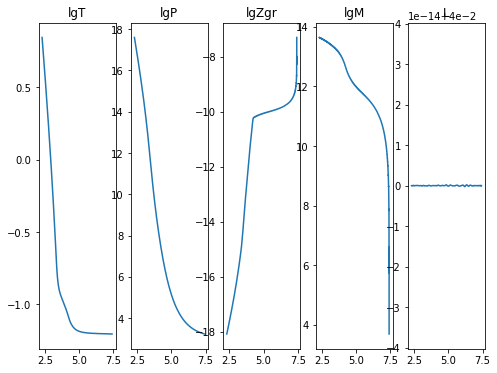

2020-11-18 05:49:10,144 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:49:11,032 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044744
2020-11-18 05:49:11,033 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800362
2020-11-18 05:49:11,034 __main__ 0/1 INFO :: lgP iterate: 17.581556452902685
2020-11-18 05:49:11,035 __main__ 0/1 INFO :: lgM iterate: 13.64107466907517
2020-11-18 05:49:11,036 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695015
2020-11-18 05:49:11,037 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:49:11,037 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


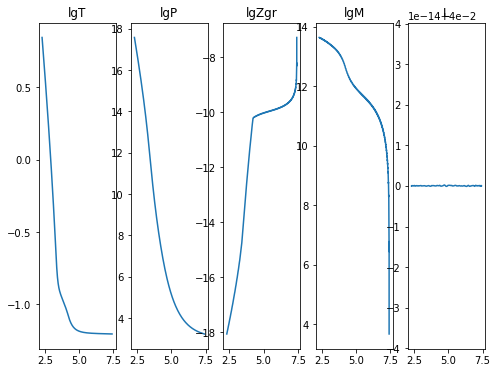

2020-11-18 05:49:15,904 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 6.8e-01/s
2020-11-18 05:49:16,846 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043685
2020-11-18 05:49:16,847 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:49:16,848 __main__ 0/1 INFO :: lgP iterate: 17.596817720253284
2020-11-18 05:49:16,849 __main__ 0/1 INFO :: lgM iterate: 13.641115571532964
2020-11-18 05:49:16,850 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:49:16,851 __main__ 0/1 INFO :: m iterate: 5.5876451727776555e-05
2020-11-18 05:49:16,852 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


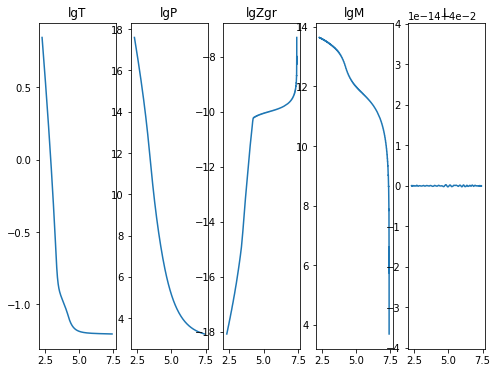

2020-11-18 05:49:21,504 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-11-18 05:49:22,739 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043214
2020-11-18 05:49:22,742 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800353
2020-11-18 05:49:22,744 __main__ 0/1 INFO :: lgP iterate: 17.58155645290267
2020-11-18 05:49:22,747 __main__ 0/1 INFO :: lgM iterate: 13.641074669075058
2020-11-18 05:49:22,750 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695006
2020-11-18 05:49:22,752 __main__ 0/1 INFO :: m iterate: 5.504256300614685e-05
2020-11-18 05:49:22,755 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


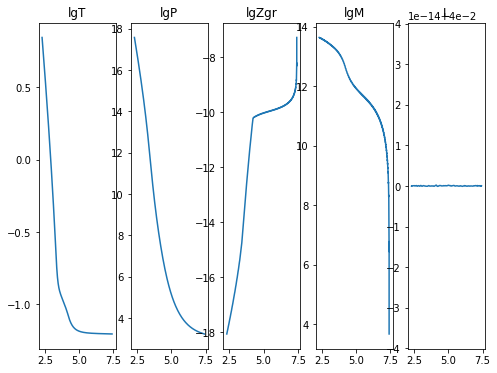

2020-11-18 05:49:26,775 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:49:28,027 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032045006
2020-11-18 05:49:28,028 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516543
2020-11-18 05:49:28,029 __main__ 0/1 INFO :: lgP iterate: 17.596817720253316
2020-11-18 05:49:28,030 __main__ 0/1 INFO :: lgM iterate: 13.641115571532934
2020-11-18 05:49:28,031 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:49:28,032 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:49:28,033 __main__ 0/1 INFO :: L iterate: 0.039999999999999966


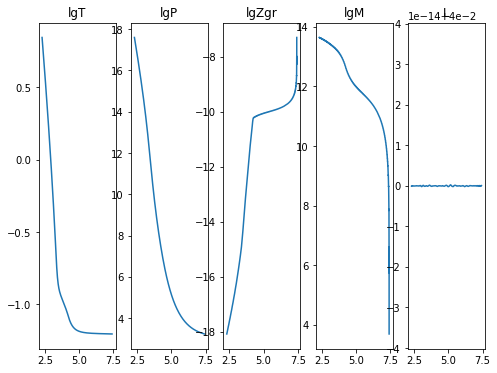

2020-11-18 05:49:32,001 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.6e+00/s
2020-11-18 05:49:32,988 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044906
2020-11-18 05:49:32,990 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800381
2020-11-18 05:49:32,990 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:49:32,991 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:49:32,992 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950086
2020-11-18 05:49:32,993 __main__ 0/1 INFO :: m iterate: 5.504256301147592e-05
2020-11-18 05:49:32,994 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


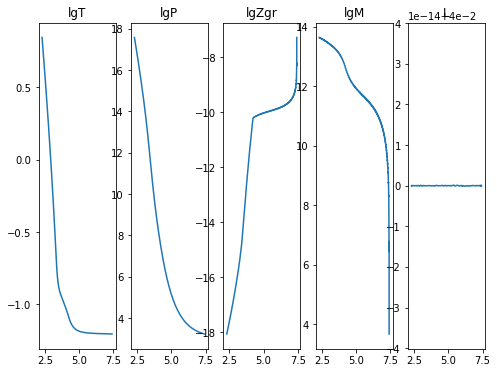

2020-11-18 05:49:36,965 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.2e+00/s
2020-11-18 05:49:38,614 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032043751
2020-11-18 05:49:38,615 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516531
2020-11-18 05:49:38,616 __main__ 0/1 INFO :: lgP iterate: 17.59681772025329
2020-11-18 05:49:38,617 __main__ 0/1 INFO :: lgM iterate: 13.641115571532868
2020-11-18 05:49:38,617 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078554
2020-11-18 05:49:38,618 __main__ 0/1 INFO :: m iterate: 5.5876451733993804e-05
2020-11-18 05:49:38,619 __main__ 0/1 INFO :: L iterate: 0.03999999999999997


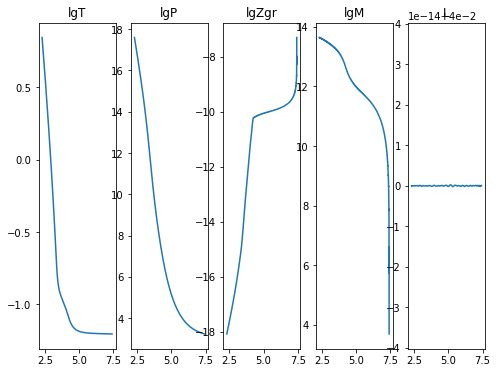

2020-11-18 05:49:42,940 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:49:44,122 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032044218
2020-11-18 05:49:44,125 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800347
2020-11-18 05:49:44,127 __main__ 0/1 INFO :: lgP iterate: 17.58155645290266
2020-11-18 05:49:44,129 __main__ 0/1 INFO :: lgM iterate: 13.641074669075175
2020-11-18 05:49:44,132 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695013
2020-11-18 05:49:44,134 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:49:44,135 __main__ 0/1 INFO :: L iterate: 0.040000000000000015


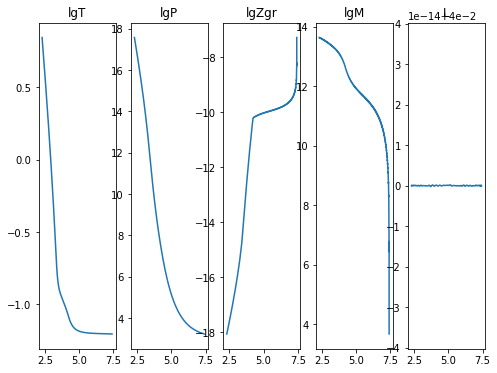

2020-11-18 05:49:48,410 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.4e+00/s
2020-11-18 05:49:49,149 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040911
2020-11-18 05:49:49,151 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:49:49,151 __main__ 0/1 INFO :: lgP iterate: 17.596817720253288
2020-11-18 05:49:49,152 __main__ 0/1 INFO :: lgM iterate: 13.641115571532918
2020-11-18 05:49:49,153 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507858
2020-11-18 05:49:49,154 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:49:49,155 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


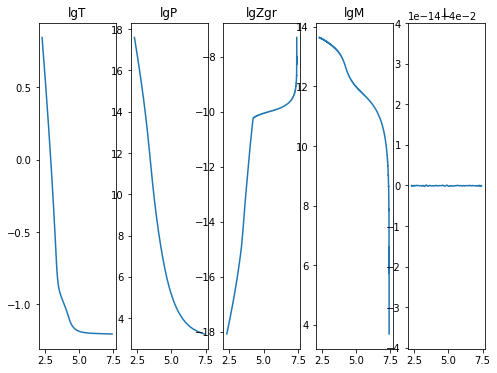

2020-11-18 05:49:52,833 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:49:53,708 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032038782
2020-11-18 05:49:53,710 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800377
2020-11-18 05:49:53,710 __main__ 0/1 INFO :: lgP iterate: 17.581556452902678
2020-11-18 05:49:53,711 __main__ 0/1 INFO :: lgM iterate: 13.641074669075117
2020-11-18 05:49:53,712 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950103
2020-11-18 05:49:53,713 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-11-18 05:49:53,714 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


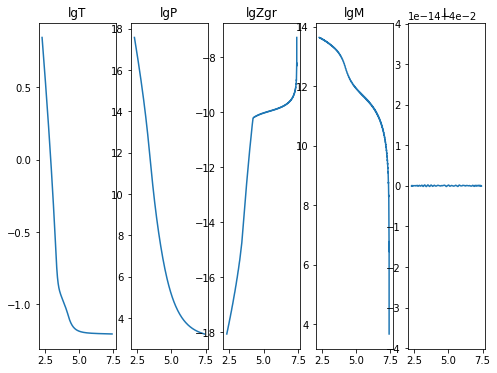

2020-11-18 05:49:57,252 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.5e+00/s
2020-11-18 05:49:58,045 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040296
2020-11-18 05:49:58,046 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:49:58,047 __main__ 0/1 INFO :: lgP iterate: 17.596817720253295
2020-11-18 05:49:58,048 __main__ 0/1 INFO :: lgM iterate: 13.64111557153291
2020-11-18 05:49:58,049 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078582
2020-11-18 05:49:58,050 __main__ 0/1 INFO :: m iterate: 5.587645173132927e-05
2020-11-18 05:49:58,050 __main__ 0/1 INFO :: L iterate: 0.03999999999999998


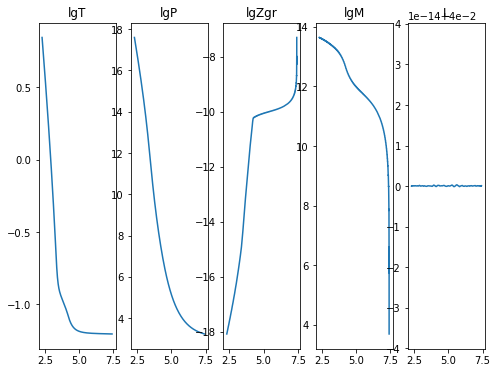

2020-11-18 05:50:01,551 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.7e+00/s
2020-11-18 05:50:02,436 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032040973
2020-11-18 05:50:02,437 __main__ 0/1 INFO :: lgT iterate: 0.844929764780037
2020-11-18 05:50:02,438 __main__ 0/1 INFO :: lgP iterate: 17.581556452902667
2020-11-18 05:50:02,439 __main__ 0/1 INFO :: lgM iterate: 13.641074669075122
2020-11-18 05:50:02,440 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:50:02,441 __main__ 0/1 INFO :: m iterate: 5.504256300525867e-05
2020-11-18 05:50:02,442 __main__ 0/1 INFO :: L iterate: 0.039999999999999994


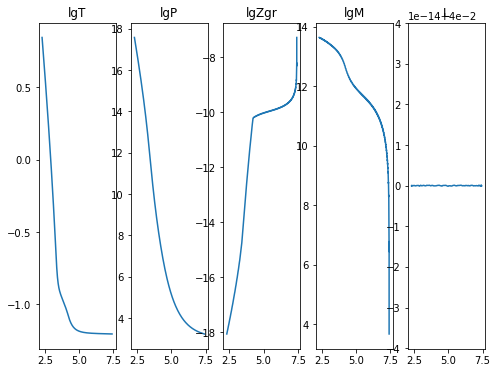

2020-11-18 05:50:07,125 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 2s, Remaining: 0s, Rate: 6.4e-01/s
2020-11-18 05:50:08,381 __main__ 0/1 INFO :: Perturbation norm: 1.740464603204247
2020-11-18 05:50:08,383 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516533
2020-11-18 05:50:08,384 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:50:08,385 __main__ 0/1 INFO :: lgM iterate: 13.64111557153292
2020-11-18 05:50:08,386 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078603
2020-11-18 05:50:08,387 __main__ 0/1 INFO :: m iterate: 5.5876451726888376e-05
2020-11-18 05:50:08,388 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


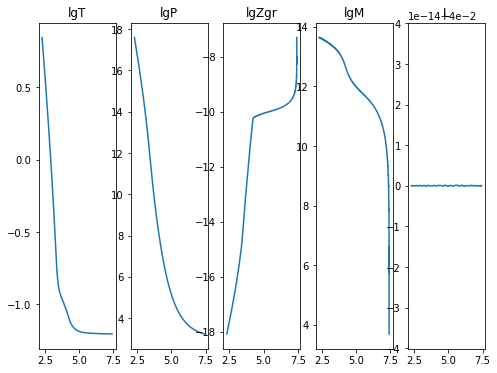

2020-11-18 05:50:12,410 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:50:13,284 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042472
2020-11-18 05:50:13,285 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800346
2020-11-18 05:50:13,285 __main__ 0/1 INFO :: lgP iterate: 17.581556452902674
2020-11-18 05:50:13,286 __main__ 0/1 INFO :: lgM iterate: 13.641074669075138
2020-11-18 05:50:13,287 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950118
2020-11-18 05:50:13,288 __main__ 0/1 INFO :: m iterate: 5.504256300703503e-05
2020-11-18 05:50:13,289 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


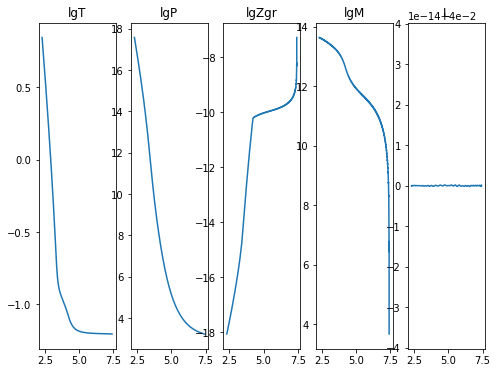

2020-11-18 05:50:17,008 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:50:17,892 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037951
2020-11-18 05:50:17,893 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516521
2020-11-18 05:50:17,894 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:50:17,895 __main__ 0/1 INFO :: lgM iterate: 13.641115571532941
2020-11-18 05:50:17,896 __main__ 0/1 INFO :: lgZgr iterate: -18.084284895078618
2020-11-18 05:50:17,897 __main__ 0/1 INFO :: m iterate: 5.587645173221745e-05
2020-11-18 05:50:17,897 __main__ 0/1 INFO :: L iterate: 0.04


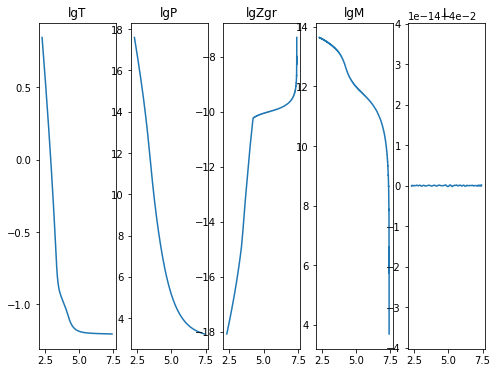

2020-11-18 05:50:22,186 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.8e+00/s
2020-11-18 05:50:23,363 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032032844
2020-11-18 05:50:23,364 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800371
2020-11-18 05:50:23,365 __main__ 0/1 INFO :: lgP iterate: 17.58155645290268
2020-11-18 05:50:23,366 __main__ 0/1 INFO :: lgM iterate: 13.641074669075104
2020-11-18 05:50:23,366 __main__ 0/1 INFO :: lgZgr iterate: -18.069924956950096
2020-11-18 05:50:23,367 __main__ 0/1 INFO :: m iterate: 5.50425630123641e-05
2020-11-18 05:50:23,368 __main__ 0/1 INFO :: L iterate: 0.04


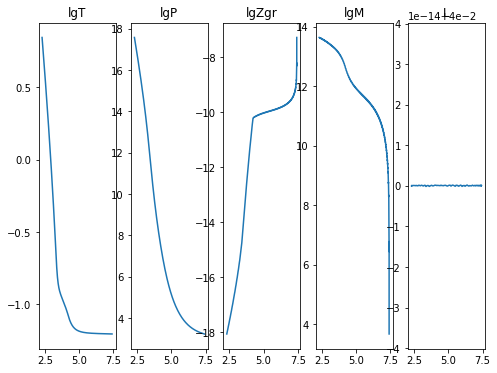

2020-11-18 05:50:28,053 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.0e+00/s
2020-11-18 05:50:29,025 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032035243
2020-11-18 05:50:29,026 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516534
2020-11-18 05:50:29,027 __main__ 0/1 INFO :: lgP iterate: 17.59681772025331
2020-11-18 05:50:29,027 __main__ 0/1 INFO :: lgM iterate: 13.641115571532929
2020-11-18 05:50:29,028 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507861
2020-11-18 05:50:29,029 __main__ 0/1 INFO :: m iterate: 5.5876451722447484e-05
2020-11-18 05:50:29,030 __main__ 0/1 INFO :: L iterate: 0.03999999999999999


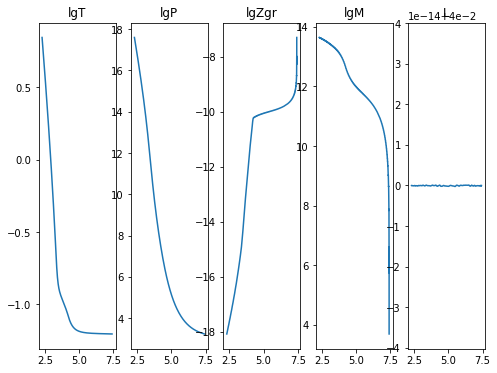

2020-11-18 05:50:33,266 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.1e+00/s
2020-11-18 05:50:34,915 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032037656
2020-11-18 05:50:34,916 __main__ 0/1 INFO :: lgT iterate: 0.8449297647800351
2020-11-18 05:50:34,917 __main__ 0/1 INFO :: lgP iterate: 17.58155645290269
2020-11-18 05:50:34,918 __main__ 0/1 INFO :: lgM iterate: 13.64107466907506
2020-11-18 05:50:34,919 __main__ 0/1 INFO :: lgZgr iterate: -18.06992495695008
2020-11-18 05:50:34,921 __main__ 0/1 INFO :: m iterate: 5.504256301058774e-05
2020-11-18 05:50:34,922 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


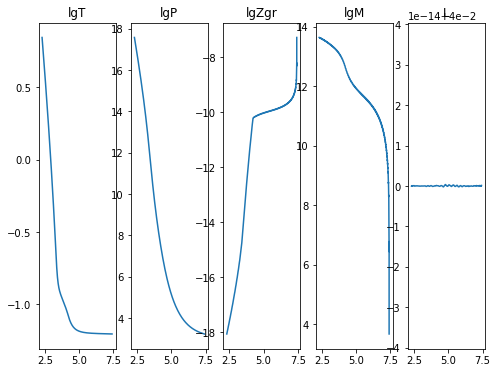

2020-11-18 05:50:39,780 pencil 0/1 INFO :: Building pencil matrix 1/1 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 1.9e+00/s
2020-11-18 05:50:41,154 __main__ 0/1 INFO :: Perturbation norm: 1.7404646032042523
2020-11-18 05:50:41,168 __main__ 0/1 INFO :: lgT iterate: 0.8455523060516537
2020-11-18 05:50:41,175 __main__ 0/1 INFO :: lgP iterate: 17.596817720253313
2020-11-18 05:50:41,180 __main__ 0/1 INFO :: lgM iterate: 13.641115571532985
2020-11-18 05:50:41,186 __main__ 0/1 INFO :: lgZgr iterate: -18.08428489507865
2020-11-18 05:50:41,198 __main__ 0/1 INFO :: m iterate: 5.587645172955291e-05
2020-11-18 05:50:41,199 __main__ 0/1 INFO :: L iterate: 0.04000000000000001


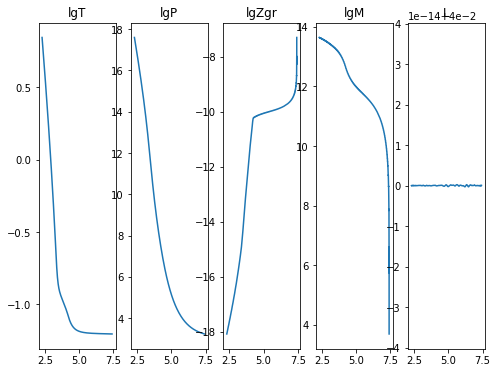

KeyboardInterrupt: 

In [19]:
# Iterations

i = 0

pert = solver.perturbations.data
pert.fill(1+tolerance)
start_time = time.time()
while np.sum(np.abs(pert)) > tolerance:
    solver.newton_iteration()
    lgT_list.append(np.copy(lgT1['g'])) # save
    lgP_list.append(np.copy(lgP1['g']))
    lgZgr_list.append(np.copy(lgZgr1['g'])) 
    lgM_list.append(np.copy(lgM1['g'])) 
    L_list.append(np.copy(L1['g']))
    m_list.append(np.copy(m['g']))
    logger.info('Perturbation norm: {}'.format(np.sum(np.abs(pert))))
    logger.info('lgT iterate: {}'.format(lgT1['g'][0]))
    logger.info('lgP iterate: {}'.format(lgP1['g'][0]))
    logger.info('lgM iterate: {}'.format(lgM1['g'][0]))
    logger.info('lgZgr iterate: {}'.format(lgZgr1['g'][0]))
    logger.info('m iterate: {}'.format(m1['g'][0]))
    logger.info('L iterate: {}'.format(L1['g'][0]))
    
    plt.figure(figsize=(8,6))
    plt.subplot(1,5,1)
    plt.plot(domain.grid(0),lgT1['g'])
    plt.title("lgT")
    plt.subplot(1,5,2)
    plt.plot(domain.grid(0), lgP1['g'])
    plt.title("lgP")
    plt.subplot(1,5,3)
    plt.plot(domain.grid(0),lgZgr1['g'])
    plt.title("lgZgr")
    plt.subplot(1,5,4)
    plt.plot(domain.grid(0), lgM1['g'])
    plt.title("lgM")
    plt.subplot(1,5,5)
    plt.plot(domain.grid(0), L1['g'])
    plt.title("L")
    plt.show()
    
end_time = time.time()

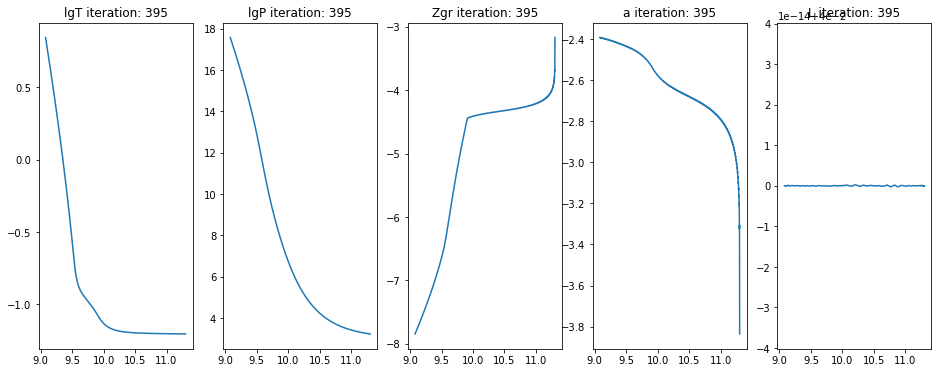

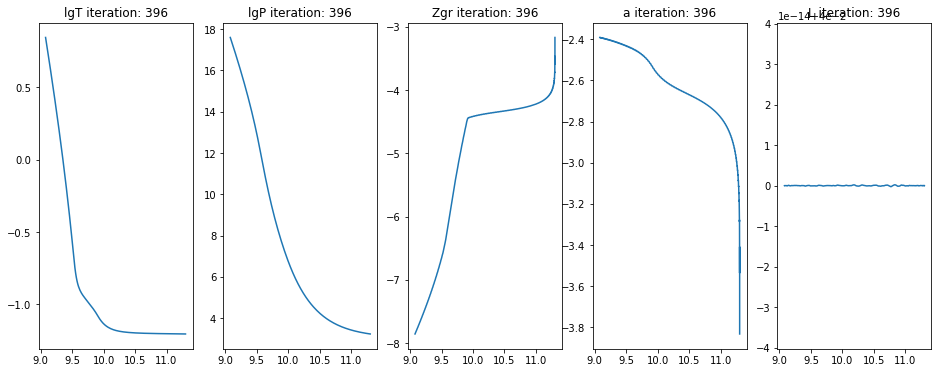

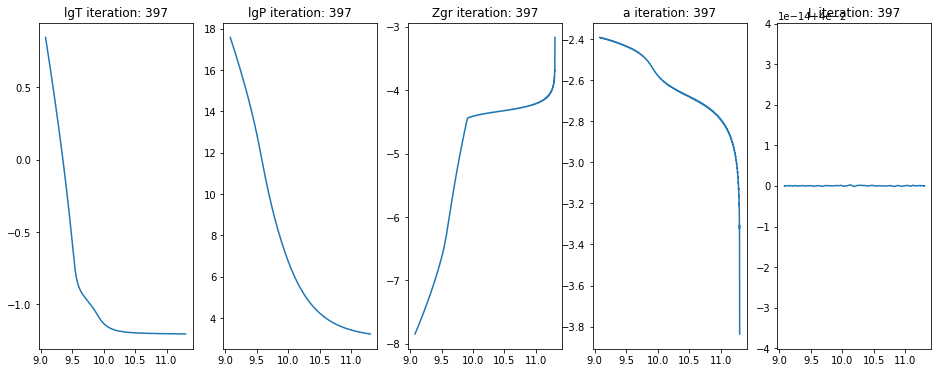

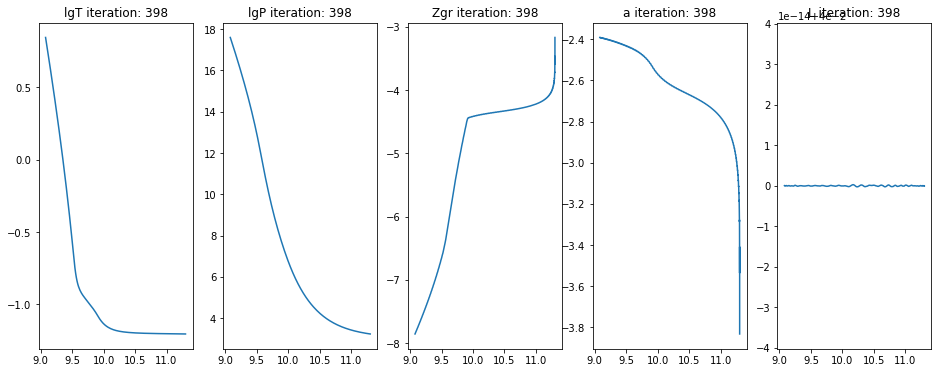

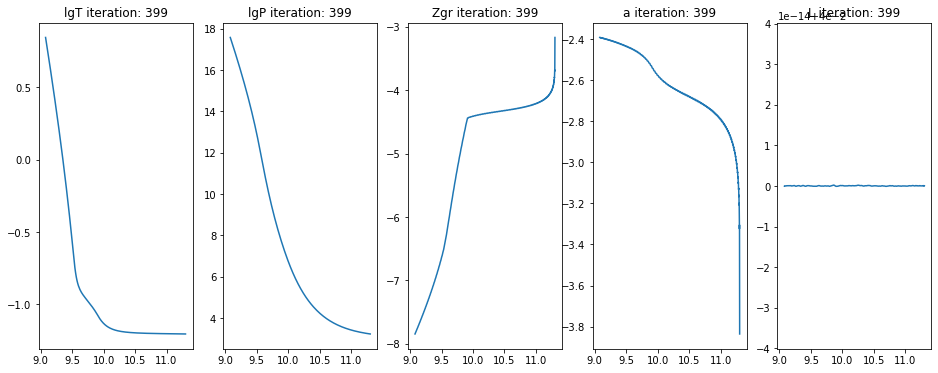

...

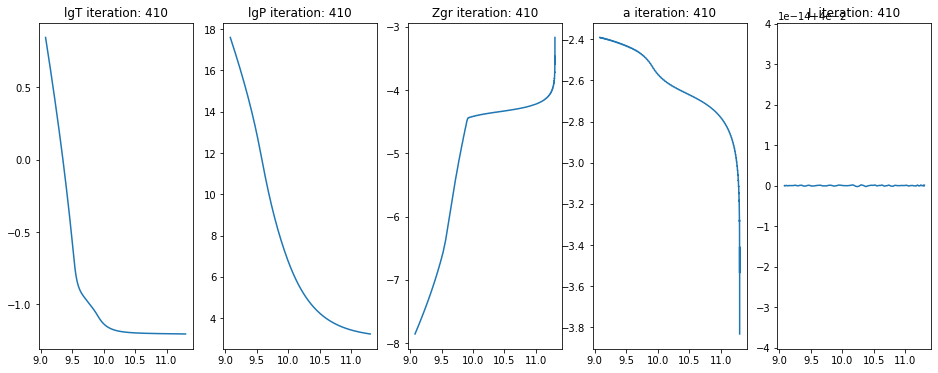

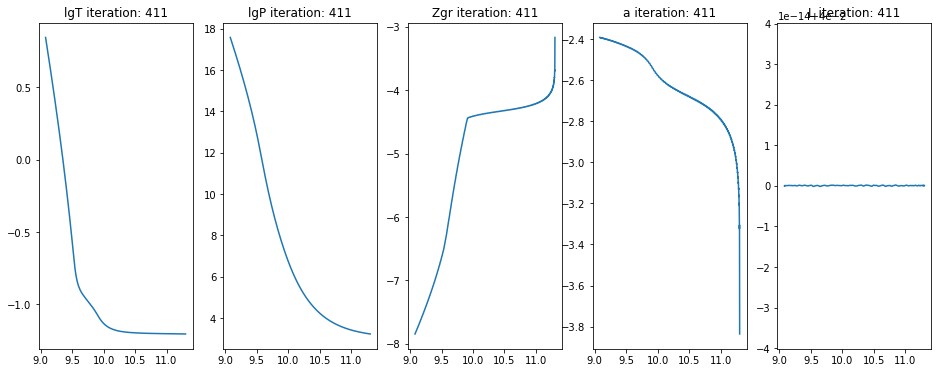

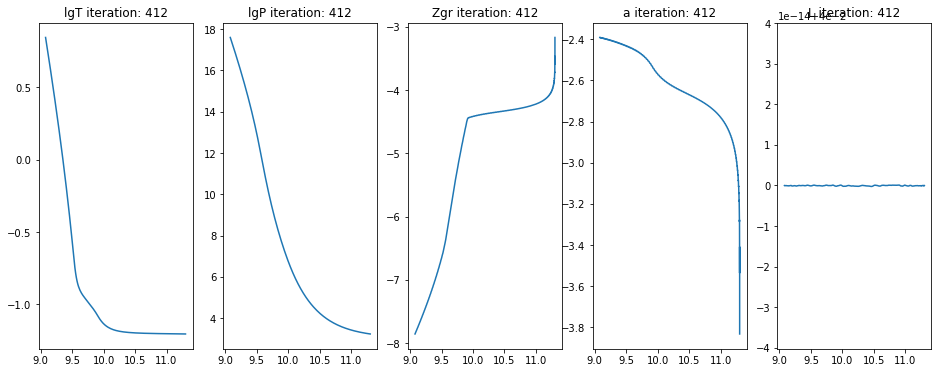

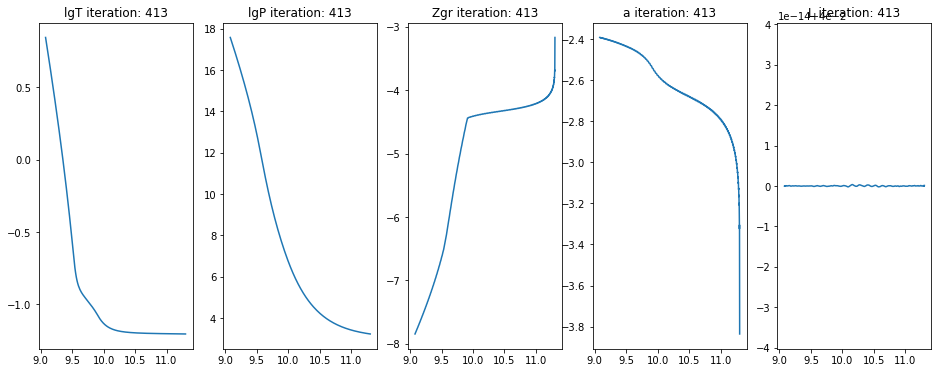

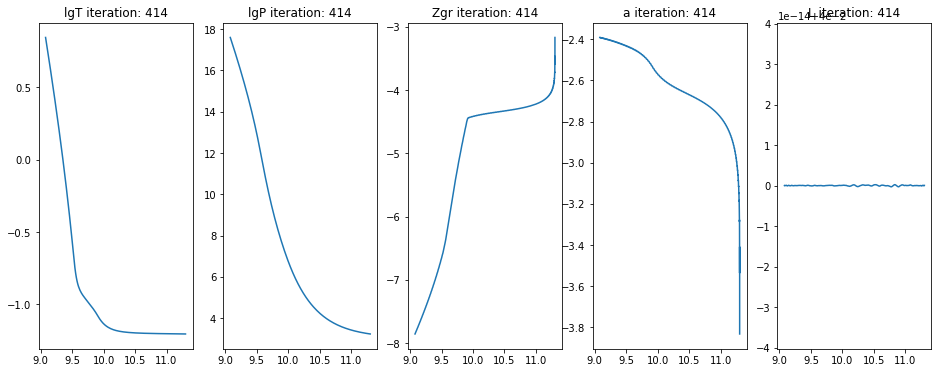

In [20]:
lower = 0 
if len(lgT_list) > 20:
    lower = len(lgT_list) - 20

R = np.log10(np.exp(domain.grid(0))*r_0)

for i in range(lower,len(lgT_list)):
        plt.figure(figsize=(16,6))
        
        plt.subplot(1,5,1)
        plt.plot(R,lgT_list[i])
        plt.title("lgT iteration: " + str(i))
        
        plt.subplot(1,5,2)
        plt.plot(R, lgP_list[i])
        plt.title("lgP iteration: " + str(i))
        
        plt.subplot(1,5,3)
        plt.plot(R, np.log10(np.exp(lgZgr_list[i])))
        plt.title("Zgr iteration: " + str(i))
        
        # Grain size 
        plt.subplot(1,5,4)
        plt.plot(R, np.log10((np.exp(lgM_list[i])*M_0/(4*np.pi))**(1/3)))
        plt.title("a iteration: " + str(i))
        
#         plt.subplot(1,5,5)
#         plt.plot(R, m_list[i])
#         plt.title("m iteration: " + str(i))

        plt.subplot(1,5,5)
        plt.plot(R, L_list[i])
        plt.title("L iteration: " + str(i))
        
        

In [21]:
lgP['g'] = lgP_list[-1]
lgT['g'] = lgT_list[-1]
lgZgr['g'] = lgZgr_list[-1]
lgM['g'] = lgM_list[-1]
m['g'] = m_list[-1]
L['g'] = L_list[-1]

Text(0.5, 1.0, 'Grad')

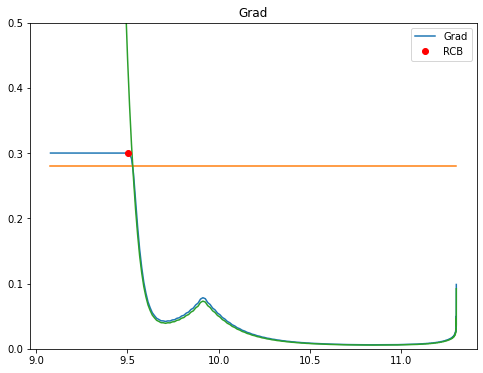

In [22]:
# Grad

Grad = grad.evaluate()
Grad.require_grid_space()
Grad_rad = grad_rad.evaluate()
Grad_rad.require_grid_space()

RCB = 0
epsilon = 0.0001
for i in range(0, len(Grad['g'] - 1)):
    if np.abs(Grad['g'][i] - Grad['g'][0]) >  epsilon:
        RCB = i
        break

plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'], label='Grad')
plt.plot(R, grad_ad*np.ones(len(R)))
plt.plot(R, Grad_rad['g'])
plt.plot(R[RCB], Grad['g'][RCB], 'ro', label = 'RCB')
plt.ylim(0, 0.5)
plt.legend()

plt.title('Grad')

Text(0.5, 1.0, 'Tstop')

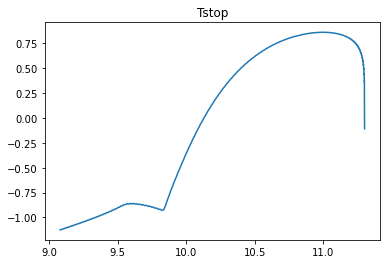

In [23]:
TStop = Tstop.evaluate()
TStop.require_grid_space()
plt.plot(R, np.log10(TStop['g']))
plt.title('Tstop')

Text(0.5, 1.0, 'Tgrow')

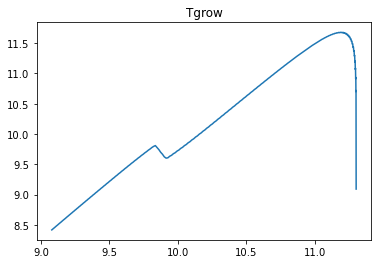

In [24]:
Tgrow = 1/Tgrow_inv
TGrow = Tgrow.evaluate()
TGrow.require_grid_space()
plt.plot(R, np.log10(TGrow['g']))
plt.title('Tgrow')

# New analysis section (Jan 30)


Trcb_set = 7.100553208588144 yr
Tbondi_set = 618.814940114542 yr
Tout_set = 39203.28002388686 yr


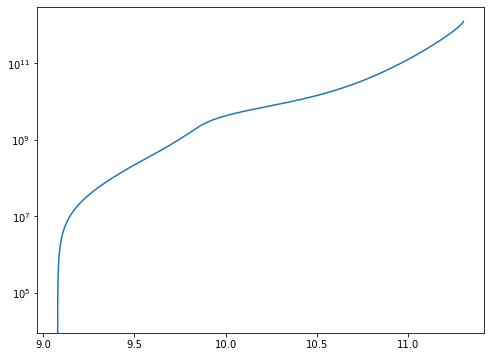

In [25]:
Bondi = r_Bondi # cm
# Bondi = 3.7e11 # cm
# Tsettl = r/vsettl 
def find_nearest_index(A, x):
    i = (np.abs(A - x)).argmin()
    return i

bondi = find_nearest_index(R, np.log10(Bondi))
Vsettl = v_set.evaluate()
Vsettl.require_grid_space()
Vset = Vsettl['g']

Tsettl = np.ones(len(R))

for i in range(0, len(R)):
    Tsettl[i] = np.trapz(1/Vset[0:i], S[0:i]) # Ormel integral definition 
    
# Tsettl = np.exp(r['g'])*r_0/Vset 
    
plt.figure(figsize=(8,6))
plt.plot(R, Tsettl)
plt.yscale('log')


Trcb_set = Tsettl[RCB]
Tbondi_set = Tsettl[bondi]
Tout_set = Tsettl[-1]

yr = 3.154e+7

print("Trcb_set = {} yr".format(Trcb_set/yr))
print("Tbondi_set = {} yr".format(Tbondi_set/yr))
print("Tout_set = {} yr".format(Tout_set/yr))



Trcb_set = 7.100553208588144 yr
Tbondi_set = 3047.6460753837564 yr
Tout_set = 39203.28002388686 yr


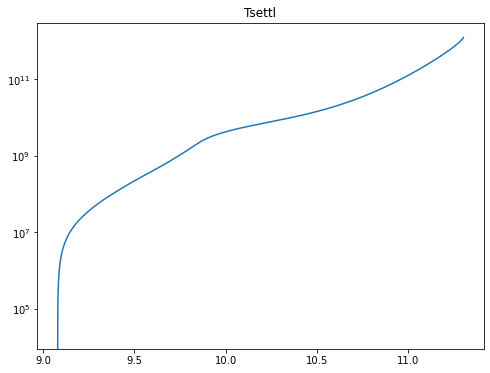

In [26]:
Bondi = 3.7e11 # cm
Bondi = 8.9442713e10
# Tsettl = r/vsettl 
def find_nearest_index(A, x):
    i = (np.abs(A - x)).argmin()
    return i

bondi = find_nearest_index(R, np.log10(Bondi))
Vsettl = v_set.evaluate()
Vsettl.require_grid_space()
Vset = Vsettl['g']


Tsettl = np.ones(len(R))


for i in range(0, len(R)):
    Tsettl[i] = np.trapz(1/Vset[0:i], S[0:i]) # Ormel integral definition 
    
# Tsettl = np.exp(r['g'])*r_0/Vset 
    
plt.figure(figsize=(8,6))
plt.plot(R, Tsettl)
plt.yscale('log')
plt.title('Tsettl')

Trcb_set = Tsettl[RCB]
Tbondi_set = Tsettl[bondi]
Tout_set = Tsettl[-1]

yr = 3.154e+7

print("Trcb_set = {} yr".format(Trcb_set/yr))
print("Tbondi_set = {} yr".format(Tbondi_set/yr))
print("Tout_set = {} yr".format(Tout_set/yr))

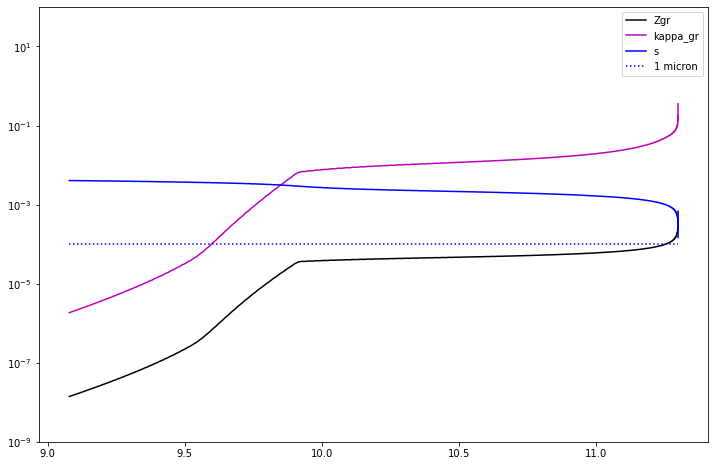

In [27]:
# Ormel profile
size = s.evaluate()
size.require_grid_space()
kappa_gr = Qk_geo.evaluate()
kappa_gr.require_grid_space()


plt.figure(figsize=(12,8))
plt.plot(R, np.exp(lgZgr['g']), 'k-', label='Zgr')
plt.plot(R, kappa_gr['g'], 'm-', label='kappa_gr')
plt.plot(R, size['g'], 'b-', label='s')
plt.plot(R, R/R*1e-4, 'b:', label='1 micron')
plt.yscale('log')
plt.ylim((1e-9, 1e2))
plt.legend()

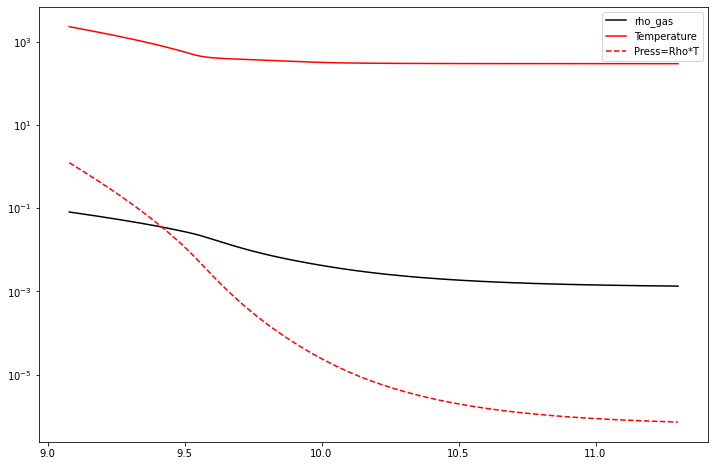

In [28]:
rho_gas = rho_g.evaluate()
rho_gas.require_grid_space()

lgt = lgT_list[-1]


plt.figure(figsize=(12,8)) # I don't know Ormel's normalization values 
plt.plot(R, (rho_gas['g'])**(1/3), 'k-', label='rho_gas')
plt.plot(R, np.exp(lgt)*T_0, 'r-', label='Temperature') 
plt.plot(R, np.exp(lgt)*T_0 *rho_gas['g'] , 'r--', label='Press=Rho*T')
plt.yscale('log')
plt.legend()

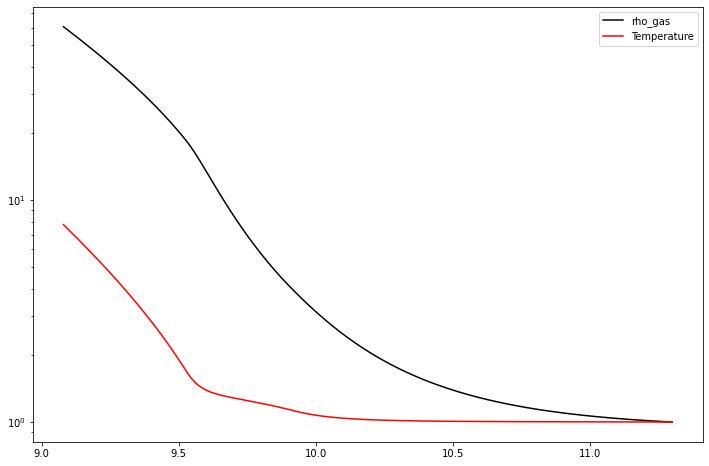

In [29]:
plt.figure(figsize=(12,8)) # I don't know Ormel's normalization values 
plt.plot(R, (rho_gas['g']/rhodisk)**(1/3) , 'k-', label='rho_gas')
plt.plot(R, np.exp(lgt)*T_0 / Tdisk, 'r-', label='Temperature') 
plt.yscale('log')
plt.legend()

Envelope mass (g): 1.033661e+26


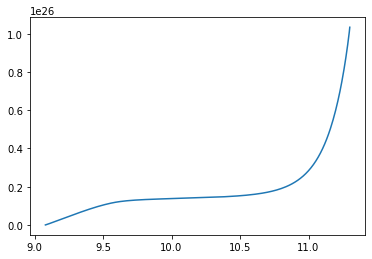

In [30]:
Env = np.zeros(len(R))

En = 4*np.pi*(np.exp(r)*r_0)**2 *rho_g 

m = En.evaluate()
m.require_grid_space()

for i in range(0, len(R)):
    Env[i] = np.trapz(m['g'][0:i], S[0:i]) 
    
    
plt.plot(R, Env)
env_mass = Env[-1]
print("Envelope mass (g): {:e}".format(env_mass))

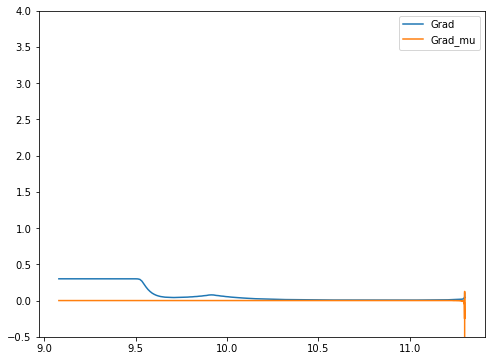

In [31]:
dlgZgr = lgZgr.differentiate('r')
dlgP = lgP.differentiate('r')

# Multiply dlgZgr by Zgr to get dZgr (as a proxy for dmu = d(1+Zgr) = dZgr)
grad_mu= dlgZgr['g']/ dlgP['g'] 
grad_mu *= np.exp(lgZgr['g'])

#grad_mu.evaluate()
#grad_mu.require_grid_space()

plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'], label='Grad')
#plt.plot(R, dlgZgr['g'] / dlgP['g'], label='Grad_mu')
plt.plot(R, grad_mu, label='Grad_mu')
plt.ylim(-0.5, 4)
plt.legend()

(-4.0, 4.0)

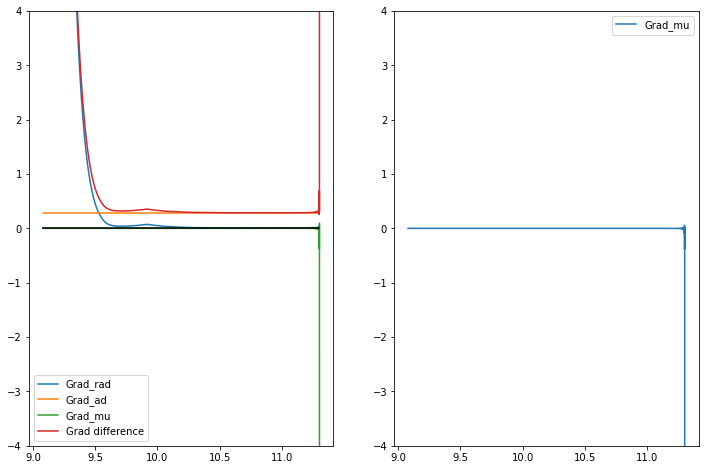

In [32]:
lgMu = np.log(1+np.exp(lgZgr))
dlgMu = log_basis.Differentiate(lgMu)
dlgP = log_basis.Differentiate(np.log(np.exp(lgP) *P_0))

grad_mu = dlgMu/dlgP

# grad_mu1 = np.diff( np.log(1+np.exp(lgZgr['g'])))/ np.diff(np.log(np.exp(lgP['g']) *P_0)) 
Grad_mu = grad_mu.evaluate()
Grad_mu.require_grid_space()

grad_diff = grad_rad - grad_mu - (-grad_ad) 
Grad_diff = grad_diff.evaluate() 
Grad_diff.require_grid_space() 


plt.figure(figsize = (12,8))
plt.subplot(1,2,1)
# plt.plot(R, Grad_diff['g'])
# plt.plot(R,Grad_mu['g'])
plt.plot(R, Grad_rad['g'], label = 'Grad_rad')
plt.plot(R, grad_ad*np.ones(len(R)), label = 'Grad_ad')
plt.plot(R, Grad_mu['g'], label = 'Grad_mu')
plt.plot(R, Grad_diff['g'], label = 'Grad difference')
plt.plot(R, np.zeros(len(R)), 'k-') 
plt.legend()
plt.ylim((-4, 4))
plt.subplot(1,2,2)
plt.plot(R, Grad_mu['g'], label = 'Grad_mu')
# plt.plot(R[1:], grad_mu1)
plt.legend()
plt.ylim((-4, 4))

<ipython-input-33-47634ba53436>:5: RuntimeWarning: invalid value encountered in log10
  plt.plot(R, np.log10(R_0), label='log10(R_0)')


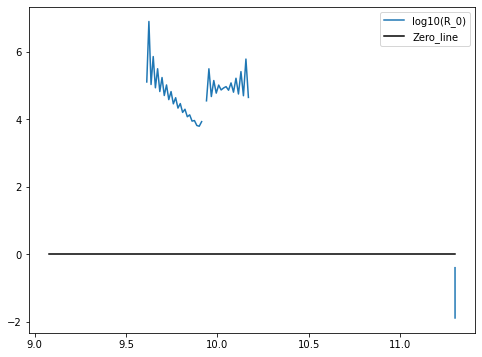

In [33]:
# Plot R_0 for fingering convection
R_0 = (Grad['g'] - grad_ad)/Grad_mu['g']

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(R_0), label='log10(R_0)')
plt.plot(R, 0*R , 'k-', label='Zero_line')
#plt.ylim(-1.0, 1000.0)
plt.legend()


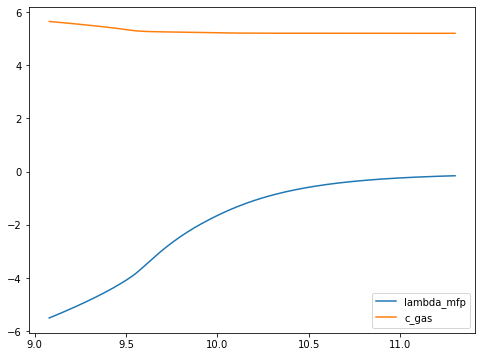

In [34]:
# Profile of nu and Xi for Prandtl number
c_gas=np.sqrt(8.32e7 * np.exp(lgt)*T_0 )
cross_sect_H2=2e-15 #cgs H2 cross section
lambda_mfp= 1./ (cross_sect_H2 * rho_gas['g'] / 2 / 1.67e-24)
nu_visc= lambda_mfp * c_gas

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(lambda_mfp), label='lambda_mfp')
plt.plot(R, np.log10(c_gas), label='c_gas')

#plt.ylim(-0.1, 0.1)
plt.legend()       

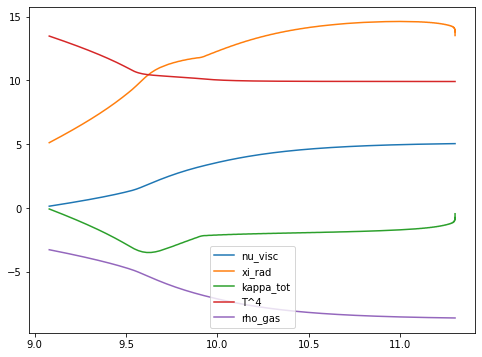

In [35]:
gas_gamma=7./5.
kappa_tot =  kappa.evaluate()
kappa_tot.require_grid_space()
#xi_rad= 16./3. * (gas_gamma-1)/gas_gamma * 5.670367e-5 * (np.exp(lgt['g'])*T_0)**4.  / rho_gas['g'] / np.exp(lgP['g']) 
xi_rad= 16./3. * (gas_gamma-1)/gas_gamma * 5.670367e-5 * (np.exp(lgt)*T_0)**4.  / rho_gas['g'] / kappa_tot['g']/ np.exp(lgP['g'])

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(nu_visc), label='nu_visc')
plt.plot(R, np.log10(xi_rad), label='xi_rad')

plt.plot(R, np.log10(kappa_tot['g']), label='kappa_tot')

plt.plot(R, np.log10((np.exp(lgt)*T_0)**4.), label='T^4')
plt.plot(R, np.log10(rho_gas['g']), label='rho_gas')

#plt.ylim(-0.1, 0.1)
plt.legend()

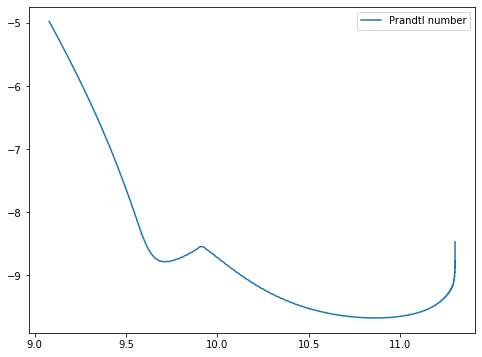

In [36]:
# Profile of Prandtl number
plt.figure(figsize=(8,6))
plt.plot(R, np.log10(nu_visc/xi_rad), label='Prandtl number')
#plt.plot(R, np.log10(xi_rad), label='xi_rad')

#plt.ylim(-0.1, 0.1)
plt.legend()

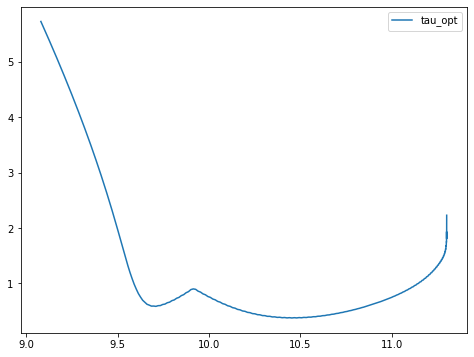

In [37]:
# Optical thickness to 'surface'
tau_opt= 10.**R * rho_gas['g'] *kappa_tot['g'] # Approximation to true integral of rho.dz

plt.figure(figsize=(8,6))
plt.plot(R, np.log10(tau_opt), label='tau_opt')
#plt.plot(R, np.log10(xi_rad), label='xi_rad')

#plt.ylim(-0.1, 0.1)
plt.legend()


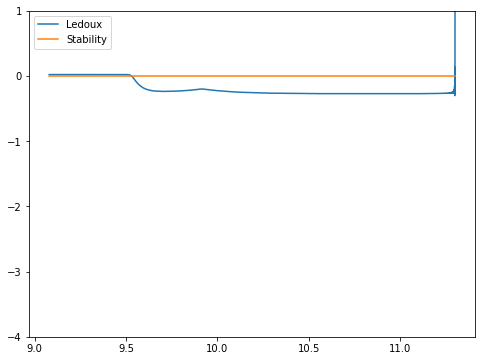

In [38]:
plt.figure(figsize=(8,6))
plt.plot(R, Grad['g'] - Grad_mu['g'] - grad_ad, label='Ledoux')
plt.plot(R, 0*R , label='Stability')
plt.ylim(-4, 1)
plt.legend()

# Oct 4 stuff

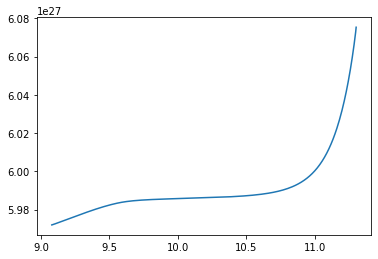

In [39]:
# This should be the mass 
plt.plot(R, Core_mass+Env)
plt.show()

In [40]:
Cs = cg.evaluate() # sound speed, which we previously used 
Cs.require_grid_space()
Cs = Cs['g']

Nth = np.sqrt((G*(Core_mass+Env)/(10**R)**2)**2/Cs**2*(grad_ad-Grad_rad['g'])) # I changed grad_rad to be positive now
d_finger= ((nu_visc*xi_rad)/Nth**2)**(1/4)
tau_cool = d_finger**2/xi_rad

Rgas = 8.32e7 / 2.3 # You gave me this value, but the wikipedia one in cgs doesnt have the /2.3 
Sigma = 5.7e-5
tau_cool_thin = Rgas/(16*kappa_tot['g']*Sigma*(np.exp(lgt)*T_0)**3)

Prandtl = nu_visc/xi_rad 

v_coll = d_finger/(np.sqrt(Prandtl)*tau_cool)

<ipython-input-40-66f5853697de>:5: RuntimeWarning: invalid value encountered in sqrt
  Nth = np.sqrt((G*(Core_mass+Env)/(10**R)**2)**2/Cs**2*(grad_ad-Grad_rad['g'])) # I changed grad_rad to be positive now


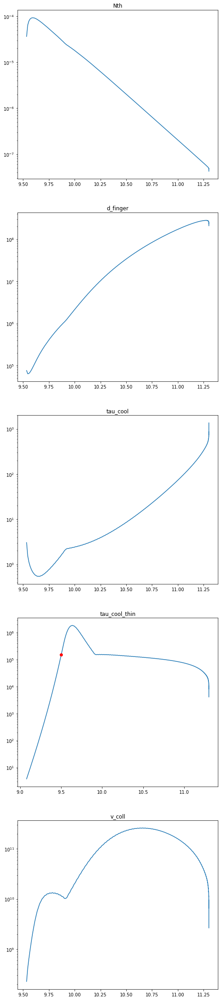

In [41]:
# red dot marks where grad transitions to grad_rad

plt.figure(figsize=(8,8*5))

plt.subplot(5,1,1)
plt.plot(R, Nth)
plt.plot(R[RCB], Nth[RCB], 'ro')
plt.yscale('log')
plt.title('Nth')

plt.subplot(5,1,2)
plt.plot(R,d_finger)
plt.plot(R[RCB], d_finger[RCB], 'ro')
plt.title('d_finger')
plt.yscale('log')

plt.subplot(5,1,3)
plt.plot(R,tau_cool)
plt.plot(R[RCB], tau_cool[RCB], 'ro')
plt.title('tau_cool')
plt.yscale('log')

plt.subplot(5,1,4)
plt.plot(R,tau_cool_thin)
plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.title('tau_cool_thin')
plt.yscale('log')

plt.subplot(5,1,5)
plt.plot(R,v_coll)
plt.plot(R[RCB], v_coll[RCB], 'ro')
plt.title('v_coll')
plt.yscale('log')

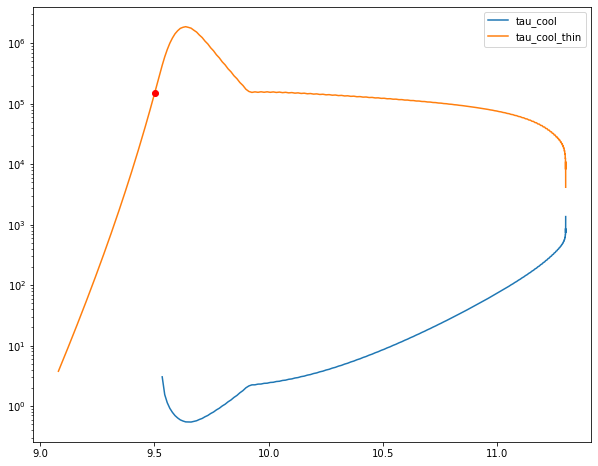

In [42]:
plt.figure(figsize=(10,8))
plt.plot(R,tau_cool, label='tau_cool')
plt.plot(R, tau_cool_thin, label='tau_cool_thin')
plt.plot(R[RCB], tau_cool[RCB], 'ro')
plt.plot(R[RCB], tau_cool_thin[RCB], 'ro')
plt.yscale('log')
plt.legend()
plt.show()

In [43]:
np.savetxt("NPressure_dep.txt", lgP_list[-1])
np.savetxt("NTemperature_dep.txt", lgT_list[-1])
np.savetxt("NZgr_dep.txt", lgZgr_list[-1])
np.savetxt("NM_dep.txt", lgM_list[-1])
np.savetxt("Nm_dep.txt",  m_list[-1])
np.savetxt("NL_dep.txt", L_list[-1])

In [44]:
prefix = '1_1_'

np.savetxt('saved/'+prefix+'Ngrad.txt', Grad['g'])
np.savetxt('saved/'+prefix+'Ngrad_rad.txt', Grad_rad['g'])
np.savetxt('saved/'+prefix+'NTstop.txt', np.log10(TStop['g']))
np.savetxt('saved/'+prefix+'NTgrow.txt', np.log10(TGrow['g']))
np.savetxt('saved/'+prefix+'NTsettl.txt', Tsettl) 
np.savetxt('saved/'+prefix+'NZgr.txt', np.exp(lgZgr['g'])) 
np.savetxt('saved/'+prefix+'Nkappa_gr.txt', kappa_gr['g']) 
np.savetxt('saved/'+prefix+'Nsize.txt', size['g'])
np.savetxt('saved/'+prefix+'Nrho_gas_cbrt.txt', (rho_gas['g'])**(1/3))
np.savetxt('saved/'+prefix+'NTemperature.txt', np.exp(lgt)*T_0)
np.savetxt('saved/'+prefix+'NPress.txt', np.exp(lgt)*T_0 *rho_gas['g'])
np.savetxt('saved/'+prefix+'Nrho_gas_norm.txt', (rho_gas['g']/rhodisk)**(1/3))
np.savetxt('saved/'+prefix+'NTemperature_norm.txt',np.exp(lgt)*T_0 / Tdisk)
np.savetxt('saved/'+prefix+'NEnv.txt', Env)
np.savetxt('saved/'+prefix+'Ngrad_mu.txt', Grad_mu['g'])
np.savetxt('saved/'+prefix+'Ngrad_ad.txt', grad_ad*np.ones(len(R)))
np.savetxt('saved/'+prefix+'Ngrad_diff.txt',  Grad_diff['g'])
np.savetxt('saved/'+prefix+'Nlog10(R_0).txt',  np.log10(R_0))
np.savetxt('saved/'+prefix+'Nlambda_mfp.txt',  np.log10(lambda_mfp))
np.savetxt('saved/'+prefix+'Nc_gas.txt',  np.log10(c_gas))
np.savetxt('saved/'+prefix+'Nnu_visc.txt',  np.log10(nu_visc))
np.savetxt('saved/'+prefix+'Nxi_rad.txt',  np.log10(xi_rad))
np.savetxt('saved/'+prefix+'Nkappa_tot.txt',  np.log10(kappa_tot['g']))
np.savetxt('saved/'+prefix+'NTfourth.txt',  np.log10((np.exp(lgt)*T_0)**4.))
np.savetxt('saved/'+prefix+'Nrho_gas.txt',  np.log10(rho_gas['g']))
np.savetxt('saved/'+prefix+'NPrandtl_number.txt',  np.log10(nu_visc/xi_rad))
np.savetxt('saved/'+prefix+'Ntau_opt.txt',  np.log10(tau_opt))
np.savetxt('saved/'+prefix+'NLedoux.txt',  Grad['g'] - Grad_mu['g'] - grad_ad)
d_finger
Nth
tau_cool
tau_cool_thin
np.savetxt('saved/'+prefix+'NR.txt', R)

<ipython-input-44-d0de884ecbab>:20: RuntimeWarning: invalid value encountered in log10
  np.savetxt('saved/'+prefix+'Nlog10(R_0).txt',  np.log10(R_0))


In [45]:
np.savetxt('saved/NR.txt', R)